In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
from sklearn import metrics,svm
import category_encoders as ce
from sklearn import tree
from sklearn.svm import SVC
from tqdm import tqdm
from sklearn.calibration import CalibratedClassifierCV
from sklearn.preprocessing import OrdinalEncoder,OneHotEncoder
import re
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier

from sklearn.svm import LinearSVC
from sklearn.model_selection import KFold,train_test_split,GridSearchCV,RandomizedSearchCV
import matplotlib.pyplot as plt
from prettytable import PrettyTable
from sklearn.naive_bayes import MultinomialNB,GaussianNB
from sklearn.ensemble import GradientBoostingClassifier,RandomForestClassifier,AdaBoostClassifier,StackingClassifier
import xgboost as xgb
import lightgbm as lgb
from catboost import CatBoostClassifier
#import plotly.express as px

random_state = 55
import warnings
import dtreeviz.trees
warnings.filterwarnings('ignore')
pd.set_option('display.max_columns', None)

# 1. Importing data and splitting into training and testing data

In [2]:
data = pd.read_csv('clean_data.csv')
data_temp = data.copy(deep=True)
data.drop('Unnamed: 0',inplace=True,axis=1)

data = data.replace(to_replace  = r'<',value = '_lessthan_',regex = True) # for xgboost since we have '<' in the data and it doesn't supports that
Y = data.Y.values
data.drop('Y',inplace = True,axis = 1)
X = data
#splitting into training and testing data
x_train,x_test,y_train,y_test = train_test_split(data,Y,test_size=0.25,stratify=Y)
print('Shape of training data is ',x_train.shape,"\nShape of testing data is ",x_test.shape)

x_train.reset_index(inplace=True,drop=True)
x_test.reset_index(inplace=True,drop=True)

Shape of training data is  (9457, 23) 
Shape of testing data is  (3153, 23)


# 2. Defining various functions for encoding techniques,plotting,creating different sets for training and testing etc.

### 2.1 __ENCODING FUNCTIONS__

2.1.1 One Hot Encoding

In [11]:
def onehot_encoder(x_train,x_test,nominal_features):
    for col in nominal_features:
        encoder = OneHotEncoder(handle_unknown='ignore')
        encoded = encoder.fit_transform(x_train[col].values.reshape(-1,1)).toarray()
        temp_df = pd.DataFrame(data =encoded,columns= encoder.get_feature_names_out([col]))
        #train
        x_train.drop(columns=col,axis = 1,inplace = True)
        x_train = pd.concat([x_train, temp_df], axis=1, join='inner')
        #test
        encoded_test = encoder.transform(x_test[col].values.reshape(-1,1)).toarray()
        temp_testdf = pd.DataFrame(data = encoded_test,columns=encoder.get_feature_names_out([col]))
        x_test.drop(columns=col,axis = 1,inplace = True)
        x_test = pd.concat([x_test, temp_testdf], axis=1, join='inner')
    return x_train,x_test

2.1.2 Ordinal Encoding

In [12]:
def ordinal_encoding(trainset,testset,column,ordinal_dict):
    for col in column:
        #print(col,'-----',cat_order)
        cat_order = ordinal_dict[col]
        encoder = OrdinalEncoder(categories=[cat_order],handle_unknown='use_encoded_value', unknown_value=-1)
        #print('DOING TRAIN')
        trainset[col] = encoder.fit_transform(trainset[col].values.reshape(-1,1))
        #trainset.drop(columns=col,axis = 1,inplace = True)
        #print('Doing TEST')
        testset[col] = encoder.transform(testset[col].values.reshape(-1,1))
        #testset.drop(columns=col,axis = 1,inplace = True)
        
    return trainset,testset

2.1.3 Hashing Encoding

In [13]:
def HasingEncoding(x_train,x_test,features,n_components): #slower
    """The collisions do not significantly affect performance unless there is a great deal of overlap
    # HashingEncoder for nominal and ordinal data if you have high cardinality features
    #The n_components parameter controls the number of expanded columns. The default is eight columns. 
    #In our example column with three values the default results in five columns full of 0s
    #It’s worth trying HashingEncoder for nominal and ordinal data if you have high cardinality features."""
    
    #unknown = x_train[feature].value_counts().index[0]  #filling by the most freq value
    for feature,component in zip(features,n_components):
        if x_train[feature].nunique()>3:
        
            #if feature  =='occupation':
             #   n_component = 7
            #elif feature =='income':
             #   n_component = 3
            #elif feature == 'age':
             #   n_component = 2
            #elif feature == 'education':
             #   n_component = 2
            #else :
                #n_component= x_train[feature].nunique()-2
            missing = x_train[feature].value_counts().index[0]
            encoder = ce.HashingEncoder(cols=[feature],n_components=component)

            x_train = encoder.fit_transform(x_train)
            x_test = encoder.transform(x_test)

            #since bering named as col_0,col_1 for every feature so add the og feature as predfix
            #everytime its nmaeing them as the front most features

            for col in x_train.columns[:component]:
                x_train.rename(columns = {col:feature+'_'+col}, inplace = True)
                x_test.rename(columns = {col:feature+'_'+col}, inplace = True)
        else:
            raise Exception("Feature must have more than 3 categories . Feature in question ->",feature )
    
    return x_train,x_test

2.1.4 Binary Encoding

In [14]:
def BinaryEncoding(x_train,x_test,features): #ORDINAL
    """Binary encoding can be thought of as a hybrid of one-hot and hashing encoders. 
    Binary creates fewer features than one-hot, while preserving some uniqueness of values in the column. 
    It can work well with higher dimensionality ordinal data.
    Just one-hot encode a column if it only has a few values.
    In contrast, binary really shines when the cardinality of the column is higher
    It is more memory efficient. It also reduces the chances of dimensionality problems with higher cardinality."""
    
    for feature in features:
        unknown = x_train[feature].value_counts().index[0]  #filling by the most freq value
        missing = x_train[feature].value_counts().index[0]
        encoder = ce.BinaryEncoder(cols=[feature],handle_unknown=unknown,handle_missing=missing)

        x_train = encoder.fit_transform(x_train)
        x_test = encoder.transform(x_test)
    
    return x_train,x_test

2.1.5 Mean Encoding

In [15]:
#ref https://www.kaggle.com/code/anuragbantu/target-encoding-beginner-s-guide
def kfold_mean_encoding(folds,x_train,x_test,traget_variable,columns):
    '''Does K fold target mean encoding'''
    for column in columns:
        global_mean = traget_variable.mean()
        k_fold_col = column+'_kfold'
        x_train[k_fold_col]  = np.nan
        x_train['Y'] = traget_variable

        kfold = KFold(n_splits=folds)
        for tr_idx,val_idx in kfold.split(x_train):
            tr = x_train.iloc[tr_idx]  
            val = x_train.iloc[val_idx] 

            x_train.loc[val.index,k_fold_col]=val[column].map(x_train.groupby(column).Y.mean())

       
        x_train[k_fold_col].fillna(global_mean,inplace=True)

        #test
        mean = x_train[[column,k_fold_col]].groupby(column).mean().reset_index() 
        dd={}
        for index,row in mean.iterrows():
            dd[row[column]] = row[k_fold_col]      
        x_test[k_fold_col] = x_test[column].map(dd)        
        x_test[k_fold_col].fillna(global_mean,inplace = True)


        x_train.drop(columns=['Y',column],axis = 1,inplace = True)
        x_test.drop(columns=[column],axis = 1,inplace = True)
    return x_train,x_test

 2.1.6 Defining Nominal and  Ordinal features lists and order of encoding for the latter

In [126]:
ordinal_features = ['age','time','expiration','income','temperature','education','Bar','CoffeeHouse', 'CarryAway','RestaurantLessThan20',\
                   'Restaurant20To50']
nominal_features = ['destination','passanger','weather','coupon','gender','maritalStatus','occupation']
                    
already_done = ['driving_time','has_children','direction_opp','driving_time']
#mapping_need = ['time','expiration','']

#ordinal orders for age,income,temperature,expiry, frequency,education level
age_order = ['below21','21', '26', '31', '36', '41','46', '50plus']
income_order =  ['Less than $12500', '$12500 - $24999', '$25000 - $37499'
      ,'$37500 - $49999', '$50000 - $62499', '$62500 - $74999',
      '$75000 - $87499' , '$87500 - $99999', '$100000 or More']

temp_order = [30,55,80]
time_order = [ '7AM', '10AM', '2PM','6PM', '10PM']
expiry_order = ['2h', '1d']

frequency_order = [ 'never','less1','1~3', '4~8', 'gt8' ]

education_order = ['Some High School', 'High School Graduate', 
             'Some college - no degree', 'Associates degree', 
             'Bachelors degree', 
             'Graduate degree (Masters or Doctorate)']

ordinal_order = [age_order,time_order,expiry_order,income_order,temp_order,education_order,frequency_order,frequency_order,\
                 frequency_order,frequency_order,frequency_order]

ordinal_order_dict = {'age':age_order,'time':time_order,'expiration':expiry_order,'income':income_order,'temperature':temp_order,\
                      'education':education_order,'Bar':frequency_order,'CoffeeHouse':frequency_order,\
                 'CarryAway':frequency_order,'RestaurantLessThan20':frequency_order,'Restaurant20To50':frequency_order}

## 2.2 5 Set functions for creating 5 different combinations of encoding techniques

In [16]:
def SET1(x_train,x_test,y_train,y_test,ordinal_order_dict,ordinal_features,nominal_features):
    set1_x_train,set1_x_test = x_train.copy(deep = True),x_test.copy(deep = True) 
    """Ordinal and OneHot Encoding"""
    #ordinal encoding
    set1_x_train,set1_x_test = ordinal_encoding(set1_x_train,set1_x_test,ordinal_features,ordinal_order_dict)
    #nominal encoding
    set1_x_train,set1_x_test = onehot_encoder(set1_x_train,set1_x_test,nominal_features)
    
    return set1_x_train,set1_x_test

def Set2(x_train,y_train,x_test,ohe_features,ordinal_features,ordinal_order_dict,binary_features,kfold_features,folds):
    # so that changes made here wont affect the origial
    set2_x_train,set2_x_test = x_train.copy(deep = True),x_test.copy(deep = True) 
    
    set2_x_train,set2_x_test = onehot_encoder(set2_x_train,set2_x_test,ohe_features)
    #ordinal
    set2_x_train,set2_x_test = ordinal_encoding(set2_x_train,set2_x_test,ordinal_features,ordinal_order_dict )
    #binary
    set2_x_train,set2_x_test = BinaryEncoding(set2_x_train,set2_x_test,binary_features)
    #kfold
    target_variable = y_train
    set2_x_train,set2_x_test = kfold_mean_encoding(folds, set2_x_train, set2_x_test, target_variable, kfold_features)
    return set2_x_train,set2_x_test
    

def Set3(x_train,x_test,y_train,hashing_features,n_components,binary_features,kfold_features,folds):
    # so that changes made here wont affect the origial
    set3_x_train,set3_x_test = x_train.copy(deep = True),x_test.copy(deep = True) 
    
    #==================================== ENCODING ==========================================
    #hashing
    set3_x_train,set3_x_test = HasingEncoding(set3_x_train,set3_x_test,hashing_features,n_components)
    
    #binary
    set3_x_train,set3_x_test = BinaryEncoding(set3_x_train,set3_x_test,binary_features)
    #kfold
    target_variable = y_train
    set3_x_train,set3_x_test = kfold_mean_encoding(folds,set3_x_train,set3_x_test, target_variable, kfold_features)
    return set3_x_train,set3_x_test
#s4
def Set4(x_train,x_test,y_train,ohe_features,ordinal_features,ordinal_order_dict,kfold_features,folds):
    # so that changes made here wont affect the origial
    set4_x_train,set4_x_test = x_train.copy(deep = True),x_test.copy(deep = True) 
    
    #ohe
    set4_x_train,set4_x_test = onehot_encoder(set4_x_train,set4_x_test,ohe_features)
    #ordinal
    set4_x_train,set4_x_test = ordinal_encoding(set4_x_train,set4_x_test,ordinal_features,ordinal_order_dict )
    #kfold
    target_variable = y_train
    set4_x_train,set4_x_test = kfold_mean_encoding(folds,set4_x_train,set4_x_test, target_variable, kfold_features)
    return set4_x_train,set4_x_test

def Set5(x_train,x_test,y_train,kfold_features,folds):
    """ALL K-FOLD MEAN TARGET ENCODING"""
    # so that changes made here wont affect the origial
    set5_x_train,set5_x_test = x_train.copy(deep = True),x_test.copy(deep = True) 
    
    #kfold
    target_variable = y_train
    set5_x_train,set5_x_test = kfold_mean_encoding(folds,set5_x_train,set5_x_test, target_variable, kfold_features)
    
    return set5_x_train,set5_x_test

def Set6(x_train,x_test,y_train,nominal_features):
    set6_x_train,set6_x_test = x_train.copy(deep = True),x_test.copy(deep = True) 
    """OneHot Encoding"""
    #nominal encoding
    set6_x_train,set6_x_test = onehot_encoder(set6_x_train,set6_x_test,nominal_features)
    
    return set6_x_train,set6_x_test

# To return all of the 5 different datasets at once
def allsets(x_train,x_test,y_train,y_test,ordinal_order_dict,set1_ordinal_features,set1_nominal_features,set2_ohe_features,set2_ordinal_features,\
                                set2_binary_features,set2_kfold_features,set2_folds,set3_hashing_features,set3_n_components,set3_binary_features,\
                                set3_kfold_features,set3_folds,set4_ohe_features,set4_ordinal_features,\
                                set4_kfold_features,set4_folds,set5_kfold_features,set5_folds):
    '''Returns all 5  datasets for training and testing'''
    
    
    set1_x_train,set1_x_test = SET1(x_train,x_test,y_train,y_test,ordinal_order_dict,set1_ordinal_features,set1_nominal_features)
    print('dimensonality of SET1 after encoding ',set1_x_train.shape[1])
    
    set2_x_train,set2_x_test = Set2(x_train,y_train,x_test,set2_ohe_features,set2_ordinal_features,ordinal_order_dict,\
                                set2_binary_features,set2_kfold_features,set2_folds)
    print('dimensonality of SET2 after encoding ',set2_x_train.shape[1])
    
    set3_x_train,set3_x_test = Set3(x_train,x_test,y_train,set3_hashing_features,set3_n_components,set3_binary_features,\
                                set3_kfold_features,set3_folds)
    print('dimensonality of SET3 after encoding ',set3_x_train.shape[1])
    
    set4_x_train,set4_x_test = Set4(x_train,x_test,y_train,set4_ohe_features,set4_ordinal_features,ordinal_order_dict,\
                                set4_kfold_features,set4_folds)
    print('dimensonality of SET4 after encoding ',set4_x_train.shape[1])
    
    set5_x_train,set5_x_test = Set5(x_train,x_test,y_train,set5_kfold_features,set5_folds)
    print('dimensonality of SET5 after encoding ',set5_x_train.shape[1])
    
    return set1_x_train,set1_x_test,set2_x_train,set2_x_test,set3_x_train,set3_x_test,set4_x_train,set4_x_test,set5_x_train,set5_x_test
    

Creating combinations of encodings

In [17]:
#Set1
set1_ordinal_features = ['age','time','expiration','income','temperature','education','Bar','CoffeeHouse', 'CarryAway','RestaurantLessThan20',\
                   'Restaurant20To50']
set1_nominal_features = ['destination','passanger','weather','coupon','gender','maritalStatus','occupation']


#SET 2
set2_folds = 6
set2_ohe_features = ['gender','destination','weather']
set2_ordinal_features = ['expiration','temperature','time']
set2_binary_features = ['passanger','CarryAway','CoffeeHouse','RestaurantLessThan20','Restaurant20To50','Bar']
set2_kfold_features = ['income','occupation','age','education','coupon','maritalStatus']    


# Set 3
set3_folds = 6
set3_hashing_features = ['occupation','income','education','maritalStatus']
set3_n_components = [15,6,3,3]
set3_binary_features = ['destination','weather','gender','expiration']
set3_kfold_features = ['time','temperature','coupon','passanger','CarryAway','CoffeeHouse','RestaurantLessThan20','Restaurant20To50',\
                  'Bar','age']

#s4 
set4_folds = 6
set4_kfold_features = ['education', 'occupation','age','income']
set4_ohe_features = ['destination', 'passanger', 'weather', 'temperature', 'time', 'coupon',\
                    'expiration', 'maritalStatus','gender']
set4_ordinal_features = ['CarryAway','CoffeeHouse','RestaurantLessThan20','Restaurant20To50','Bar']

# set 5
set5_folds = 6
set5_kfold_features = ['education', 'occupation','age','income','destination', 'passanger', 'weather', 'temperature',\
                      'time', 'coupon','expiration', 'maritalStatus','gender','CarryAway','CoffeeHouse',\
                      'RestaurantLessThan20','Restaurant20To50','Bar']

In [18]:
# calling the all set function
set1_x_train,set1_x_test,set2_x_train,set2_x_test,set3_x_train,set3_x_test,\
set4_x_train,set4_x_test,set5_x_train,set5_x_test =  allsets(x_train,x_test,y_train,y_test,ordinal_order_dict,set1_ordinal_features,set1_nominal_features,set2_ohe_features,set2_ordinal_features,\
                                set2_binary_features,set2_kfold_features,set2_folds,set3_hashing_features,set3_n_components,set3_binary_features,\
                                set3_kfold_features,set3_folds,set4_ohe_features,set4_ordinal_features,\
                                set4_kfold_features,set4_folds,set5_kfold_features,set5_folds)


set_dim_list = [61,38,50,44,21]

x_vals = np.arange(len(set_dim_list))
plt.plot(x_vals, set_dim_list, 'o-', label='Random Integers')
plt.xticks(ticks=x_vals,labels=['set1','set2','set3','set4','set5'])
# Add x and y-axis labels
plt.xlabel('SETS')
plt.ylabel('DIMENSIONALITY')

i=1
for x, y in zip(x_vals, set_dim_list):
    plt.text(x, y, 'set_'+str(i)+'--'+str(y)+' features', ha='center', va='bottom')
    i+=1
plt.legend()

plt.show()


## 2.3 Various Plotting functions

Plots Confusion Matrix ,Precision Matrix and Recall Matrix

In [ ]:
def plot_cstm_matrix(model,pred,y,title):
    '''Returns confusion matrix, precision matrix and recall matrix '''
    print('\n')
    print('---',  title   ,'---')
    #pred = model.predict(x)
    cm = metrics.confusion_matrix(y,pred)
    
    #recall ----> rows sum  =1 actually wale kitne pred kiye shi
    re_cm = (cm.T/cm.sum(axis = 1)).T
    
    #precison -----> col sum = 1, jo pred kiye unme se asli kitne thai
    pre_cm = (cm/cm.sum(axis = 0))
    
    
    fig,ax = plt.subplots(1,3 ,figsize=(20,6))
    x_ticks = [0,1]
    cmap=sns.light_palette("green")
   
    plt.subplot(1,3,1)
    sns.heatmap(data = cm,annot=True, cmap=cmap,xticklabels=x_ticks, fmt=".3f")
    plt.title('Confusion Matrix')
    plt.xlabel('Predicted Class')
    plt.ylabel('Original Class')
    
    plt.subplot(1,3,2)
    sns.heatmap(data = re_cm,annot=True, cmap=cmap,xticklabels=x_ticks, fmt=".3f")
    plt.title('Recall Matrix Matrix')
    plt.xlabel('Predicted Class')
    plt.ylabel('Original Class')
    
    plt.subplot(1,3,3)
    sns.heatmap(data = pre_cm,annot=True, cmap=cmap,xticklabels=x_ticks,fmt='.3f')
    plt.xlabel('Predicted Class')
    plt.ylabel('Original Class')
    plt.title('Precision  Matrix')
    
    plt.show()

Plots Train AUC and Test AUC and returns there values also

In [ ]:
def pred_auc_roc(model,x_train,x_test,y_train,y_test,title,return_plot = True):
    '''Return train abd test auc by using predict proba'''
    
    y_train_pred = model.predict_proba(x_train)[:,1]  
    y_test_pred = model.predict_proba(x_test)[:,1]
    
    train_fpr, train_tpr, tr_thresholds = metrics.roc_curve(y_train, y_train_pred)
    test_fpr, test_tpr, te_thresholds = metrics.roc_curve(y_test, y_test_pred)
    
    train_auc = np.round(metrics.auc(train_fpr, train_tpr),3)
    test_auc  = np.round(metrics.auc(test_fpr, test_tpr),3)
    if return_plot:
        
        plt.plot(train_fpr, train_tpr, label="Train AUC = {:.5}".format(train_auc))
        plt.plot(test_fpr, test_tpr, label="Test AUC = {:.5}".format(test_auc))
        plt.legend()
        plt.xlabel("FALSE POSITIVE RATE (FPR)")
        plt.ylabel("TRUE POSITIVE RATE (TPR)")
        plt.title(title)
        plt.grid()
        plt.show()
    
    return train_auc,test_auc

Returns performance metrics like f1score,precision,recall and log loss

In [ ]:
def performance_matrices(real,pred):
    '''returns performance matrices line f1score,precison and recall and log loss'''
    f1score = metrics.f1_score(real,pred)
    precison = metrics.precision_score(real,pred)
    recall = metrics.recall_score(real,pred)
    log_loss = metrics.log_loss(real,pred)
    return np.round(f1score,4),np.round(precison,4),np.round(recall,4),np.round(log_loss,4)

Plots top n important features 

In [ ]:
#feature importance
def feature_importance(features,model,top_features,algorithm = "None"):
    '''Plots top n features in decreasing order of importance'''
    print('\n')
    tree_based_algo = ['decisontree','randomforest','gbdt',"xgboost",'lightgbm','adaboost','catboost']
    if algorithm in tree_based_algo:
        importance = model.feature_importances_
    elif algorithm=='naivebayes':
        importance = model.feature_log_prob_[0]
    
    else:
        importance = model.coef_[0] #log reg
        
    indices = np.argsort(importance)[::-1]
    series = pd.Series(data = importance,index=features)
    plt.title('Most important features for making predictions')
    series.nlargest(top_features).plot(kind = 'bar')
    plt.grid()
    plt.show()
    return top_features

Function calling all of the above functions

In [ ]:
def plots_metrices_featureimportance(model,x_train,x_test,y_train,y_test,pred_train,pred_test,title,important_features=True,\
                                     top_features = 15):
    #confusionmatrix
    train_matrix = plot_cstm_matrix(model,pred_train,y_train,'Train CM of  '+title) #predicts inside
    test_matrix = plot_cstm_matrix(model,pred_test,y_test,'Test CM of '+title)
    
    #perfo matrice
    train_f1score,train_precison,train_recall,train_log_loss = performance_matrices(y_train,pred_train)
    test_f1score,test_precison,test_recall,test_log_loss = performance_matrices(y_test,pred_test)
    #roc auc curve
    train_auc,test_auc = pred_auc_roc(model,x_train,x_test,y_train,y_test,'AUC ROC PLOT '+title)
    #feature importance
    if important_features:
        features = x_train.columns
        top_features = feature_importance(features,model,top_features,title)
        
    print('Train Auc Score---> ',train_auc)
    print('Test Auc Scoer ---> ',test_auc)
    #train
    print('Train f1score is {} , precison is {} and recall is {} and log_loss is {}'\
          .format(train_f1score,train_precison,train_recall,train_log_loss))
    print('Test f1score is {} , precison is {} and recall is {} and loh loss is {}'.\
          format(test_f1score,test_precison,test_recall,test_log_loss))
    
    return train_f1score,train_precison,train_recall,train_log_loss,test_f1score,test_precison,test_recall,test_log_loss,\
train_auc,test_auc

Plots line plots for any metrics values on all of the sets

In [ ]:
def plots(train_scores,test_scores,metric,x_axis = [0,1,2,3,4],set_names =['set1','set2','set3','set4','set5',]  ):
    '''plots a line plot for a given set and a metric'''
    plt.title(metric +' plots of all encoding sets')
    plt.plot(x_axis,train_scores,marker = '2',mec = 'r', ms = 5,label = 'train '+metric)
    for x, y in zip(x_axis, train_scores):
        plt.annotate(str(y)+'_'+set_names[x], (x,y))
    
    plt.plot(x_axis,test_scores,marker = '2',mec = 'r', ms = 5,label = 'test '+metric)
    for x, y in zip(x_axis, test_scores):
        plt.annotate(str(y)+'_'+set_names[x], (x,y))
    plt.legend()
    plt.grid()
    plt.show()
    
    
#def plot_trees(clf,dataset,y,algorithm,set_name):
 #   fn = dataset.columns
  #  cn = ['0','1']
   # fig = plt.figure(figsize=(25,20))
    #_ = tree.plot_tree(clf,
     #                  feature_names=fn,
      #                 class_names=cn,
       #                filled=True)

## 2.4 Function for calculating an algorithms performance on all different sets of data

In [20]:
set_dict = {'Set1':[set1_x_train,set1_x_test],'Set2':[set2_x_train,set2_x_test],'Set3':[set3_x_train,set3_x_test],\
           'Set4':[set4_x_train,set4_x_test],'Set5':[set5_x_train,set5_x_test]}

def set_performance(set_dict,y_train,y_test,algorithm,feature_importance=True,**kwarg):
    
    set_train_f1score,set_train_precison,set_train_recall,set_train_log_loss,set_test_f1score,set_test_precison,\
    set_test_recall,set_test_log_loss,set_train_auc,set_test_auc = [],[],[],[],[],[],[],[],[],[]
    
    print('          ====================              ',algorithm,'           ====================             ')
    for set_name,train_test_set in tqdm(zip(set_dict.keys(),set_dict.values())):
        print('                 ------------------->  ',set_name,'  <-------------------               ') 
        #print(set_name,len(train_test_set[0]),len(train_test_set[1]))
        if algorithm == 'logesticregression':
            
            clf = LogisticRegression()
            clf.fit(train_test_set[0],y_train)
        elif algorithm == 'knn':
            clf = KNeighborsClassifier()  #with default values
            clf.fit(train_test_set[0],y_train)
           
        elif algorithm == 'linearsvc':
            clf = LinearSVC(dual=False,random_state=55)  #with default values
            #needs to be calibrated
            clf = calibrate_model(clf,train_test_set[0],y_train)
            clf.fit(train_test_set[0],y_train) 
    
        elif algorithm == 'rbf-svm':
            clf = SVC(kernel='rbf',random_state=55)
            clf = calibrate_model(clf,train_test_set[0],y_train) #for predict proba, vut they dont really req calibration
            clf.fit(train_test_set[0],y_train)
            
        elif algorithm =='naivebayes':
            clf = MultinomialNB()
            clf.fit(train_test_set[0],y_train)
            
        elif algorithm =='decisontree':
            clf = DecisionTreeClassifier(random_state=55)
            clf.fit(train_test_set[0],y_train)
            #plot_trees(clf,train_test_set[0],y_train,algorithm,set_name,)
            
        elif algorithm =='randomforest':
            clf = RandomForestClassifier(random_state=55)
            clf.fit(train_test_set[0],y_train)
            
        elif algorithm == 'gbdt':
            clf = GradientBoostingClassifier(random_state=55)
            clf.fit(train_test_set[0],y_train)
        
        elif algorithm=='lightgbm':
            clf = lgb.LGBMClassifier(random_state=55)
            clf.fit(train_test_set[0],y_train)
            
        elif algorithm =='xgboost':
            clf = xgb.XGBClassifier(random_state=55)
            clf.fit(train_test_set[0],y_train)
            
        elif algorithm =='adaboost':
            clf = AdaBoostClassifier(base_learner,random_state = 55)
            clf.fit(train_test_set[0],y_train)
        
        #predicting    
        train_pred = clf.predict(train_test_set[0])
        test_pred = clf.predict(train_test_set[1])
        #calculating scores
        train_f1score,train_precison,train_recall,train_log_loss,test_f1score,test_precison,test_recall,test_log_loss,\
        train_auc,test_auc =\
                        plots_metrices_featureimportance(clf,train_test_set[0],train_test_set[1],y_train,\
                    y_test,train_pred,test_pred,title = algorithm,important_features=feature_importance,top_features = 15)
        print('\n')
        set_train_f1score.append(train_f1score)
        set_test_f1score.append(test_f1score)
        set_train_precison.append(train_precison)
        set_test_precison.append(test_precison)
        set_train_recall.append(train_recall)
        set_test_recall.append(test_recall)
        set_train_log_loss.append(train_log_loss)
        set_test_log_loss.append(test_log_loss)
        set_train_auc.append(train_auc)
        set_test_auc.append(test_auc)
    return set_train_f1score,set_train_precison,set_train_recall,set_train_log_loss,set_test_f1score,set_test_precison,\
    set_test_recall,set_test_log_loss ,set_train_auc,set_test_auc

## 2.5 Function for calibrating models

In [23]:
def calibrate_model(model,x_train,y_train):
    'Calibrates the model after fitting on the provided dataset'
    model = model.fit(x_train,y_train)
    model = CalibratedClassifierCV(model,cv = 3,n_jobs=-1)
    return model

## 2.6 Function for hyperparameter tuning  models using Randomsearchcv

In [24]:
def hyperparametertuning(Classifier,parameter_grid,x,y,scoring = 'f1'):

    rs_Classifier= RandomizedSearchCV(estimator = Classifier, param_distributions = parameter_grid, n_iter = 100, cv = 3, \
                                       verbose=1,random_state=55, n_jobs = -1,return_train_score=True,scoring=scoring).fit(x,y)
    #rs_clf = GridSearchCV(clf, paramerter, verbose = 1, cv=3, n_jobs = -1,scoring = 'f1')
    #rs_clf.fit(x,y)
    print('Best parameters are ',rs_Classifier.best_params_)
    print('Best estimators are ',rs_Classifier.best_estimator_)
    #print('Best score  is ',rs_Classifier.best_score_)
    return rs_Classifier, rs_Classifier.best_params_,rs_Classifier.best_estimator_,rs_Classifier.best_score_

## 2.7 Function returning models performance on each set in table form with every evaluation metric

In [145]:
def table(title,feature_set,train_auc,test_auc,train_f1score,test_f1score,train_precison,test_precison,train_recall,test_recall ,\
          train_log_loss,test_log_loss,\
           hyp_tr_auc,hyp_te_auc,hyp_tr_f1score,hyp_te_f1score,hyp_tr_precison,hyp_te_precison,hyp_tr_recall,hyp_te_recall,\
          hyp_tr_log_loss,hyp_te_log_loss):
    table = PrettyTable(['Set','OHE encoded features','Ordinal  encoded features','K-Fold Target  encoded features',\
                     'Binary  encoded features','Hashing encoded features','Train AUC','Test AUC','Train f1 Score','Test f1 Score',\
                     'Train Precision','Test Precision','Train recall','Test recall','Train log loss','Test log loss'],)
    table.title = title

    table.add_row(['Set 1',set1_nominal_features,set1_ordinal_features,'None','None','None',train_auc[0],test_auc[0],\
                   train_f1score[0],test_f1score[0],\
            train_precison[0],test_precison[0],train_recall[0],test_recall[0],train_log_loss[0],test_log_loss[0]])

    table.add_row(['Set 2',set2_ohe_features,set2_ordinal_features,set2_kfold_features,set2_binary_features,"None",\
                   train_auc[1],test_auc[1],train_f1score[1],test_f1score[1],\
            train_precison[1],test_precison[1],train_recall[1],test_recall[1],train_log_loss[1],test_log_loss[1]])

    table.add_row([  'SET 3','None','None' ,set3_kfold_features ,set3_binary_features ,set3_hashing_features, train_auc[2],\
                   test_auc[2],train_f1score[2],test_f1score[2],\
            train_precison[2],test_precison[2],train_recall[2],test_recall[2],train_log_loss[2],test_log_loss[2]])

    table.add_row(['SET 4',set4_ohe_features,set4_ordinal_features,set4_kfold_features ,'None','None',train_auc[3],test_auc[3],\
                   train_f1score[3],test_f1score[3],\
            train_precison[3],test_precison[3],train_recall[3],test_recall[3],train_log_loss[3],test_log_loss[3]])

    table.add_row(['SET 5','None','None',set5_kfold_features,'None','None',train_auc[4],test_auc[4],train_f1score[4],\
                   test_f1score[4],\
            train_precison[4],test_precison[4],train_recall[4],test_recall[4],train_log_loss[4],test_log_loss[4]])

    #table.add_row([ 'Hyperparameret Tuned On SET 3','None','None' ,set3_kfold_features ,set3_binary_features ,set3_hashing_features,\
     #              hyp_logreg_tr__auc,hyp_logreg_te_auc,hyp_logreg_tr_f1score,hyp_logreg_te_f1score,\
      #             hyp_logreg_tr_precison,hyp_logreg_te_precison,hyp_logreg_tr_log_loss,hyp_logreg_te_log_loss])

    table.add_row(['Hyperparamere Tuned On'+feature_set,feature_set,feature_set,feature_set,feature_set,feature_set,\
                   hyp_tr_auc,hyp_te_auc,hyp_tr_f1score,hyp_te_f1score,hyp_tr_precison,hyp_te_precison,hyp_tr_recall,hyp_te_recall,hyp_tr_log_loss,\
                   hyp_te_log_loss])

    table = pd.read_html(table.get_html_string())[0]
    return table


# 3 ***APPLYING MODELS ON SETS***


## 3.1 Baseline Model (Logestic Regression)

          ====================               logesticregression            ====================             


0it [00:00, ?it/s]

                 ------------------->   Set1   <-------------------               


--- Train CM of  logesticregression ---


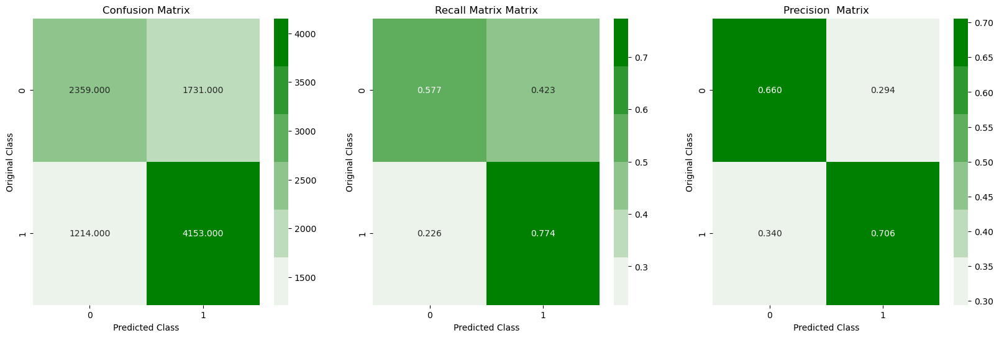



--- Test CM of logesticregression ---


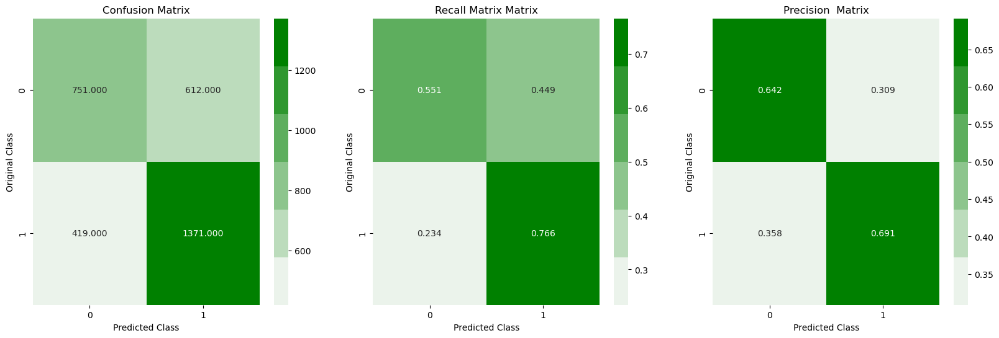

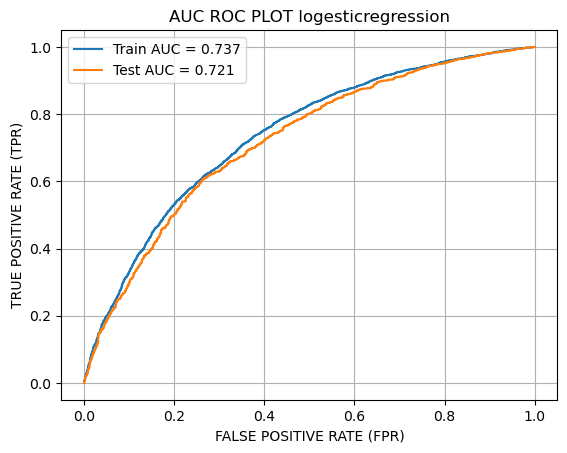

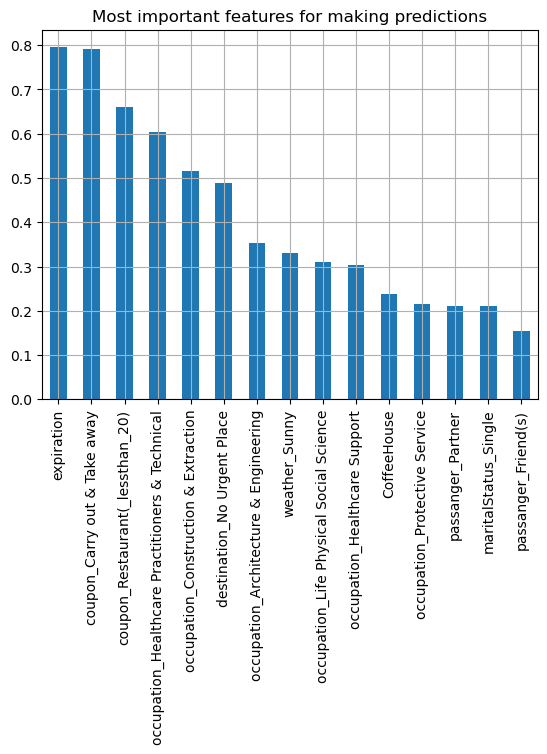

1it [00:01,  1.66s/it]

Train Auc Score--->  0.737
Test Auc Scoer --->  0.721
Train f1score is 0.7382 , precison is 0.7058 and recall is 0.7738 and log_loss is 10.7559
Test f1score is 0.7267 , precison is 0.6914 and recall is 0.7659 and loh loss is 11.294


                 ------------------->   Set2   <-------------------               


--- Train CM of  logesticregression ---


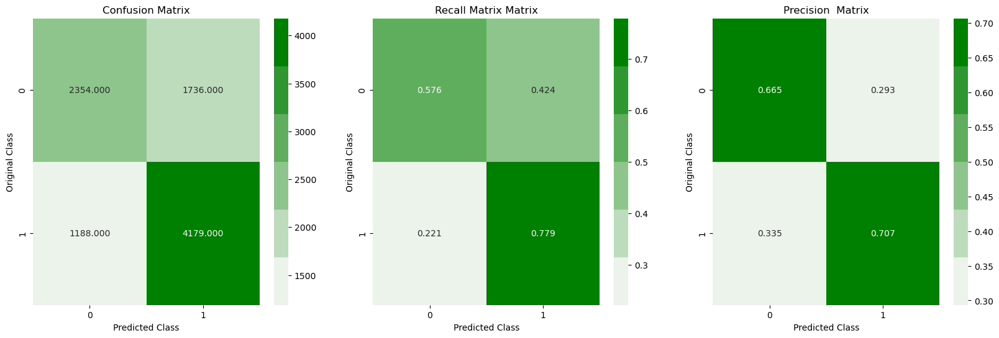



--- Test CM of logesticregression ---


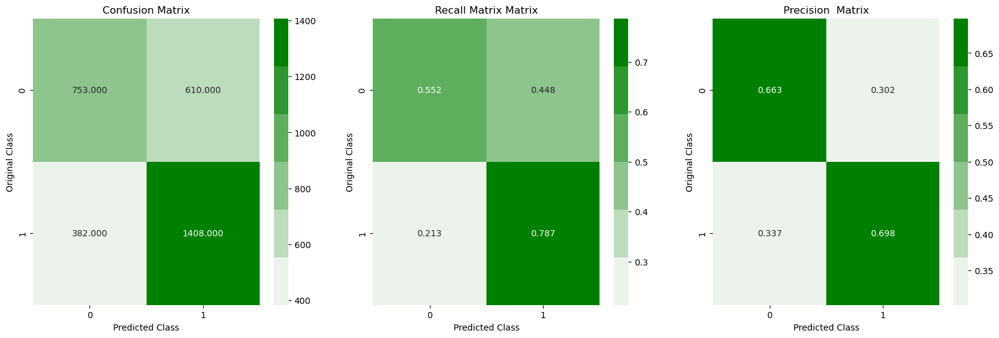

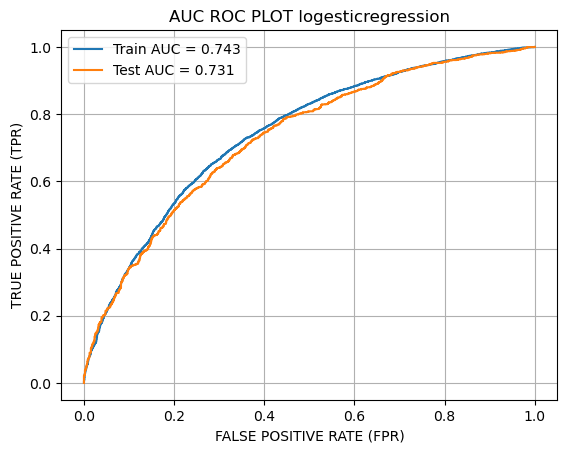

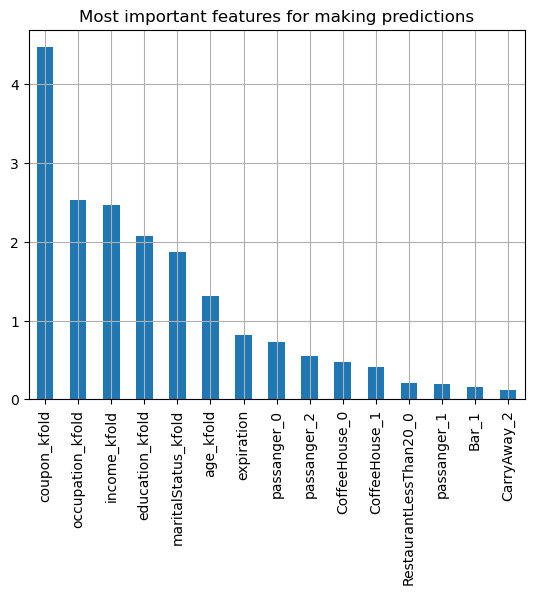

2it [00:03,  1.63s/it]

Train Auc Score--->  0.743
Test Auc Scoer --->  0.731
Train f1score is 0.7408 , precison is 0.7065 and recall is 0.7786 and log_loss is 10.6792
Test f1score is 0.7395 , precison is 0.6977 and recall is 0.7866 and loh loss is 10.8668


                 ------------------->   Set3   <-------------------               


--- Train CM of  logesticregression ---


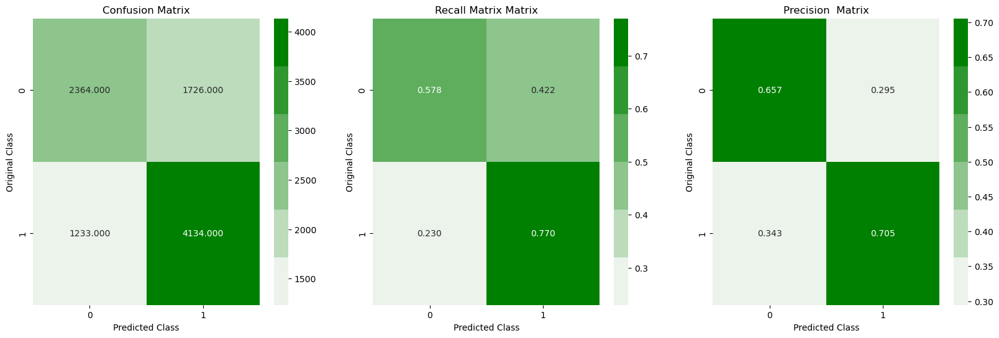



--- Test CM of logesticregression ---


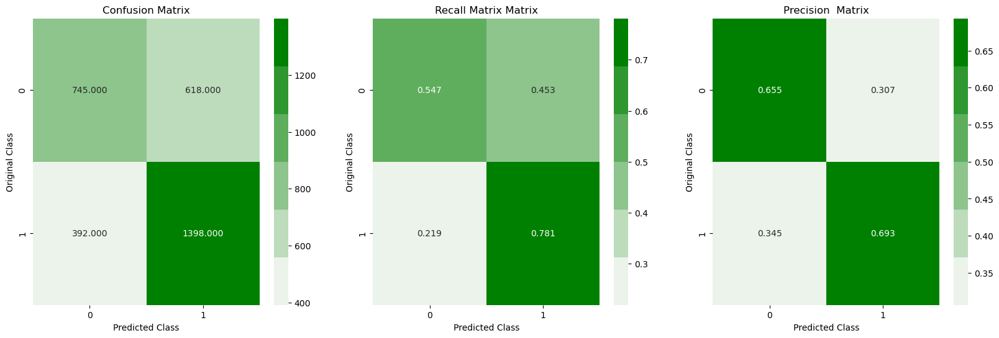

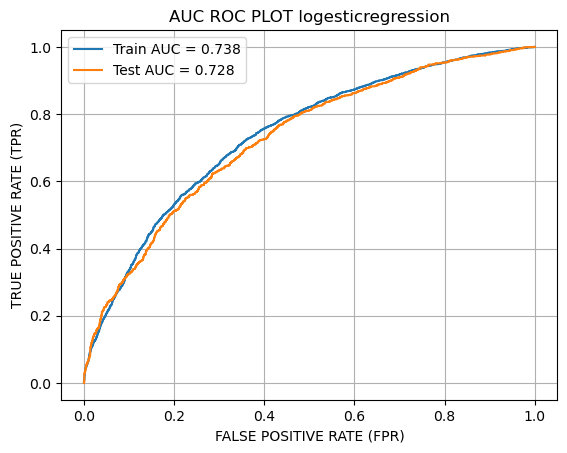

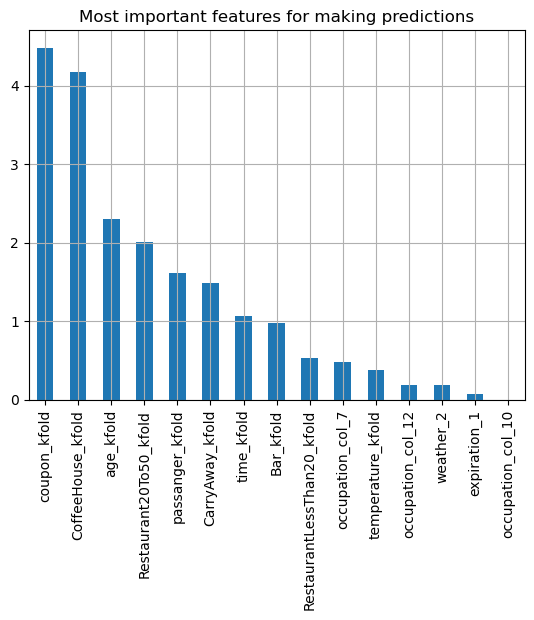

3it [00:04,  1.59s/it]

Train Auc Score--->  0.738
Test Auc Scoer --->  0.728
Train f1score is 0.7364 , precison is 0.7055 and recall is 0.7703 and log_loss is 10.807
Test f1score is 0.7346 , precison is 0.6935 and recall is 0.781 and loh loss is 11.064


                 ------------------->   Set4   <-------------------               


--- Train CM of  logesticregression ---


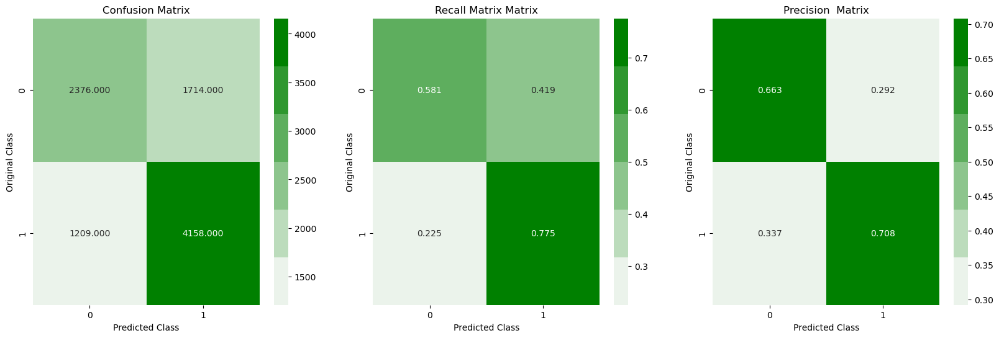



--- Test CM of logesticregression ---


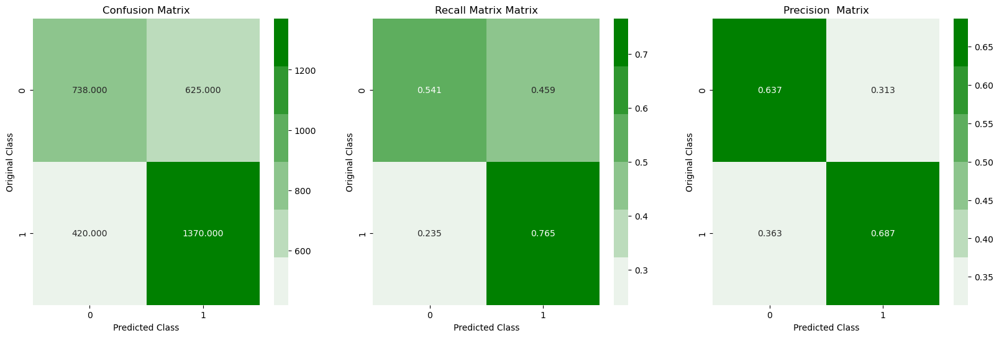

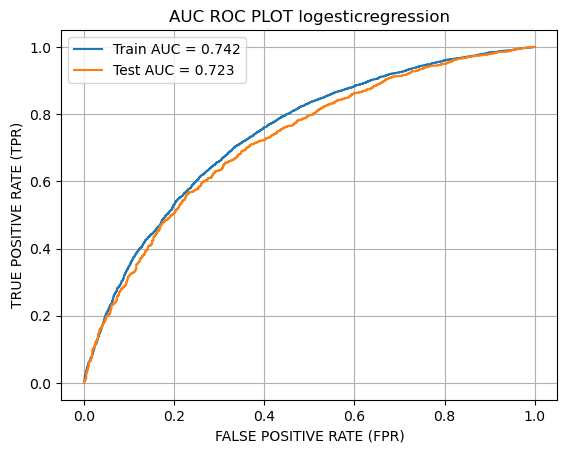

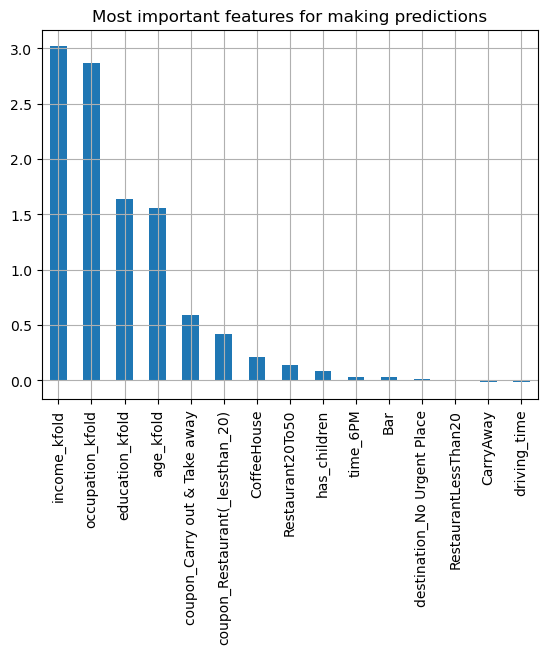

4it [00:06,  1.65s/it]

Train Auc Score--->  0.742
Test Auc Scoer --->  0.723
Train f1score is 0.7399 , precison is 0.7081 and recall is 0.7747 and log_loss is 10.6755
Test f1score is 0.7239 , precison is 0.6867 and recall is 0.7654 and loh loss is 11.4474


                 ------------------->   Set5   <-------------------               


--- Train CM of  logesticregression ---


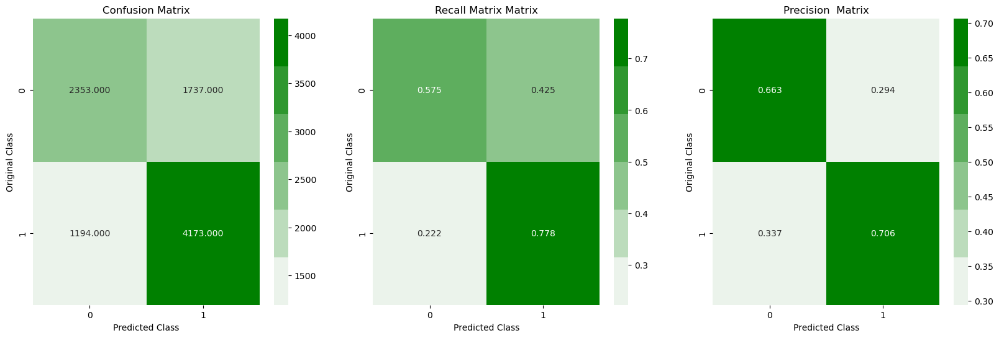



--- Test CM of logesticregression ---


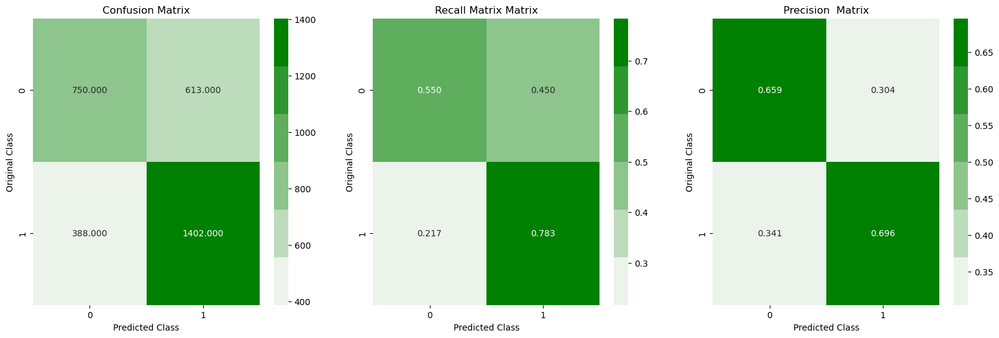

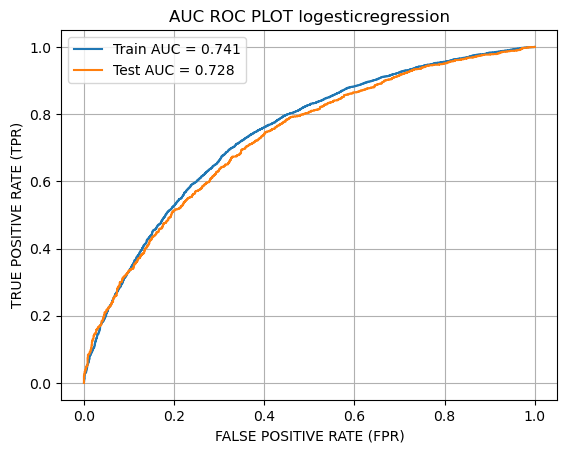

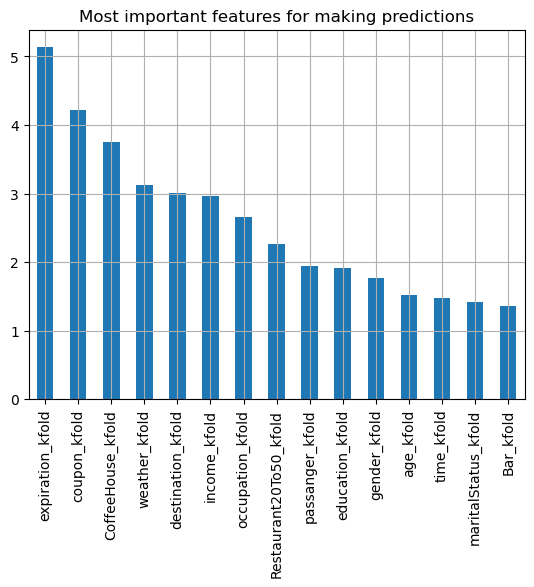

5it [00:08,  1.64s/it]

Train Auc Score--->  0.741
Test Auc Scoer --->  0.728
Train f1score is 0.7401 , precison is 0.7061 and recall is 0.7775 and log_loss is 10.7047
Test f1score is 0.7369 , precison is 0.6958 and recall is 0.7832 and loh loss is 10.9654




In [31]:
set_train_f1score,set_train_precison,set_train_recall,set_train_log_loss,set_test_f1score,set_test_precison,\
    set_test_recall,set_test_log_loss ,set_train_auc,set_test_auc= set_performance(set_dict,y_train,y_test,"logesticregression")

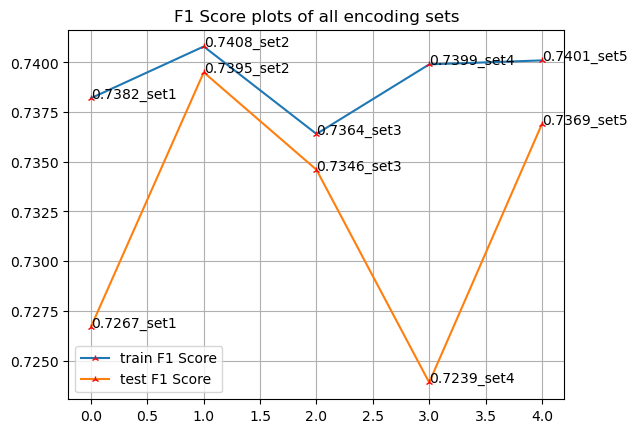

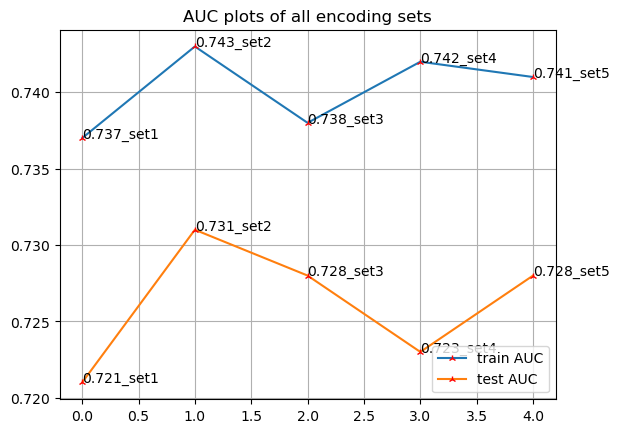

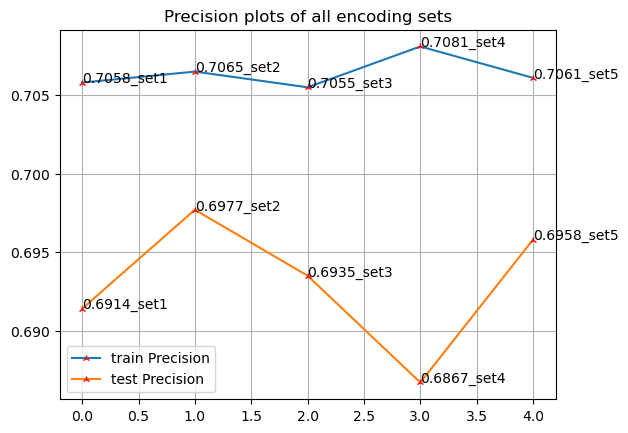

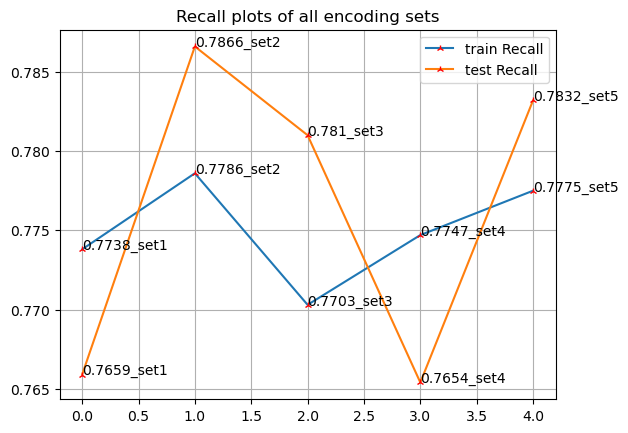

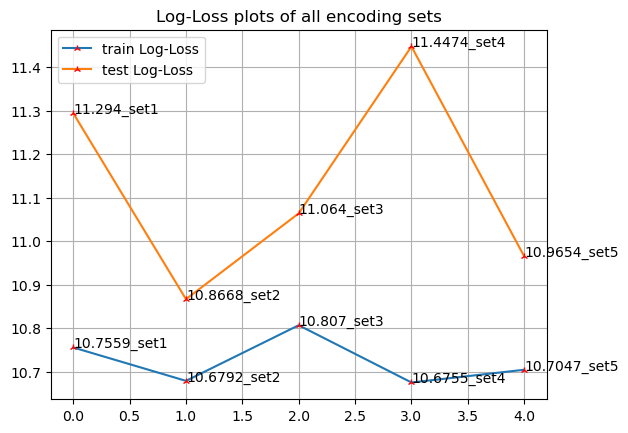

In [32]:
plots(set_train_f1score,set_test_f1score,'F1 Score')
plots(set_train_auc,set_test_auc,'AUC')
plots(set_train_precison,set_test_precison,'Precision')
plots(set_train_recall,set_test_recall,'Recall')
plots(set_train_log_loss,set_test_log_loss,'Log-Loss')

 Choose set2 as the best performing set , set4 was also good but its for test data its performance was not so good  

#### 3.1.1 Hyperparameter tuning Logestic Regression

In [36]:
log_clf = LogisticRegression(random_state=55)

paramerter = {'C':[0.01,0.1,1,10,20,50,100,150,200,250],'penalty' : ['l2','l1','none'], 'solver' : ['lbfgs','liblinear','saga'],\
              'max_iter' : [100, 1000,2500, 5000]} #error on zero for C
gs,best_param,best_esti,best_score = hyperparametertuning(log_clf,paramerter,set2_x_train,y_train,scoring)

Fitting 3 folds for each of 100 candidates, totalling 300 fits
Best parameters are  {'solver': 'saga', 'penalty': 'l2', 'max_iter': 100, 'C': 0.1}
Best estimators are  LogisticRegression(C=0.1, random_state=55, solver='saga')


In [38]:
hyp_logreg_clf = LogisticRegression(**best_param,random_state = 55)
hyp_logreg_clf.fit(set2_x_train,y_train)
hyp_logreg_train_pred = hyp_logreg_clf.predict(set2_x_train)
hyp_logreg_test_pred = hyp_logreg_clf.predict(set2_x_test)


hyp_logreg_tr_f1score,hyp_logreg_tr_precison,hyp_logreg_tr_recall,hyp_logreg_tr_log_loss = performance_matrices(y_train,hyp_logreg_train_pred)
hyp_logreg_te_f1score,hyp_logreg_te_precison,hyp_logreg_te_recall,hyp_logreg_te_log_loss = performance_matrices(y_test,hyp_logreg_test_pred)

hyp_logreg_tr_auc,hyp_logreg_te_auc = pred_auc_roc(hyp_logreg_clf,set2_x_train,set2_x_test,y_train,y_test,'LOGREG HYP',return_plot=False)
print('\n')
print('F1 score of train and test data after hyperparameter tuning ',hyp_logreg_tr_f1score,' , ',hyp_logreg_te_f1score)
print('AUC score of train and test data after hyperparameter tuning ',hyp_logreg_tr_auc,' , ',hyp_logreg_te_auc)



F1 score of train and test data after hyperparameter tuning  0.7419  ,  0.7371
AUC score of train and test data after hyperparameter tuning  0.738  ,  0.727


In [39]:
table('Logestic Regression','SET2',set_train_auc,set_test_auc,set_train_f1score,set_test_f1score,set_train_precison,\
      set_test_precison,set_train_recall,set_test_recall,set_train_log_loss,set_test_log_loss,\
     hyp_logreg_tr_auc,hyp_logreg_te_auc,hyp_logreg_tr_f1score,hyp_logreg_te_f1score,\
    hyp_logreg_tr_precison,hyp_logreg_te_precison,hyp_logreg_tr_recall,hyp_logreg_te_recall,hyp_logreg_tr_log_loss,hyp_logreg_te_log_loss)

,Set,OHE encoded features,Ordinal encoded features,K-Fold Target encoded features,Binary encoded features,Hashing encoded features,Train AUC,Test AUC,Train f1 Score,Test f1 Score,Train Precision,Test Precision,Train recall,Test recall,Train log loss,Test log loss
0,Set 1,"['destination', 'passanger', 'weather', 'coupo...","['age', 'time', 'expiration', 'income', 'tempe...",None,None,None,0.737,0.721,0.7382,0.7267,0.7058,0.6914,0.7738,0.7659,10.7559,11.2940
1,Set 2,"['gender', 'destination', 'weather']","['expiration', 'temperature', 'time']","['income', 'occupation', 'age', 'education', '...","['passanger', 'CarryAway', 'CoffeeHouse', 'Res...",None,0.743,0.731,0.7408,0.7395,0.7065,0.6977,0.7786,0.7866,10.6792,10.8668
2,SET 3,None,None,"['time', 'temperature', 'coupon', 'passanger',...","['destination', 'weather', 'gender', 'expirati...","['occupation', 'income', 'education', 'marital...",0.738,0.728,0.7364,0.7346,0.7055,0.6935,0.7703,0.7810,10.8070,11.0640
3,SET 4,"['destination', 'passanger', 'weather', 'tempe...","['CarryAway', 'CoffeeHouse', 'RestaurantLessTh...","['education', 'occupation', 'age', 'income']",None,None,0.742,0.723,0.7399,0.7239,0.7081,0.6867,0.7747,0.7654,10.6755,11.4474
4,SET 5,None,None,"['education', 'occupation', 'age', 'income', '...",None,None,0.741,0.728,0.7401,0.7369,0.7061,0.6958,0.7775,0.7832,10.7047,10.9654
5,Hyperparamere Tuned OnSET2,SET2,SET2,SET2,SET2,SET2,0.738,0.727,0.7419,0.7371,0.6989,0.6859,0.7906,0.7966,10.7814,11.1406


SET2 has the heighst test asuc and f1 score

## 3.2 KNN 

          ====================               knn            ====================             


0it [00:00, ?it/s]

                 ------------------->   Set1   <-------------------               


--- Train CM of  knn ---


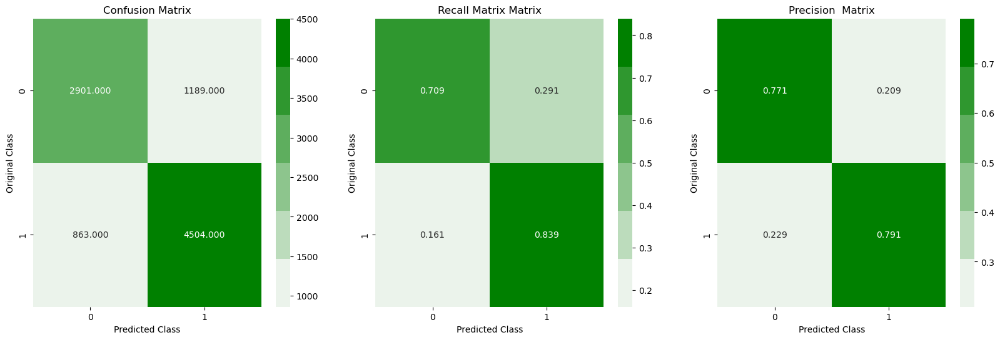



--- Test CM of knn ---


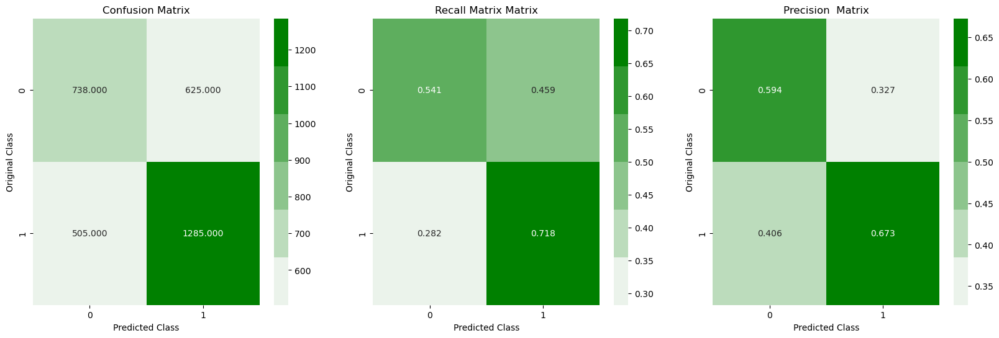

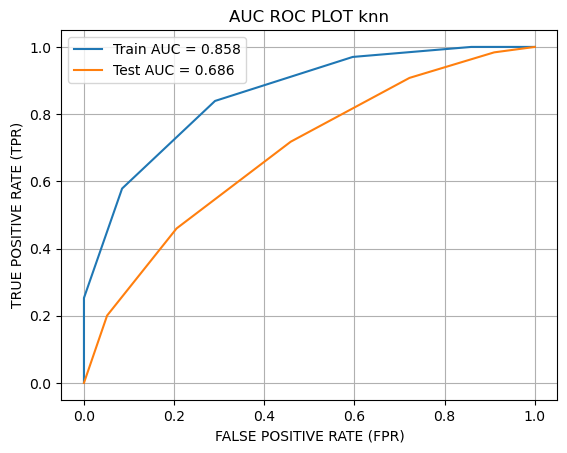

1it [00:06,  6.53s/it]

Train Auc Score--->  0.858
Test Auc Scoer --->  0.686
Train f1score is 0.8145 , precison is 0.7911 and recall is 0.8392 and log_loss is 7.4944
Test f1score is 0.6946 , precison is 0.6728 and recall is 0.7179 and loh loss is 12.3785


                 ------------------->   Set2   <-------------------               


--- Train CM of  knn ---


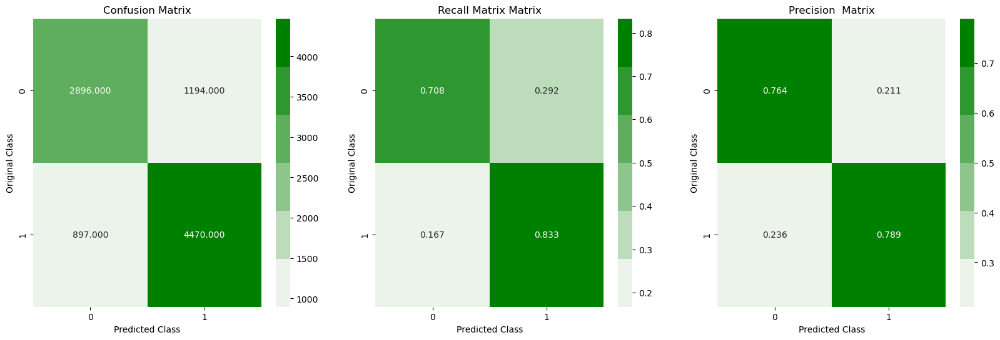



--- Test CM of knn ---


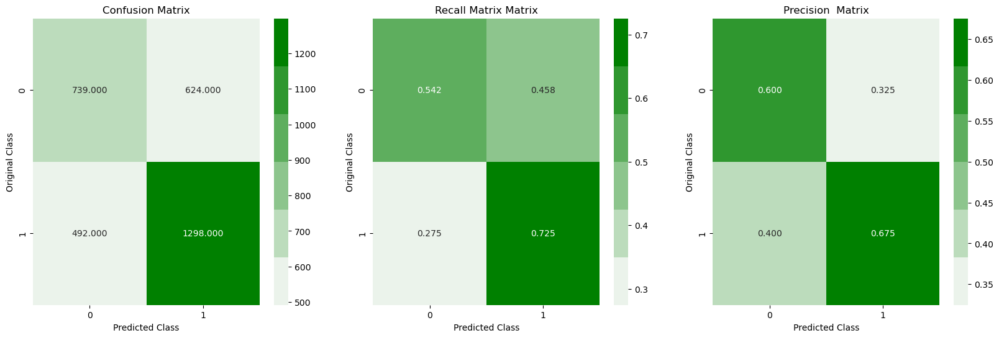

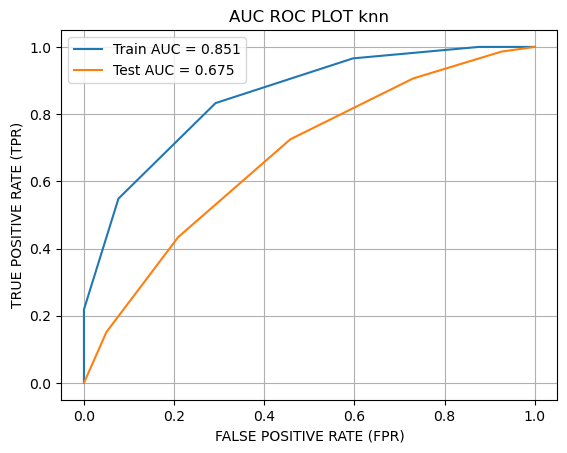

2it [00:14,  7.15s/it]

Train Auc Score--->  0.851
Test Auc Scoer --->  0.675
Train f1score is 0.8104 , precison is 0.7892 and recall is 0.8329 and log_loss is 7.6368
Test f1score is 0.6994 , precison is 0.6753 and recall is 0.7251 and loh loss is 12.2251


                 ------------------->   Set3   <-------------------               


--- Train CM of  knn ---


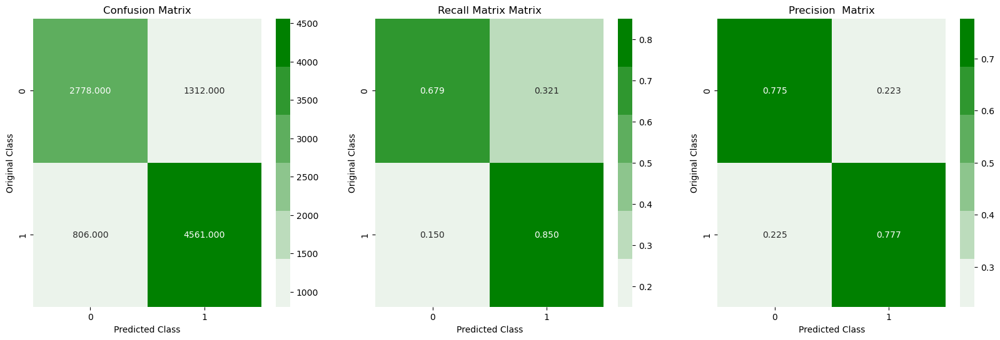



--- Test CM of knn ---


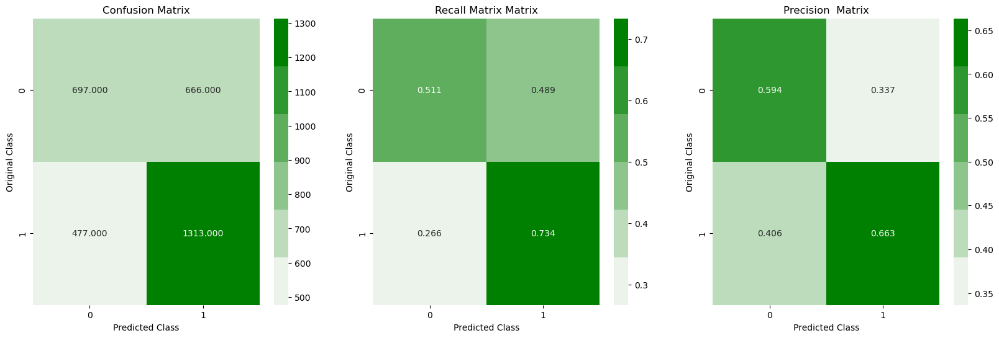

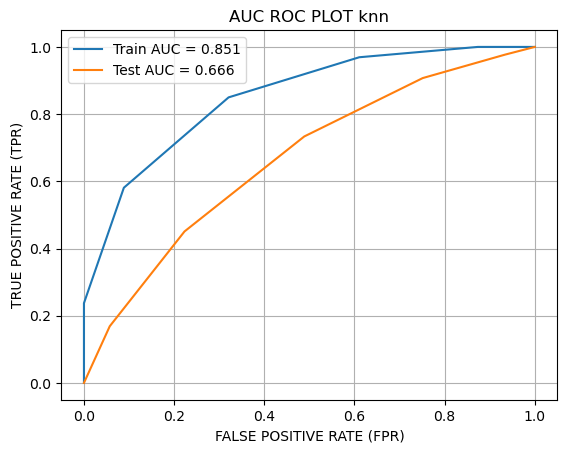

3it [00:20,  6.85s/it]

Train Auc Score--->  0.851
Test Auc Scoer --->  0.666
Train f1score is 0.8116 , precison is 0.7766 and recall is 0.8498 and log_loss is 7.7355
Test f1score is 0.6967 , precison is 0.6635 and recall is 0.7335 and loh loss is 12.5209


                 ------------------->   Set4   <-------------------               


--- Train CM of  knn ---


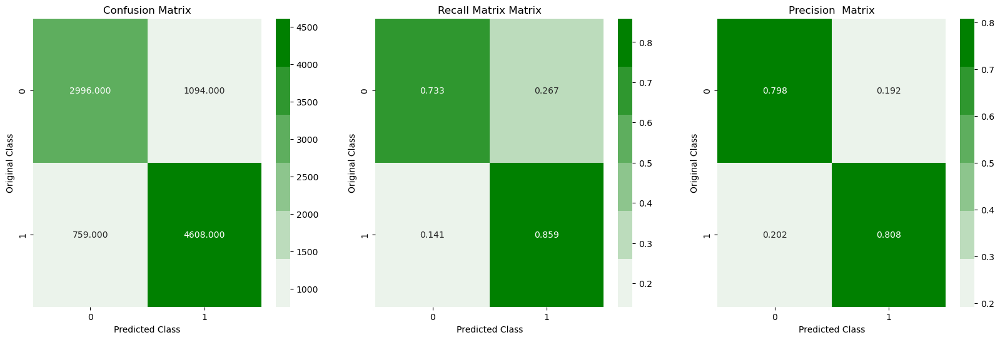



--- Test CM of knn ---


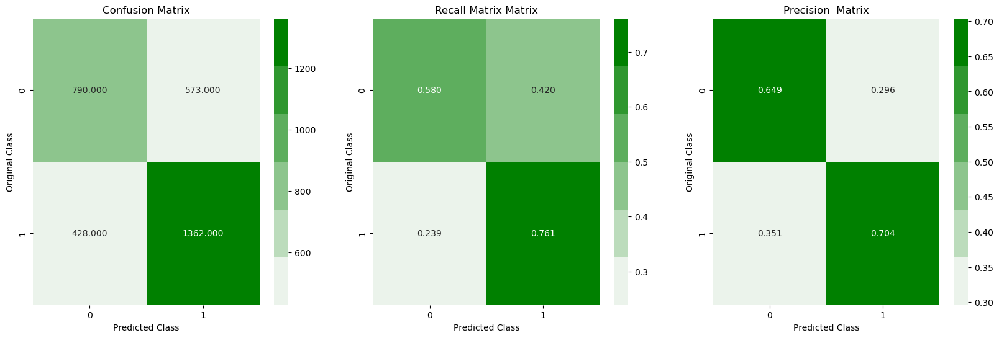

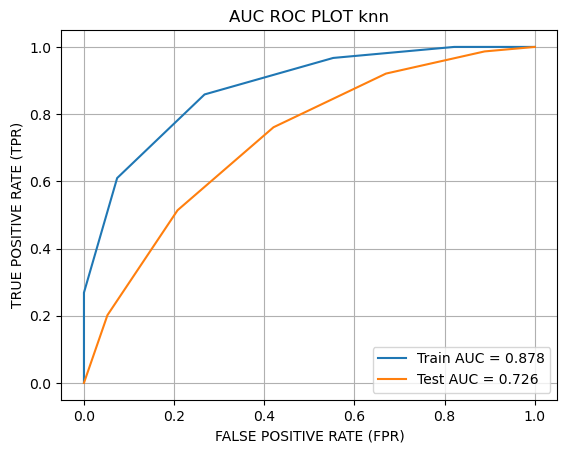

4it [00:27,  6.83s/it]

Train Auc Score--->  0.878
Test Auc Scoer --->  0.726
Train f1score is 0.8326 , precison is 0.8081 and recall is 0.8586 and log_loss is 6.7676
Test f1score is 0.7313 , precison is 0.7039 and recall is 0.7609 and loh loss is 10.9654


                 ------------------->   Set5   <-------------------               


--- Train CM of  knn ---


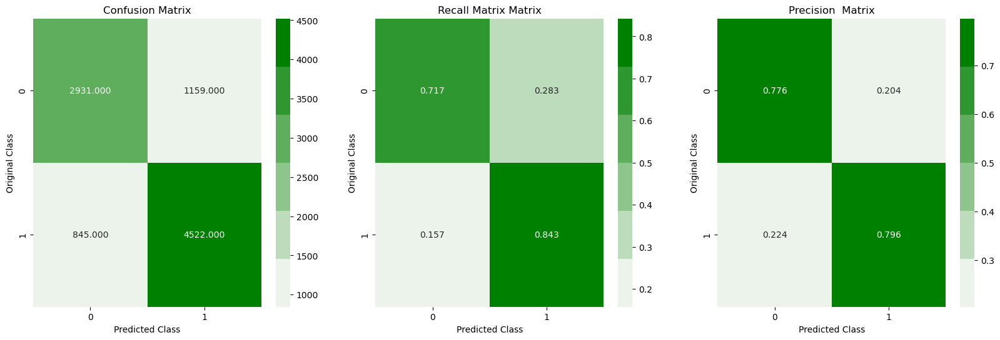



--- Test CM of knn ---


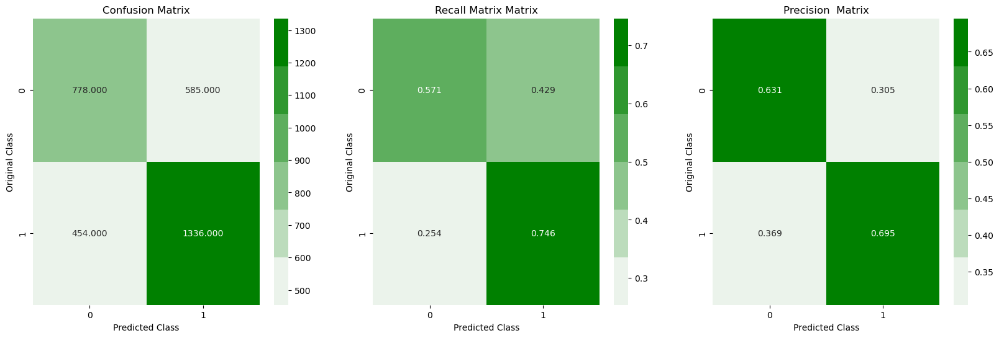

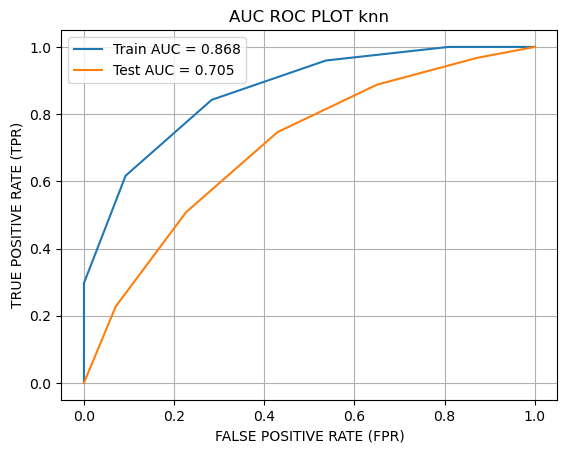

5it [00:33,  6.73s/it]

Train Auc Score--->  0.868
Test Auc Scoer --->  0.705
Train f1score is 0.8186 , precison is 0.796 and recall is 0.8426 and log_loss is 7.3191
Test f1score is 0.72 , precison is 0.6955 and recall is 0.7464 and loh loss is 11.3816




In [32]:
knn_train_f1score,knn_train_precison,knn_train_recall,knn_train_log_loss,knn_test_f1score,knn_test_precison,\
    knn_test_recall,knn_test_log_loss ,knn_train_auc,knn_test_auc = set_performance(set_dict,y_train,y_test,'knn',feature_importance=False)

In [ ]:
plots(knn_train_f1score,knn_test_f1score,'F1 Score')
plots(knn_train_auc,knn_test_auc,'AUC')
plots(knn_train_precison,knn_test_precison,'Precision')
plots(knn_train_recall,knn_test_recall,'Recall')
plots(knn_train_log_loss,knn_test_log_loss,'Log-Loss')

It performs best for SET4

#### 3.2.1 Hyperparamerter tuning KNN

In [34]:
knn_clf = KNeighborsClassifier()

knn_paramerter = { 'n_neighbors' : [5,7,9,11,13,15,17,20],
               'weights' : ['uniform','distance'],
               'metric' : ['minkowski','euclidean','manhattan']}

gs_knn,best_param_knn,best_esti_knn,best_score_knn = hyperparametertuning(knn_clf,knn_paramerter,set4_x_train,y_train)

hyp_knn_clf = KNeighborsClassifier(n_neighbors = best_param_knn['n_neighbors'],weights = best_param_knn['weights'],\
                                   metric = best_param_knn['metric'])
hyp_knn_clf.fit(set4_x_train,y_train)
hyp_knn_train_pred = hyp_knn_clf.predict(set4_x_train)
hyp_knn_test_pred = hyp_knn_clf.predict(set4_x_test)


hyp_knn_tr_f1score,hyp_knn_tr_precison,hyp_knn_tr_recall,hyp_knn_tr_log_loss = performance_matrices(y_train,hyp_knn_train_pred)
hyp_knn_te_f1score,hyp_knn_te_precison,hyp_knn_te_recall,hyp_knn_te_log_loss = performance_matrices(y_test,hyp_knn_test_pred)

hyp_knn_tr_auc,hyp_knn_te_auc = pred_auc_roc(hyp_knn_clf,set4_x_train,set4_x_test,y_train,y_test,'knn HYP',return_plot=False)

print('\n')
print('F1 score of train and test data after hyperparameter tuning ',hyp_knn_tr_f1score,' , ',hyp_knn_te_f1score)
print('AUC score of train and test data after hyperparameter tuning ',hyp_knn_tr_auc,' , ',hyp_knn_te_auc)


Fitting 3 folds for each of 48 candidates, totalling 144 fits
Best parameters are  {'weights': 'uniform', 'n_neighbors': 17, 'metric': 'manhattan'}
Best estimators are  KNeighborsClassifier(metric='manhattan', n_neighbors=17)


F1 score of train and test data after hyperparameter tuning  0.7915  ,  0.7569
AUC score of train and test data after hyperparameter tuning  0.825  ,  0.767


In [35]:
table('KNN','set-4',knn_train_auc,knn_test_auc,knn_train_f1score,knn_test_f1score,knn_train_precison,knn_test_precison,\
      knn_train_recall,knn_test_recall,knn_train_log_loss,knn_test_log_loss,\
      hyp_knn_tr_auc,hyp_knn_te_auc,hyp_knn_tr_f1score,hyp_knn_te_f1score,hyp_knn_tr_precison,\
     hyp_knn_te_precison,hyp_knn_tr_recall,hyp_knn_te_recall,hyp_knn_tr_log_loss,hyp_knn_te_log_loss)


,Set,OHE encoded features,Ordinal encoded features,K-Fold Target encoded features,Binary encoded features,Hashing encoded features,Train AUC,Test AUC,Train f1 Score,Test f1 Score,Train Precision,Test Precision,Train recall,Test recall,Train log loss,Test log loss
0,Set 1,"['destination', 'passanger', 'weather', 'coupo...","['age', 'time', 'expiration', 'income', 'tempe...",None,None,None,0.858,0.686,0.8145,0.6946,0.7911,0.6728,0.8392,0.7179,7.4944,12.3785
1,Set 2,"['gender', 'destination', 'weather']","['expiration', 'temperature', 'time']","['income', 'occupation', 'age', 'education', '...","['passanger', 'CarryAway', 'CoffeeHouse', 'Res...",None,0.851,0.675,0.8104,0.6994,0.7892,0.6753,0.8329,0.7251,7.6368,12.2251
2,SET 3,None,None,"['time', 'temperature', 'coupon', 'passanger',...","['destination', 'weather', 'gender', 'expirati...","['occupation', 'income', 'education', 'marital...",0.851,0.666,0.8116,0.6967,0.7766,0.6635,0.8498,0.7335,7.7355,12.5209
3,SET 4,"['destination', 'passanger', 'weather', 'tempe...","['CarryAway', 'CoffeeHouse', 'RestaurantLessTh...","['education', 'occupation', 'age', 'income']",None,None,0.878,0.726,0.8326,0.7313,0.8081,0.7039,0.8586,0.7609,6.7676,10.9654
4,SET 5,None,None,"['education', 'occupation', 'age', 'income', '...",None,None,0.868,0.705,0.8186,0.7200,0.7960,0.6955,0.8426,0.7464,7.3191,11.3816
5,Hyperparamere Tuned Onset-4,set-4,set-4,set-4,set-4,set-4,0.825,0.767,0.7915,0.7569,0.7529,0.7120,0.8342,0.8078,8.6156,10.1767


## 3.3 LInearSVC

          ====================               linearsvc            ====================             


0it [00:00, ?it/s]

                 ------------------->   Set1   <-------------------               


--- Train CM of  linearsvc ---


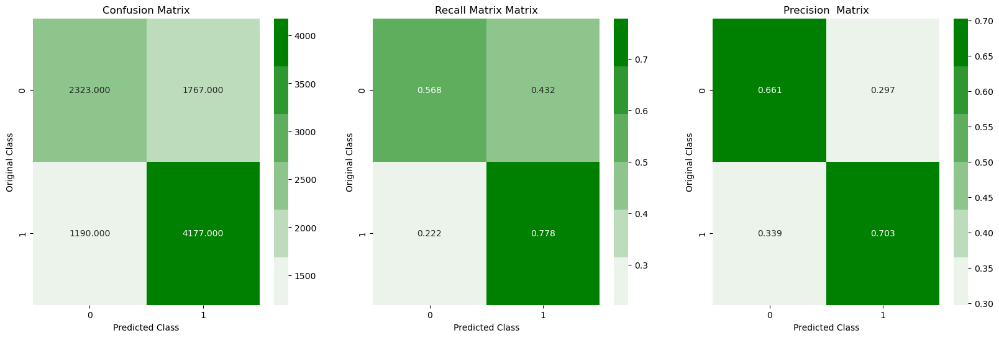



--- Test CM of linearsvc ---


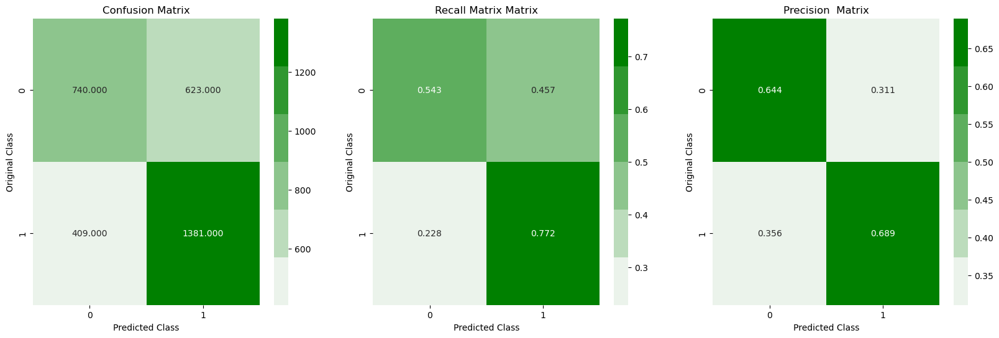

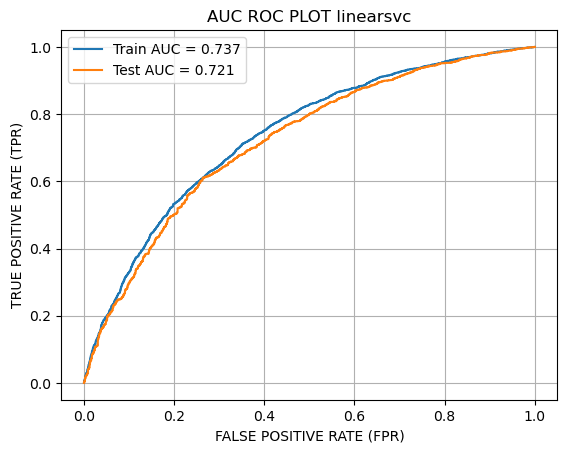

1it [00:32, 32.09s/it]

Train Auc Score--->  0.737
Test Auc Scoer --->  0.721
Train f1score is 0.7386 , precison is 0.7027 and recall is 0.7783 and log_loss is 10.7997
Test f1score is 0.728 , precison is 0.6891 and recall is 0.7715 and loh loss is 11.305


                 ------------------->   Set2   <-------------------               


--- Train CM of  linearsvc ---


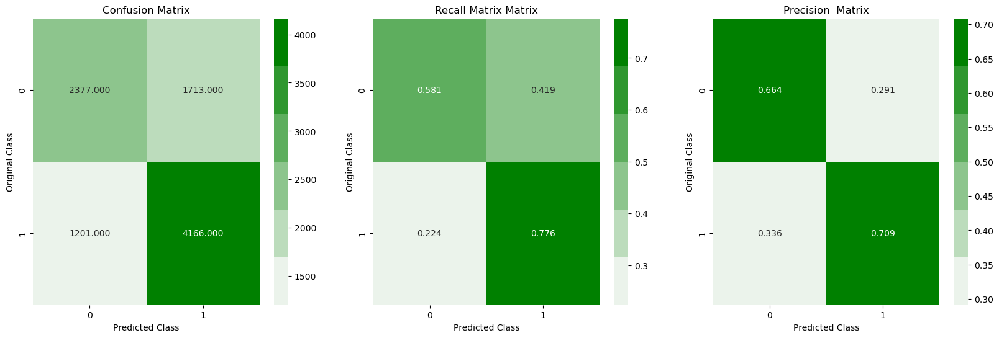



--- Test CM of linearsvc ---


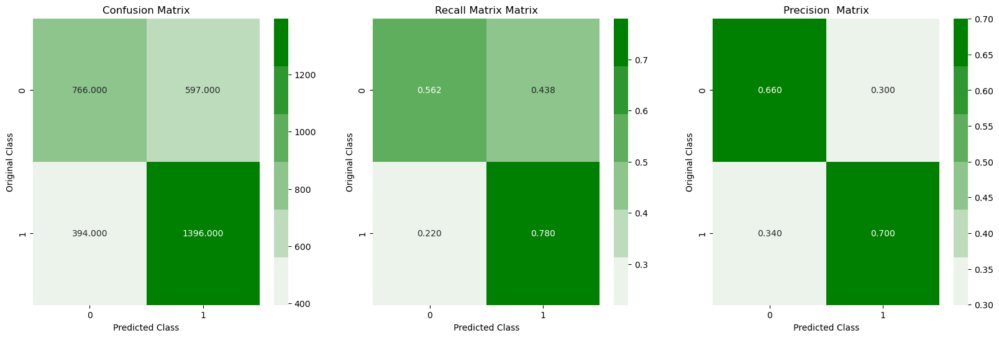

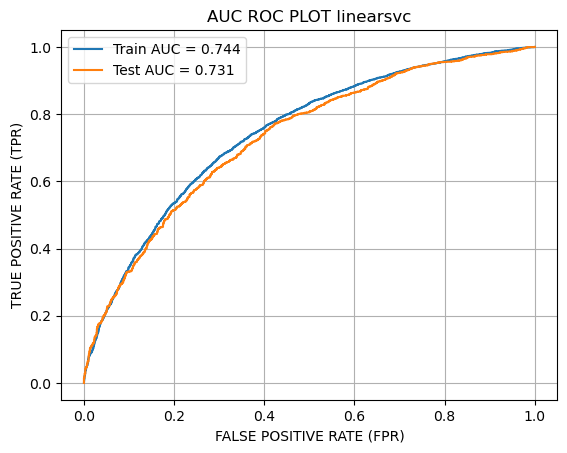

2it [00:36, 15.93s/it]

Train Auc Score--->  0.744
Test Auc Scoer --->  0.731
Train f1score is 0.7409 , precison is 0.7086 and recall is 0.7762 and log_loss is 10.6426
Test f1score is 0.738 , precison is 0.7005 and recall is 0.7799 and loh loss is 10.8558


                 ------------------->   Set3   <-------------------               


--- Train CM of  linearsvc ---


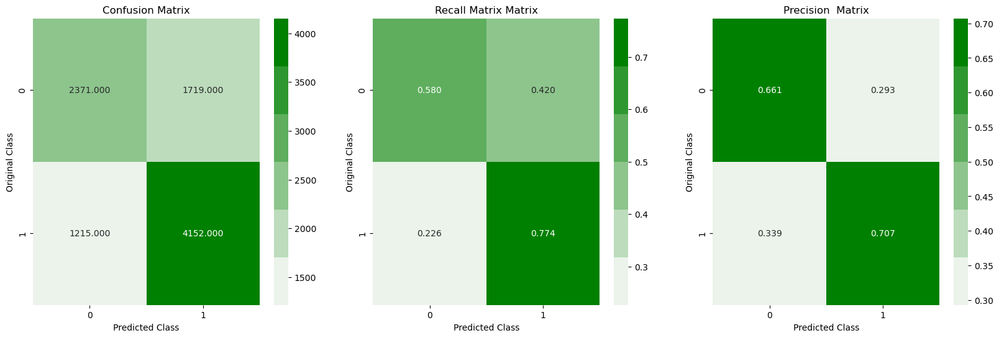



--- Test CM of linearsvc ---


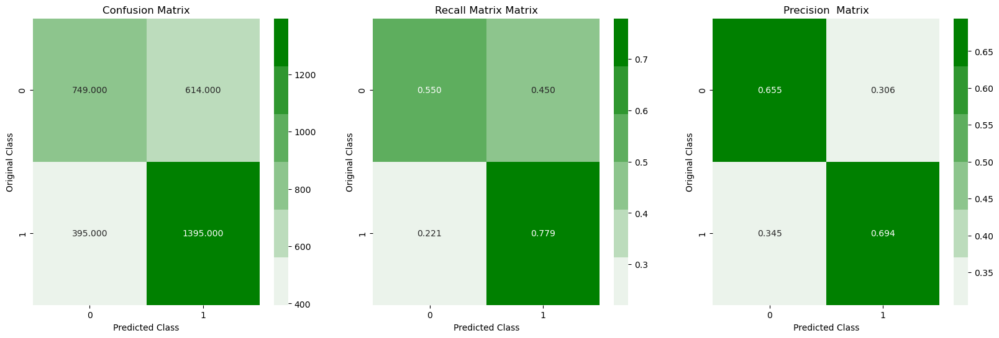

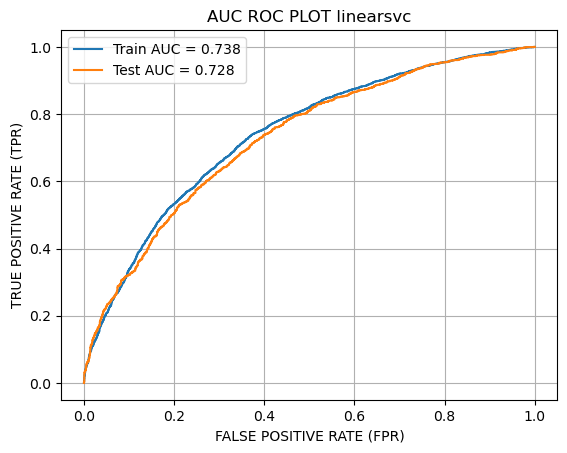

3it [00:41, 10.70s/it]

Train Auc Score--->  0.738
Test Auc Scoer --->  0.728
Train f1score is 0.7389 , precison is 0.7072 and recall is 0.7736 and log_loss is 10.7157
Test f1score is 0.7344 , precison is 0.6944 and recall is 0.7793 and loh loss is 11.053


                 ------------------->   Set4   <-------------------               


--- Train CM of  linearsvc ---


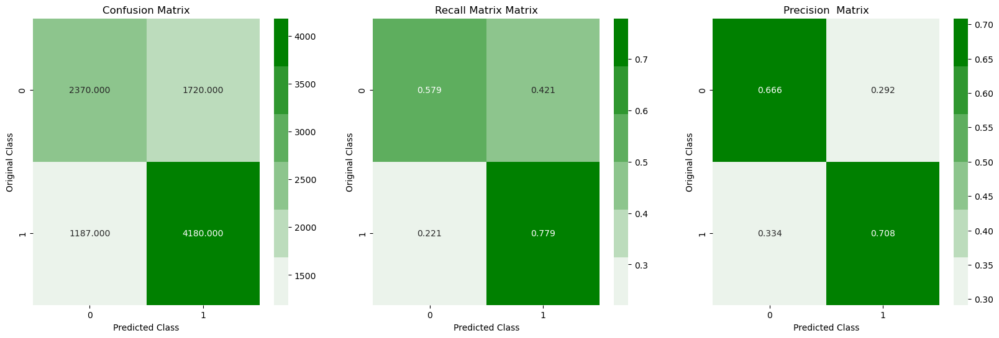



--- Test CM of linearsvc ---


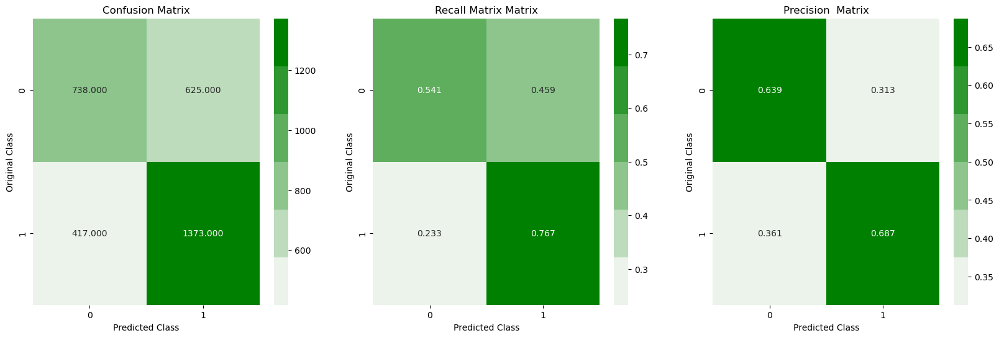

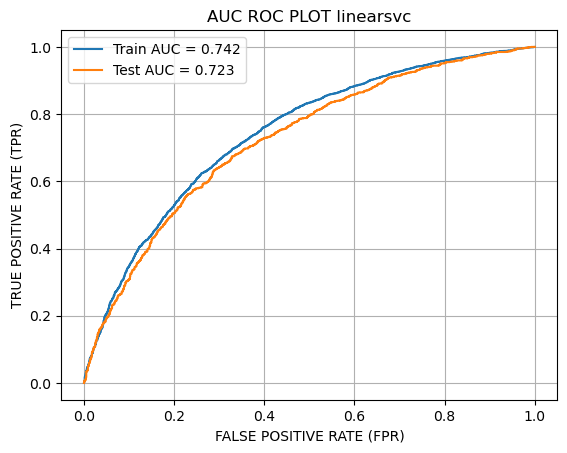

4it [00:42,  7.11s/it]

Train Auc Score--->  0.742
Test Auc Scoer --->  0.723
Train f1score is 0.742 , precison is 0.7085 and recall is 0.7788 and log_loss is 10.6171
Test f1score is 0.7249 , precison is 0.6872 and recall is 0.767 and loh loss is 11.4145


                 ------------------->   Set5   <-------------------               


--- Train CM of  linearsvc ---


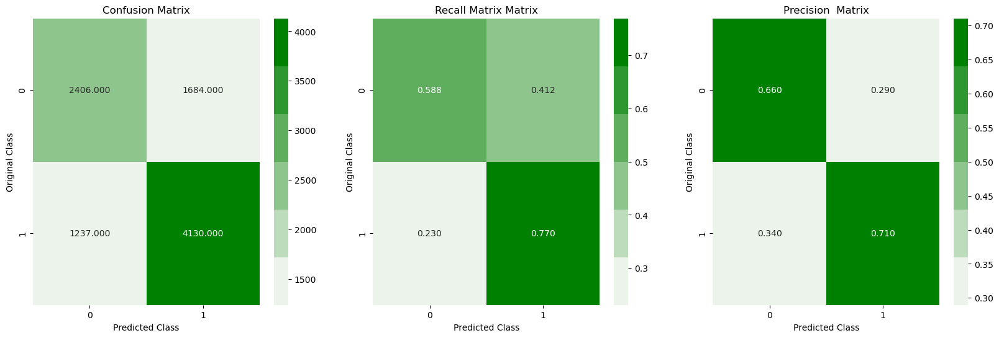



--- Test CM of linearsvc ---


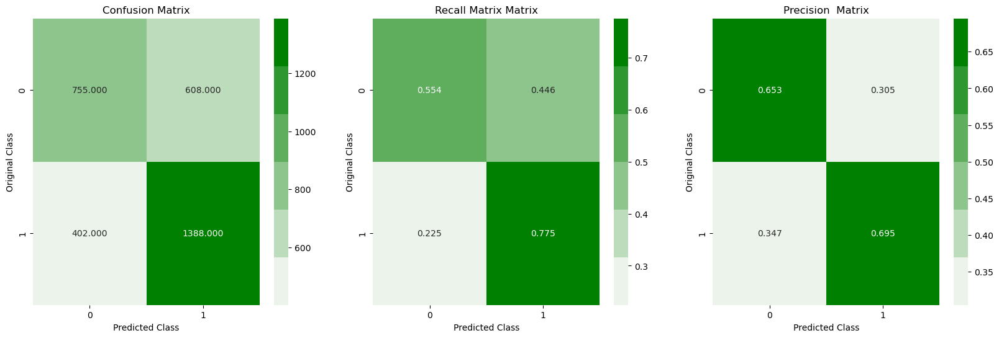

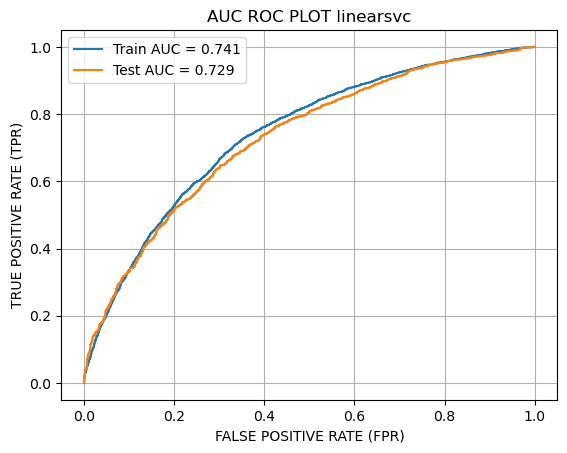

5it [00:44,  8.89s/it]

Train Auc Score--->  0.741
Test Auc Scoer --->  0.729
Train f1score is 0.7388 , precison is 0.7104 and recall is 0.7695 and log_loss is 10.6682
Test f1score is 0.7332 , precison is 0.6954 and recall is 0.7754 and loh loss is 11.064




In [40]:
linsvc_train_f1score,linsvc_train_precison,linsvc_train_recall,linsvc_train_log_loss,linsvc_test_f1score,linsvc_test_precison,\
    linsvc_test_recall,linsvc_test_log_loss ,linsvc_train_auc,linsvc_test_auc =\
                                                    set_performance(set_dict,y_train,y_test,'linearsvc',False)

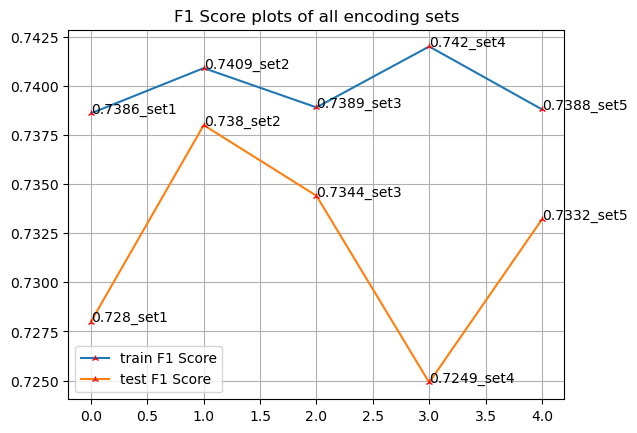

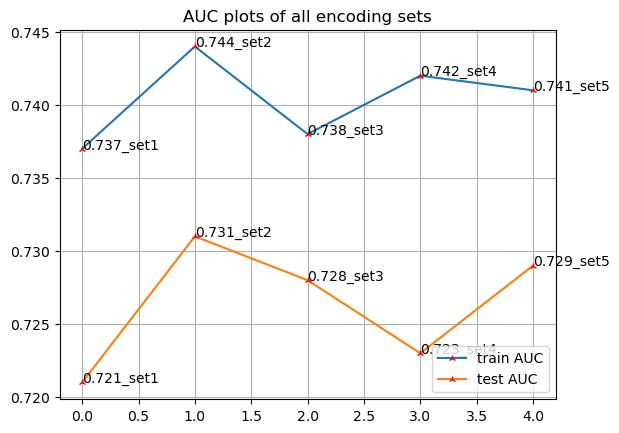

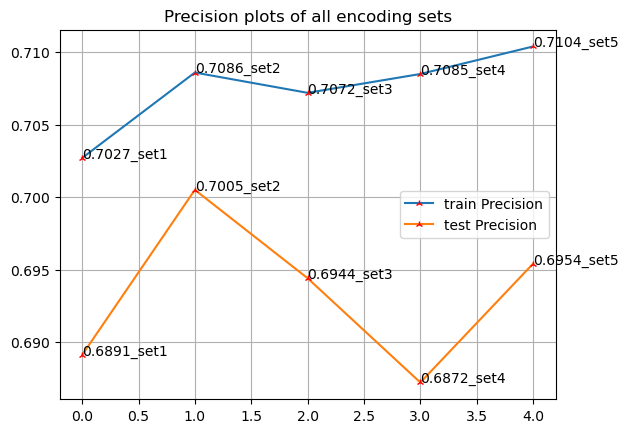

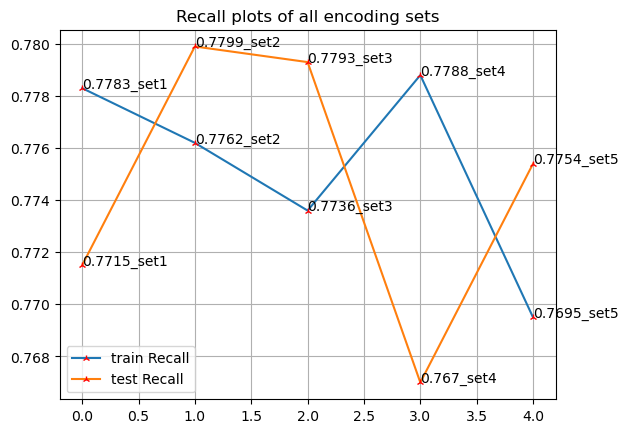

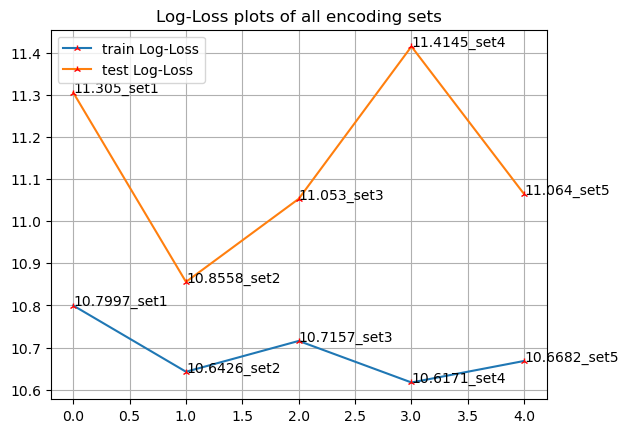

In [41]:
plots(linsvc_train_f1score,linsvc_test_f1score,'F1 Score')
plots(linsvc_train_auc,linsvc_test_auc,'AUC')
plots(linsvc_train_precison,linsvc_test_precison,'Precision')
plots(linsvc_train_recall,linsvc_test_recall,'Recall')
plots(linsvc_train_log_loss,linsvc_test_log_loss,'Log-Loss')

Choose SET3 because  performs best on the test data

#### 3.3.1 Hyperparamerter tuning LinearSVC

In [42]:
linsvc_clf =  LinearSVC(random_state = 55)
linsvc_parameters = {'penalty':['l1', 'l2'],'loss':['hinge', 'squared_hinge'],\
             'C':[0.1, 1, 10, 100, 500]}

gs_linsvc,best_param_linsvc,best_esti_linsvc,best_score_linsvc = hyperparametertuning(linsvc_clf,linsvc_parameters,\
                                                                                      set2_x_train,y_train)

Fitting 3 folds for each of 20 candidates, totalling 60 fits
Best parameters are  {'penalty': 'l2', 'loss': 'hinge', 'C': 0.1}
Best estimators are  LinearSVC(C=0.1, loss='hinge', random_state=55)


In [43]:
hyp_linsvc_clf =  LinearSVC(random_state = 55,C =best_param_linsvc['C'],loss  = best_param_linsvc['loss'],\
                        penalty=best_param_linsvc['penalty'])
#Calibarting LINSVC
hyp_linsvc_clf = CalibratedClassifierCV(linsvc_clf,n_jobs=-1)

hyp_linsvc_clf.fit(set2_x_train,y_train)
hyp_linsvc_train_pred = hyp_linsvc_clf.predict(set2_x_train)
hyp_linsvc_test_pred = hyp_linsvc_clf.predict(set2_x_test)


hyp_linsvc_tr_f1score,hyp_linsvc_tr_precison,hyp_linsvc_tr_recall,hyp_linsvc_tr_log_loss = performance_matrices(y_train,hyp_linsvc_train_pred)
hyp_linsvc_te_f1score,hyp_linsvc_te_precison,hyp_linsvc_te_recall,hyp_linsvc_te_log_loss = performance_matrices(y_test,hyp_linsvc_test_pred)

hyp_linsvc_tr_auc,hyp_linsvc_te_auc = pred_auc_roc(hyp_linsvc_clf,set2_x_train,set2_x_test,y_train,y_test,'linsvc HYP',return_plot=False)

print('\n')
print('F1 score of train and test data after hyperparameter tuning ',hyp_linsvc_tr_f1score,' , ',hyp_linsvc_te_f1score)
print('AUC score of train and test data after hyperparameter tuning ',hyp_linsvc_tr_auc,' , ',hyp_linsvc_te_auc)




F1 score of train and test data after hyperparameter tuning  0.7406  ,  0.7378
AUC score of train and test data after hyperparameter tuning  0.744  ,  0.731


In [44]:
table('Linear SVC','SET2',linsvc_train_auc,linsvc_test_auc,linsvc_train_f1score,linsvc_test_f1score,linsvc_train_precison,\
      linsvc_test_precison,linsvc_train_recall,linsvc_test_recall,linsvc_train_log_loss,linsvc_test_log_loss,\
     hyp_linsvc_tr_auc,hyp_linsvc_te_auc,hyp_linsvc_tr_f1score,hyp_linsvc_te_f1score,\
    hyp_linsvc_tr_precison,hyp_linsvc_te_precison,hyp_linsvc_tr_recall,hyp_linsvc_te_recall,hyp_linsvc_tr_log_loss,hyp_linsvc_te_log_loss)

,Set,OHE encoded features,Ordinal encoded features,K-Fold Target encoded features,Binary encoded features,Hashing encoded features,Train AUC,Test AUC,Train f1 Score,Test f1 Score,Train Precision,Test Precision,Train recall,Test recall,Train log loss,Test log loss
0,Set 1,"['destination', 'passanger', 'weather', 'coupo...","['age', 'time', 'expiration', 'income', 'tempe...",None,None,None,0.737,0.721,0.7386,0.7280,0.7027,0.6891,0.7783,0.7715,10.7997,11.3050
1,Set 2,"['gender', 'destination', 'weather']","['expiration', 'temperature', 'time']","['income', 'occupation', 'age', 'education', '...","['passanger', 'CarryAway', 'CoffeeHouse', 'Res...",None,0.744,0.731,0.7409,0.7380,0.7086,0.7005,0.7762,0.7799,10.6426,10.8558
2,SET 3,None,None,"['time', 'temperature', 'coupon', 'passanger',...","['destination', 'weather', 'gender', 'expirati...","['occupation', 'income', 'education', 'marital...",0.738,0.728,0.7389,0.7344,0.7072,0.6944,0.7736,0.7793,10.7157,11.0530
3,SET 4,"['destination', 'passanger', 'weather', 'tempe...","['CarryAway', 'CoffeeHouse', 'RestaurantLessTh...","['education', 'occupation', 'age', 'income']",None,None,0.742,0.723,0.7420,0.7249,0.7085,0.6872,0.7788,0.7670,10.6171,11.4145
4,SET 5,None,None,"['education', 'occupation', 'age', 'income', '...",None,None,0.741,0.729,0.7388,0.7332,0.7104,0.6954,0.7695,0.7754,10.6682,11.0640
5,Hyperparamere Tuned OnSET2,SET2,SET2,SET2,SET2,SET2,0.744,0.731,0.7406,0.7378,0.7080,0.7001,0.7762,0.7799,10.6609,10.8668


## 3.4 SVM using 'rbf kernel'


          ====================               rbf-svm            ====================             


0it [00:00, ?it/s]

                 ------------------->   Set1   <-------------------               


--- Train CM of  rbf-svm ---


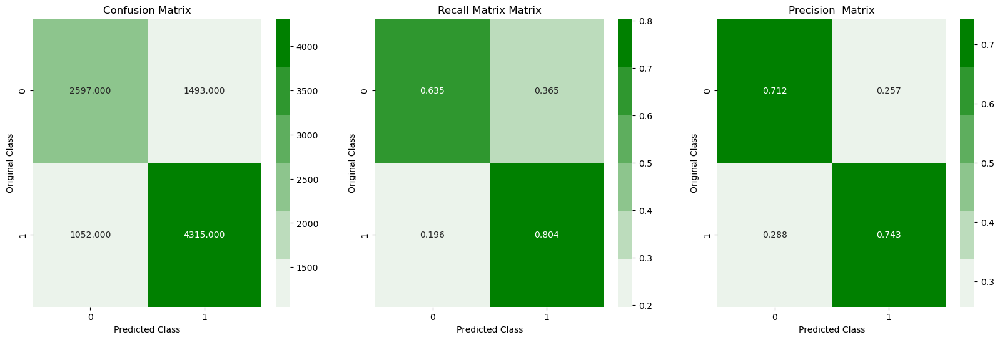



--- Test CM of rbf-svm ---


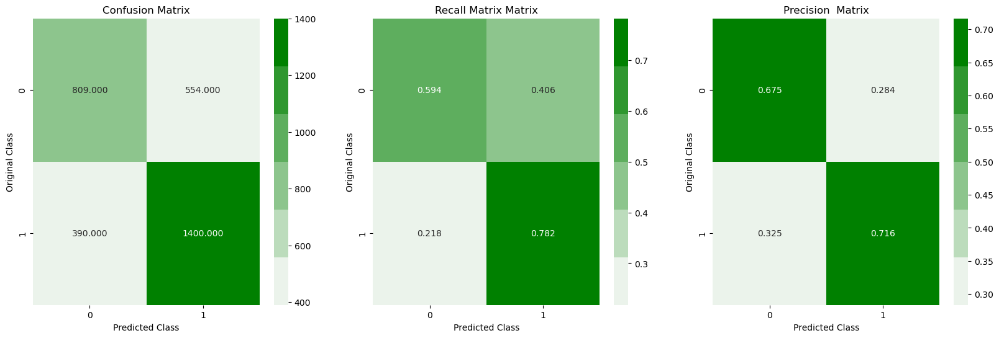

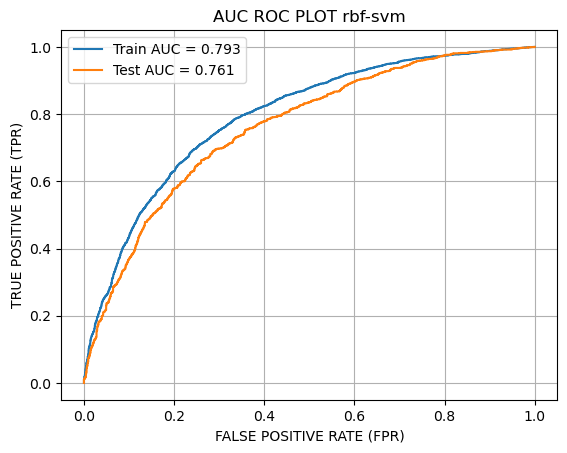

1it [01:05, 65.66s/it]

Train Auc Score--->  0.793
Test Auc Scoer --->  0.761
Train f1score is 0.7723 , precison is 0.7429 and recall is 0.804 and log_loss is 9.295
Test f1score is 0.7479 , precison is 0.7165 and recall is 0.7821 and loh loss is 10.341


                 ------------------->   Set2   <-------------------               


--- Train CM of  rbf-svm ---


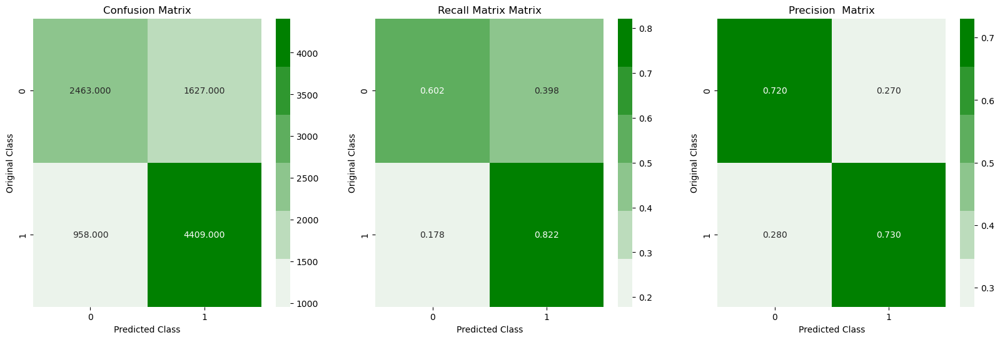



--- Test CM of rbf-svm ---


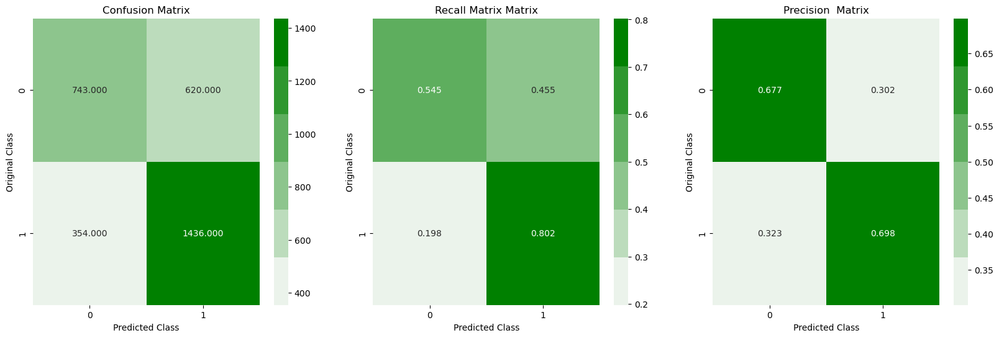

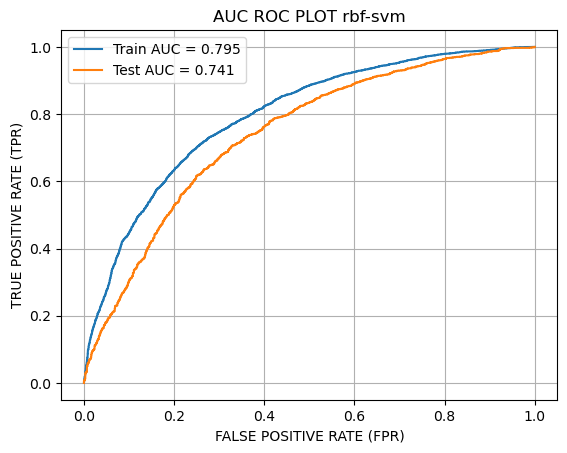

2it [02:02, 60.58s/it]

Train Auc Score--->  0.795
Test Auc Scoer --->  0.741
Train f1score is 0.7733 , precison is 0.7305 and recall is 0.8215 and log_loss is 9.4411
Test f1score is 0.7467 , precison is 0.6984 and recall is 0.8022 and loh loss is 10.6696


                 ------------------->   Set3   <-------------------               


--- Train CM of  rbf-svm ---


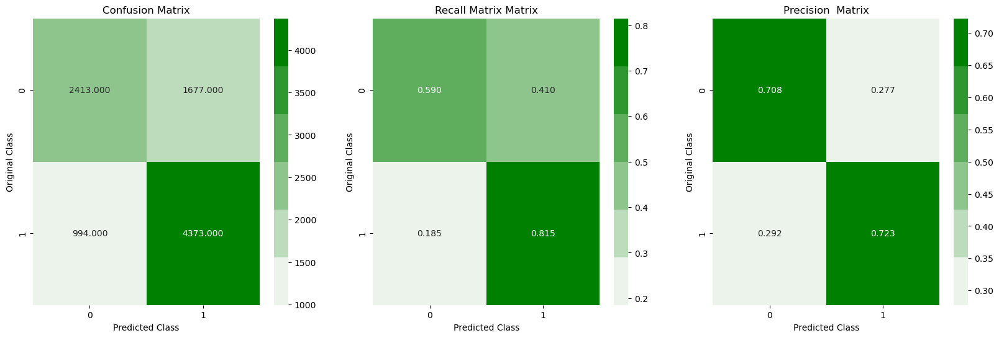



--- Test CM of rbf-svm ---


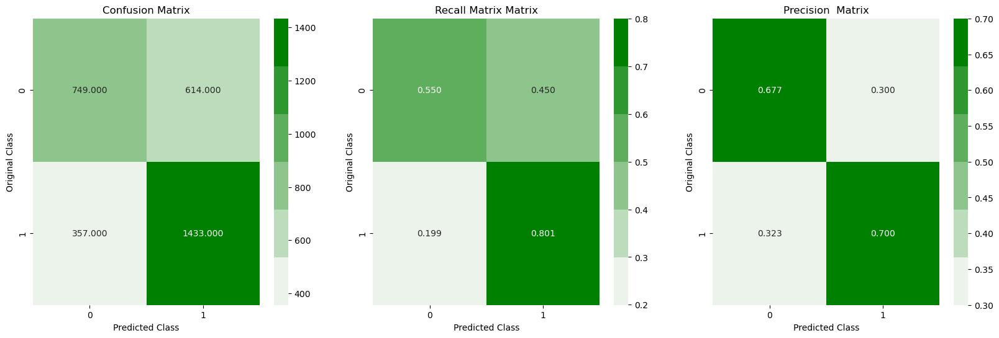

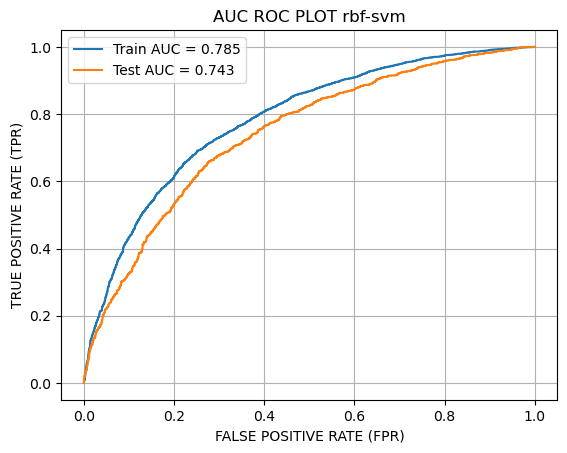

3it [03:05, 61.72s/it]

Train Auc Score--->  0.785
Test Auc Scoer --->  0.743
Train f1score is 0.7661 , precison is 0.7228 and recall is 0.8148 and log_loss is 9.7551
Test f1score is 0.7469 , precison is 0.7 and recall is 0.8006 and loh loss is 10.6367


                 ------------------->   Set4   <-------------------               


--- Train CM of  rbf-svm ---


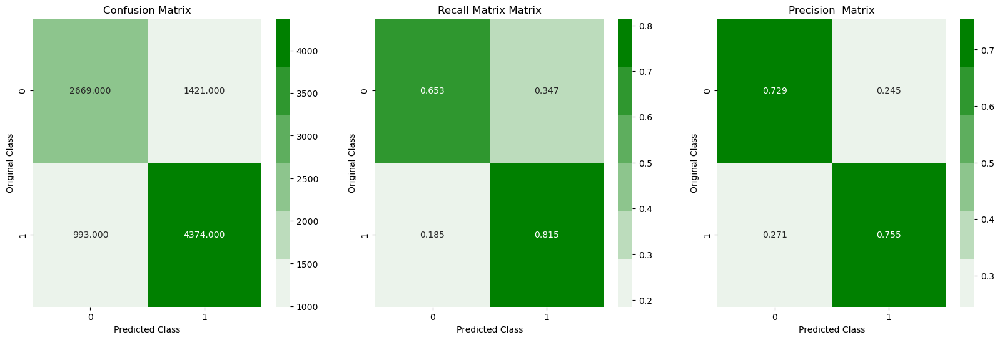



--- Test CM of rbf-svm ---


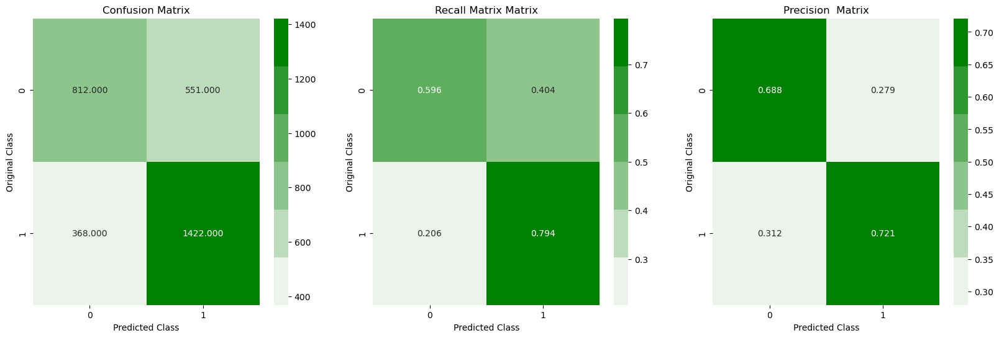

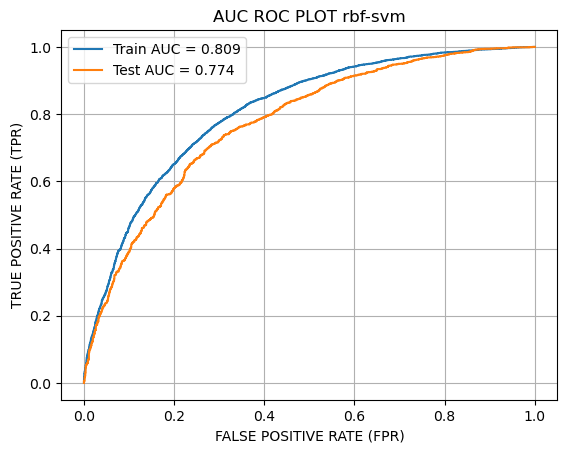

4it [04:00, 58.94s/it]

Train Auc Score--->  0.809
Test Auc Scoer --->  0.774
Train f1score is 0.7837 , precison is 0.7548 and recall is 0.815 and log_loss is 8.8165
Test f1score is 0.7558 , precison is 0.7207 and recall is 0.7944 and loh loss is 10.0671


                 ------------------->   Set5   <-------------------               


--- Train CM of  rbf-svm ---


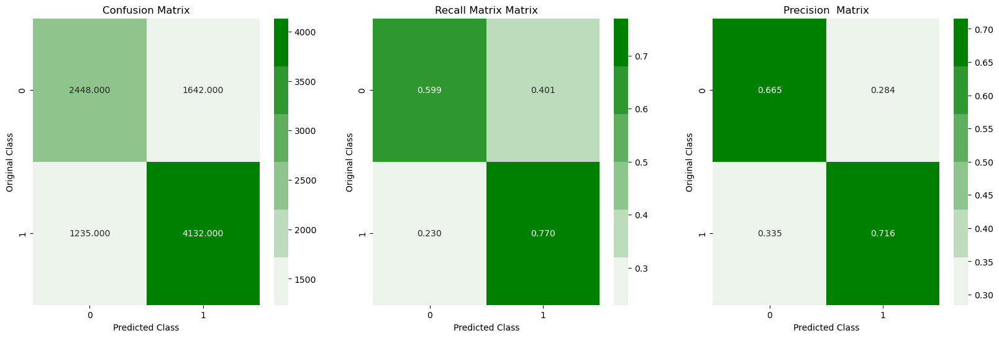



--- Test CM of rbf-svm ---


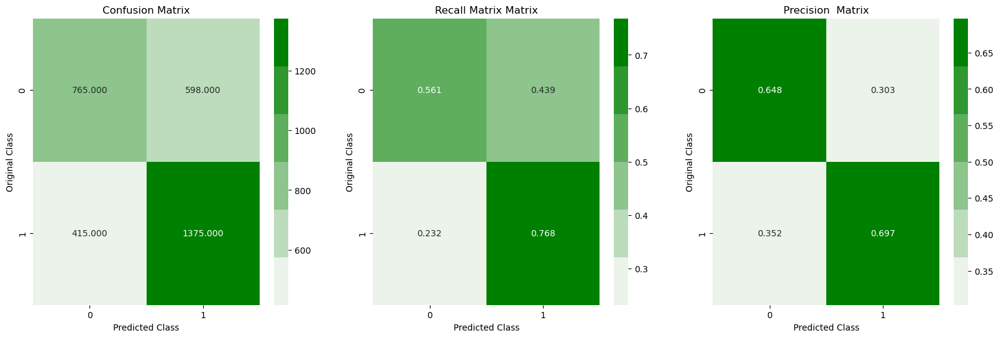

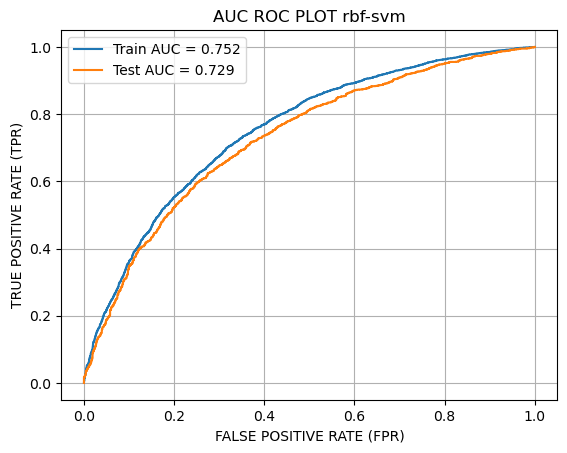

5it [04:53, 58.74s/it]

Train Auc Score--->  0.752
Test Auc Scoer --->  0.729
Train f1score is 0.7418 , precison is 0.7156 and recall is 0.7699 and log_loss is 10.5075
Test f1score is 0.7308 , precison is 0.6969 and recall is 0.7682 and loh loss is 11.0968




In [42]:
svm_train_f1score,svm_train_precison,svm_train_recall,svm_train_log_loss,svm_test_f1score,svm_test_precison,\
    svm_test_recall,svm_test_log_loss ,svm_train_auc,svm_test_auc = set_performance(set_dict,y_train,y_test,'rbf-svm',False)

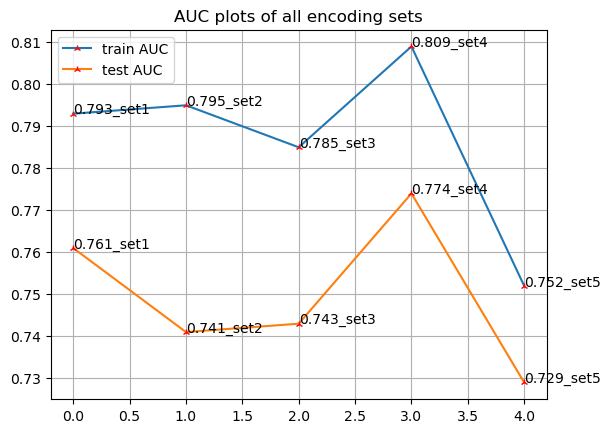

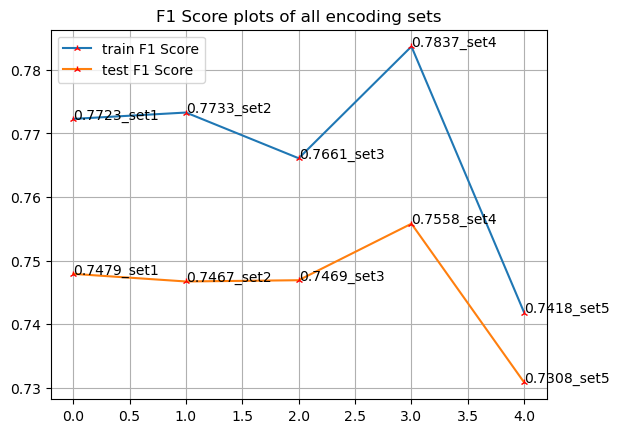

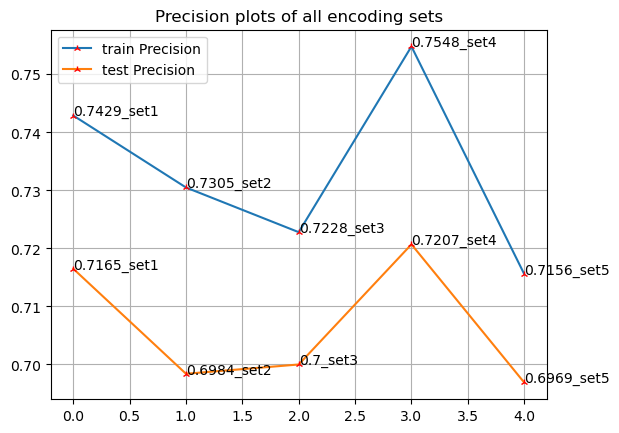

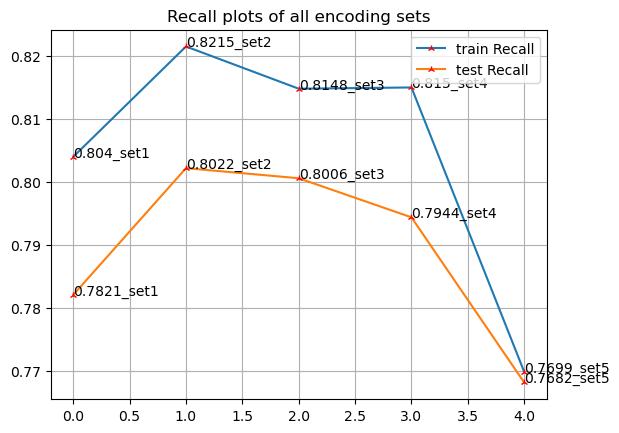

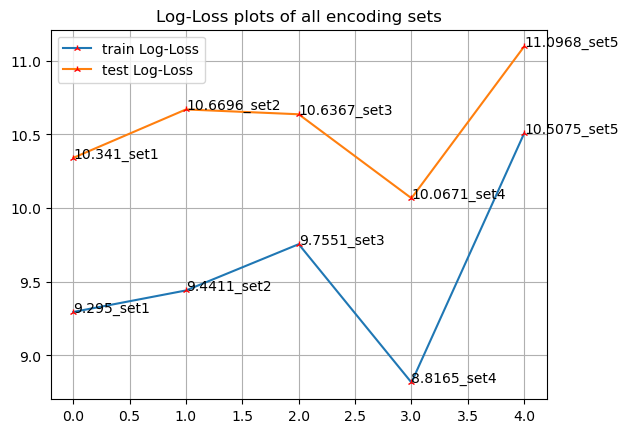

In [43]:
plots(svm_train_auc,svm_test_auc,'AUC')
plots(svm_train_f1score,svm_test_f1score,'F1 Score')
plots(svm_train_precison,svm_test_precison,'Precision')
plots(svm_train_recall,svm_test_recall,'Recall')
plots(svm_train_log_loss,svm_test_log_loss,'Log-Loss')

Choose SET4 as it performs best on it

#### 3.4.1 Hyperparamerter tuning SVM-RBF Kernel

In [44]:
svm_clf =  SVC(kernel='rbf',random_state=55)

svm_parameters = {'C': [0.1, 1, 10, 100, 1000], 
              'gamma': [1, 0.1, 0.01, 0.001, 0.0001],}

gs_svm,best_param_svm,best_esti_svm,best_score_svm = hyperparametertuning(svm_clf,svm_parameters,\
                                                                                      set4_x_train,y_train)

Fitting 3 folds for each of 25 candidates, totalling 75 fits
Best parameters are  {'gamma': 0.1, 'C': 1}
Best estimators are  SVC(C=1, gamma=0.1, random_state=55)


In [45]:
hyp_svm_clf =  SVC(kernel='rbf',random_state=55,gamma=best_param_svm['gamma'],C = best_param_svm['C'] )

#Calibarting RBF-SVM
hyp_svm_clf = CalibratedClassifierCV(hyp_svm_clf,n_jobs=-1)

hyp_svm_clf.fit(set4_x_train,y_train)
hyp_svm_train_pred = hyp_svm_clf.predict(set4_x_train)
hyp_svm_test_pred = hyp_svm_clf.predict(set4_x_test)


hyp_svm_tr_f1score,hyp_svm_tr_precison,hyp_svm_tr_recall,hyp_svm_tr_log_loss = performance_matrices(y_train,hyp_svm_train_pred)
hyp_svm_te_f1score,hyp_svm_te_precison,hyp_svm_te_recall,hyp_svm_te_log_loss = performance_matrices(y_test,hyp_svm_test_pred)

hyp_svm_tr_auc,hyp_svm_te_auc = pred_auc_roc(hyp_svm_clf,set4_x_train,set4_x_test,y_train,y_test,'svm HYP',return_plot=False)

print('\n')
print('F1 score of train and test data after hyperparameter tuning ',hyp_svm_tr_f1score,' , ',hyp_svm_te_f1score)
print('AUC score of train and test data after hyperparameter tuning ',hyp_svm_tr_auc,' , ',hyp_svm_te_auc)




F1 score of train and test data after hyperparameter tuning  0.8158  ,  0.7669
AUC score of train and test data after hyperparameter tuning  0.864  ,  0.785


In [46]:
table('RBF-KERNEL SVM','SET4',svm_train_auc,svm_test_auc,svm_train_f1score,svm_test_f1score,svm_train_precison,\
      svm_test_precison,svm_train_recall,svm_test_recall,svm_train_log_loss,svm_test_log_loss,\
     hyp_svm_tr_auc,hyp_svm_te_auc,hyp_svm_tr_f1score,hyp_svm_te_f1score,\
    hyp_svm_tr_precison,hyp_svm_te_precison,hyp_svm_tr_recall,hyp_svm_te_recall,hyp_svm_tr_log_loss,hyp_svm_te_log_loss)

,Set,OHE encoded features,Ordinal encoded features,K-Fold Target encoded features,Binary encoded features,Hashing encoded features,Train AUC,Test AUC,Train f1 Score,Test f1 Score,Train Precision,Test Precision,Train recall,Test recall,Train log loss,Test log loss
0,Set 1,"['destination', 'passanger', 'weather', 'coupo...","['age', 'time', 'expiration', 'income', 'tempe...",None,None,None,0.793,0.761,0.7723,0.7479,0.7429,0.7165,0.8040,0.7821,9.2950,10.3410
1,Set 2,"['gender', 'destination', 'weather']","['expiration', 'temperature', 'time']","['income', 'occupation', 'age', 'education', '...","['passanger', 'CarryAway', 'CoffeeHouse', 'Res...",None,0.795,0.741,0.7733,0.7467,0.7305,0.6984,0.8215,0.8022,9.4411,10.6696
2,SET 3,None,None,"['time', 'temperature', 'coupon', 'passanger',...","['destination', 'weather', 'gender', 'expirati...","['occupation', 'income', 'education', 'marital...",0.785,0.743,0.7661,0.7469,0.7228,0.7000,0.8148,0.8006,9.7551,10.6367
3,SET 4,"['destination', 'passanger', 'weather', 'tempe...","['CarryAway', 'CoffeeHouse', 'RestaurantLessTh...","['education', 'occupation', 'age', 'income']",None,None,0.809,0.774,0.7837,0.7558,0.7548,0.7207,0.8150,0.7944,8.8165,10.0671
4,SET 5,None,None,"['education', 'occupation', 'age', 'income', '...",None,None,0.752,0.729,0.7418,0.7308,0.7156,0.6969,0.7699,0.7682,10.5075,11.0968
5,Hyperparamere Tuned OnSET2,SET2,SET2,SET2,SET2,SET2,0.864,0.785,0.8158,0.7669,0.7872,0.7322,0.8465,0.8050,7.4944,9.5961


## 3.5 Naive Bayes

          ====================               naivebayes            ====================             


0it [00:00, ?it/s]

                 ------------------->   Set1   <-------------------               


--- Train CM of  naivebayes ---


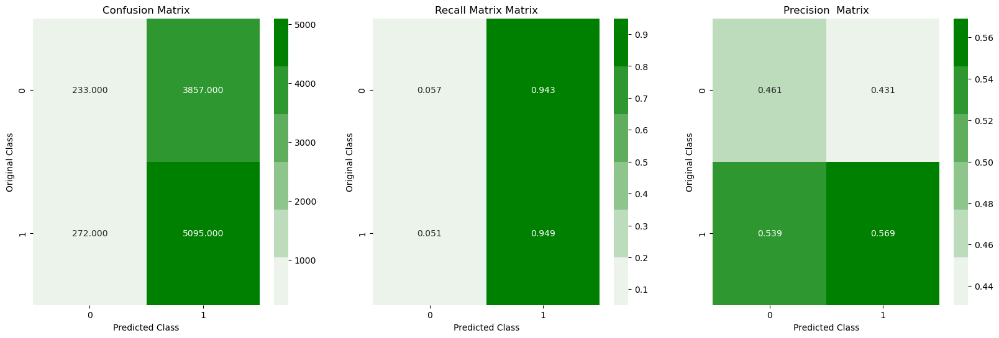



--- Test CM of naivebayes ---


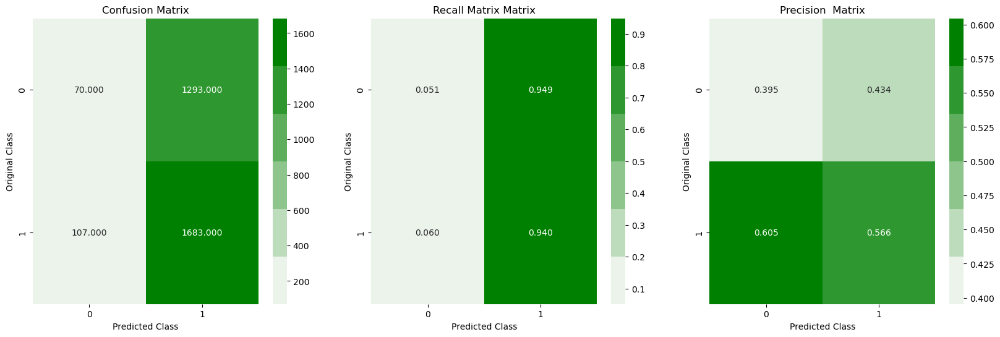

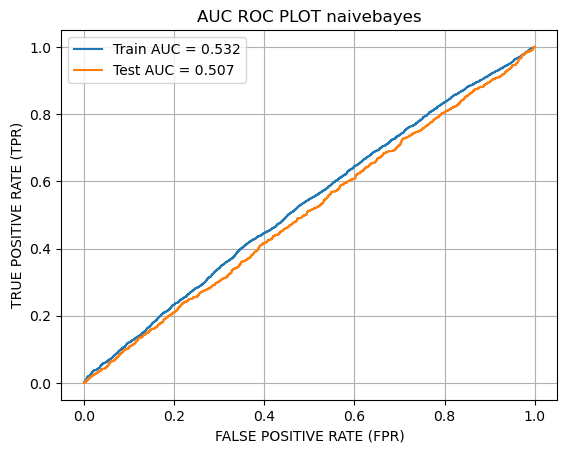

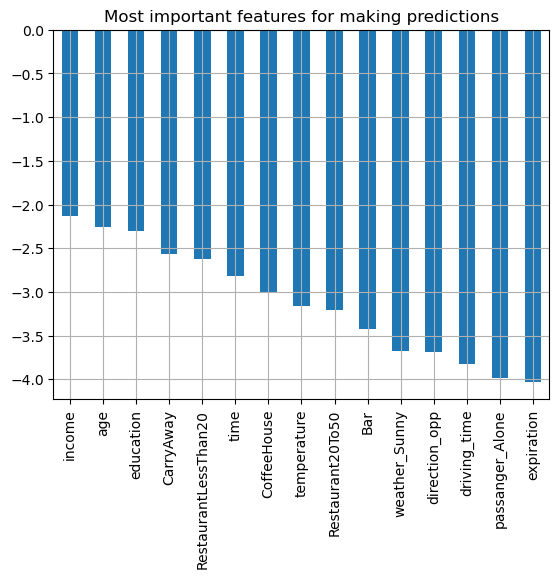

1it [01:19, 79.37s/it]

Train Auc Score--->  0.532
Test Auc Scoer --->  0.507
Train f1score is 0.7116 , precison is 0.5691 and recall is 0.9493 and log_loss is 15.0802
Test f1score is 0.7063 , precison is 0.5655 and recall is 0.9402 and loh loss is 15.3363


                 ------------------->   Set2   <-------------------               


--- Train CM of  naivebayes ---


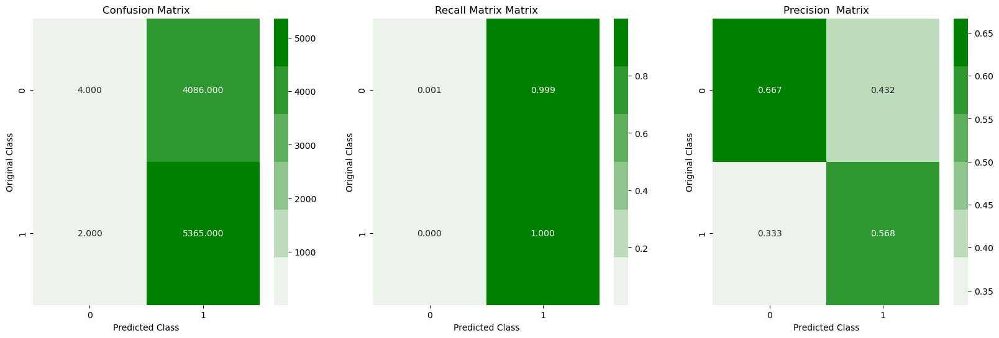



--- Test CM of naivebayes ---


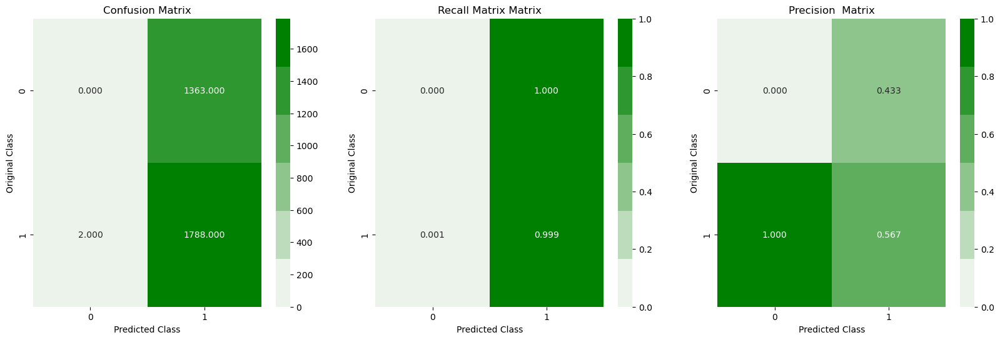

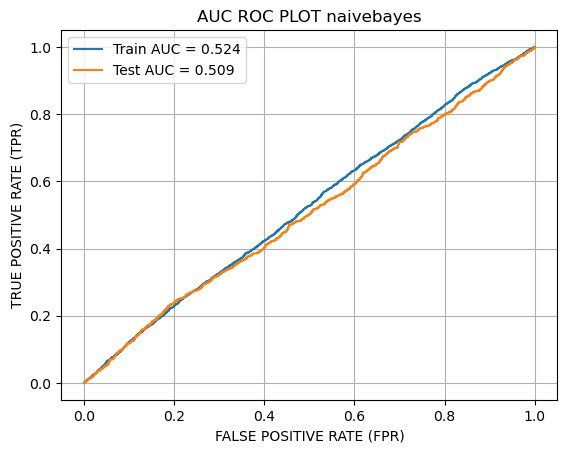

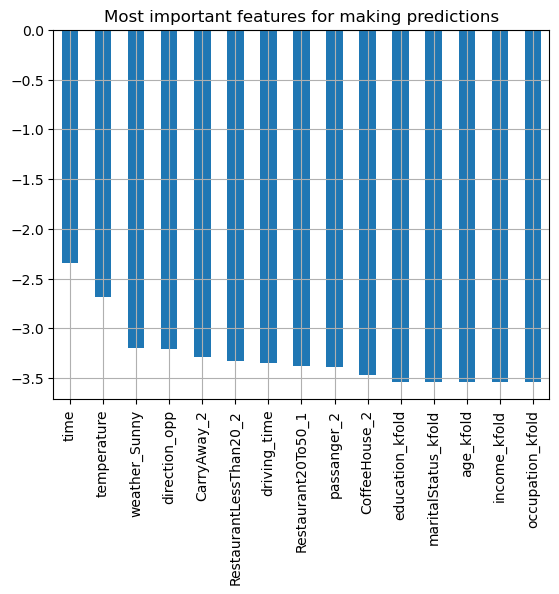

2it [01:24, 35.58s/it]

Train Auc Score--->  0.524
Test Auc Scoer --->  0.509
Train f1score is 0.7241 , precison is 0.5677 and recall is 0.9996 and log_loss is 14.9305
Test f1score is 0.7237 , precison is 0.5674 and recall is 0.9989 and loh loss is 14.9529


                 ------------------->   Set3   <-------------------               


--- Train CM of  naivebayes ---


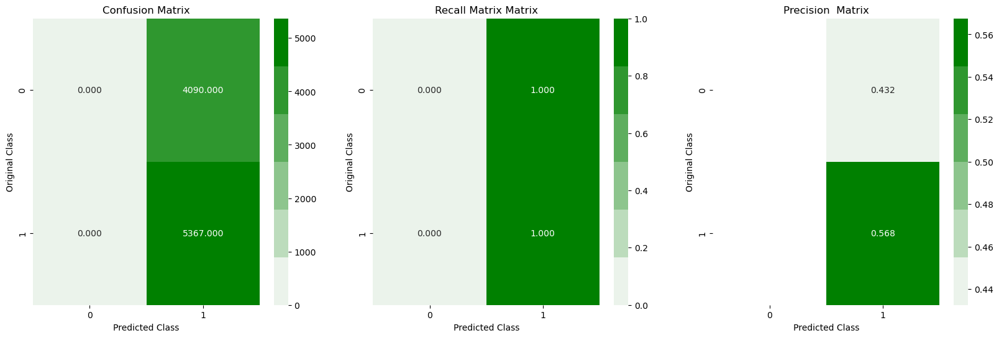



--- Test CM of naivebayes ---


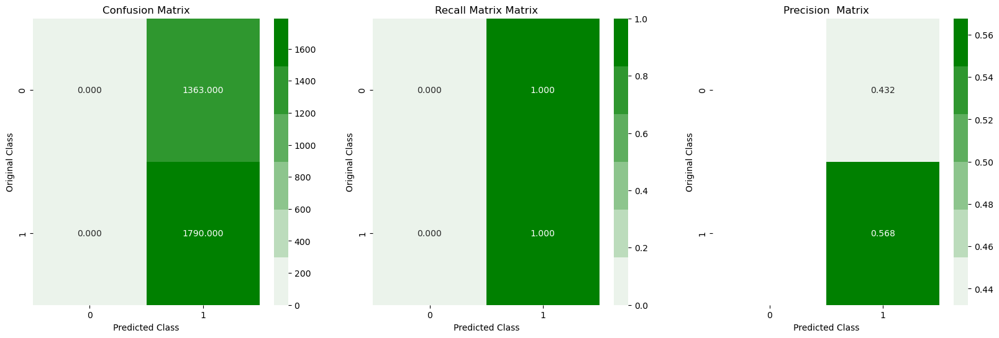

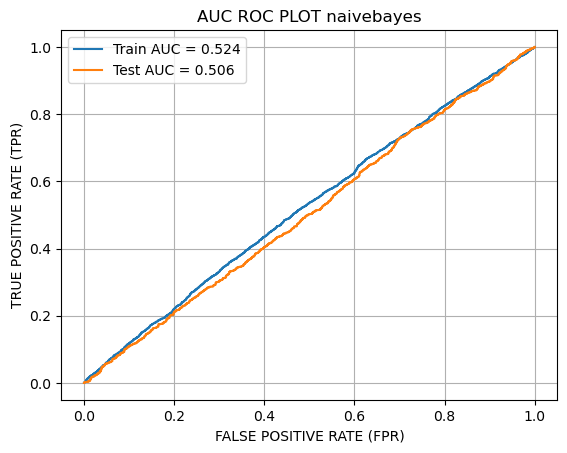

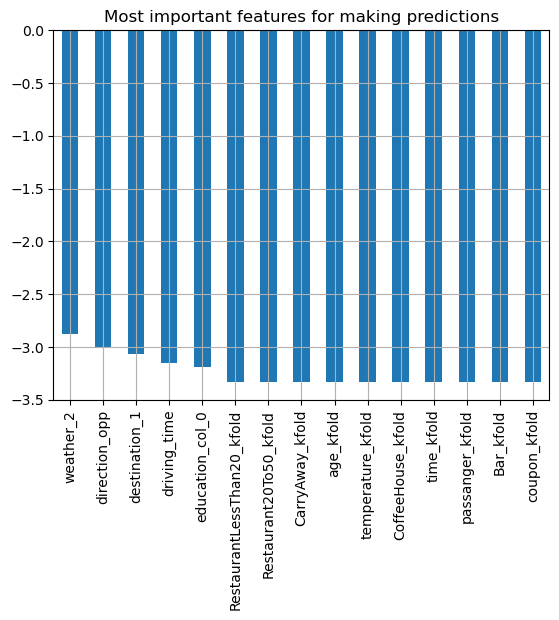

3it [01:29, 21.69s/it]

Train Auc Score--->  0.524
Test Auc Scoer --->  0.506
Train f1score is 0.7241 , precison is 0.5675 and recall is 1.0 and log_loss is 14.9378
Test f1score is 0.7243 , precison is 0.5677 and recall is 1.0 and loh loss is 14.931


                 ------------------->   Set4   <-------------------               


--- Train CM of  naivebayes ---


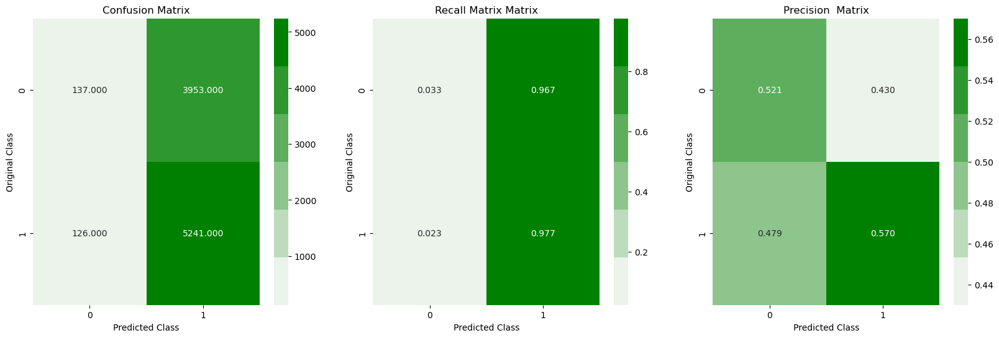



--- Test CM of naivebayes ---


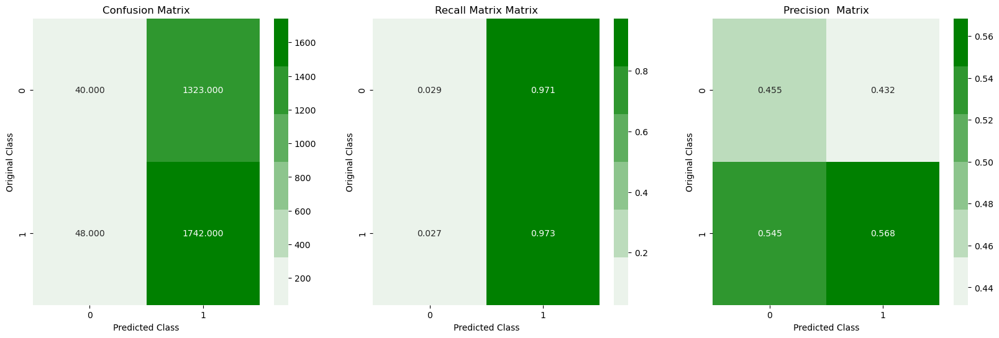

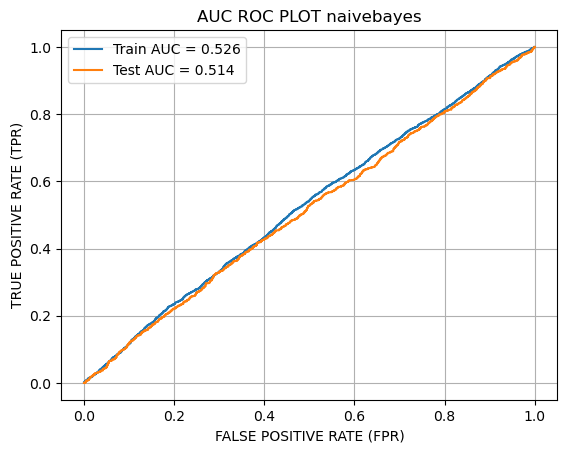

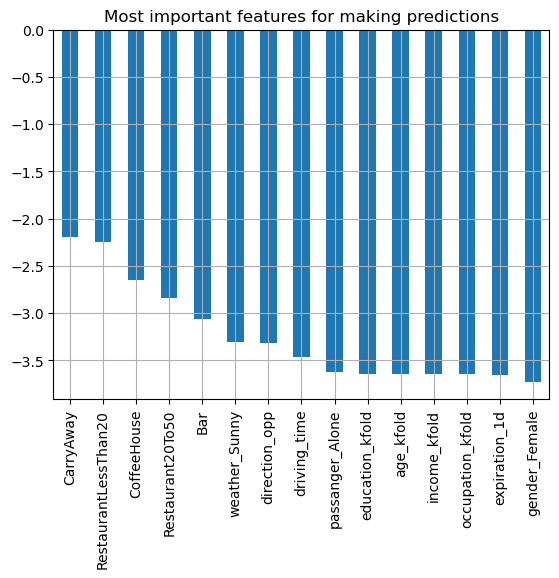

4it [01:32, 14.33s/it]

Train Auc Score--->  0.526
Test Auc Scoer --->  0.514
Train f1score is 0.7199 , precison is 0.57 and recall is 0.9765 and log_loss is 14.8976
Test f1score is 0.7176 , precison is 0.5684 and recall is 0.9732 and loh loss is 15.0186


                 ------------------->   Set5   <-------------------               


--- Train CM of  naivebayes ---


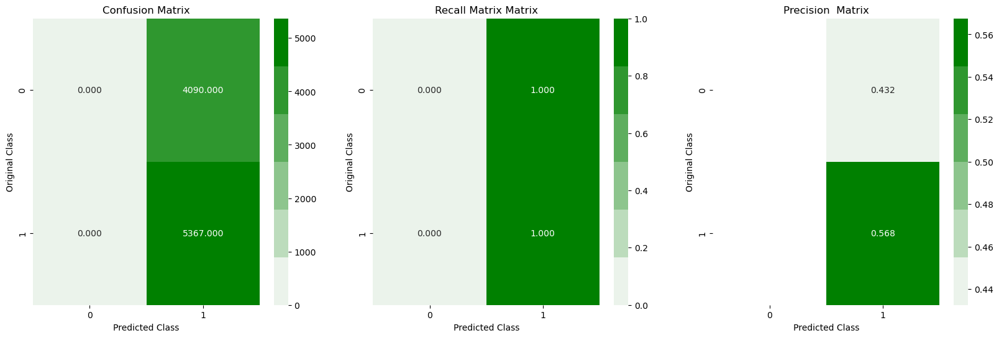



--- Test CM of naivebayes ---


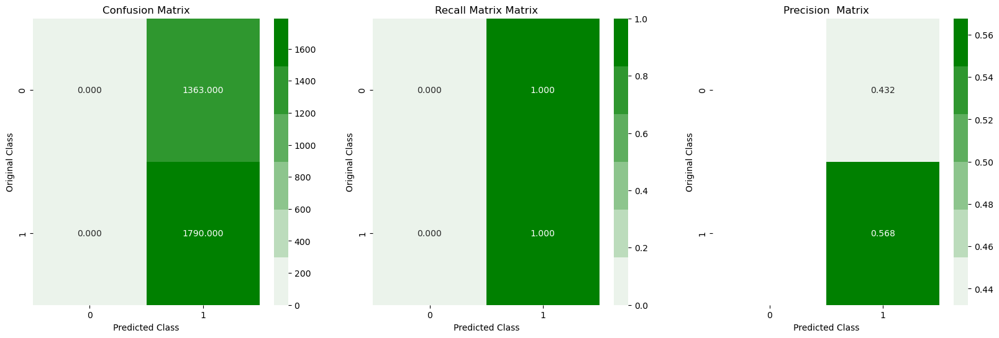

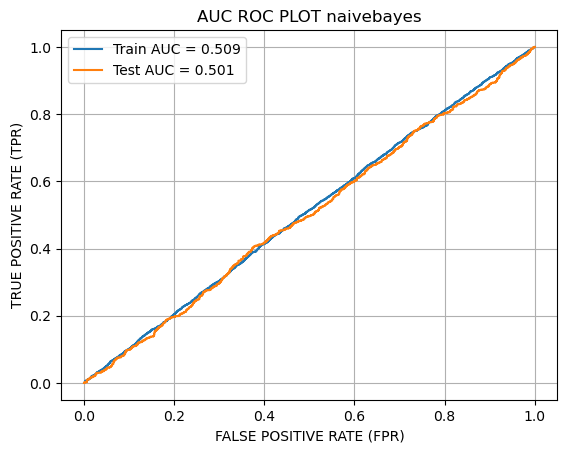

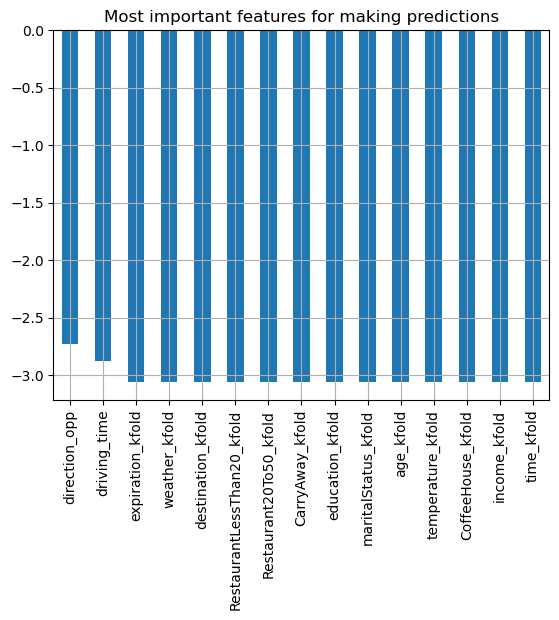

5it [01:35, 19.12s/it]

Train Auc Score--->  0.509
Test Auc Scoer --->  0.501
Train f1score is 0.7241 , precison is 0.5675 and recall is 1.0 and log_loss is 14.9378
Test f1score is 0.7243 , precison is 0.5677 and recall is 1.0 and loh loss is 14.931




In [141]:
algorthm = 'naivebayes'
mnb_train_f1score,mnb_train_precison,mnb_train_recall,mnb_train_log_loss,mnb_test_f1score,mnb_test_precison,\
    mnb_test_recall,mnb_test_log_loss ,mnb_train_auc,mnb_test_auc = set_performance(set_dict,y_train,y_test,'naivebayes')

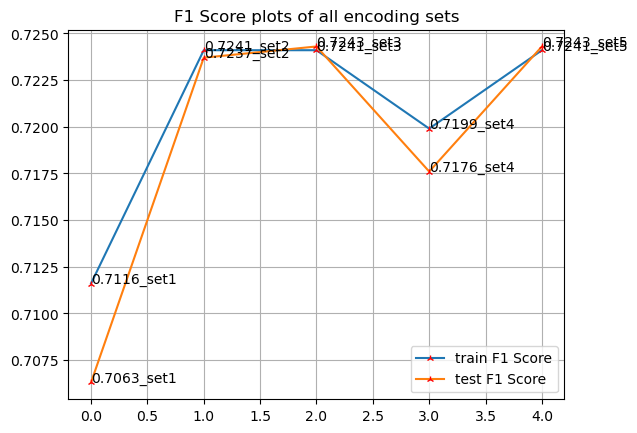

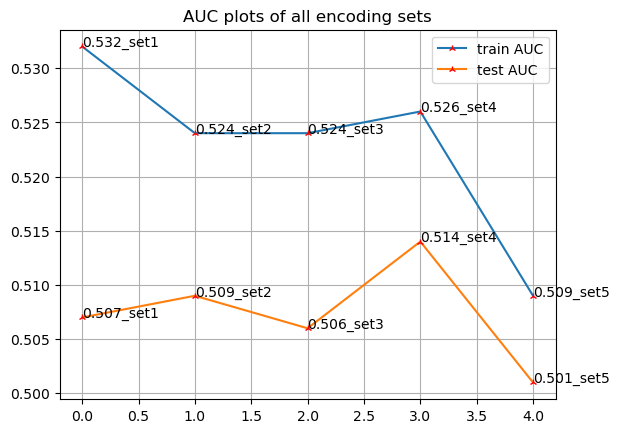

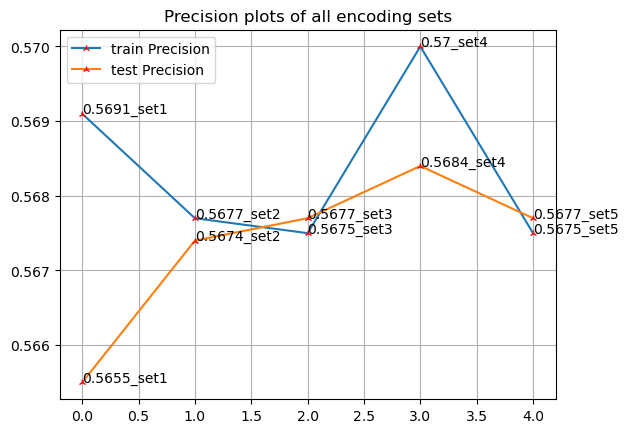

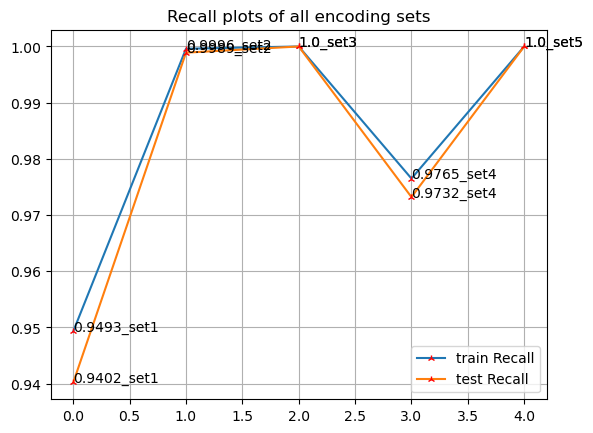

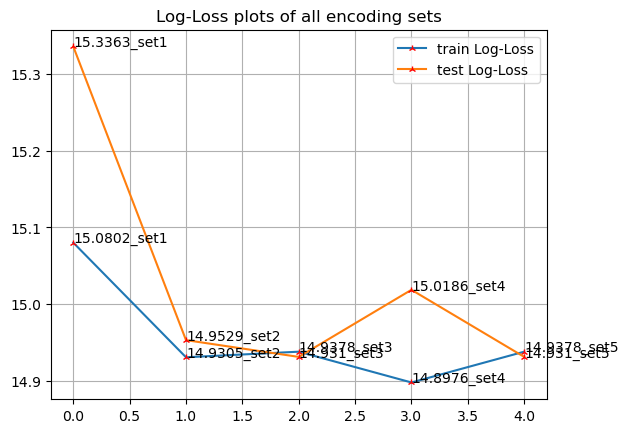

In [142]:
plots(mnb_train_f1score,mnb_test_f1score,'F1 Score')
plots(mnb_train_auc,mnb_test_auc,'AUC')
plots(mnb_train_precison,mnb_test_precison,'Precision')
plots(mnb_train_recall,mnb_test_recall,'Recall')
plots(mnb_train_log_loss,mnb_test_log_loss,'Log-Loss')

In [149]:

param_grid_nb = {'alpha': np.logspace(0,-9, num=100)}
mnb_clf = MultinomialNB()
gs_mnb,best_param_mnb,best_esti_mnb,best_score_mnb = hyperparametertuning(mnb_clf, param_grid_nb, set4_x_train , y_train,)

hyp_mnb_clf = MultinomialNB(alpha = best_param_mnb['alpha'])

hyp_mnb_clf.fit(set4_x_train,y_train)
hyp_mnb_train_pred = hyp_mnb_clf.predict(set4_x_train)
hyp_mnb_test_pred = hyp_mnb_clf.predict(set4_x_test)


hyp_mnb_tr_f1score,hyp_mnb_tr_precison,hyp_mnb_tr_recall,hyp_mnb_tr_log_loss = performance_matrices(y_train,hyp_mnb_train_pred)
hyp_mnb_te_f1score,hyp_mnb_te_precison,hyp_mnb_te_recall,hyp_mnb_te_log_loss = performance_matrices(y_test,hyp_mnb_test_pred)

hyp_mnb_tr_auc,hyp_mnb_te_auc = pred_auc_roc(hyp_mnb_clf,set4_x_train,set4_x_test,y_train,y_test,'mnb HYP',return_plot=False)

print('\n')
print('F1 score of train and test data after hyperparameter tuning ',hyp_mnb_tr_f1score,' , ',hyp_mnb_te_f1score)
print('AUC score of train and test data after hyperparameter tuning ',hyp_mnb_tr_auc,' , ',hyp_mnb_te_auc)

Fitting 3 folds for each of 100 candidates, totalling 300 fits
Best parameters are  {'alpha': 0.8111308307896871}
Best estimators are  MultinomialNB(alpha=0.8111308307896871)


F1 score of train and test data after hyperparameter tuning  0.7199  ,  0.7176
AUC score of train and test data after hyperparameter tuning  0.526  ,  0.514


#### 1
F1 score of train and test data after hyperparameter tuning  0.7117  ,  0.7065
AUC score of train and test data after hyperparameter tuning  0.532  ,  0.507


##### 3-----
F1 score of train and test data after hyperparameter tuning  0.7241  ,  0.7243
AUC score of train and test data after hyperparameter tuning  0.524  ,  0.506

## 4
F1 score of train and test data after hyperparameter tuning  0.7199  ,  0.7176
AUC score of train and test data after hyperparameter tuning  0.526  ,  0.514

In [151]:
table('NAVIVE-BAYES','SET4',mnb_train_auc,mnb_test_auc,mnb_train_f1score,mnb_test_f1score,mnb_train_precison,\
      mnb_test_precison,mnb_train_recall,mnb_test_recall,mnb_train_log_loss,mnb_test_log_loss,\
     hyp_mnb_tr_auc,hyp_mnb_te_auc,hyp_mnb_tr_f1score,hyp_mnb_te_f1score,\
    hyp_mnb_tr_precison,hyp_mnb_te_precison,hyp_mnb_tr_recall,hyp_mnb_te_recall,hyp_mnb_tr_log_loss,hyp_mnb_te_log_loss)

,Set,OHE encoded features,Ordinal encoded features,K-Fold Target encoded features,Binary encoded features,Hashing encoded features,Train AUC,Test AUC,Train f1 Score,Test f1 Score,Train Precision,Test Precision,Train recall,Test recall,Train log loss,Test log loss
0,Set 1,"['destination', 'passanger', 'weather', 'coupo...","['age', 'time', 'expiration', 'income', 'tempe...",None,None,None,0.532,0.507,0.7116,0.7063,0.5691,0.5655,0.9493,0.9402,15.0802,15.3363
1,Set 2,"['gender', 'destination', 'weather']","['expiration', 'temperature', 'time']","['income', 'occupation', 'age', 'education', '...","['passanger', 'CarryAway', 'CoffeeHouse', 'Res...",None,0.524,0.509,0.7241,0.7237,0.5677,0.5674,0.9996,0.9989,14.9305,14.9529
2,SET 3,None,None,"['time', 'temperature', 'coupon', 'passanger',...","['destination', 'weather', 'gender', 'expirati...","['occupation', 'income', 'education', 'marital...",0.524,0.506,0.7241,0.7243,0.5675,0.5677,1.0000,1.0000,14.9378,14.9310
3,SET 4,"['destination', 'passanger', 'weather', 'tempe...","['CarryAway', 'CoffeeHouse', 'RestaurantLessTh...","['education', 'occupation', 'age', 'income']",None,None,0.526,0.514,0.7199,0.7176,0.5700,0.5684,0.9765,0.9732,14.8976,15.0186
4,SET 5,None,None,"['education', 'occupation', 'age', 'income', '...",None,None,0.509,0.501,0.7241,0.7243,0.5675,0.5677,1.0000,1.0000,14.9378,14.9310
5,Hyperparamere Tuned OnSET4,SET4,SET4,SET4,SET4,SET4,0.526,0.514,0.7199,0.7176,0.5701,0.5684,0.9765,0.9732,14.8940,15.0186


## 3.6 Decision trees

          ====================               decisontree            ====================             


0it [00:00, ?it/s]

                 ------------------->   Set1   <-------------------               


--- Train CM of  decisontree ---


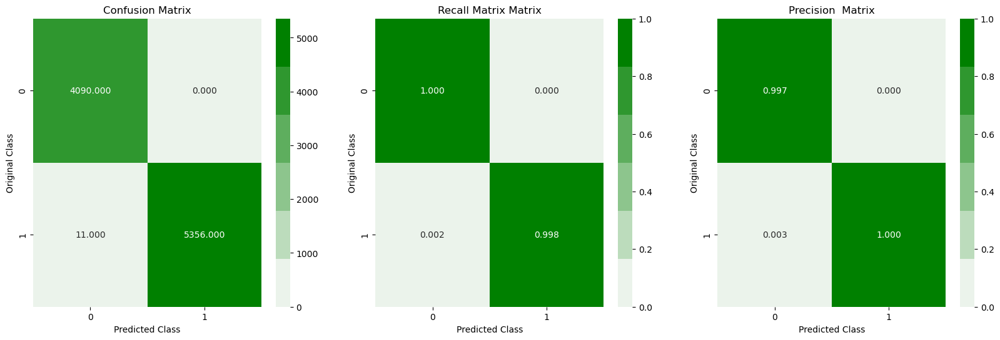



--- Test CM of decisontree ---


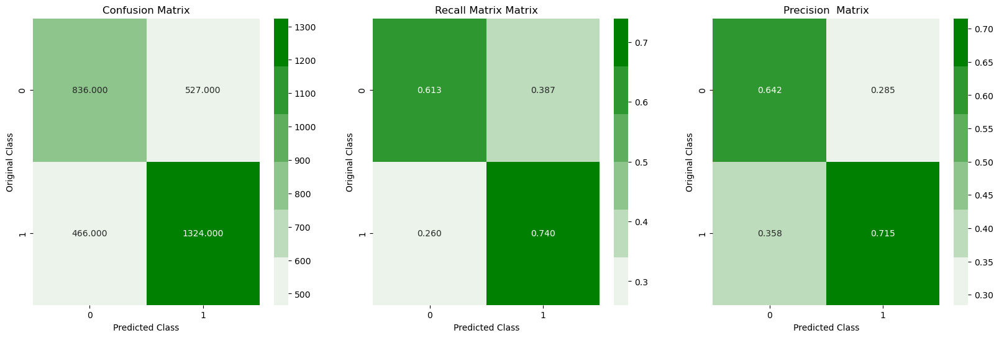

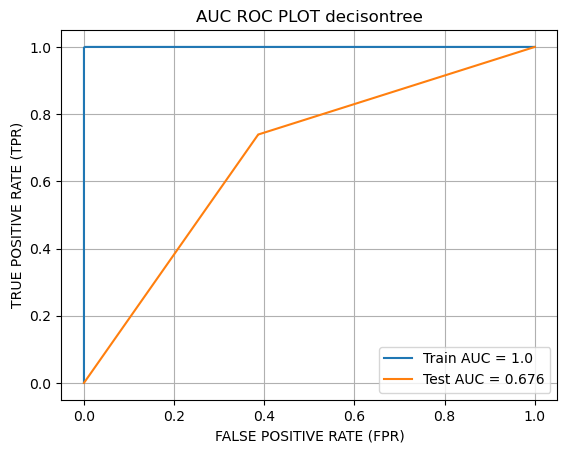

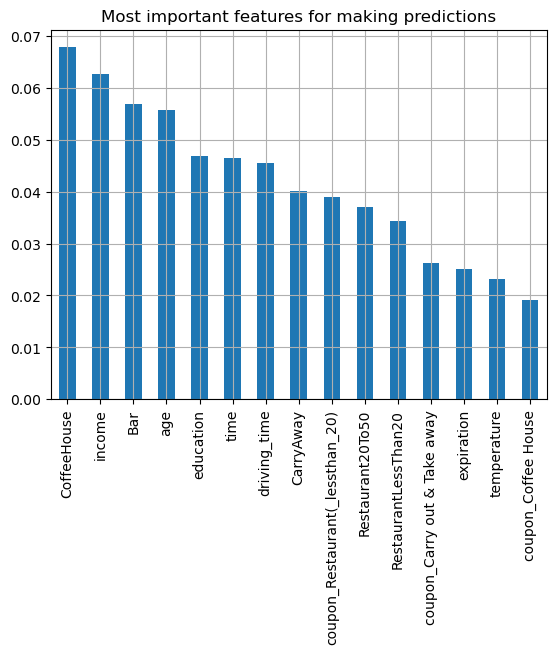

1it [00:01,  1.52s/it]

Train Auc Score--->  1.0
Test Auc Scoer --->  0.676
Train f1score is 0.999 , precison is 1.0 and recall is 0.998 and log_loss is 0.0402
Test f1score is 0.7273 , precison is 0.7153 and recall is 0.7397 and loh loss is 10.8777


                 ------------------->   Set2   <-------------------               


--- Train CM of  decisontree ---


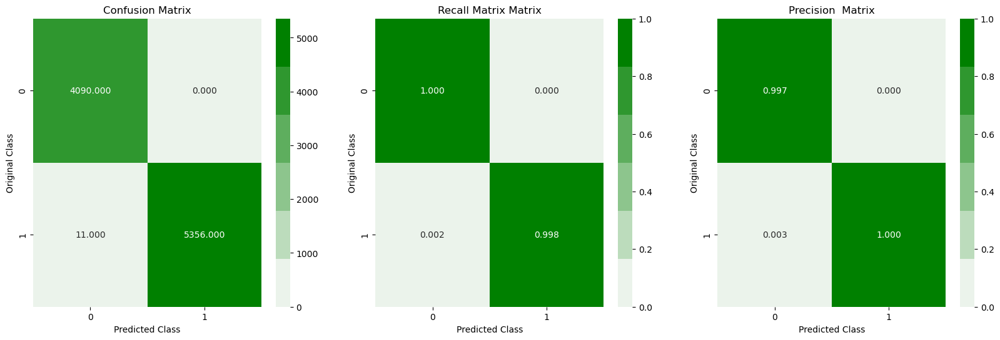



--- Test CM of decisontree ---


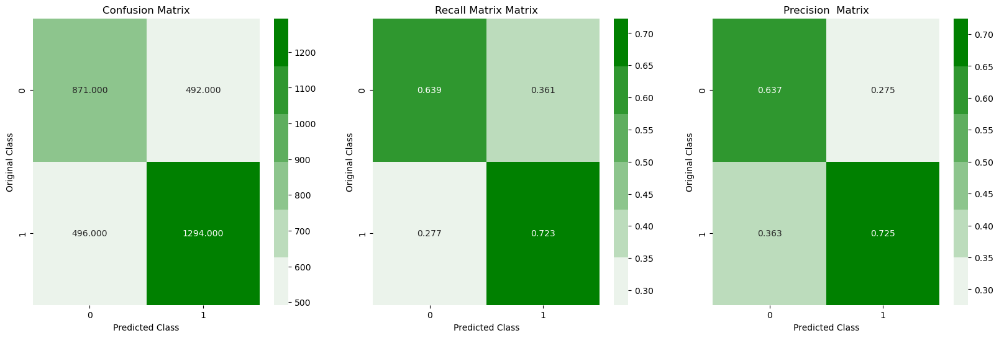

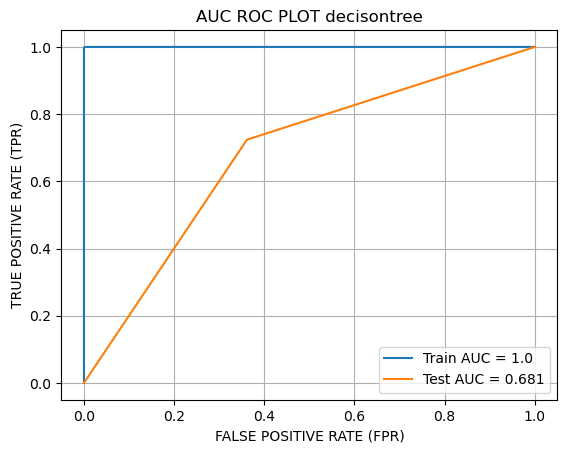

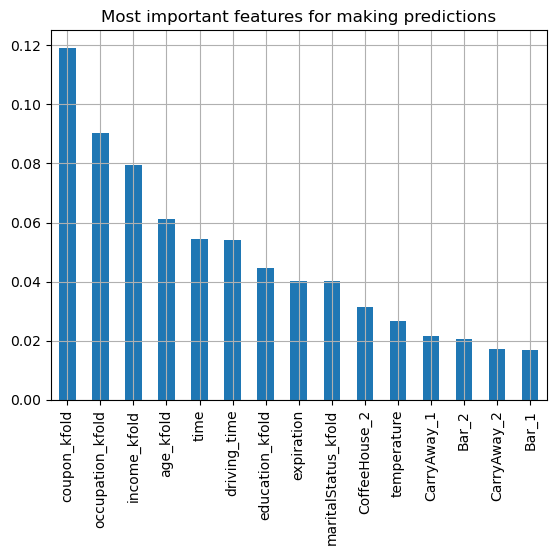

2it [00:03,  1.57s/it]

Train Auc Score--->  1.0
Test Auc Scoer --->  0.681
Train f1score is 0.999 , precison is 1.0 and recall is 0.998 and log_loss is 0.0402
Test f1score is 0.7237 , precison is 0.7245 and recall is 0.7229 and loh loss is 10.8229


                 ------------------->   Set3   <-------------------               


--- Train CM of  decisontree ---


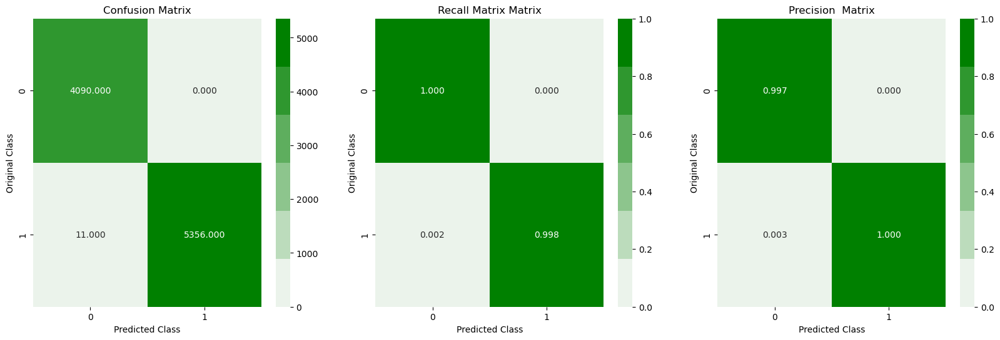



--- Test CM of decisontree ---


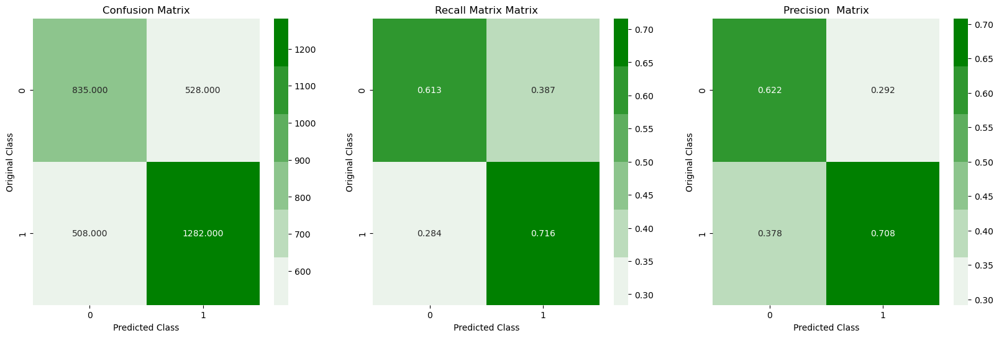

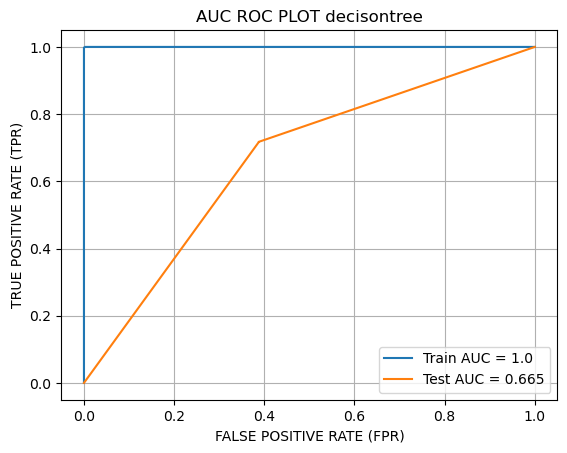

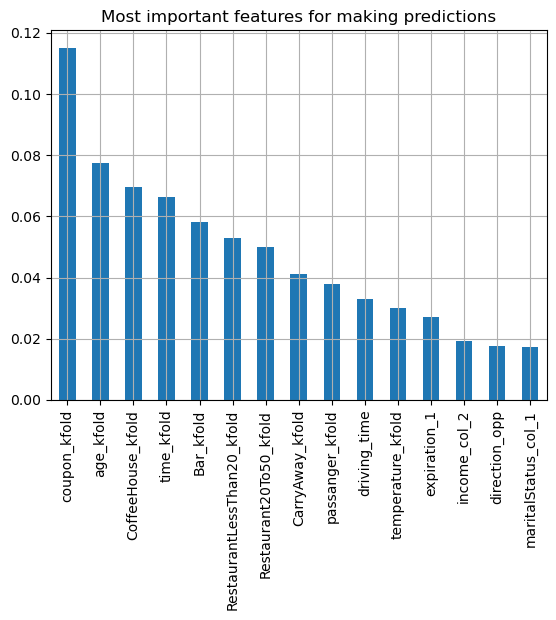

3it [00:04,  1.53s/it]

Train Auc Score--->  1.0
Test Auc Scoer --->  0.665
Train f1score is 0.999 , precison is 1.0 and recall is 0.998 and log_loss is 0.0402
Test f1score is 0.7122 , precison is 0.7083 and recall is 0.7162 and loh loss is 11.3487


                 ------------------->   Set4   <-------------------               


--- Train CM of  decisontree ---


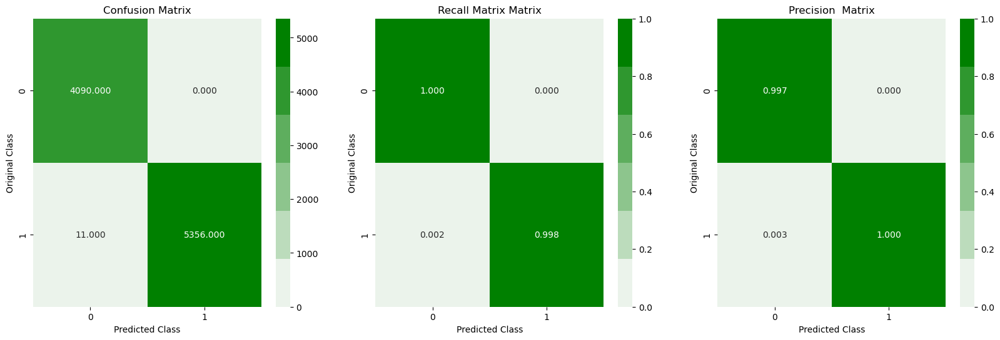



--- Test CM of decisontree ---


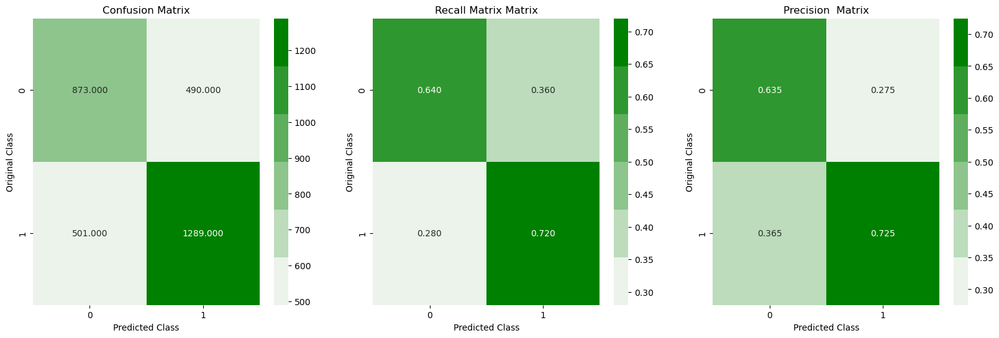

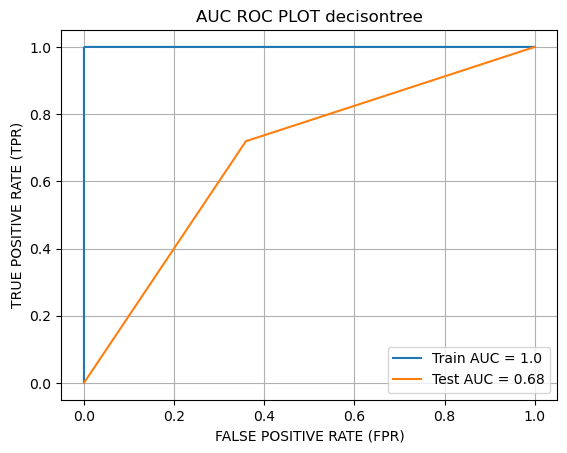

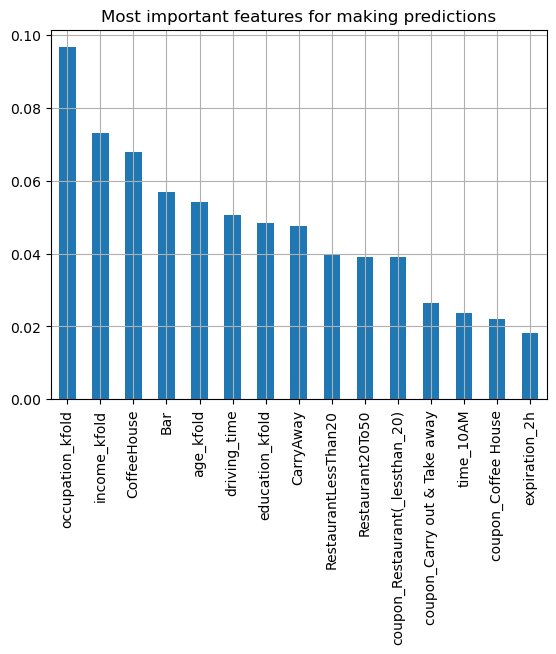

4it [00:06,  1.54s/it]

Train Auc Score--->  1.0
Test Auc Scoer --->  0.68
Train f1score is 0.999 , precison is 1.0 and recall is 0.998 and log_loss is 0.0402
Test f1score is 0.7223 , precison is 0.7246 and recall is 0.7201 and loh loss is 10.8558


                 ------------------->   Set5   <-------------------               


--- Train CM of  decisontree ---


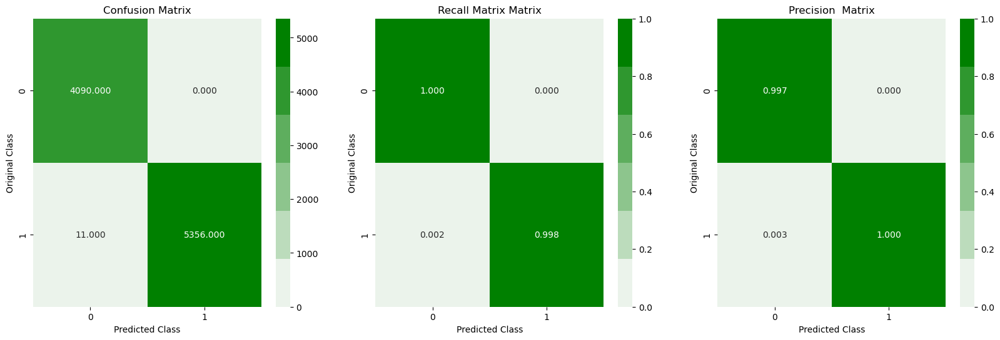



--- Test CM of decisontree ---


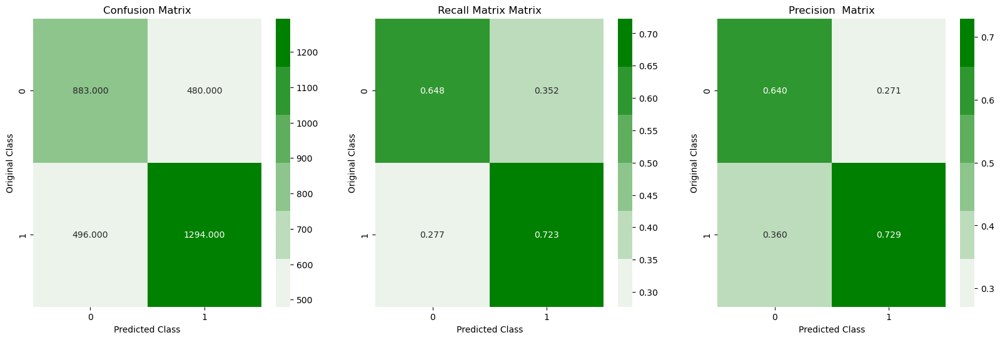

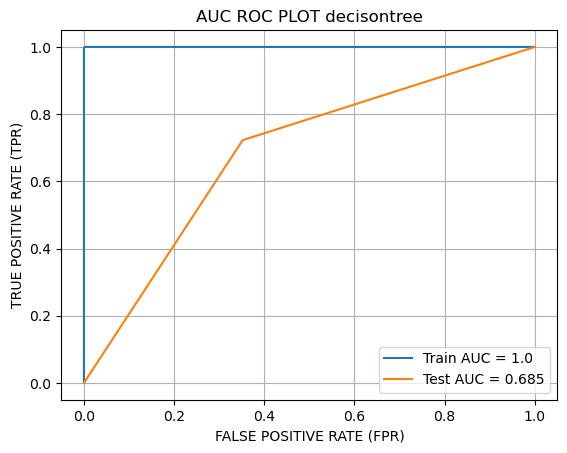

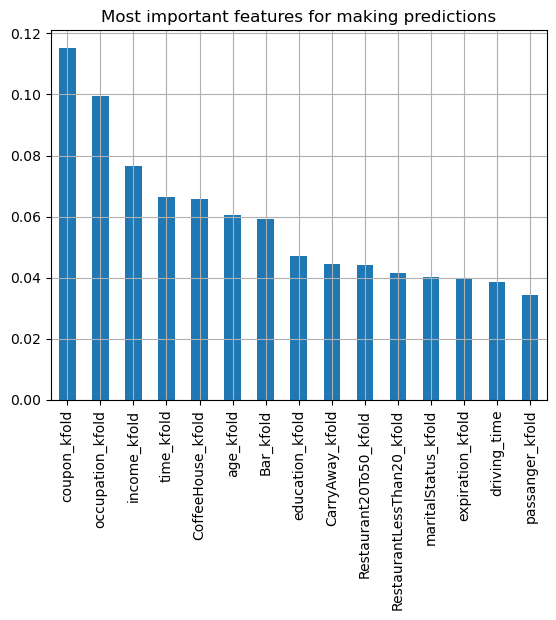

5it [00:07,  1.55s/it]

Train Auc Score--->  1.0
Test Auc Scoer --->  0.685
Train f1score is 0.999 , precison is 1.0 and recall is 0.998 and log_loss is 0.0402
Test f1score is 0.7262 , precison is 0.7294 and recall is 0.7229 and loh loss is 10.6915




In [58]:
algorthm = 'decisontree'
dt_train_f1score,dt_train_precison,dt_train_recall,dt_train_log_loss,dt_test_f1score,dt_test_precison,\
    dt_test_recall,dt_test_log_loss ,dt_train_auc,dt_test_auc = set_performance(set_dict,y_train,y_test,'decisontree')

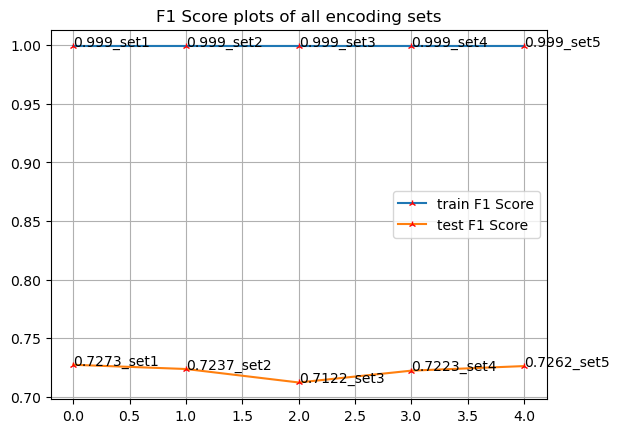

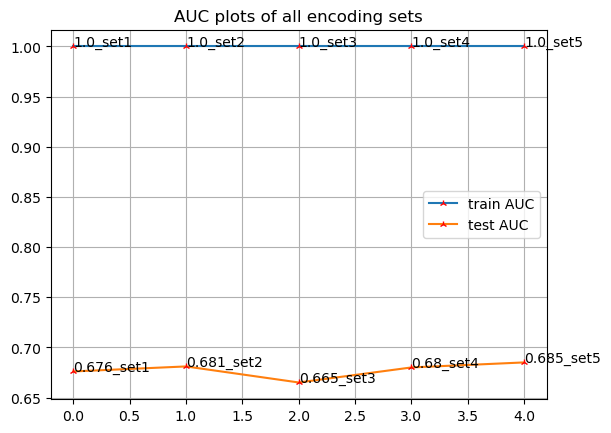

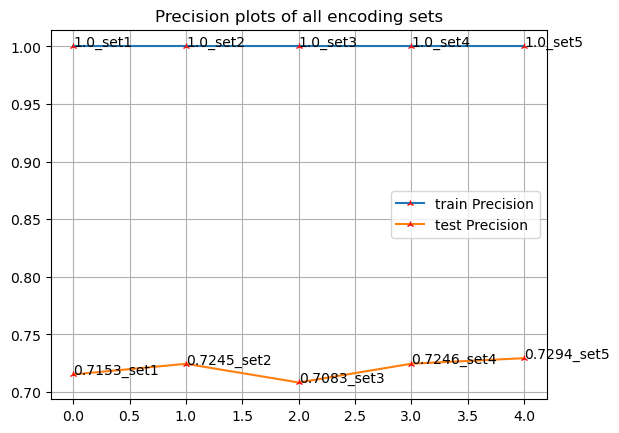

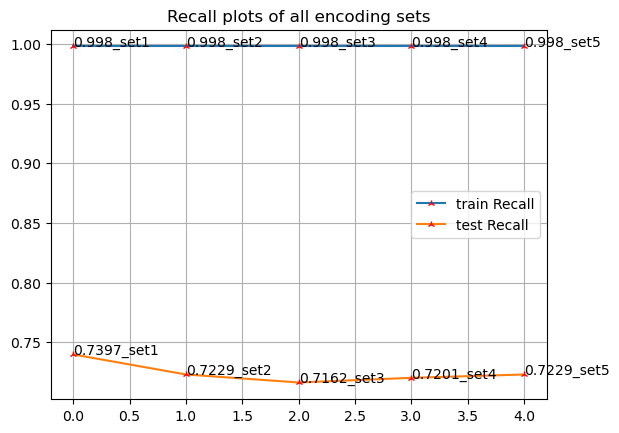

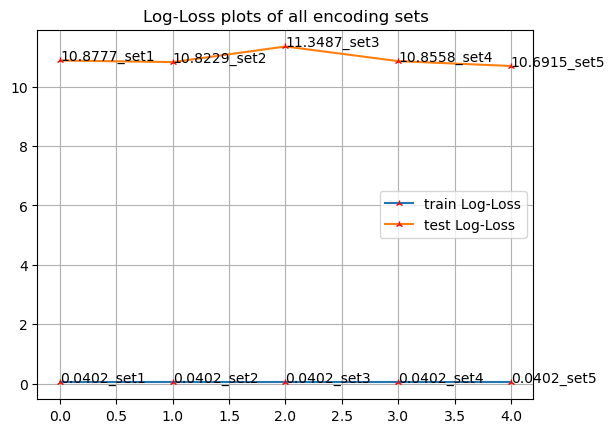

In [59]:
plots(dt_train_f1score,dt_test_f1score,'F1 Score')
plots(dt_train_auc,dt_test_auc,'AUC')
plots(dt_train_precison,dt_test_precison,'Precision')
plots(dt_train_recall,dt_test_recall,'Recall')
plots(dt_train_log_loss,dt_test_log_loss,'Log-Loss')

Overfitting , Choose set5 because has the best performance on test data for it

#### 3.6.1 Hyperparameter tuining Decision Tree

In [64]:
params = {
    'max_depth':[3,5,7,10,12,15,20],
          'min_samples_leaf':[3,5,10,12,16,18,20,22,24,26],
          'min_samples_split':[4,8,10,12,18,20,16,22,24,26],
          'criterion':['gini','entropy']
}
dt_clf = DecisionTreeClassifier(random_state=55)
gs_dt,best_param_dt,best_esti_dt,best_score_dt = hyperparametertuning(dt_clf, params, set5_x_train , y_train,)


hyp_dt_clf = DecisionTreeClassifier(criterion=best_param_dt['criterion'], max_depth=best_param_dt['max_depth'],\
                                min_samples_leaf=best_param_dt['min_samples_leaf'],
                       min_samples_split=best_param_dt['min_samples_split'], random_state=55)


hyp_dt_clf.fit(set5_x_train,y_train)

hyp_dt_train_pred = hyp_dt_clf.predict(set5_x_train)
hyp_dt_test_pred = hyp_dt_clf.predict(set5_x_test)


hyp_dt_tr_f1score,hyp_dt_tr_precison,hyp_dt_tr_recall,hyp_dt_tr_log_loss = performance_matrices(y_train,hyp_dt_train_pred)
hyp_dt_te_f1score,hyp_dt_te_precison,hyp_dt_te_recall,hyp_dt_te_log_loss = performance_matrices(y_test,hyp_dt_test_pred)

hyp_dt_tr_auc,hyp_dt_te_auc = pred_auc_roc(hyp_dt_clf,set5_x_train,set5_x_test,y_train,y_test,'DT HYP',return_plot=False)


print('\n')
print('F1 score of train and test data after hyperparameter tuning ',hyp_dt_tr_f1score,' , ',hyp_dt_te_f1score)
print('AUC score of train and test data after hyperparameter tuning ',hyp_dt_tr_auc,' , ',hyp_dt_te_auc)


Fitting 3 folds for each of 100 candidates, totalling 300 fits
Best parameters are  {'min_samples_split': 26, 'min_samples_leaf': 22, 'max_depth': 10, 'criterion': 'gini'}
Best estimators are  DecisionTreeClassifier(max_depth=10, min_samples_leaf=22, min_samples_split=26,
                       random_state=55)


F1 score of train and test data after hyperparameter tuning  0.7909  ,  0.7372
AUC score of train and test data after hyperparameter tuning  0.839  ,  0.755


In [65]:
table('Decision Tree','SET5',dt_train_auc,dt_test_auc,dt_train_f1score,dt_test_f1score,dt_train_precison,\
      dt_test_precison,dt_train_recall,dt_test_recall,dt_train_log_loss,dt_test_log_loss,\
     hyp_dt_tr_auc,hyp_dt_te_auc,hyp_dt_tr_f1score,hyp_dt_te_f1score,\
    hyp_dt_tr_precison,hyp_dt_te_precison,hyp_dt_tr_recall,hyp_dt_te_recall,hyp_dt_tr_log_loss,hyp_dt_te_log_loss)

,Set,OHE encoded features,Ordinal encoded features,K-Fold Target encoded features,Binary encoded features,Hashing encoded features,Train AUC,Test AUC,Train f1 Score,Test f1 Score,Train Precision,Test Precision,Train recall,Test recall,Train log loss,Test log loss
0,Set 1,"['destination', 'passanger', 'weather', 'coupo...","['age', 'time', 'expiration', 'income', 'tempe...",None,None,None,1.000,0.676,0.9990,0.7273,1.0000,0.7153,0.998,0.7397,0.0402,10.8777
1,Set 2,"['gender', 'destination', 'weather']","['expiration', 'temperature', 'time']","['income', 'occupation', 'age', 'education', '...","['passanger', 'CarryAway', 'CoffeeHouse', 'Res...",None,1.000,0.681,0.9990,0.7237,1.0000,0.7245,0.998,0.7229,0.0402,10.8229
2,SET 3,None,None,"['time', 'temperature', 'coupon', 'passanger',...","['destination', 'weather', 'gender', 'expirati...","['occupation', 'income', 'education', 'marital...",1.000,0.665,0.9990,0.7122,1.0000,0.7083,0.998,0.7162,0.0402,11.3487
3,SET 4,"['destination', 'passanger', 'weather', 'tempe...","['CarryAway', 'CoffeeHouse', 'RestaurantLessTh...","['education', 'occupation', 'age', 'income']",None,None,1.000,0.680,0.9990,0.7223,1.0000,0.7246,0.998,0.7201,0.0402,10.8558
4,SET 5,None,None,"['education', 'occupation', 'age', 'income', '...",None,None,1.000,0.685,0.9990,0.7262,1.0000,0.7294,0.998,0.7229,0.0402,10.6915
5,Hyperparamere Tuned OnSET5,SET5,SET5,SET5,SET5,SET5,0.839,0.755,0.7909,0.7372,0.7755,0.7135,0.807,0.7626,8.3636,10.6586


## 3.7 Random Forest

          ====================               randomforest            ====================             


0it [00:00, ?it/s]

                 ------------------->   Set1   <-------------------               


--- Train CM of  randomforest ---


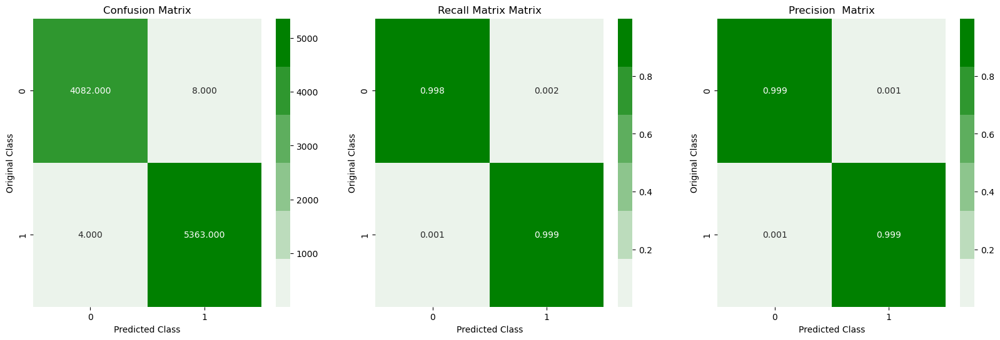



--- Test CM of randomforest ---


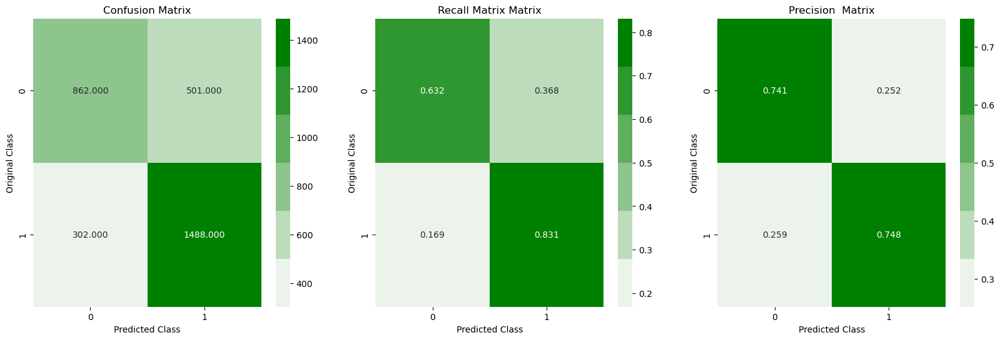

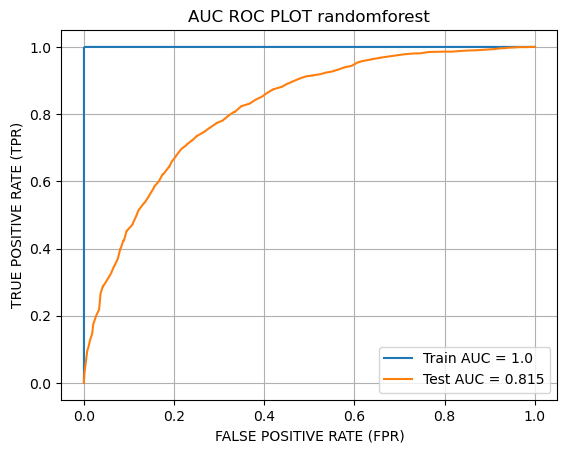

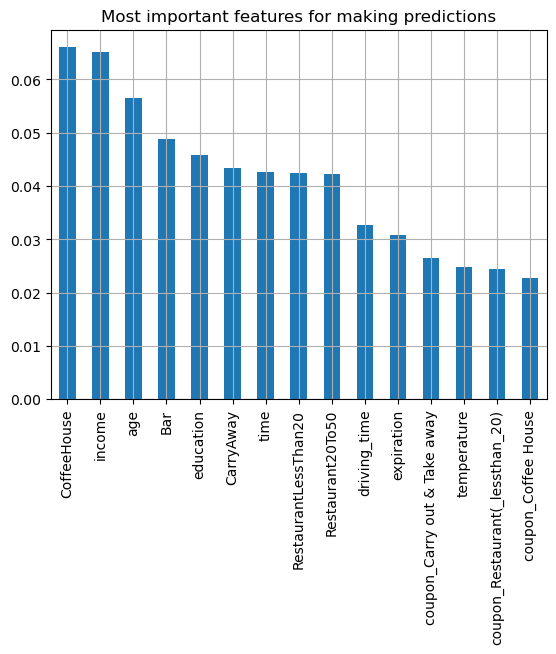

1it [00:05,  5.09s/it]

Train Auc Score--->  1.0
Test Auc Scoer --->  0.815
Train f1score is 0.9989 , precison is 0.9985 and recall is 0.9993 and log_loss is 0.0438
Test f1score is 0.7875 , precison is 0.7481 and recall is 0.8313 and loh loss is 8.7964


                 ------------------->   Set2   <-------------------               


--- Train CM of  randomforest ---


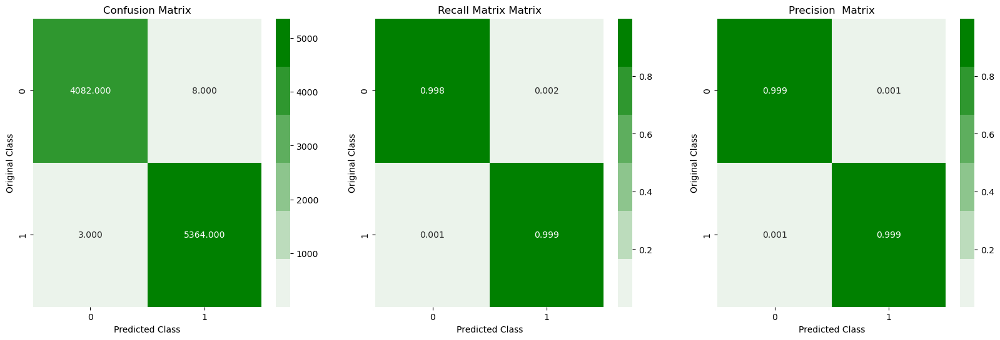



--- Test CM of randomforest ---


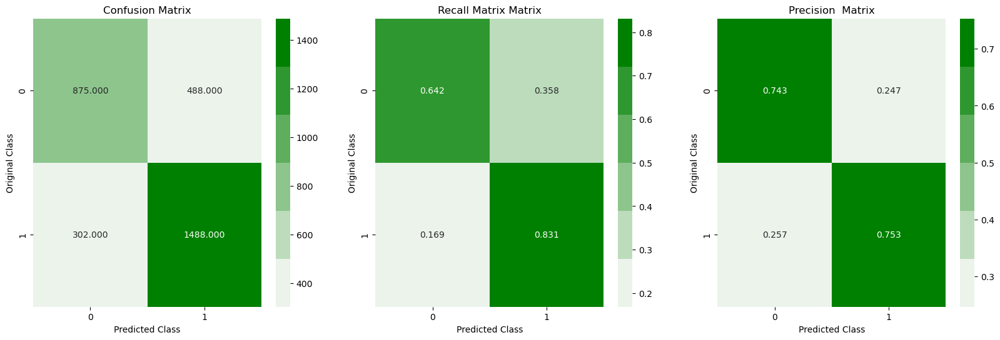

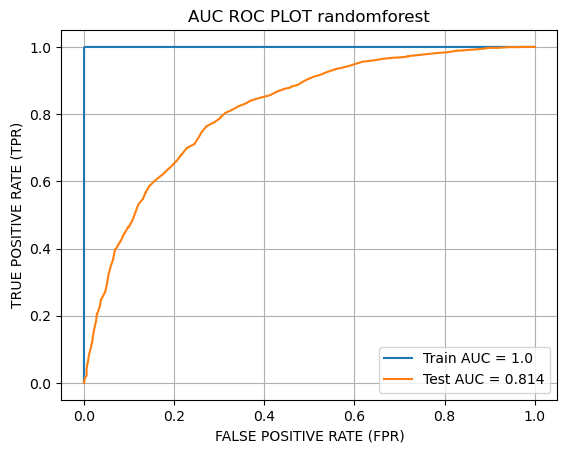

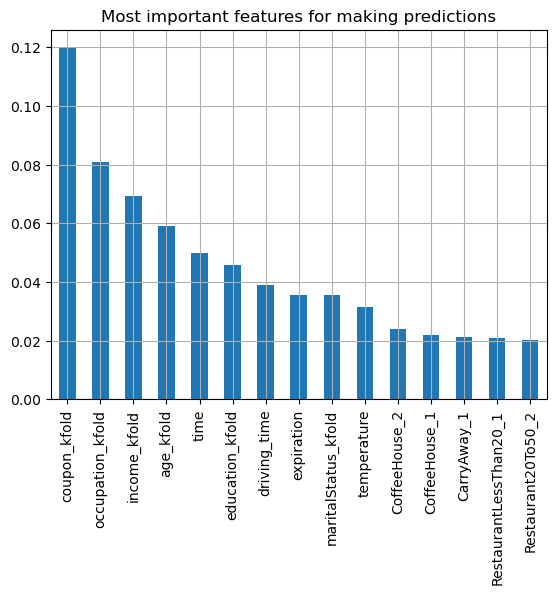

2it [00:08,  3.94s/it]

Train Auc Score--->  1.0
Test Auc Scoer --->  0.814
Train f1score is 0.999 , precison is 0.9985 and recall is 0.9994 and log_loss is 0.0402
Test f1score is 0.7902 , precison is 0.753 and recall is 0.8313 and loh loss is 8.654


                 ------------------->   Set3   <-------------------               


--- Train CM of  randomforest ---


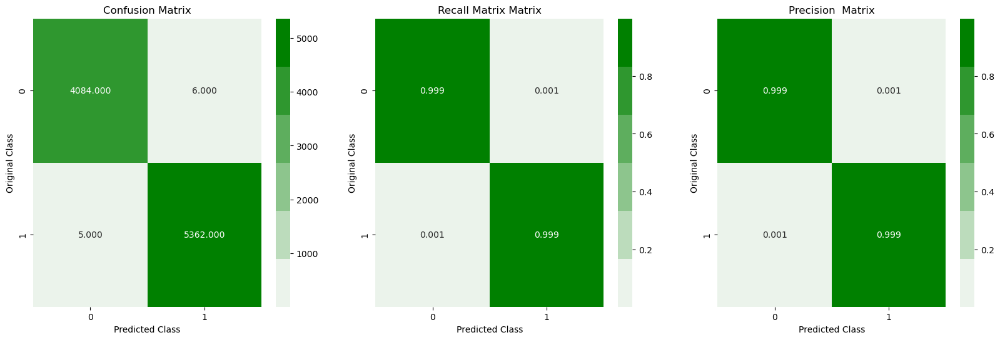



--- Test CM of randomforest ---


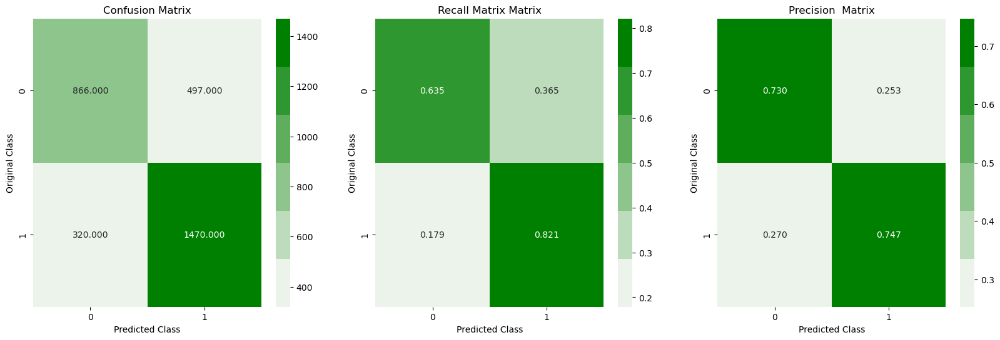

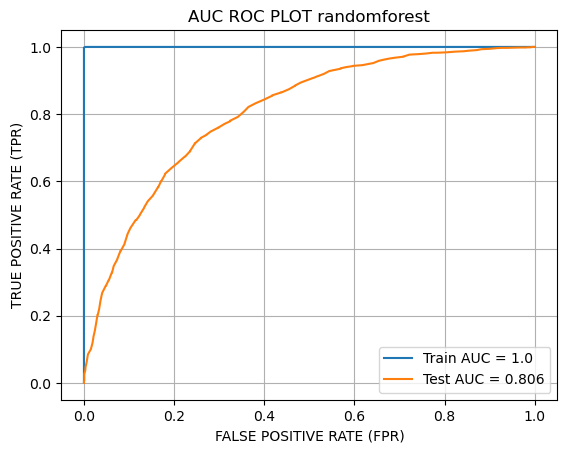

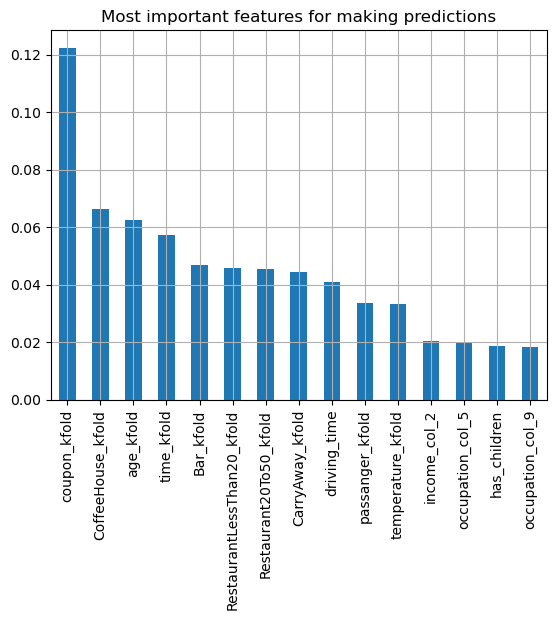

3it [00:11,  3.57s/it]

Train Auc Score--->  1.0
Test Auc Scoer --->  0.806
Train f1score is 0.999 , precison is 0.9989 and recall is 0.9991 and log_loss is 0.0402
Test f1score is 0.7825 , precison is 0.7473 and recall is 0.8212 and loh loss is 8.9498


                 ------------------->   Set4   <-------------------               


--- Train CM of  randomforest ---


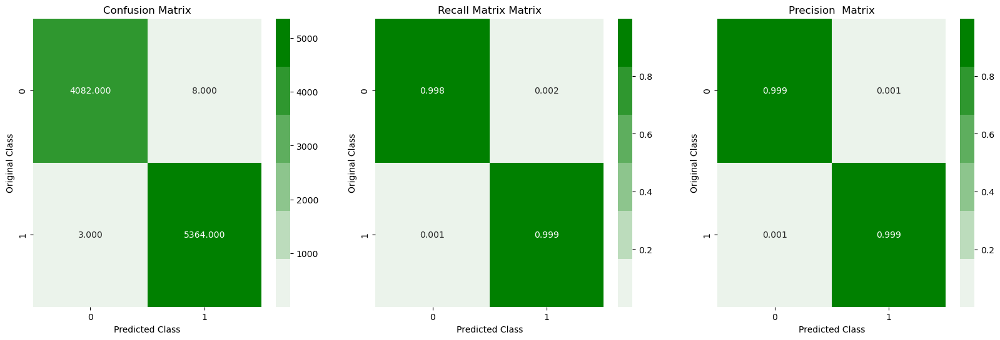



--- Test CM of randomforest ---


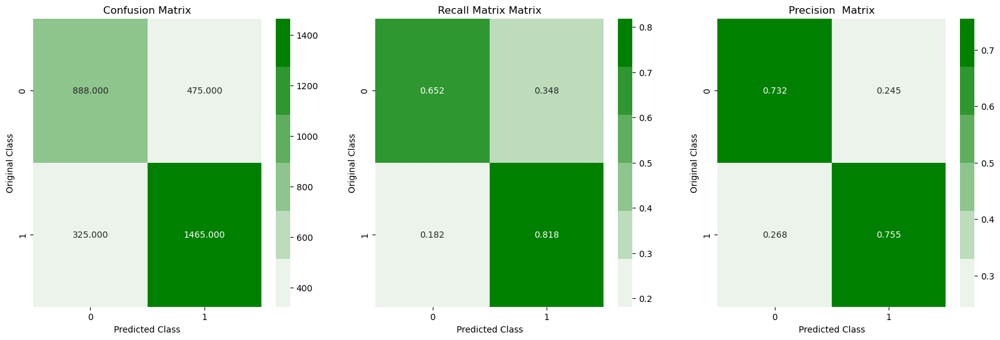

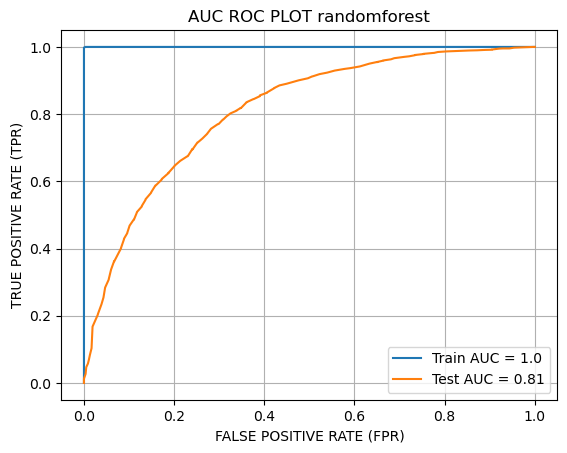

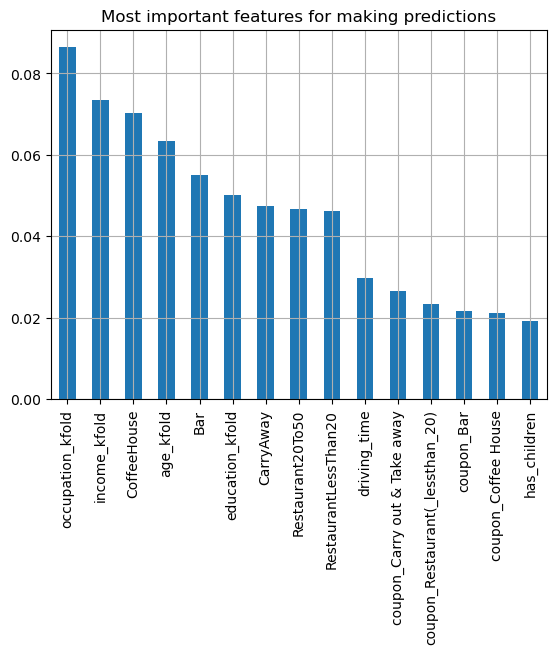

4it [00:14,  3.35s/it]

Train Auc Score--->  1.0
Test Auc Scoer --->  0.81
Train f1score is 0.999 , precison is 0.9985 and recall is 0.9994 and log_loss is 0.0402
Test f1score is 0.7855 , precison is 0.7552 and recall is 0.8184 and loh loss is 8.7635


                 ------------------->   Set5   <-------------------               


--- Train CM of  randomforest ---


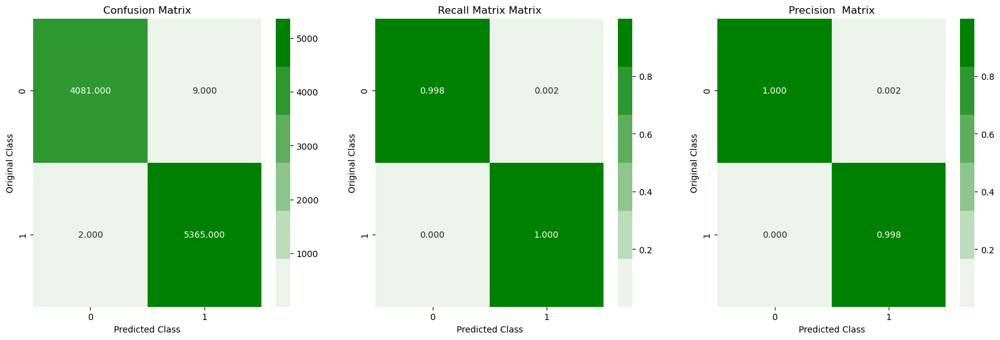



--- Test CM of randomforest ---


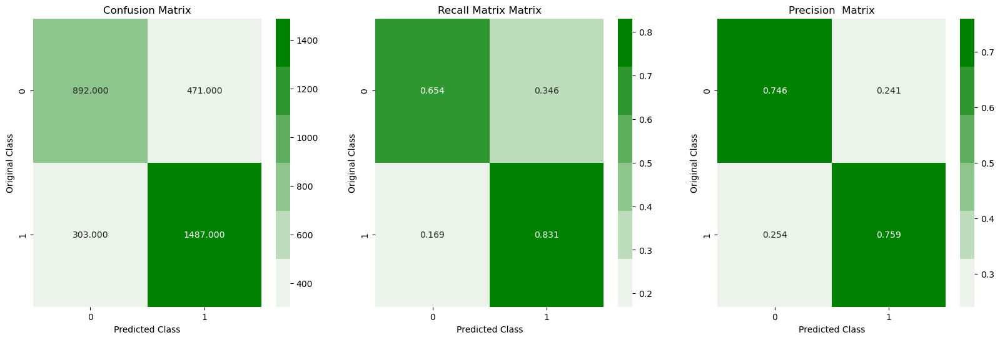

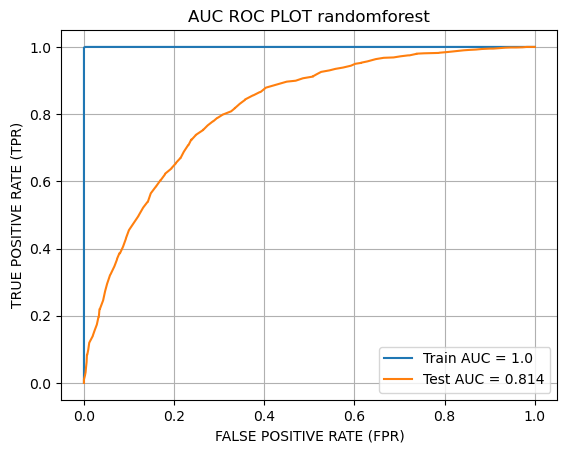

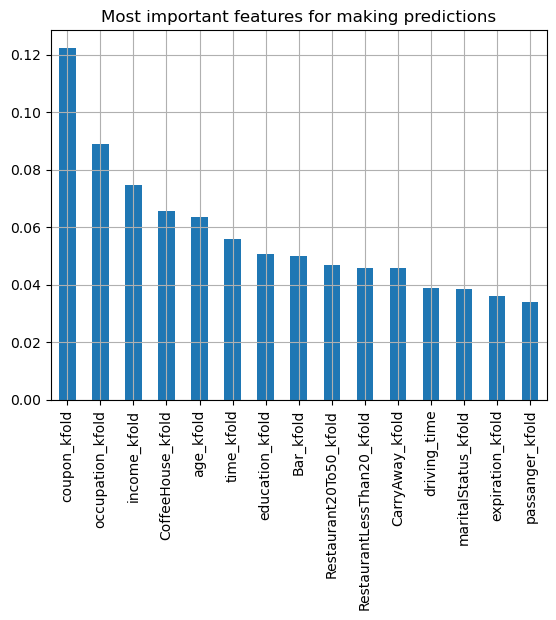

5it [00:17,  3.57s/it]

Train Auc Score--->  1.0
Test Auc Scoer --->  0.814
Train f1score is 0.999 , precison is 0.9983 and recall is 0.9996 and log_loss is 0.0402
Test f1score is 0.7935 , precison is 0.7594 and recall is 0.8307 and loh loss is 8.4787




In [45]:
algorithm = 'randomforest'
rf_train_f1score,rf_train_precison,rf_train_recall,rf_train_log_loss,rf_test_f1score,rf_test_precison,\
    rf_test_recall,rf_test_log_loss ,rf_train_auc,rf_test_auc = set_performance(set_dict,y_train,y_test,'randomforest',)

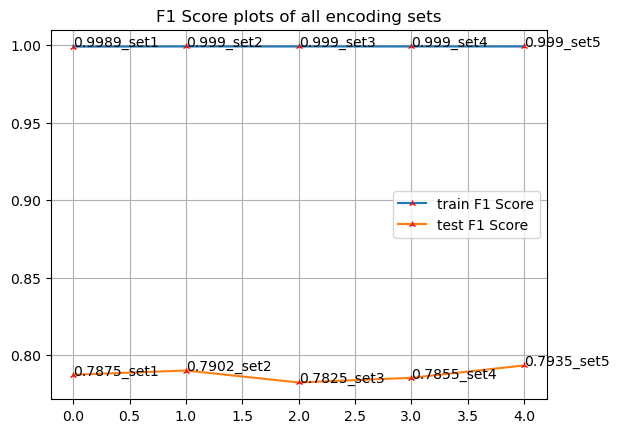

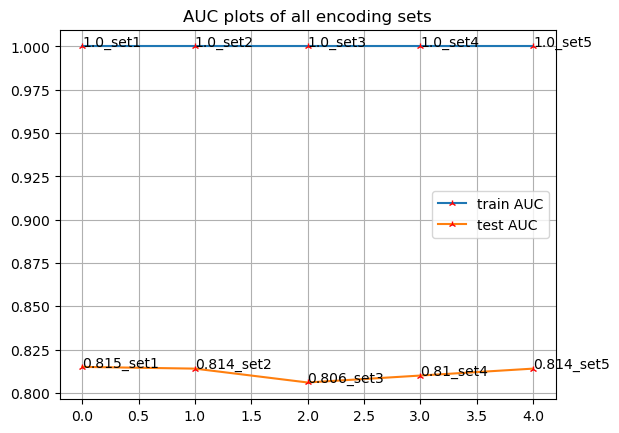

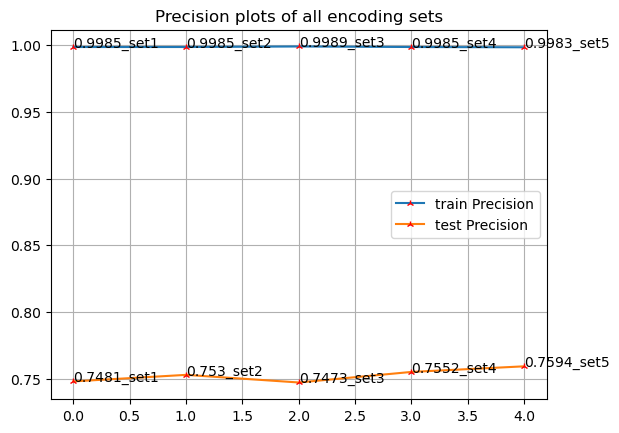

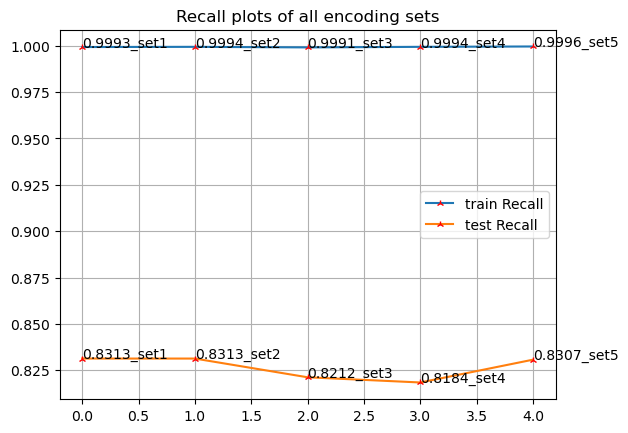

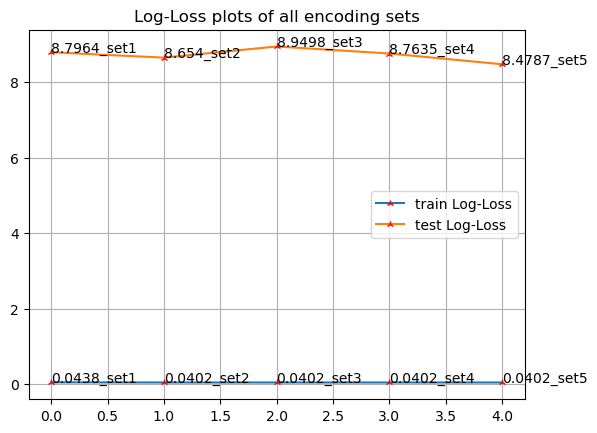

In [46]:
plots(rf_train_f1score,rf_test_f1score,'F1 Score')
plots(rf_train_auc,rf_test_auc,'AUC')
plots(rf_train_precison,rf_test_precison,'Precision')
plots(rf_train_recall,rf_test_recall,'Recall')
plots(rf_train_log_loss,rf_test_log_loss,'Log-Loss')

Its also overfitting like Decsion Tree and here also its performance on test data is best on set5

#### 3.7.1 Hyperparameter Tuning Random Forest

In [60]:
param_grid = [
{'n_estimators': [5,40,80,130,150,180,200,250,300,350,400,500], 'max_features': ['auto', 'sqrt'], 
 'max_depth': [10, 50, None], 'bootstrap': [True, False],'criterion':['gini','entropy'],"min_samples_leaf" :[1, 2, 4],\
'min_samples_split': [2, 5, 10]}
]

rf_clf = RandomForestClassifier(random_state=55)
gs_rf,best_param_rf,best_esti_rf,best_score_rf = hyperparametertuning(rf_clf, param_grid, set5_x_train , y_train,)


hyp_rf_clf = RandomForestClassifier(**best_param_rf,random_state= 55)
# calibrating
#hyp_rf_clf = CalibratedClassifierCV(rf_clf,n_jobs=-1)
hyp_rf_clf.fit(set5_x_train,y_train)

hyp_rf_train_pred = hyp_rf_clf.predict(set5_x_train)
hyp_rf_test_pred = hyp_rf_clf.predict(set5_x_test)


hyp_rf_tr_f1score,hyp_rf_tr_precison,hyp_rf_tr_recall,hyp_rf_tr_log_loss = performance_matrices(y_train,hyp_rf_train_pred)
hyp_rf_te_f1score,hyp_rf_te_precison,hyp_rf_te_recall,hyp_rf_te_log_loss = performance_matrices(y_test,hyp_rf_test_pred)

hyp_rf_tr_auc,hyp_rf_te_auc = pred_auc_roc(hyp_rf_clf,set5_x_train,set5_x_test,y_train,y_test,'RF HYP',return_plot=False)

print('\n')
print('F1 score of train and test data after hyperparameter tuning ',hyp_rf_tr_f1score,' , ',hyp_rf_te_f1score)
print('AUC score of train and test data after hyperparameter tuning ',hyp_rf_tr_auc,' , ',hyp_rf_te_auc)


Fitting 3 folds for each of 100 candidates, totalling 300 fits
Best parameters are  {'n_estimators': 400, 'min_samples_split': 5, 'min_samples_leaf': 1, 'max_features': 'auto', 'max_depth': 50, 'criterion': 'gini', 'bootstrap': True}
Best estimators are  RandomForestClassifier(max_depth=50, min_samples_split=5, n_estimators=400,
                       random_state=55)


F1 score of train and test data after hyperparameter tuning  0.9812  ,  0.7907
AUC score of train and test data after hyperparameter tuning  0.999  ,  0.815


In [61]:
table('Random Forest','SET5',rf_train_auc,rf_test_auc,rf_train_f1score,rf_test_f1score,rf_train_precison,\
      rf_test_precison,rf_train_recall,rf_test_recall,rf_train_log_loss,rf_test_log_loss,\
     hyp_rf_tr_auc,hyp_rf_te_auc,hyp_rf_tr_f1score,hyp_rf_te_f1score,\
    hyp_rf_tr_precison,hyp_rf_te_precison,hyp_rf_tr_recall,hyp_rf_te_recall,hyp_rf_tr_log_loss,hyp_rf_te_log_loss)

,Set,OHE encoded features,Ordinal encoded features,K-Fold Target encoded features,Binary encoded features,Hashing encoded features,Train AUC,Test AUC,Train f1 Score,Test f1 Score,Train Precision,Test Precision,Train recall,Test recall,Train log loss,Test log loss
0,Set 1,"['destination', 'passanger', 'weather', 'coupo...","['age', 'time', 'expiration', 'income', 'tempe...",None,None,None,1.000,0.811,0.9992,0.7825,0.9994,0.7458,0.9989,0.8229,0.0329,8.9717
1,Set 2,"['gender', 'destination', 'weather']","['expiration', 'temperature', 'time']","['income', 'occupation', 'age', 'education', '...","['passanger', 'CarryAway', 'CoffeeHouse', 'Res...",None,1.000,0.799,0.9992,0.7758,0.9993,0.7420,0.9991,0.8128,0.0329,9.2127
2,SET 3,None,None,"['time', 'temperature', 'coupon', 'passanger',...","['destination', 'weather', 'gender', 'expirati...","['occupation', 'income', 'education', 'marital...",1.000,0.803,0.9992,0.7780,0.9989,0.7446,0.9994,0.8145,0.0329,9.1141
3,SET 4,"['destination', 'passanger', 'weather', 'tempe...","['CarryAway', 'CoffeeHouse', 'RestaurantLessTh...","['education', 'occupation', 'age', 'income']",None,None,1.000,0.804,0.9992,0.7780,0.9996,0.7497,0.9987,0.8084,0.0329,9.0483
4,SET 5,None,None,"['education', 'occupation', 'age', 'income', '...",None,None,1.000,0.809,0.9992,0.7800,0.9993,0.7521,0.9991,0.8101,0.0329,8.9607
5,Hyperparamere Tuned OnSET5,SET5,SET5,SET5,SET5,SET5,0.999,0.815,0.9812,0.7907,0.9717,0.7511,0.9909,0.8346,0.7451,8.6649


## 3.8 GBDT

          ====================               gbdt            ====================             


0it [00:00, ?it/s]

                 ------------------->   Set1   <-------------------               


--- Train CM of  gbdt ---


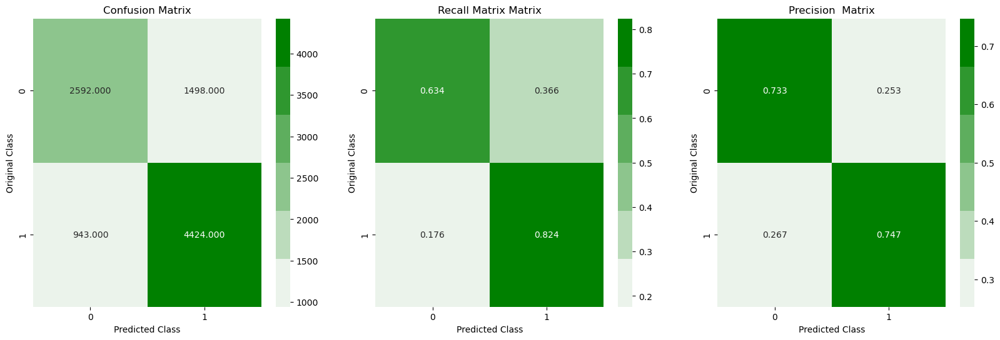



--- Test CM of gbdt ---


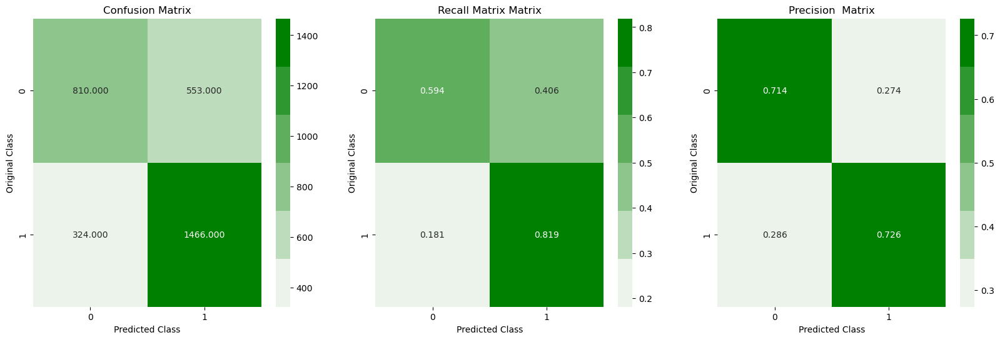

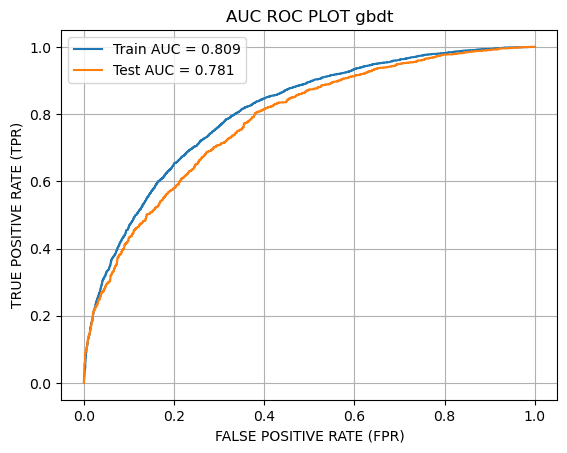

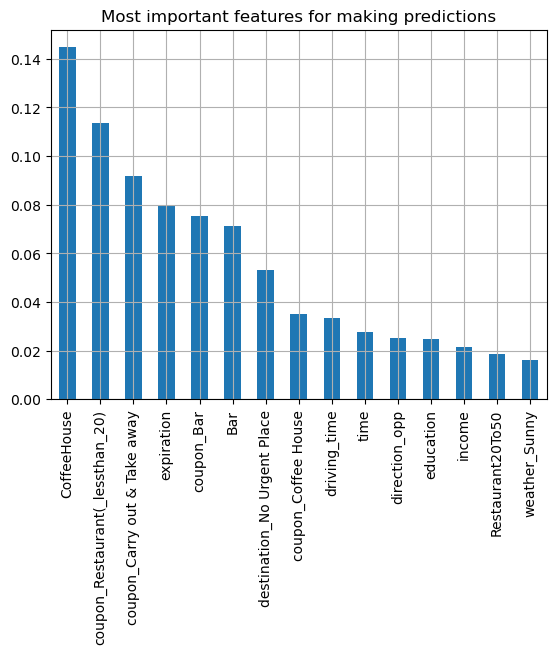

1it [00:05,  5.32s/it]

Train Auc Score--->  0.809
Test Auc Scoer --->  0.781
Train f1score is 0.7838 , precison is 0.747 and recall is 0.8243 and log_loss is 8.9151
Test f1score is 0.7698 , precison is 0.7261 and recall is 0.819 and loh loss is 9.607


                 ------------------->   Set2   <-------------------               


--- Train CM of  gbdt ---


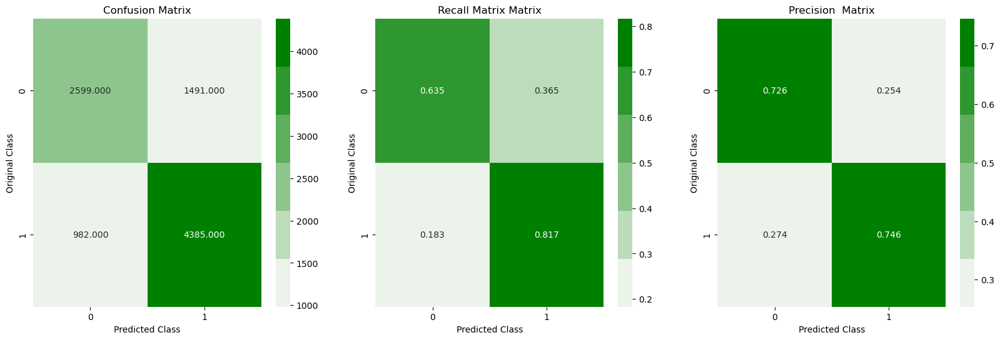



--- Test CM of gbdt ---


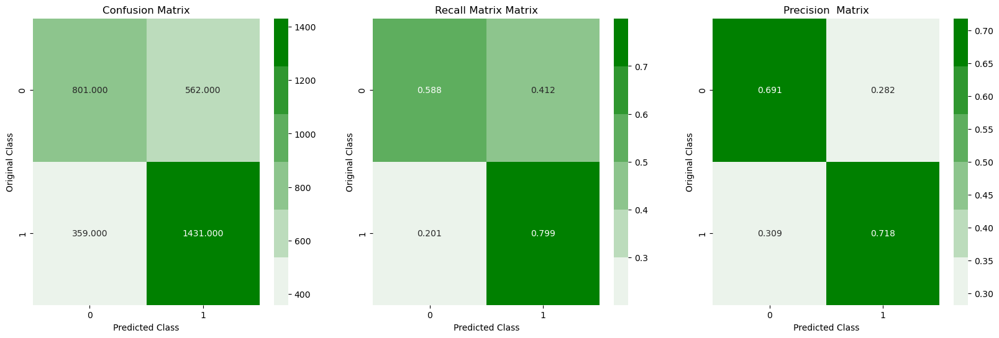

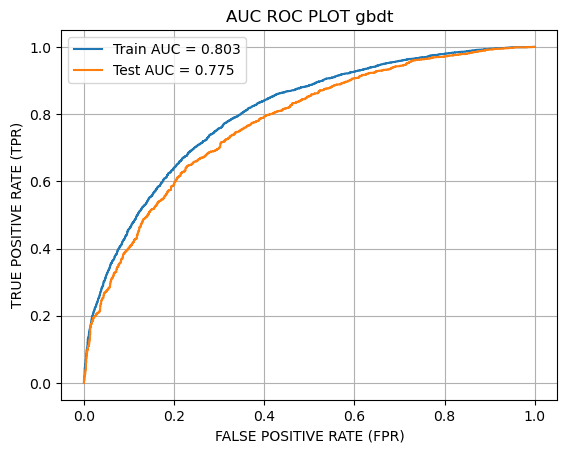

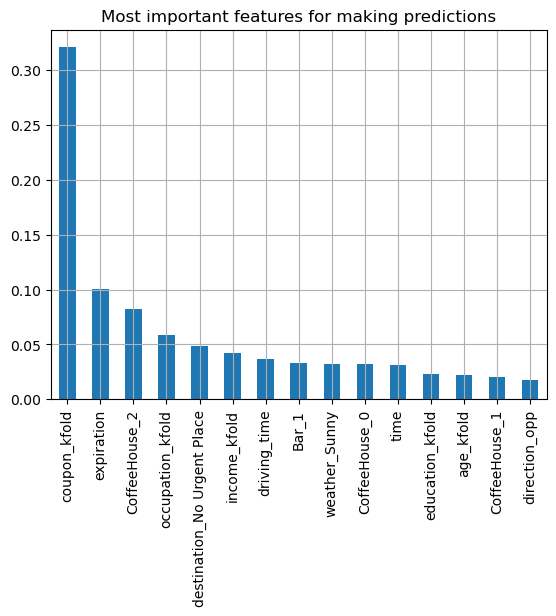

2it [00:11,  5.96s/it]

Train Auc Score--->  0.803
Test Auc Scoer --->  0.775
Train f1score is 0.78 , precison is 0.7463 and recall is 0.817 and log_loss is 9.032
Test f1score is 0.7565 , precison is 0.718 and recall is 0.7994 and loh loss is 10.089


                 ------------------->   Set3   <-------------------               


--- Train CM of  gbdt ---


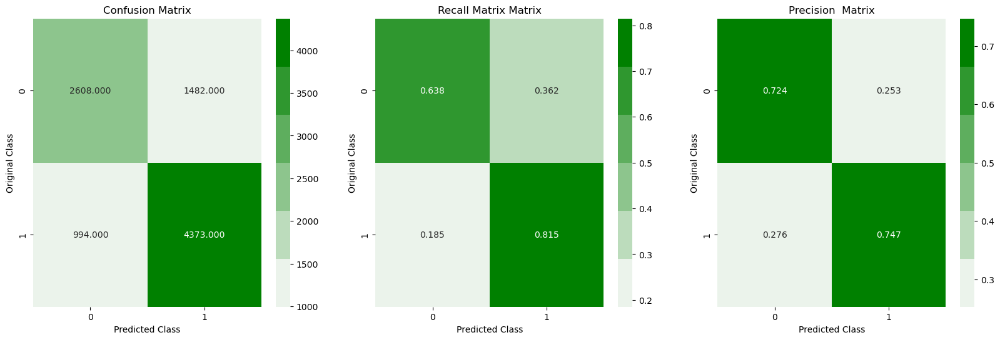



--- Test CM of gbdt ---


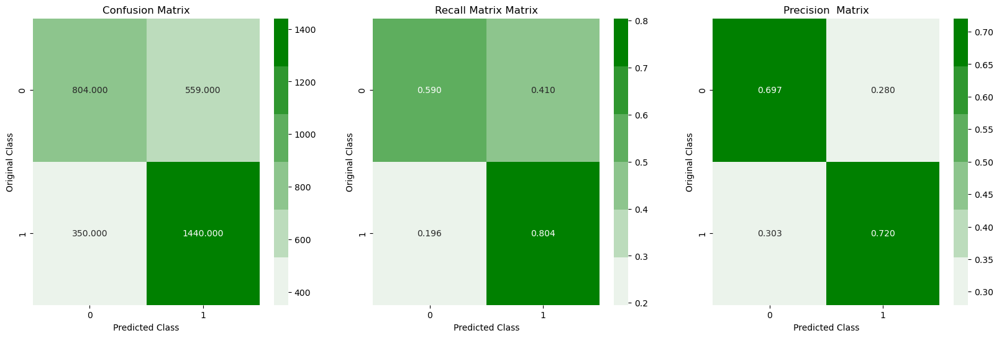

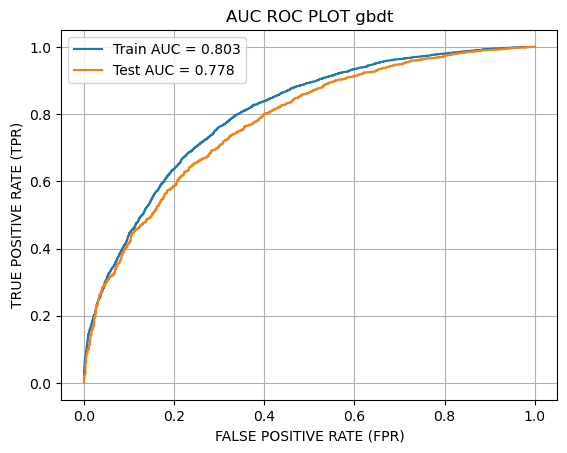

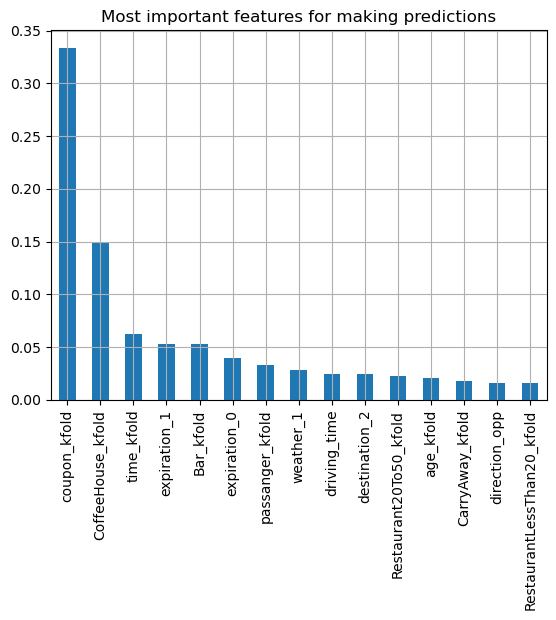

3it [00:17,  5.71s/it]

Train Auc Score--->  0.803
Test Auc Scoer --->  0.778
Train f1score is 0.7794 , precison is 0.7469 and recall is 0.8148 and log_loss is 9.043
Test f1score is 0.7601 , precison is 0.7204 and recall is 0.8045 and loh loss is 9.9576


                 ------------------->   Set4   <-------------------               


--- Train CM of  gbdt ---


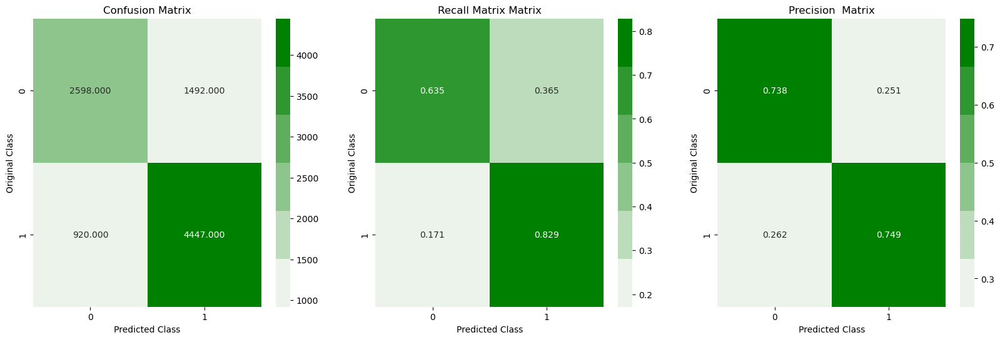



--- Test CM of gbdt ---


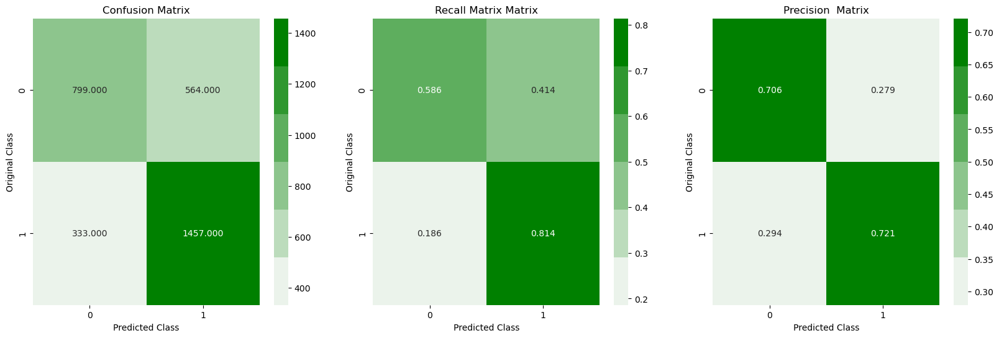

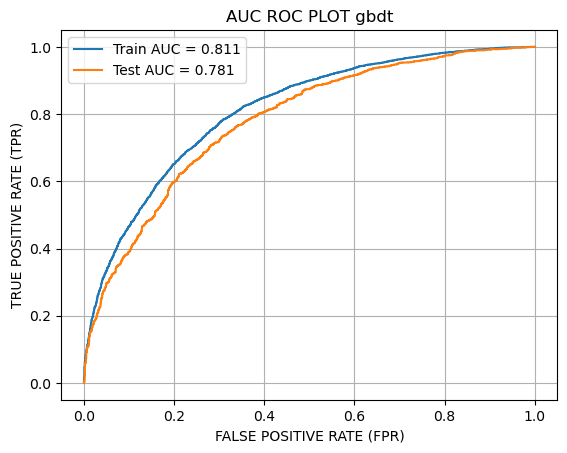

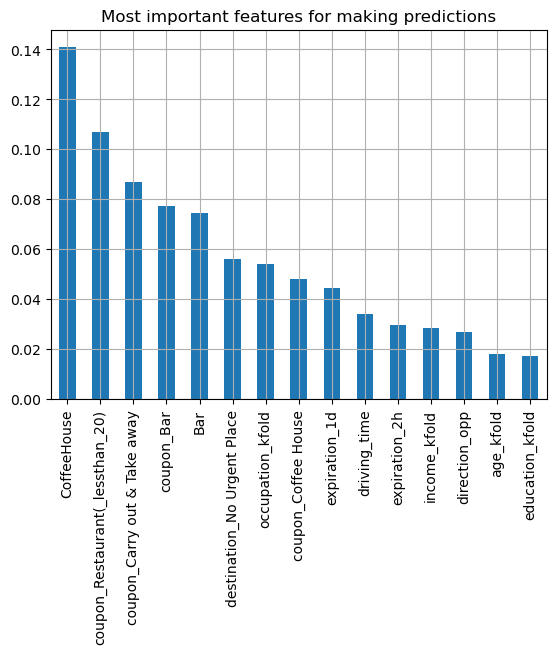

4it [00:22,  5.52s/it]

Train Auc Score--->  0.811
Test Auc Scoer --->  0.781
Train f1score is 0.7867 , precison is 0.7488 and recall is 0.8286 and log_loss is 8.8092
Test f1score is 0.7646 , precison is 0.7209 and recall is 0.814 and loh loss is 9.8261


                 ------------------->   Set5   <-------------------               


--- Train CM of  gbdt ---


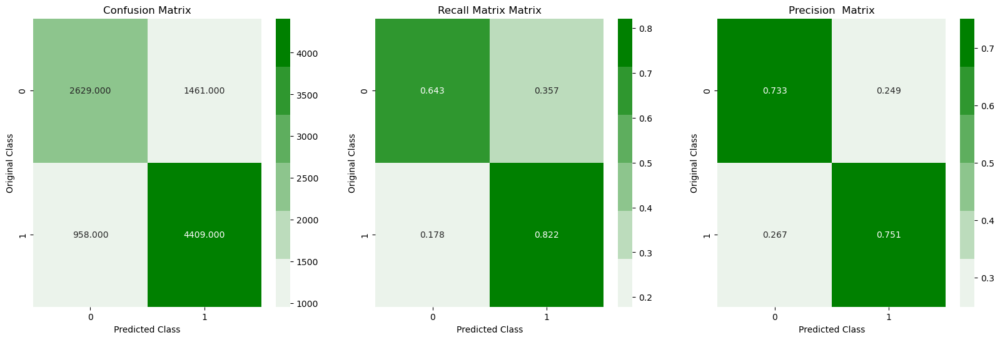



--- Test CM of gbdt ---


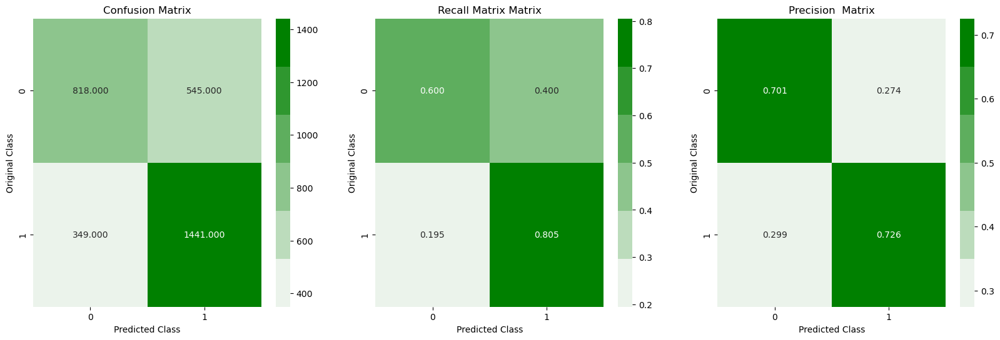

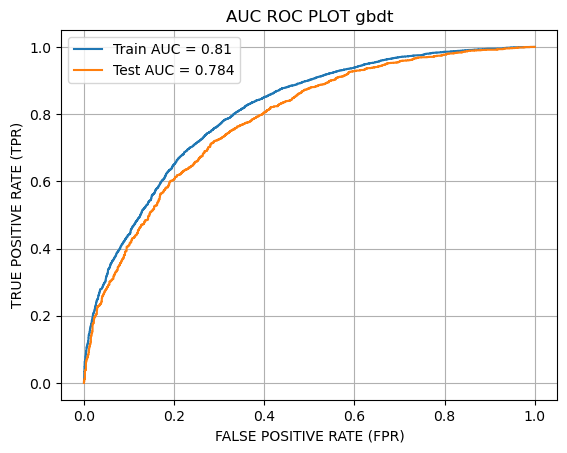

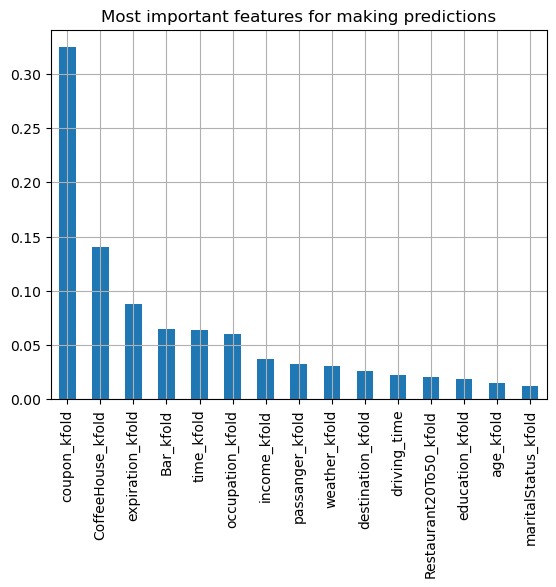

5it [00:27,  5.41s/it]

Train Auc Score--->  0.81
Test Auc Scoer --->  0.784
Train f1score is 0.7847 , precison is 0.7511 and recall is 0.8215 and log_loss is 8.8348
Test f1score is 0.7632 , precison is 0.7256 and recall is 0.805 and loh loss is 9.7932




In [88]:
algorithm = 'gbdt'
gbdt_train_f1score,gbdt_train_precison,gbdt_train_recall,gbdt_train_log_loss,gbdt_test_f1score,gbdt_test_precison,\
    gbdt_test_recall,gbdt_test_log_loss ,gbdt_train_auc,gbdt_test_auc = set_performance(set_dict,y_train,y_test,algorithm)

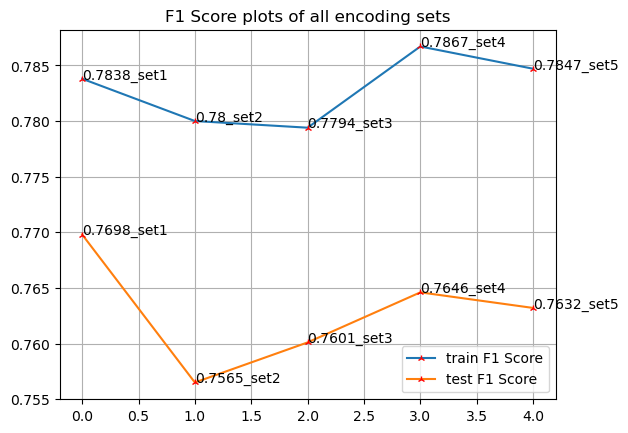

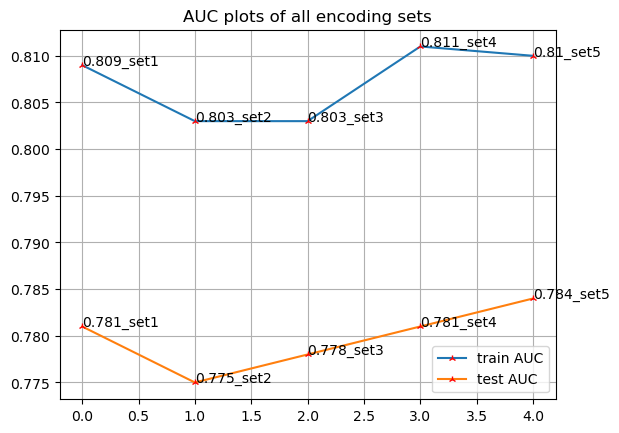

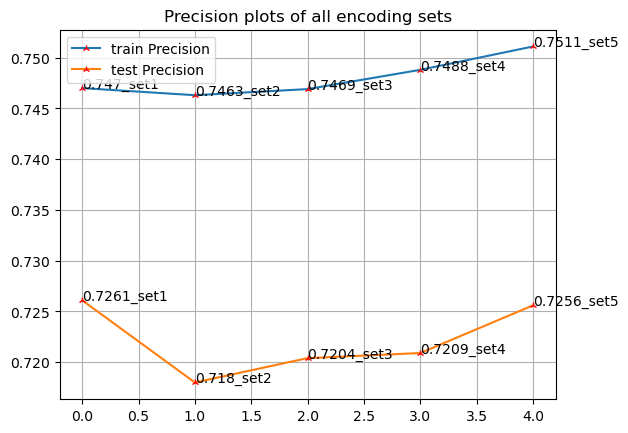

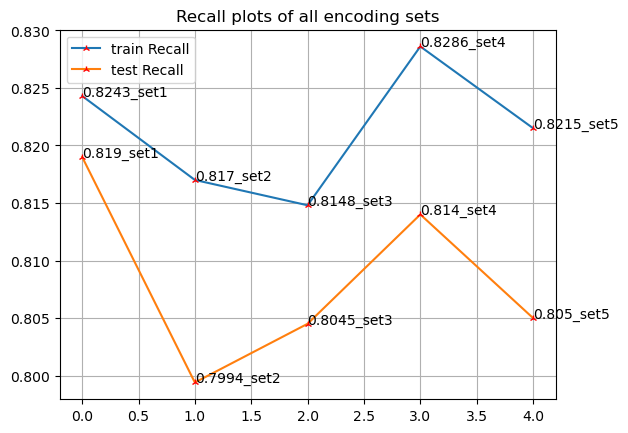

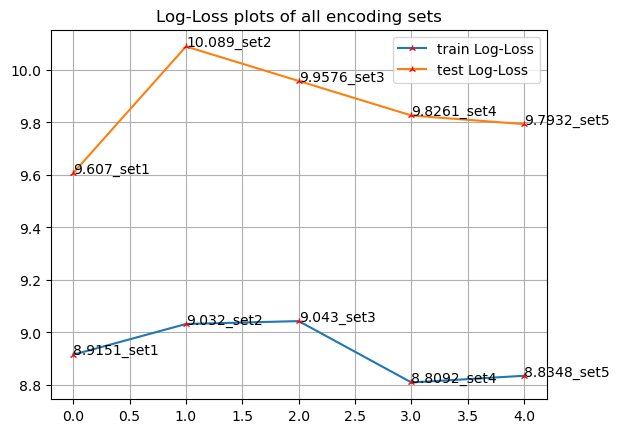

In [89]:
plots(gbdt_train_f1score,gbdt_test_f1score,'F1 Score')
plots(gbdt_train_auc,gbdt_test_auc,'AUC')
plots(gbdt_train_precison,gbdt_test_precison,'Precision')
plots(gbdt_train_recall,gbdt_test_recall,'Recall')
plots(gbdt_train_log_loss,gbdt_test_log_loss,'Log-Loss')

Choose set1 because its performing much better on test data as comapred to others and good on train data also.Check with set4 and set5 while hyperparameter tuning but set1 gave the best results

In [91]:
gbdt_clf = GradientBoostingClassifier(random_state=55,)
param_grid = {'max_depth':[1, 5, 10, 50],'n_estimators':[100, 500, 1000, 2000],\
             "min_samples_split":[2,5,10],"min_samples_leaf":[1,3,5,8,10],"max_depth":[3,4,5,7,10,15],
              "max_features":['auto', 'sqrt', 'log2']
             }
gs_gbdt,best_param_gbdt,best_esti_gbdt,best_score_gbdt = hyperparametertuning(gbdt_clf, param_grid, set1_x_train , y_train,)

Fitting 3 folds for each of 100 candidates, totalling 300 fits
Best parameters are  {'n_estimators': 500, 'min_samples_split': 2, 'min_samples_leaf': 3, 'max_features': 'sqrt', 'max_depth': 10}
Best estimators are  GradientBoostingClassifier(max_depth=10, max_features='sqrt',
                           min_samples_leaf=3, n_estimators=500,
                           random_state=55)


In [92]:
hyp_gbdt_clf = GradientBoostingClassifier(n_estimators=best_param_gbdt['n_estimators'], max_depth=best_param_gbdt['max_depth'],\
                                min_samples_leaf=best_param_gbdt['min_samples_leaf'],
                       min_samples_split=best_param_gbdt['min_samples_split'],max_features =best_param_gbdt['max_features'] , random_state=55)

hyp_gbdt_clf = CalibratedClassifierCV(hyp_gbdt_clf,cv = 3)
hyp_gbdt_clf.fit(set1_x_train,y_train)
hyp_gbdt_train_pred = hyp_gbdt_clf.predict(set1_x_train)
hyp_gbdt_test_pred = hyp_gbdt_clf.predict(set1_x_test)


hyp_gbdt_tr_f1score,hyp_gbdt_tr_precison,hyp_gbdt_tr_recall,hyp_gbdt_tr_log_loss = performance_matrices(y_train,hyp_gbdt_train_pred)
hyp_gbdt_te_f1score,hyp_gbdt_te_precison,hyp_gbdt_te_recall,hyp_gbdt_te_log_loss = performance_matrices(y_test,hyp_gbdt_test_pred)

hyp_gbdt_tr_auc,hyp_gbdt_te_auc = pred_auc_roc(hyp_gbdt_clf,set1_x_train,set1_x_test,y_train,y_test,'GBDT HYP',return_plot=False)

print('\n')
print('F1 score of train and test data after hyperparameter tuning ',hyp_gbdt_tr_f1score,' , ',hyp_gbdt_te_f1score)
print('AUC score of train and test data after hyperparameter tuning ',hyp_gbdt_tr_auc,' , ',hyp_gbdt_te_auc)




F1 score of train and test data after hyperparameter tuning  0.999  ,  0.8043
AUC score of train and test data after hyperparameter tuning  1.0  ,  0.837


with 4-----

F1 score of train and test data after hyperparameter tuning  0.7241  ,  0.7243
AUC score of train and test data after hyperparameter tuning  0.375  ,  0.495

with 5
F1 score of train and test data after hyperparameter tuning  0.7241  ,  0.7243
AUC score of train and test data after hyperparameter tuning  0.368  ,  0.508

In [93]:
table('GBDT','SET1',gbdt_train_auc,gbdt_test_auc,gbdt_train_f1score,gbdt_test_f1score,gbdt_train_precison,\
      gbdt_test_precison,gbdt_train_recall,gbdt_test_recall,gbdt_train_log_loss,gbdt_test_log_loss,\
     hyp_gbdt_tr_auc,hyp_gbdt_te_auc,hyp_gbdt_tr_f1score,hyp_gbdt_te_f1score,\
    hyp_gbdt_tr_precison,hyp_gbdt_te_precison,hyp_gbdt_tr_recall,hyp_gbdt_te_recall,hyp_gbdt_tr_log_loss,hyp_gbdt_te_log_loss)

,Set,OHE encoded features,Ordinal encoded features,K-Fold Target encoded features,Binary encoded features,Hashing encoded features,Train AUC,Test AUC,Train f1 Score,Test f1 Score,Train Precision,Test Precision,Train recall,Test recall,Train log loss,Test log loss
0,Set 1,"['destination', 'passanger', 'weather', 'coupo...","['age', 'time', 'expiration', 'income', 'tempe...",None,None,None,0.809,0.781,0.7838,0.7698,0.7470,0.7261,0.8243,0.8190,8.9151,9.6070
1,Set 2,"['gender', 'destination', 'weather']","['expiration', 'temperature', 'time']","['income', 'occupation', 'age', 'education', '...","['passanger', 'CarryAway', 'CoffeeHouse', 'Res...",None,0.803,0.775,0.7800,0.7565,0.7463,0.7180,0.8170,0.7994,9.0320,10.0890
2,SET 3,None,None,"['time', 'temperature', 'coupon', 'passanger',...","['destination', 'weather', 'gender', 'expirati...","['occupation', 'income', 'education', 'marital...",0.803,0.778,0.7794,0.7601,0.7469,0.7204,0.8148,0.8045,9.0430,9.9576
3,SET 4,"['destination', 'passanger', 'weather', 'tempe...","['CarryAway', 'CoffeeHouse', 'RestaurantLessTh...","['education', 'occupation', 'age', 'income']",None,None,0.811,0.781,0.7867,0.7646,0.7488,0.7209,0.8286,0.8140,8.8092,9.8261
4,SET 5,None,None,"['education', 'occupation', 'age', 'income', '...",None,None,0.810,0.784,0.7847,0.7632,0.7511,0.7256,0.8215,0.8050,8.8348,9.7932
5,Hyperparamere Tuned OnSET1,SET1,SET1,SET1,SET1,SET1,1.000,0.837,0.9990,0.8043,0.9987,0.7626,0.9993,0.8508,0.0402,8.1172


## 3.9 LGBM

          ====================               lightgbm            ====================             


0it [00:00, ?it/s]

                 ------------------->   Set1   <-------------------               


--- Train CM of  lightgbm ---


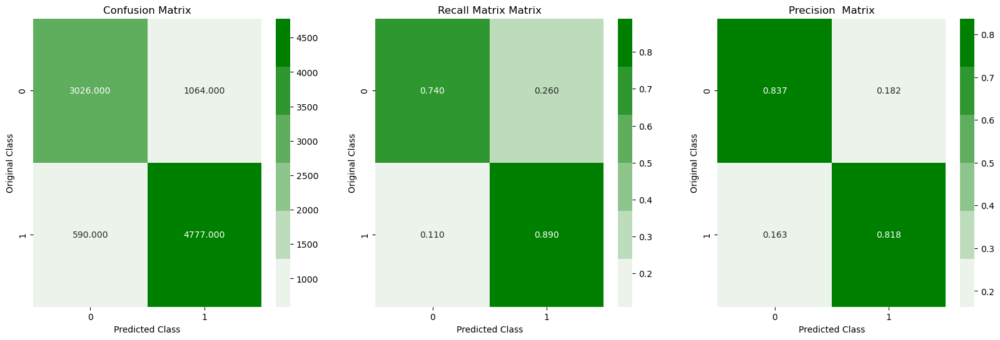



--- Test CM of lightgbm ---


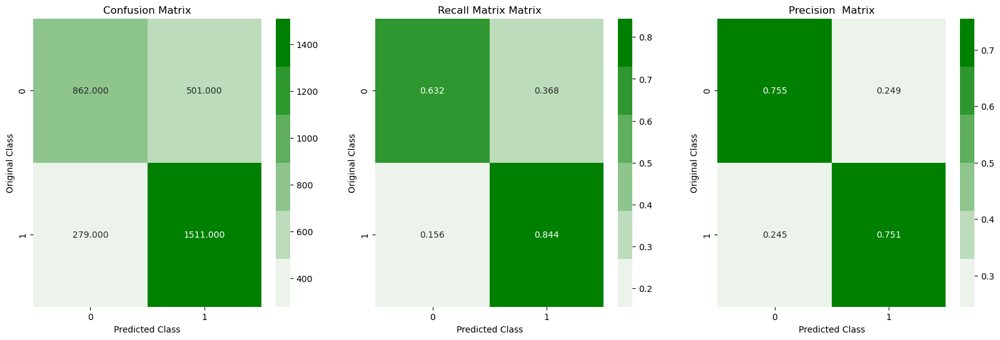

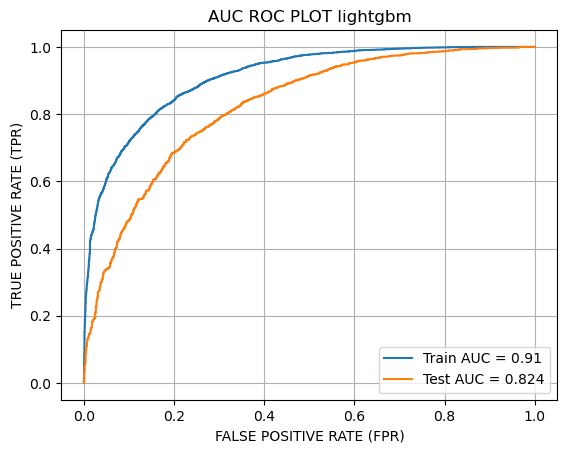

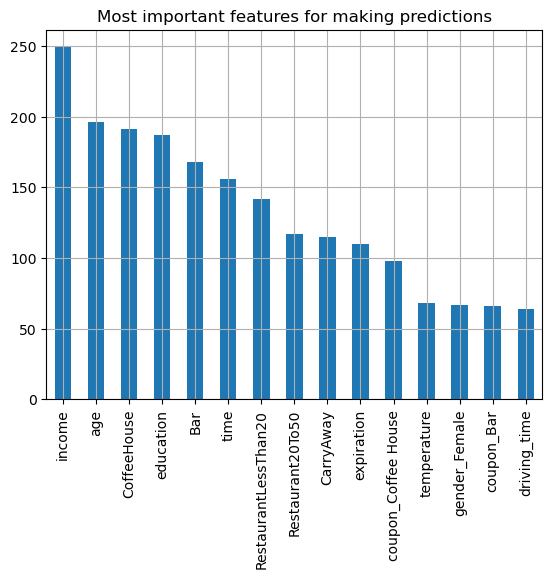

1it [00:04,  4.31s/it]

Train Auc Score--->  0.91
Test Auc Scoer --->  0.824
Train f1score is 0.8524 , precison is 0.8178 and recall is 0.8901 and log_loss is 6.0408
Test f1score is 0.7948 , precison is 0.751 and recall is 0.8441 and loh loss is 8.5444


                 ------------------->   Set2   <-------------------               


--- Train CM of  lightgbm ---


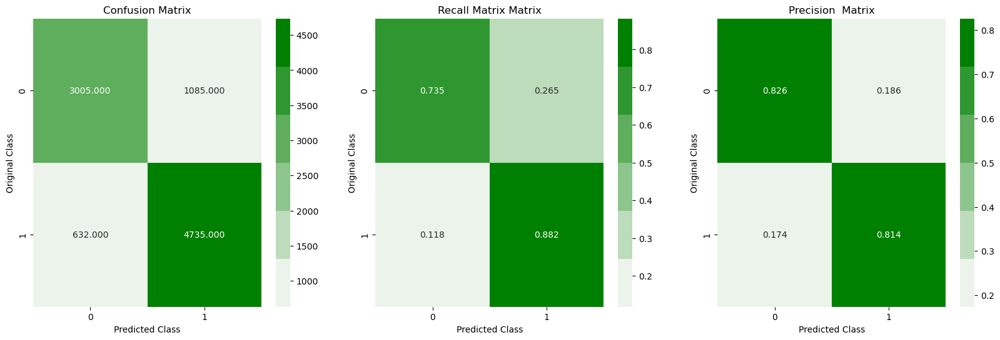



--- Test CM of lightgbm ---


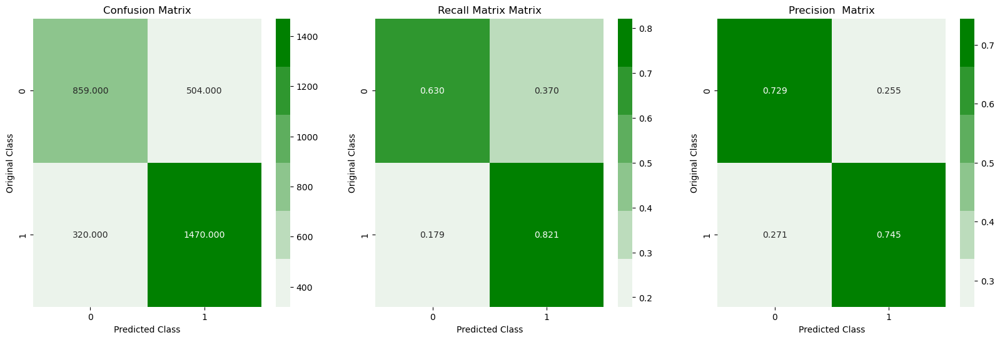

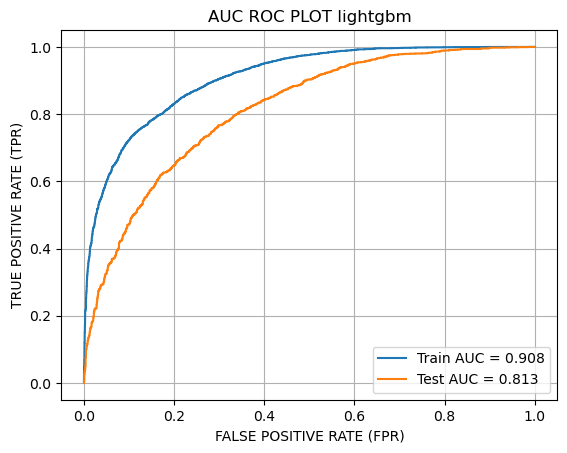

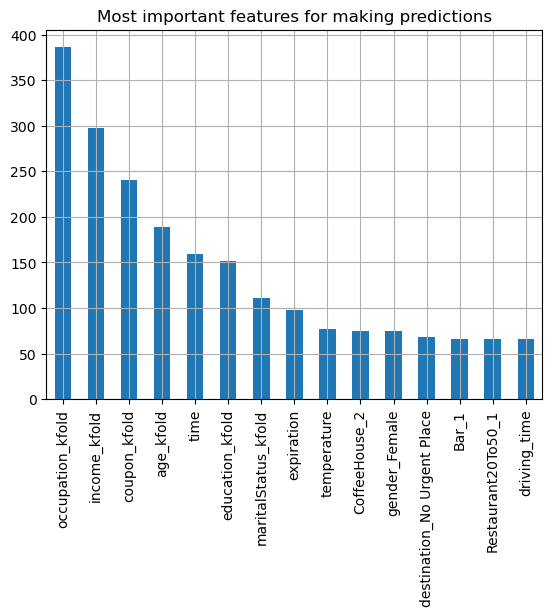

2it [00:08,  4.19s/it]

Train Auc Score--->  0.908
Test Auc Scoer --->  0.813
Train f1score is 0.8465 , precison is 0.8136 and recall is 0.8822 and log_loss is 6.2709
Test f1score is 0.7811 , precison is 0.7447 and recall is 0.8212 and loh loss is 9.0264


                 ------------------->   Set3   <-------------------               


--- Train CM of  lightgbm ---


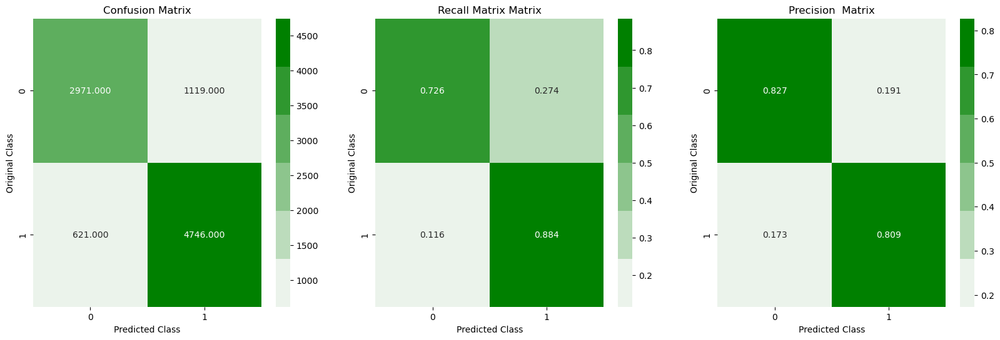



--- Test CM of lightgbm ---


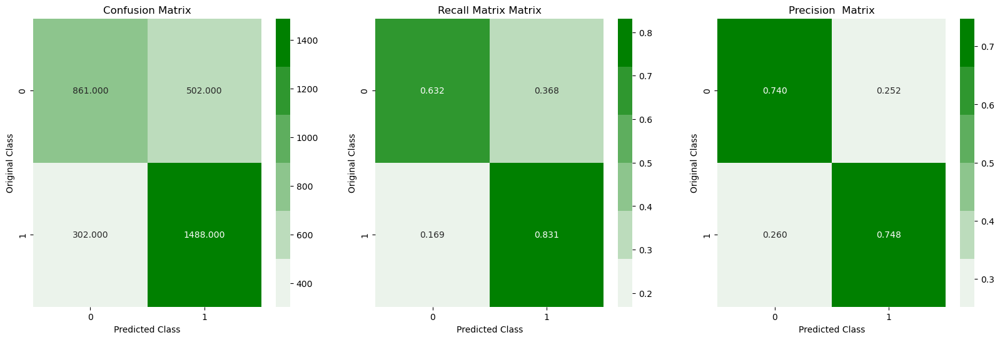

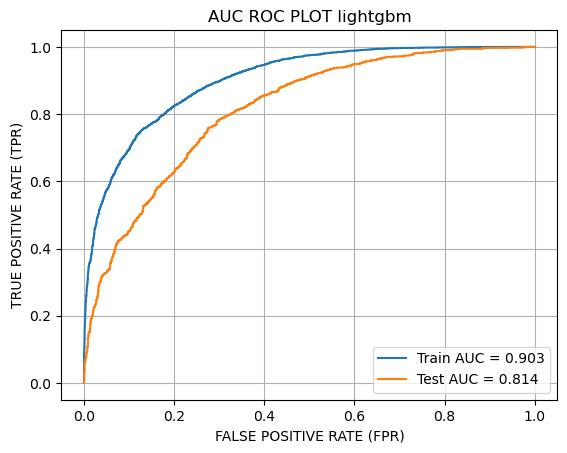

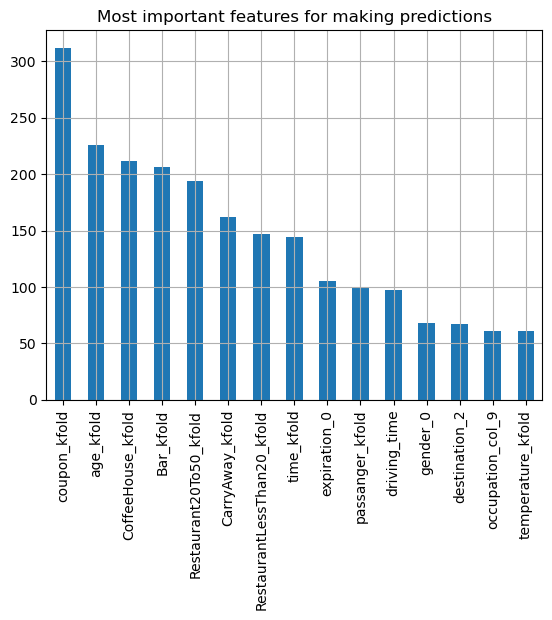

3it [00:14,  4.86s/it]

Train Auc Score--->  0.903
Test Auc Scoer --->  0.814
Train f1score is 0.8451 , precison is 0.8092 and recall is 0.8843 and log_loss is 6.3549
Test f1score is 0.7873 , precison is 0.7477 and recall is 0.8313 and loh loss is 8.8074


                 ------------------->   Set4   <-------------------               


--- Train CM of  lightgbm ---


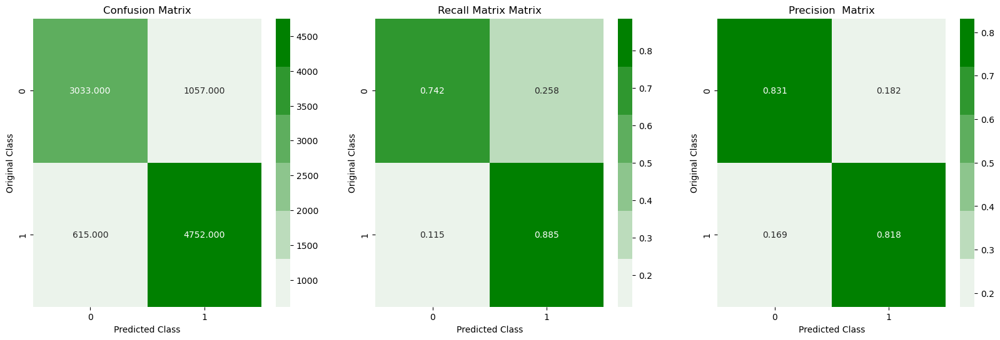



--- Test CM of lightgbm ---


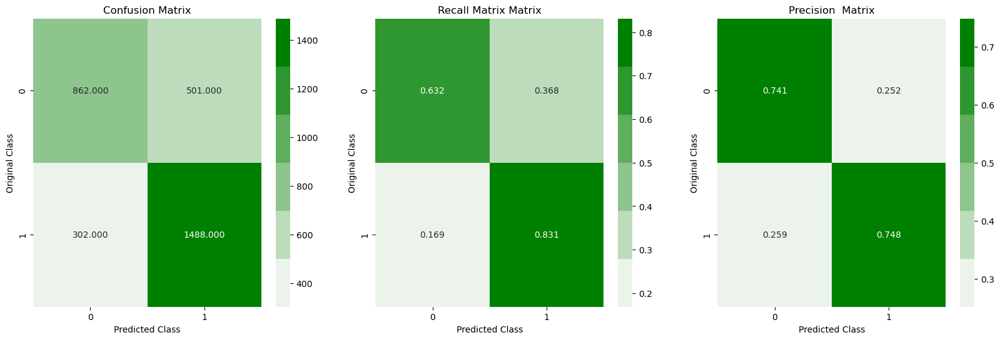

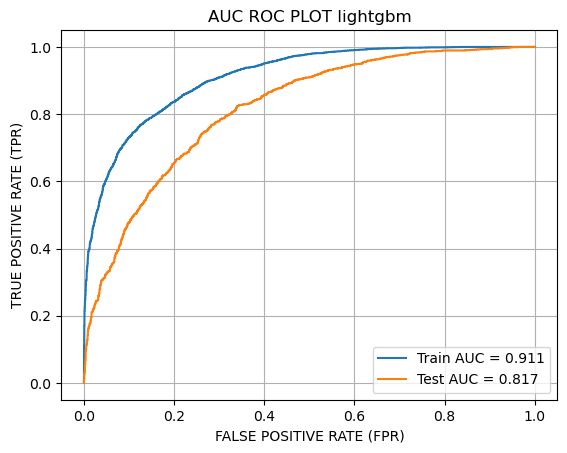

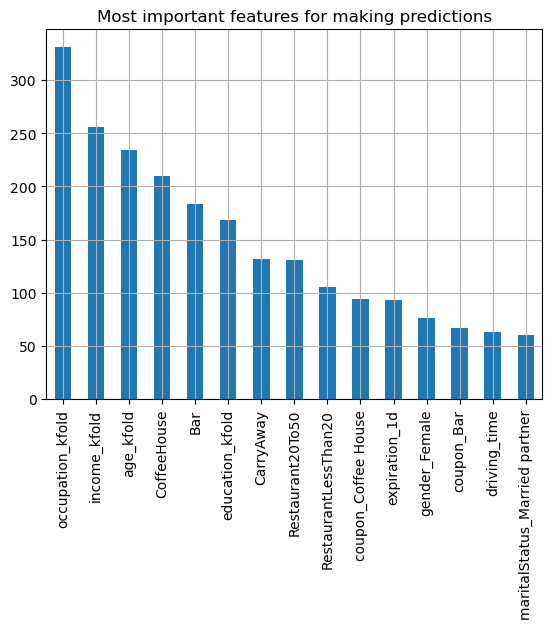

4it [00:19,  5.28s/it]

Train Auc Score--->  0.911
Test Auc Scoer --->  0.817
Train f1score is 0.8504 , precison is 0.818 and recall is 0.8854 and log_loss is 6.1066
Test f1score is 0.7875 , precison is 0.7481 and recall is 0.8313 and loh loss is 8.7964


                 ------------------->   Set5   <-------------------               


--- Train CM of  lightgbm ---


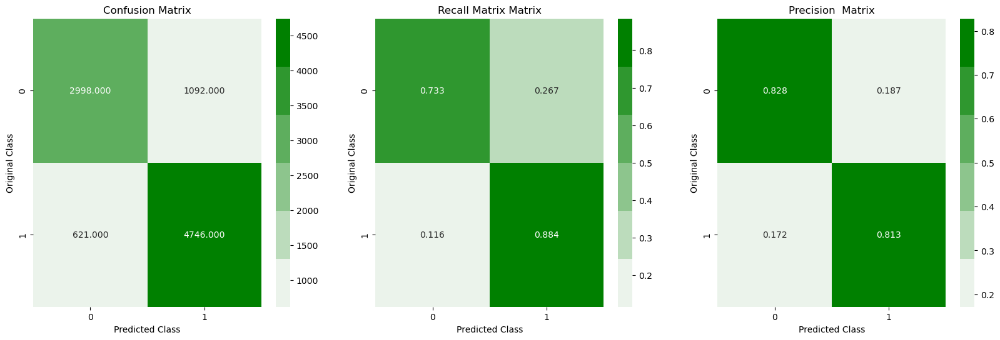



--- Test CM of lightgbm ---


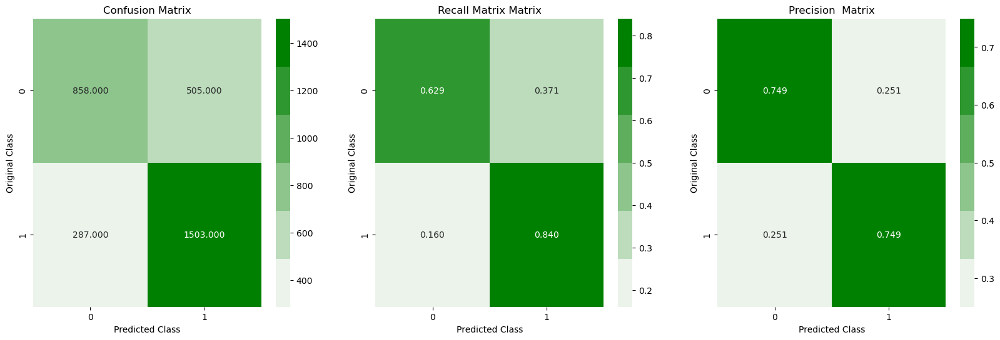

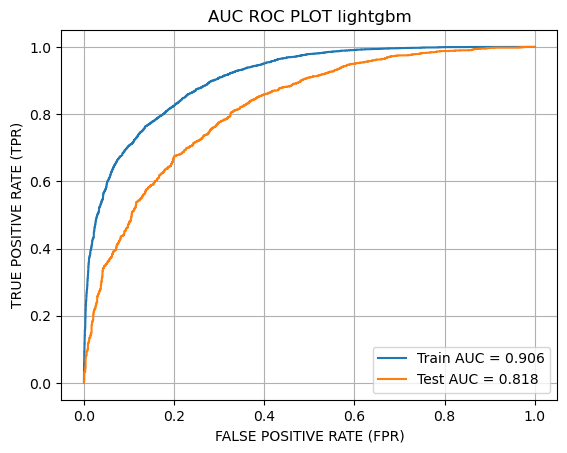

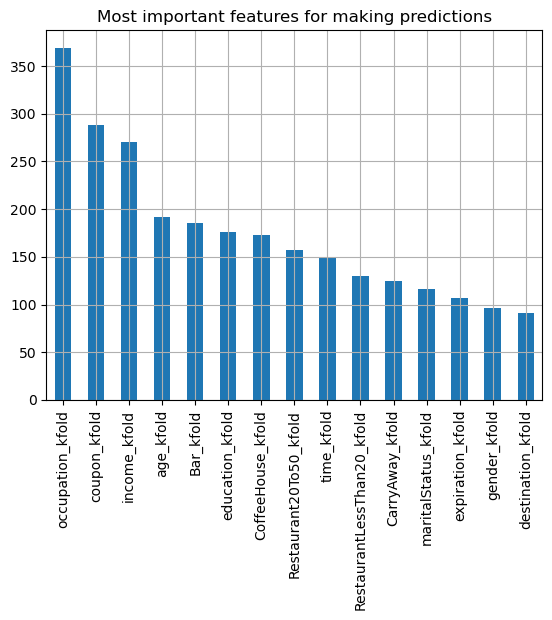

5it [00:23,  4.68s/it]

Train Auc Score--->  0.906
Test Auc Scoer --->  0.818
Train f1score is 0.8471 , precison is 0.8129 and recall is 0.8843 and log_loss is 6.2563
Test f1score is 0.7915 , precison is 0.7485 and recall is 0.8397 and loh loss is 8.6759




In [94]:
algorithm = 'lightgbm'
lgb_train_f1score,lgb_train_precison,lgb_train_recall,lgb_train_log_loss,lgb_test_f1score,lgb_test_precison,\
    lgb_test_recall,lgb_test_log_loss ,lgb_train_auc,lgb_test_auc = set_performance(set_dict,y_train,y_test,algorithm)

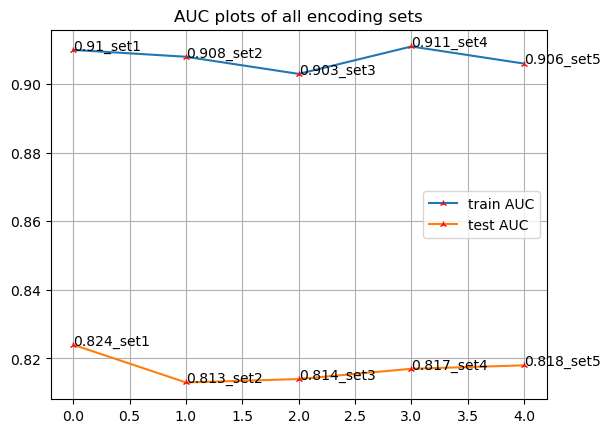

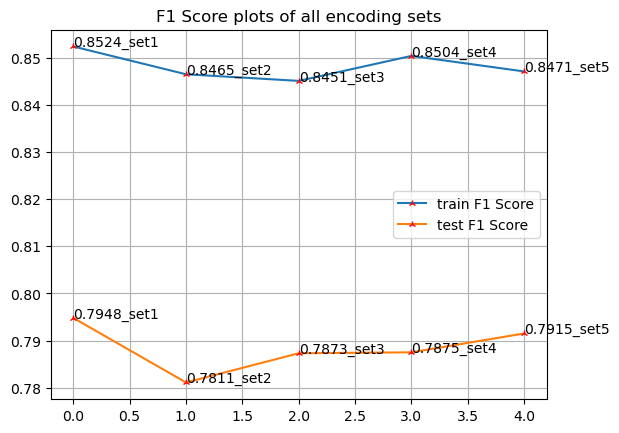

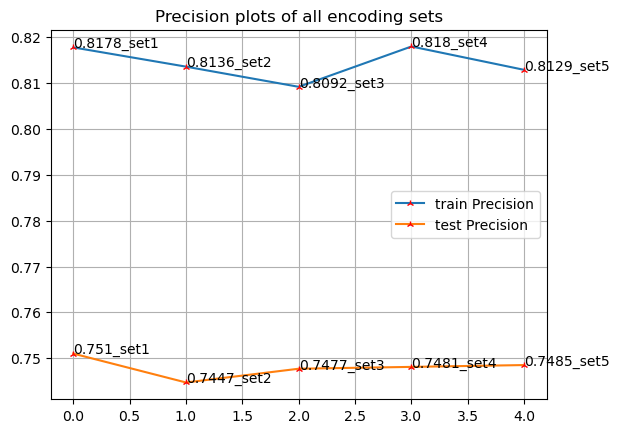

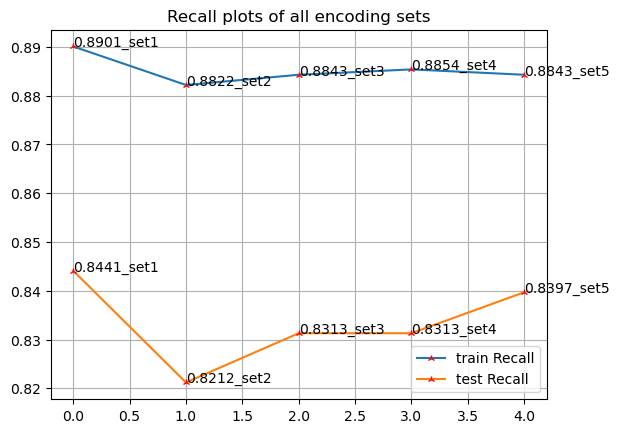

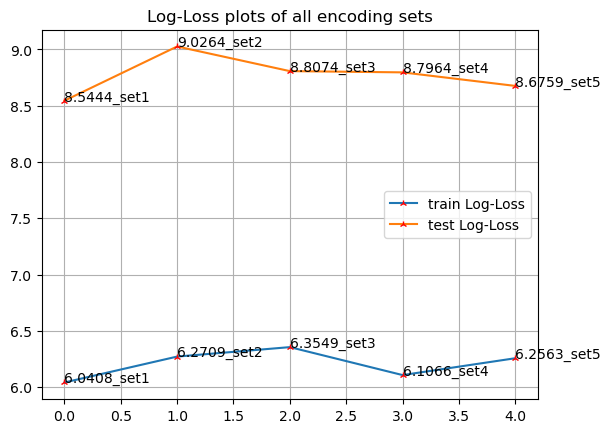

In [95]:
plots(lgb_train_auc,lgb_test_auc,'AUC')
plots(lgb_train_f1score,lgb_test_f1score,'F1 Score')
plots(lgb_train_precison,lgb_test_precison,'Precision')
plots(lgb_train_recall,lgb_test_recall,'Recall')
plots(lgb_train_log_loss,lgb_test_log_loss,'Log-Loss')

Choose set1 because overall LightGBM performs best on it   

#### 3.9.1 Hyperparameter tuning LightGBM

In [96]:
lgb_clf = lgb.LGBMClassifier(random_state=55)

param_grid = {
    'n_estimators': [50,100, 200, 300],
    'max_depth': [3, 5, 7,10],
    'learning_rate': [0.01, 0.1,0.5,0.8 ,1],
    'num_leaves': [10, 20, 30,40]
}

lgb_gbdt,best_param_lgb,best_esti_lgb,best_score_lgb = hyperparametertuning(lgb_clf, param_grid, set1_x_train , y_train,)



Fitting 3 folds for each of 100 candidates, totalling 300 fits
Best parameters are  {'num_leaves': 30, 'n_estimators': 300, 'max_depth': 10, 'learning_rate': 0.1}
Best estimators are  LGBMClassifier(max_depth=10, n_estimators=300, num_leaves=30, random_state=55)


In [97]:
#using tuned hyperparametres
hyp_lgb_clf = lgb.LGBMClassifier(random_state=55,**best_param_lgb)
hyp_lgb_clf = calibrate_model(hyp_lgb_clf,set1_x_train,y_train)
#calibrated model
hyp_lgb_clf.fit(set1_x_train,y_train)

hyp_lgb_train_pred = hyp_lgb_clf.predict(set1_x_train)
hyp_lgb_test_pred = hyp_lgb_clf.predict(set1_x_test)


hyp_lgb_tr_f1score,hyp_lgb_tr_precison,hyp_lgb_tr_recall,hyp_lgb_tr_log_loss = performance_matrices(y_train,hyp_lgb_train_pred)
hyp_lgb_te_f1score,hyp_lgb_te_precison,hyp_lgb_te_recall,hyp_lgb_te_log_loss = performance_matrices(y_test,hyp_lgb_test_pred)

hyp_lgb_tr_auc,hyp_lgb_te_auc = pred_auc_roc(hyp_lgb_clf,set1_x_train,set1_x_test,y_train,y_test,'LightGBM HYP',return_plot=False)

print('\n')
print('F1 score of train and test data after hyperparameter tuning ',hyp_lgb_tr_f1score,' , ',hyp_lgb_te_f1score)
print('AUC score of train and test data after hyperparameter tuning ',hyp_lgb_tr_auc,' , ',hyp_lgb_te_auc)



F1 score of train and test data after hyperparameter tuning  0.9055  ,  0.8037
AUC score of train and test data after hyperparameter tuning  0.967  ,  0.834


In [98]:
table('LighGBM','SET1',lgb_train_auc,lgb_test_auc,lgb_train_f1score,lgb_test_f1score,lgb_train_precison,\
      lgb_test_precison,lgb_train_recall,lgb_test_recall,lgb_train_log_loss,lgb_test_log_loss,\
     hyp_lgb_tr_auc,hyp_lgb_te_auc,hyp_lgb_tr_f1score,hyp_lgb_te_f1score,hyp_lgb_tr_precison,hyp_lgb_te_precison,\
      hyp_lgb_tr_recall,hyp_lgb_te_recall,hyp_lgb_tr_log_loss,hyp_lgb_te_log_loss)

,Set,OHE encoded features,Ordinal encoded features,K-Fold Target encoded features,Binary encoded features,Hashing encoded features,Train AUC,Test AUC,Train f1 Score,Test f1 Score,Train Precision,Test Precision,Train recall,Test recall,Train log loss,Test log loss
0,Set 1,"['destination', 'passanger', 'weather', 'coupo...","['age', 'time', 'expiration', 'income', 'tempe...",None,None,None,0.910,0.824,0.8524,0.7948,0.8178,0.7510,0.8901,0.8441,6.0408,8.5444
1,Set 2,"['gender', 'destination', 'weather']","['expiration', 'temperature', 'time']","['income', 'occupation', 'age', 'education', '...","['passanger', 'CarryAway', 'CoffeeHouse', 'Res...",None,0.908,0.813,0.8465,0.7811,0.8136,0.7447,0.8822,0.8212,6.2709,9.0264
2,SET 3,None,None,"['time', 'temperature', 'coupon', 'passanger',...","['destination', 'weather', 'gender', 'expirati...","['occupation', 'income', 'education', 'marital...",0.903,0.814,0.8451,0.7873,0.8092,0.7477,0.8843,0.8313,6.3549,8.8074
3,SET 4,"['destination', 'passanger', 'weather', 'tempe...","['CarryAway', 'CoffeeHouse', 'RestaurantLessTh...","['education', 'occupation', 'age', 'income']",None,None,0.911,0.817,0.8504,0.7875,0.8180,0.7481,0.8854,0.8313,6.1066,8.7964
4,SET 5,None,None,"['education', 'occupation', 'age', 'income', '...",None,None,0.906,0.818,0.8471,0.7915,0.8129,0.7485,0.8843,0.8397,6.2563,8.6759
5,Hyperparamere Tuned OnSET1,SET1,SET1,SET1,SET1,SET1,0.967,0.834,0.9055,0.8037,0.8740,0.7615,0.9394,0.8508,3.8422,8.1501


## 3.10 XGBOOST

          ====================               xgboost            ====================             


0it [00:00, ?it/s]

                 ------------------->   Set1   <-------------------               


--- Train CM of  xgboost ---


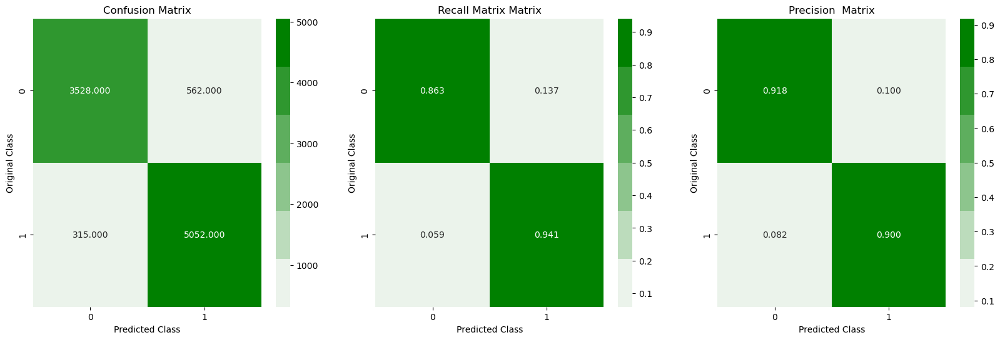



--- Test CM of xgboost ---


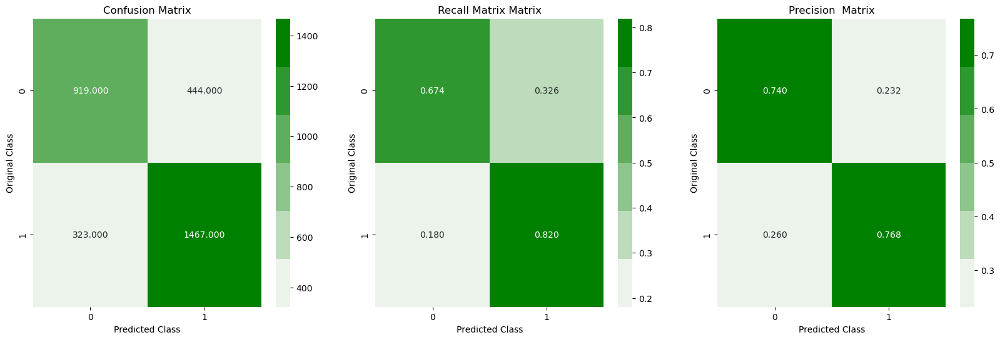

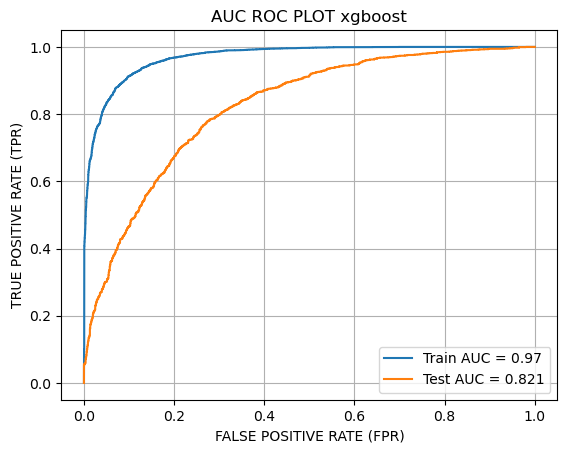

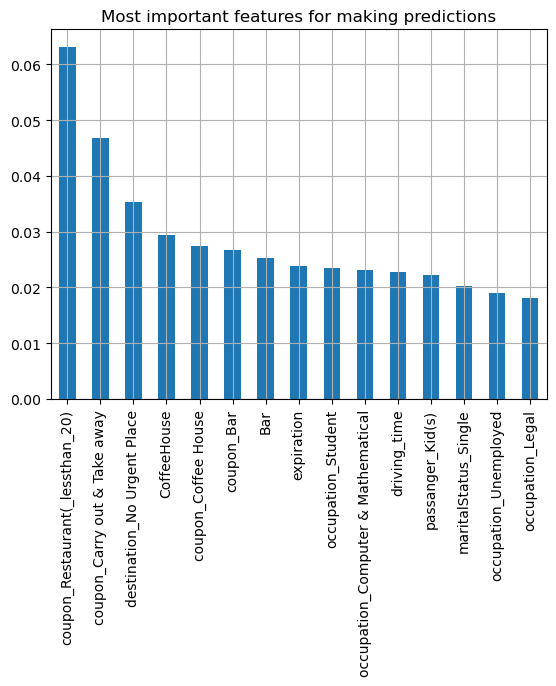

1it [00:03,  3.19s/it]

Train Auc Score--->  0.97
Test Auc Scoer --->  0.821
Train f1score is 0.9201 , precison is 0.8999 and recall is 0.9413 and log_loss is 3.203
Test f1score is 0.7928 , precison is 0.7677 and recall is 0.8196 and loh loss is 8.402


                 ------------------->   Set2   <-------------------               


--- Train CM of  xgboost ---


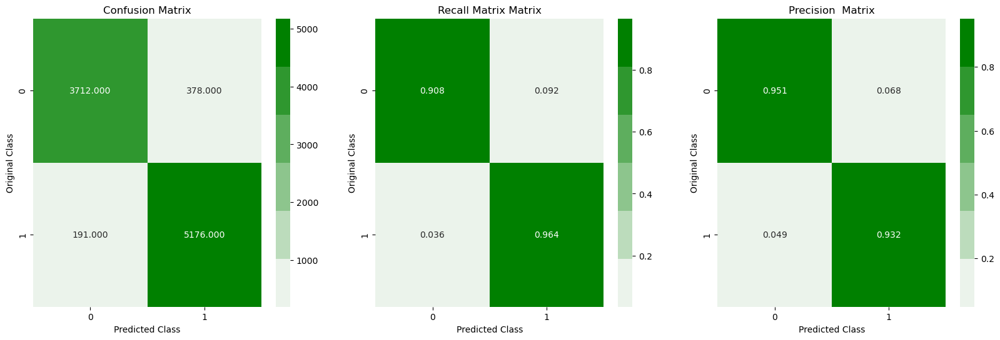



--- Test CM of xgboost ---


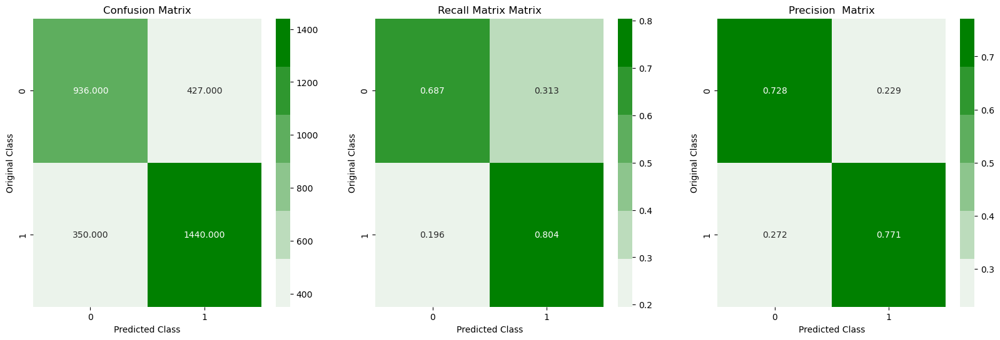

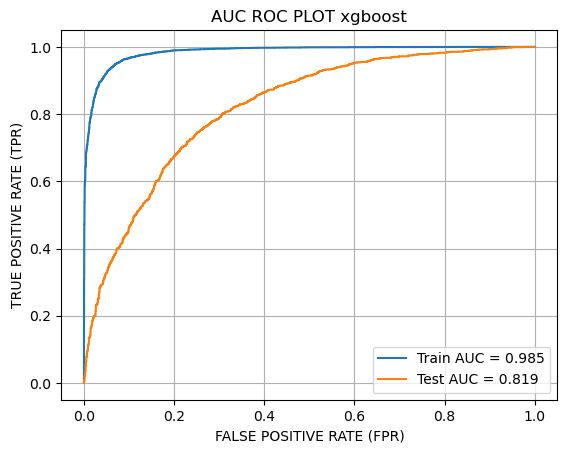

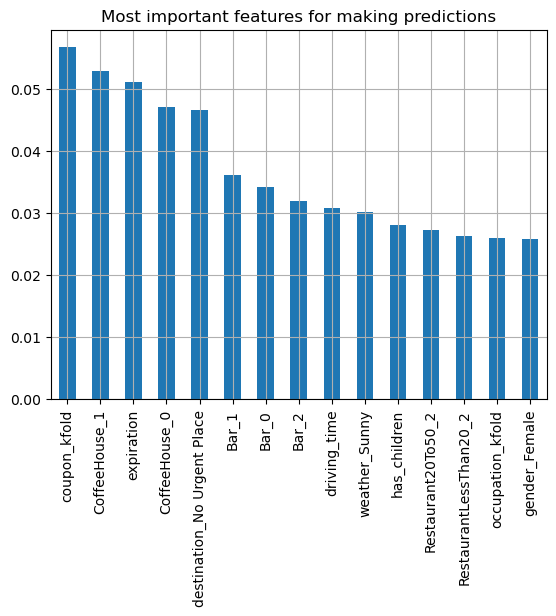

2it [00:05,  2.78s/it]

Train Auc Score--->  0.985
Test Auc Scoer --->  0.819
Train f1score is 0.9479 , precison is 0.9319 and recall is 0.9644 and log_loss is 2.0781
Test f1score is 0.7875 , precison is 0.7713 and recall is 0.8045 and loh loss is 8.5116


                 ------------------->   Set3   <-------------------               


--- Train CM of  xgboost ---


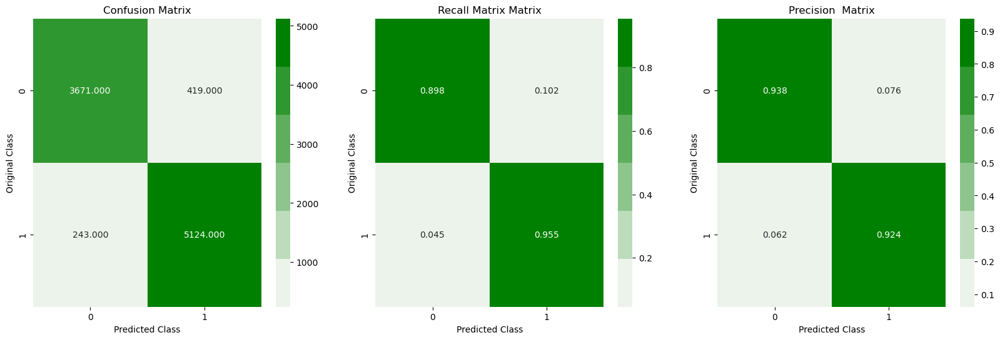



--- Test CM of xgboost ---


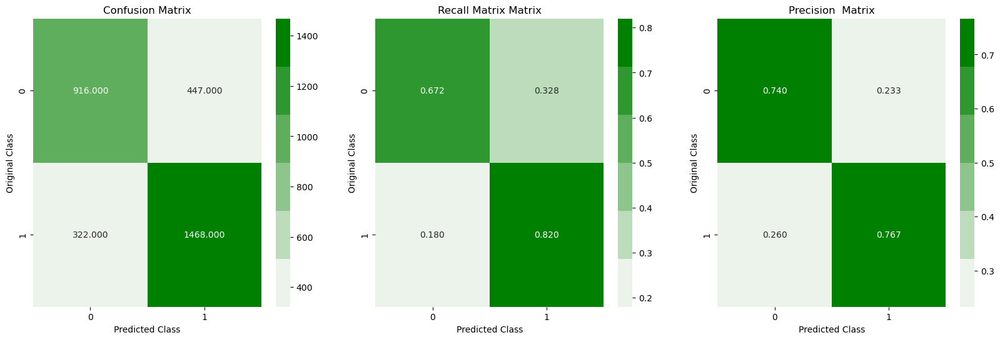

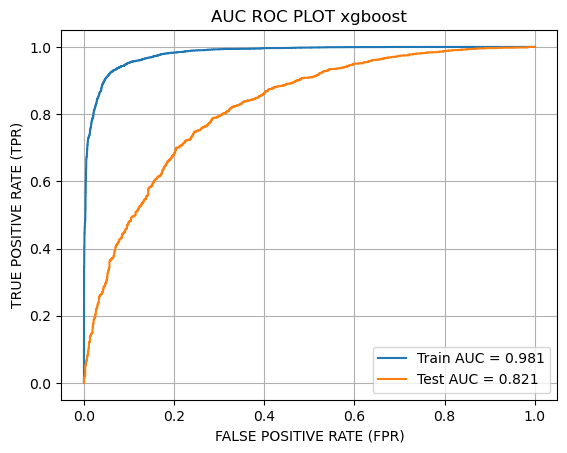

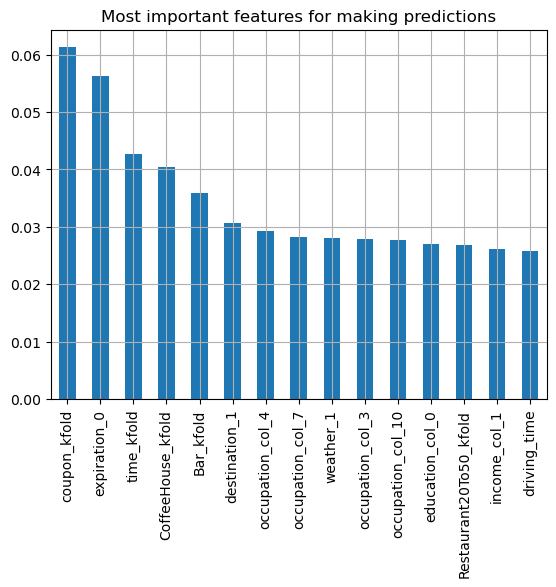

3it [00:07,  2.56s/it]

Train Auc Score--->  0.981
Test Auc Scoer --->  0.821
Train f1score is 0.9393 , precison is 0.9244 and recall is 0.9547 and log_loss is 2.4178
Test f1score is 0.7924 , precison is 0.7666 and recall is 0.8201 and loh loss is 8.4239


                 ------------------->   Set4   <-------------------               


--- Train CM of  xgboost ---


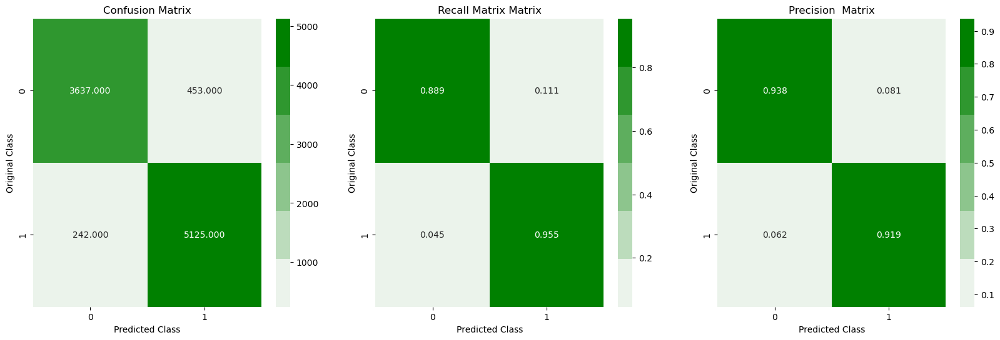



--- Test CM of xgboost ---


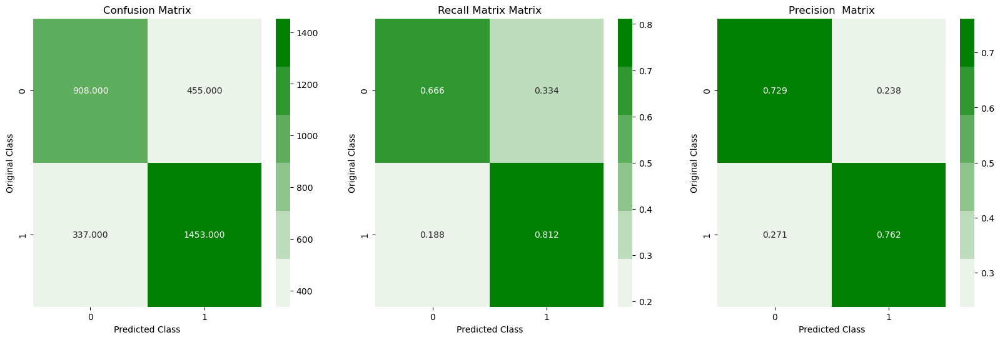

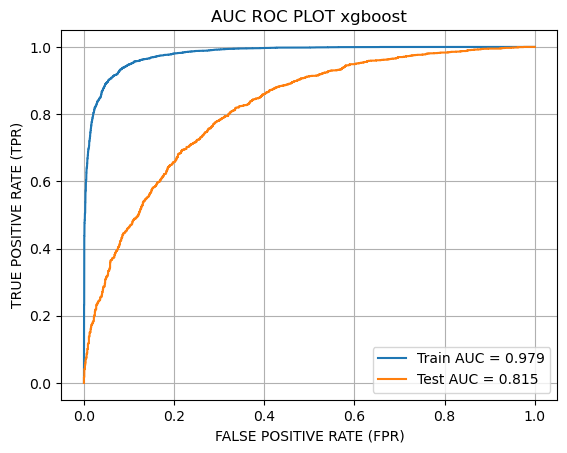

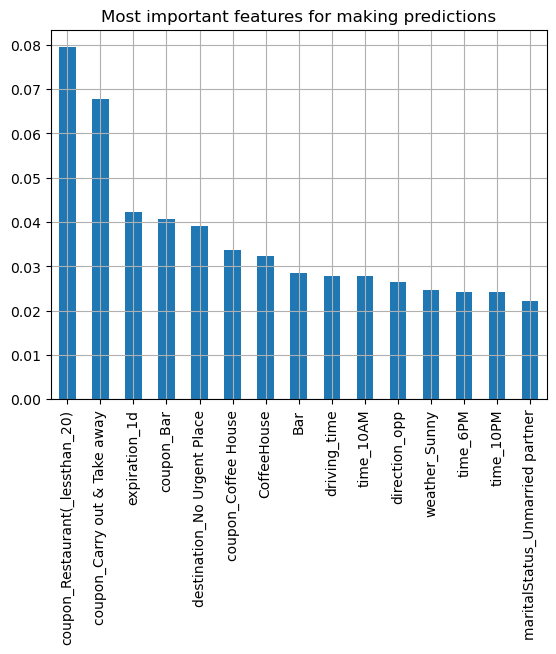

4it [00:10,  2.47s/it]

Train Auc Score--->  0.979
Test Auc Scoer --->  0.815
Train f1score is 0.9365 , precison is 0.9188 and recall is 0.9549 and log_loss is 2.5383
Test f1score is 0.7858 , precison is 0.7615 and recall is 0.8117 and loh loss is 8.6759


                 ------------------->   Set5   <-------------------               


--- Train CM of  xgboost ---


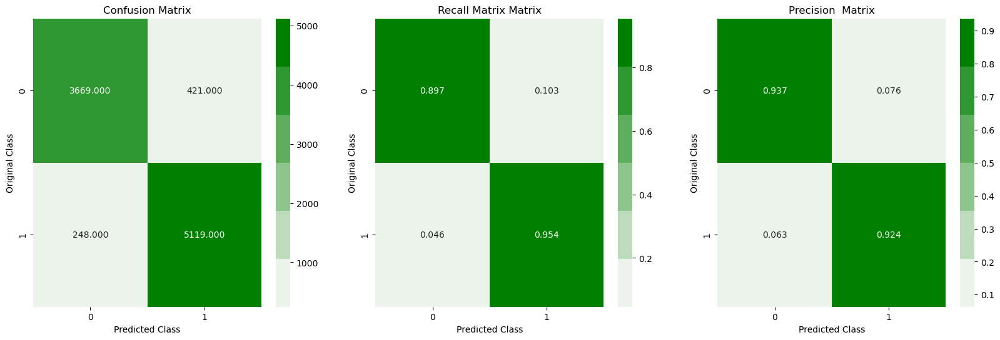



--- Test CM of xgboost ---


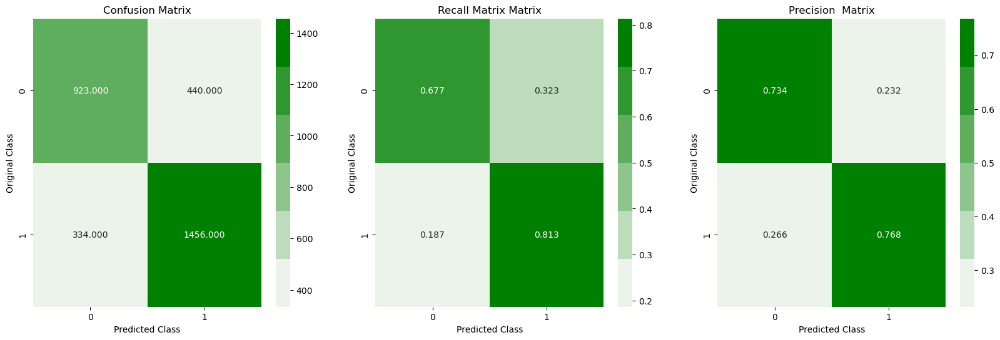

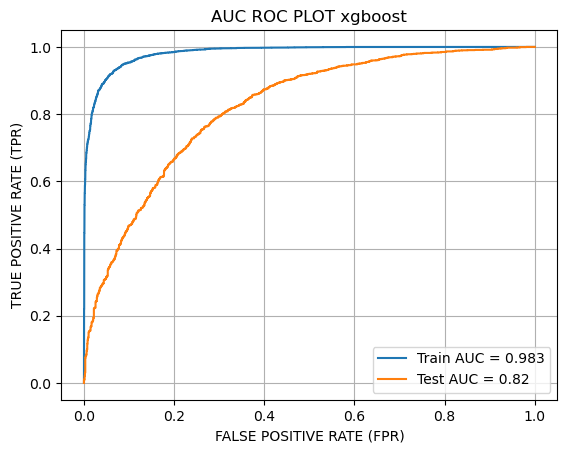

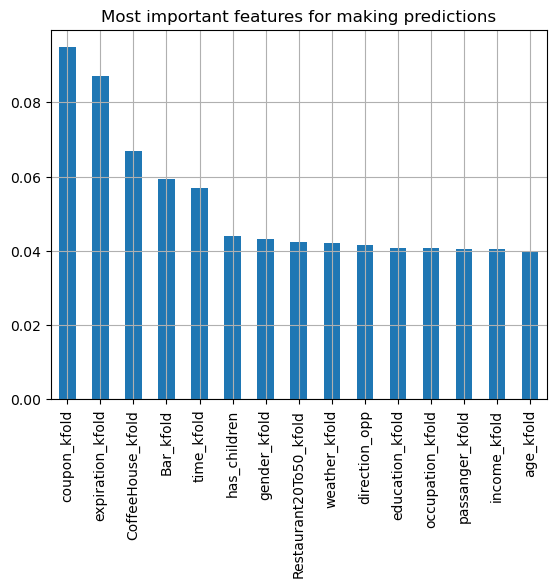

5it [00:12,  2.48s/it]

Train Auc Score--->  0.983
Test Auc Scoer --->  0.82
Train f1score is 0.9387 , precison is 0.924 and recall is 0.9538 and log_loss is 2.4434
Test f1score is 0.79 , precison is 0.7679 and recall is 0.8134 and loh loss is 8.4787




In [73]:
algorithm = 'xgboost'
xgb_train_f1score,xgb_train_precison,xgb_train_recall,xgb_train_log_loss,xgb_test_f1score,xgb_test_precison,\
    xgb_test_recall,xgb_test_log_loss ,xgb_train_auc,xgb_test_auc = set_performance(set_dict,y_train,y_test,algorithm)

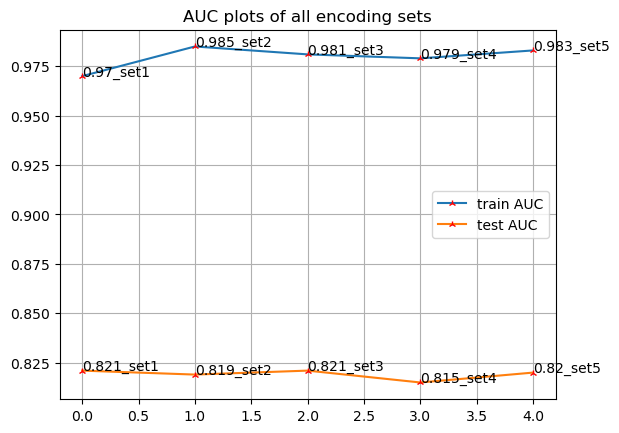

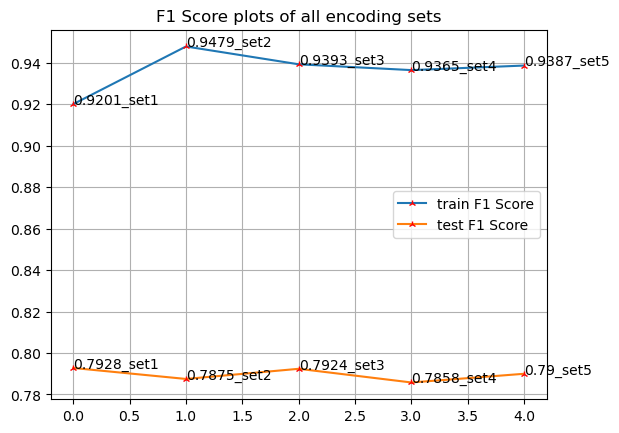

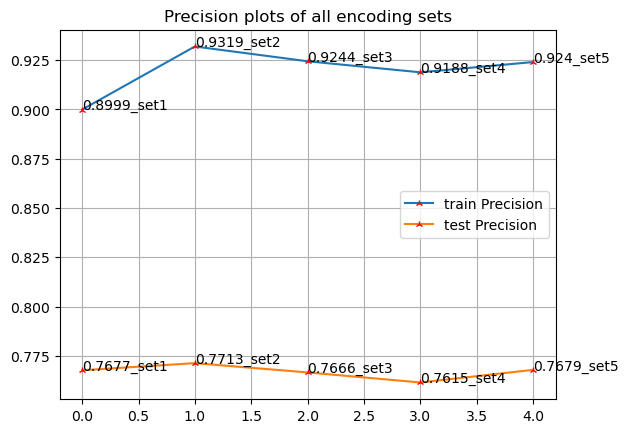

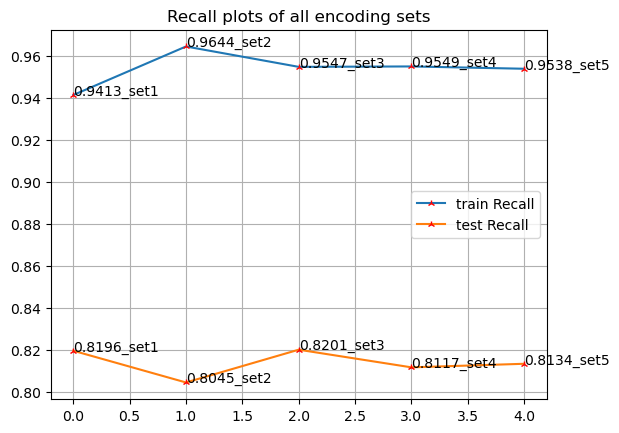

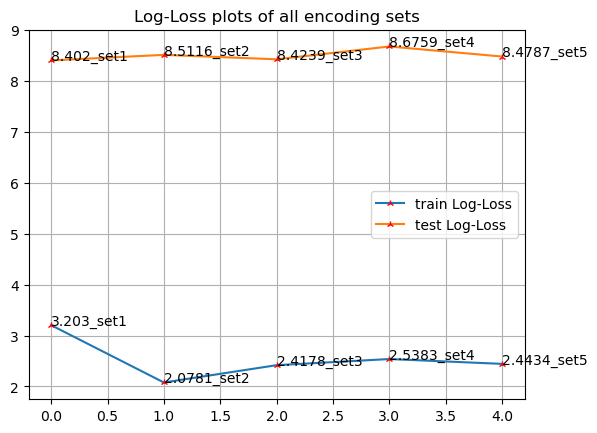

In [74]:
plots(xgb_train_auc,xgb_test_auc,'AUC')
plots(xgb_train_f1score,xgb_test_f1score,'F1 Score')
plots(xgb_train_precison,xgb_test_precison,'Precision')
plots(xgb_train_recall,xgb_test_recall,'Recall')
plots(xgb_train_log_loss,xgb_test_log_loss,'Log-Loss')

Choose set4 instead of set2 because after performing hyperparameter tuning on both set2 and set4 , set4 gavae better results

#### 3.10.1 Hyperparameter tuning for XGBoost

In [75]:
params={
 "learning_rate"    : [0.05, 0.10, 0.15, 0.20, 0.25, 0.30 ] ,
 "max_depth"        : [ 3, 4, 5, 6, 8, 10, 12, 15,20,30,40],
 "min_child_weight" : [ 1, 3, 5, 7 ],
 "gamma"            : [ 0.0, 0.1, 0.2 , 0.3, 0.4 ],
 "colsample_bytree" : [ 0.3, 0.4, 0.5 , 0.7 ],
    'n_estimators' : [10,20,40,80,120,180,200,250,300]
    
}

xgb_clf = xgb.XGBClassifier(random_state=55)
xgb_gbdt,best_param_xgb,best_esti_xgb,best_score_xgb = hyperparametertuning(xgb_clf, params, set4_x_train , y_train,)



hyp_xgb_clf =  xgb.XGBClassifier(random_state=55,**best_param_xgb)

hyp_xgb_clf.fit(set4_x_train,y_train)

hyp_xgb_train_pred = hyp_xgb_clf.predict(set4_x_train)
hyp_xgb_test_pred = hyp_xgb_clf.predict(set4_x_test)


hyp_xgb_tr_f1score,hyp_xgb_tr_precison,hyp_xgb_tr_recall,hyp_xgb_tr_log_loss = performance_matrices(y_train,hyp_xgb_train_pred)
hyp_xgb_te_f1score,hyp_xgb_te_precison,hyp_xgb_te_recall,hyp_xgb_te_log_loss = performance_matrices(y_test,hyp_xgb_test_pred)

hyp_xgb_tr_auc,hyp_xgb_te_auc = pred_auc_roc(hyp_xgb_clf,set4_x_train,set4_x_test,y_train,y_test,'XGBOOST HYP',return_plot=False)

print('\n')
print('F1 score of train and test data after hyperparameter tuning ',hyp_xgb_tr_f1score,' , ',hyp_xgb_te_f1score)
print('AUC score of train and test data after hyperparameter tuning ',hyp_xgb_tr_auc,' , ',hyp_xgb_te_auc)

Fitting 3 folds for each of 100 candidates, totalling 300 fits
Best parameters are  {'n_estimators': 40, 'min_child_weight': 1, 'max_depth': 40, 'learning_rate': 0.05, 'gamma': 0.2, 'colsample_bytree': 0.5}
Best estimators are  XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.5, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=0.2, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.05, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=40, max_leaves=None,
              min_child_weight=1, missing=nan, monotone_constraints=None,
              n_estimators=40, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=55, ...)


F1 score of train and test d

In [76]:
table('XGBOOST','SET4',xgb_train_auc,xgb_test_auc,xgb_train_f1score,xgb_test_f1score,xgb_train_precison,\
      xgb_test_precison,xgb_train_recall,xgb_test_recall,xgb_train_log_loss,xgb_test_log_loss,\
     hyp_xgb_tr_auc,hyp_xgb_te_auc,hyp_xgb_tr_f1score,hyp_xgb_te_f1score,hyp_xgb_tr_precison,hyp_xgb_te_precison,\
      hyp_xgb_tr_recall,hyp_xgb_te_recall,hyp_xgb_tr_log_loss,hyp_xgb_te_log_loss)

,Set,OHE encoded features,Ordinal encoded features,K-Fold Target encoded features,Binary encoded features,Hashing encoded features,Train AUC,Test AUC,Train f1 Score,Test f1 Score,Train Precision,Test Precision,Train recall,Test recall,Train log loss,Test log loss
0,Set 1,"['destination', 'passanger', 'weather', 'coupo...","['age', 'time', 'expiration', 'income', 'tempe...",None,None,None,0.970,0.821,0.9201,0.7928,0.8999,0.7677,0.9413,0.8196,3.2030,8.4020
1,Set 2,"['gender', 'destination', 'weather']","['expiration', 'temperature', 'time']","['income', 'occupation', 'age', 'education', '...","['passanger', 'CarryAway', 'CoffeeHouse', 'Res...",None,0.985,0.819,0.9479,0.7875,0.9319,0.7713,0.9644,0.8045,2.0781,8.5116
2,SET 3,None,None,"['time', 'temperature', 'coupon', 'passanger',...","['destination', 'weather', 'gender', 'expirati...","['occupation', 'income', 'education', 'marital...",0.981,0.821,0.9393,0.7924,0.9244,0.7666,0.9547,0.8201,2.4178,8.4239
3,SET 4,"['destination', 'passanger', 'weather', 'tempe...","['CarryAway', 'CoffeeHouse', 'RestaurantLessTh...","['education', 'occupation', 'age', 'income']",None,None,0.979,0.815,0.9365,0.7858,0.9188,0.7615,0.9549,0.8117,2.5383,8.6759
4,SET 5,None,None,"['education', 'occupation', 'age', 'income', '...",None,None,0.983,0.820,0.9387,0.7900,0.9240,0.7679,0.9538,0.8134,2.4434,8.4787
5,Hyperparamere Tuned OnSET4,SET4,SET4,SET4,SET4,SET4,0.994,0.817,0.9635,0.7967,0.9456,0.7544,0.9821,0.8441,1.4573,8.4459


## 3.11 ADA BOOST(with DT)

          ====================               adaboost            ====================             


0it [00:00, ?it/s]

                 ------------------->   Set1   <-------------------               


--- Train CM of  adaboost ---


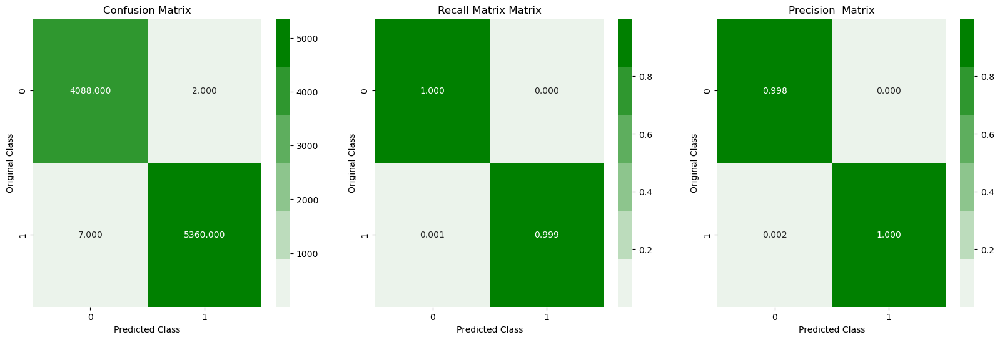



--- Test CM of adaboost ---


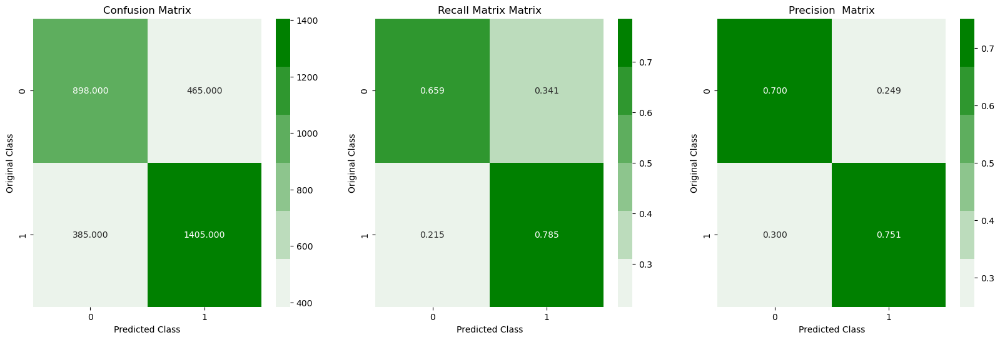

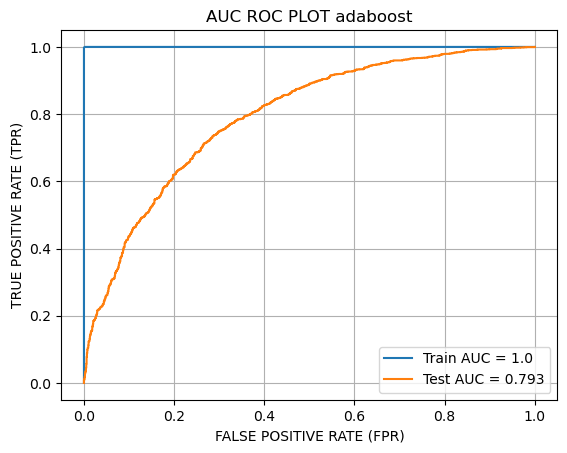

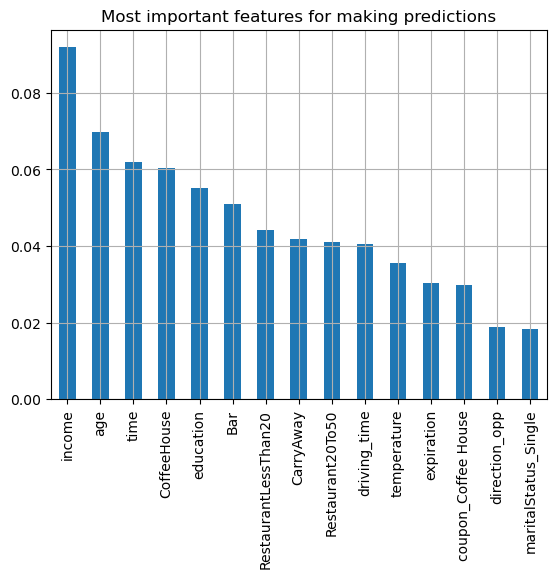

1it [00:04,  4.42s/it]

Train Auc Score--->  1.0
Test Auc Scoer --->  0.793
Train f1score is 0.9992 , precison is 0.9996 and recall is 0.9987 and log_loss is 0.0329
Test f1score is 0.7678 , precison is 0.7513 and recall is 0.7849 and loh loss is 9.3112


                 ------------------->   Set2   <-------------------               


--- Train CM of  adaboost ---


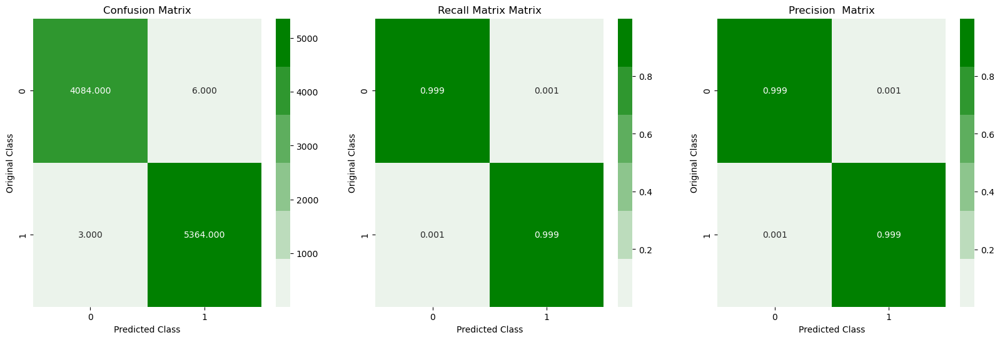



--- Test CM of adaboost ---


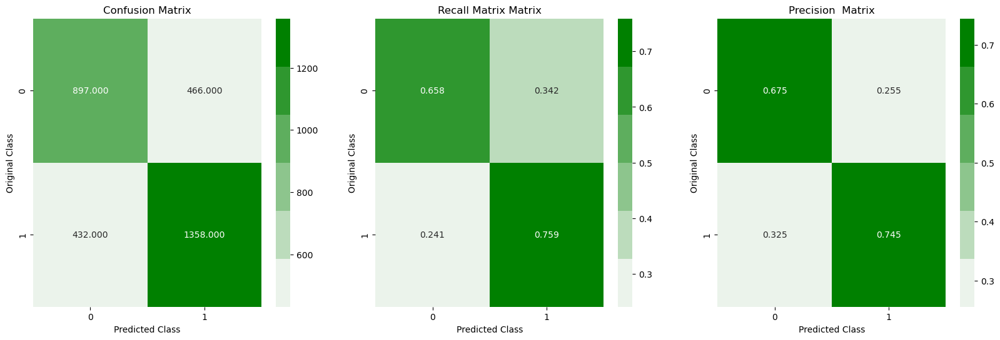

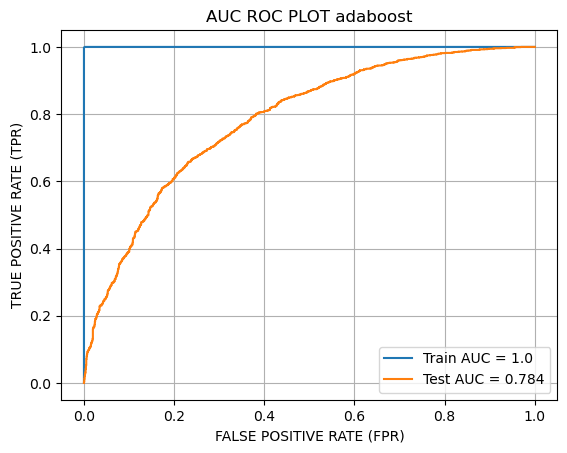

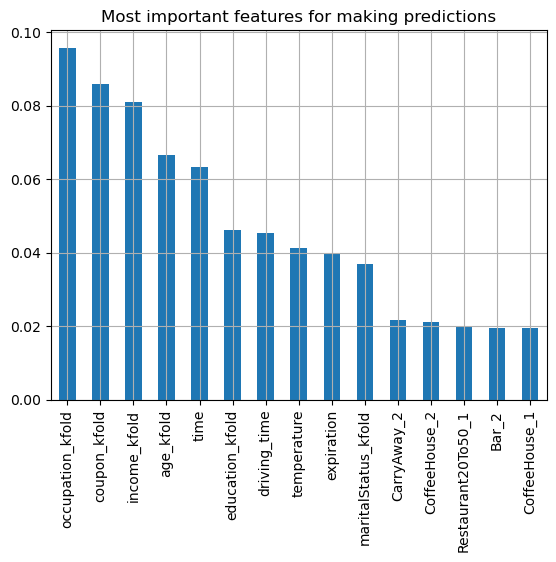

2it [00:08,  4.01s/it]

Train Auc Score--->  1.0
Test Auc Scoer --->  0.784
Train f1score is 0.9992 , precison is 0.9989 and recall is 0.9994 and log_loss is 0.0329
Test f1score is 0.7515 , precison is 0.7445 and recall is 0.7587 and loh loss is 9.837


                 ------------------->   Set3   <-------------------               


--- Train CM of  adaboost ---


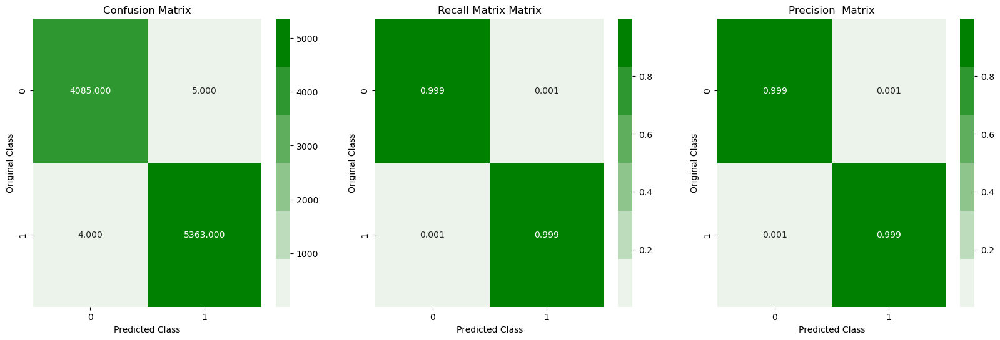



--- Test CM of adaboost ---


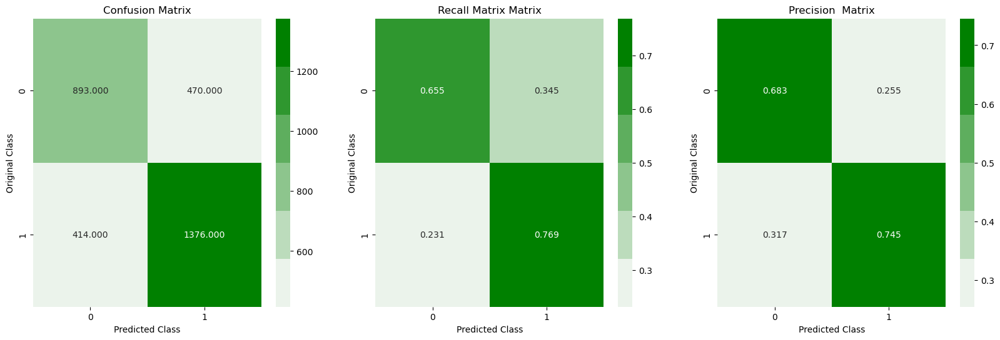

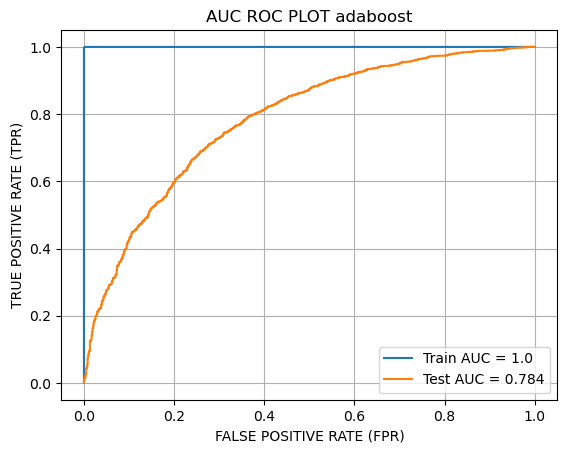

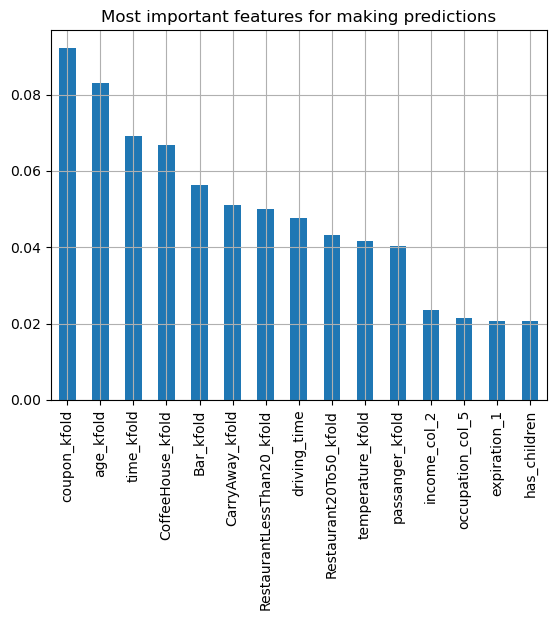

3it [00:11,  3.94s/it]

Train Auc Score--->  1.0
Test Auc Scoer --->  0.784
Train f1score is 0.9992 , precison is 0.9991 and recall is 0.9993 and log_loss is 0.0329
Test f1score is 0.7569 , precison is 0.7454 and recall is 0.7687 and loh loss is 9.6837


                 ------------------->   Set4   <-------------------               


--- Train CM of  adaboost ---


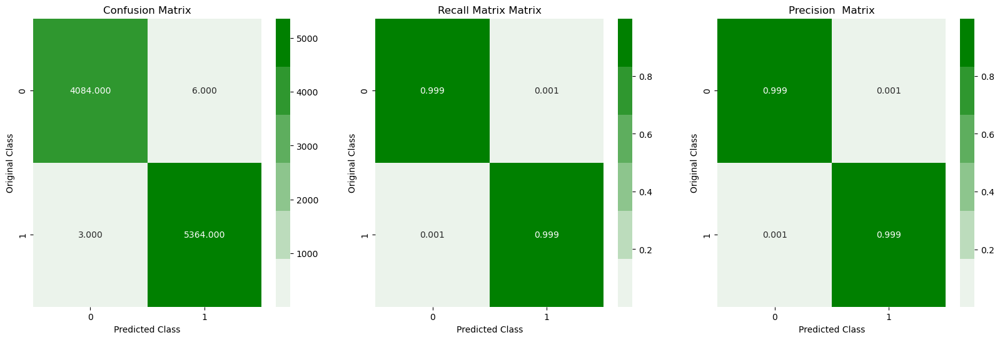



--- Test CM of adaboost ---


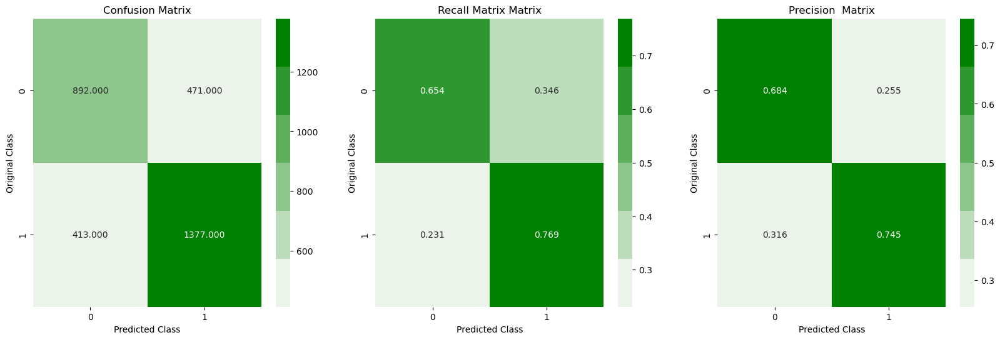

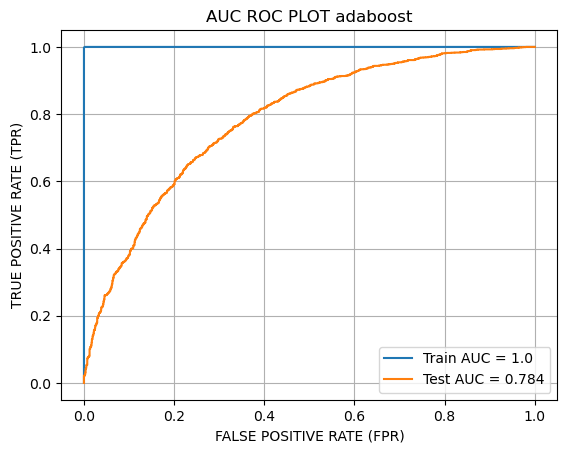

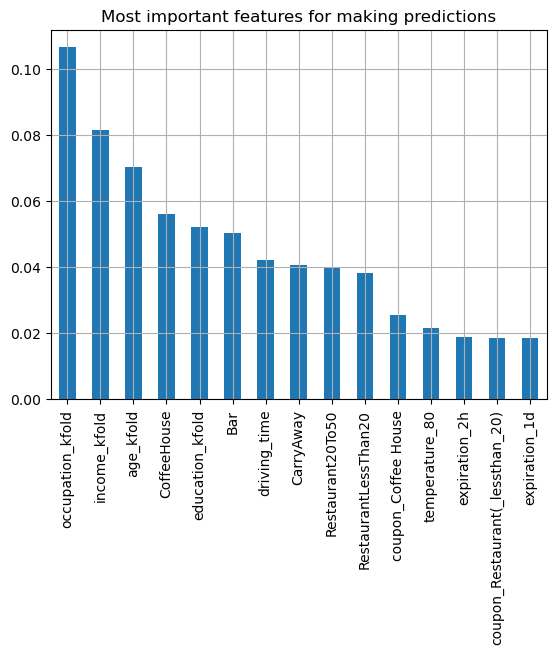

4it [00:15,  3.94s/it]

Train Auc Score--->  1.0
Test Auc Scoer --->  0.784
Train f1score is 0.9992 , precison is 0.9989 and recall is 0.9994 and log_loss is 0.0329
Test f1score is 0.757 , precison is 0.7451 and recall is 0.7693 and loh loss is 9.6837


                 ------------------->   Set5   <-------------------               


--- Train CM of  adaboost ---


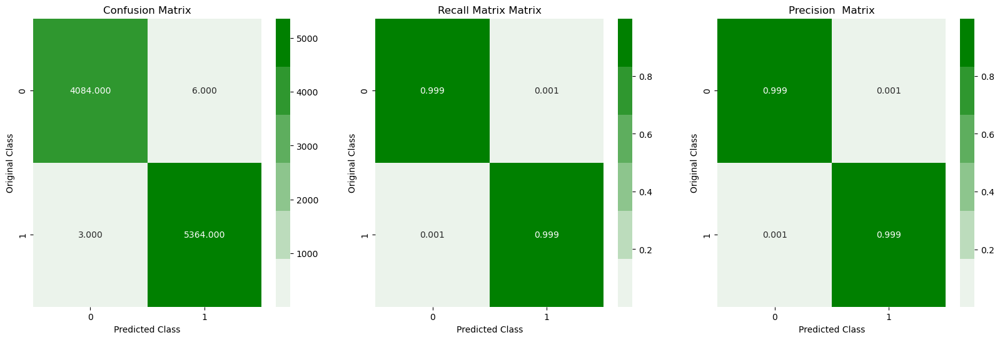



--- Test CM of adaboost ---


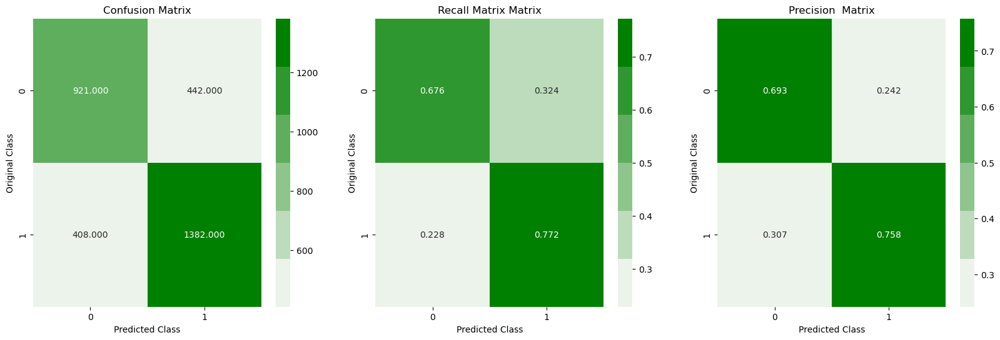

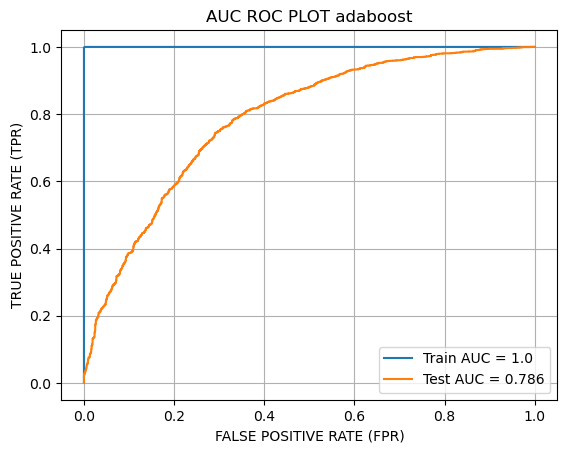

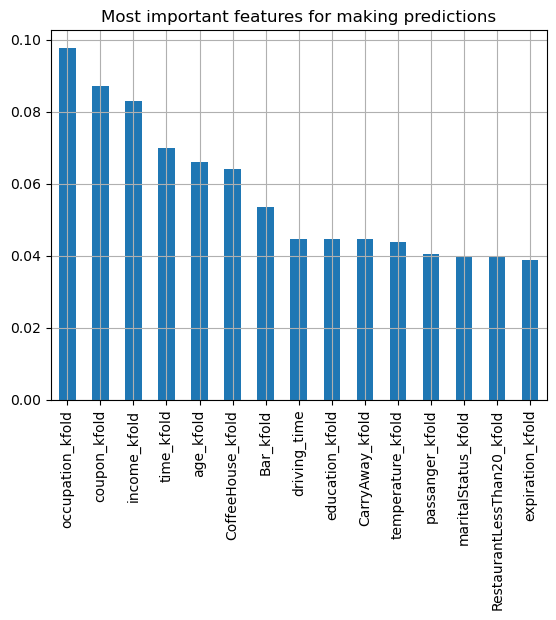

5it [00:19,  3.82s/it]

Train Auc Score--->  1.0
Test Auc Scoer --->  0.786
Train f1score is 0.9992 , precison is 0.9989 and recall is 0.9994 and log_loss is 0.0329
Test f1score is 0.7648 , precison is 0.7577 and recall is 0.7721 and loh loss is 9.3112




In [77]:
algorithm = 'adaboost'
base_learner  = DecisionTreeClassifier(random_state=55,**best_param_dt)
ada_train_f1score,ada_train_precison,ada_train_recall,ada_train_log_loss,ada_test_f1score,ada_test_precison,\
    ada_test_recall,ada_test_log_loss ,ada_train_auc,ada_test_auc = set_performance(set_dict,y_train,y_test,algorithm,base_learner)

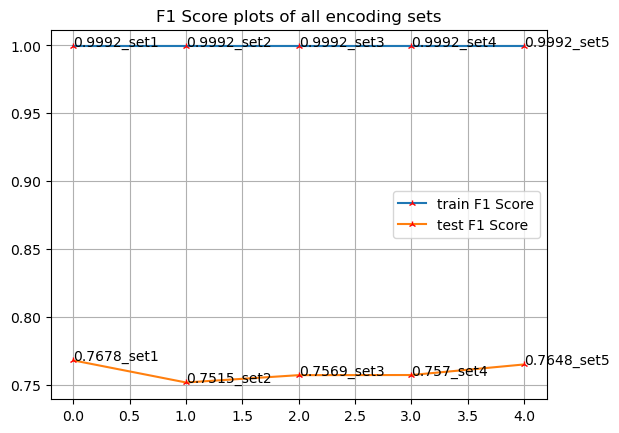

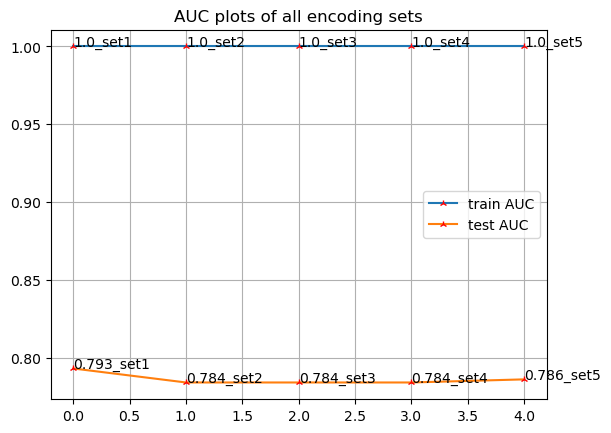

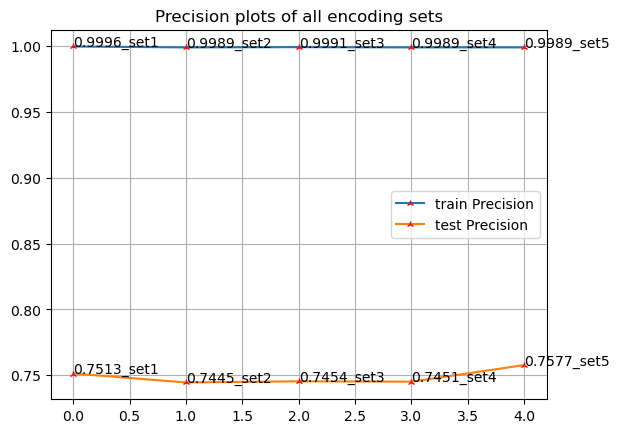

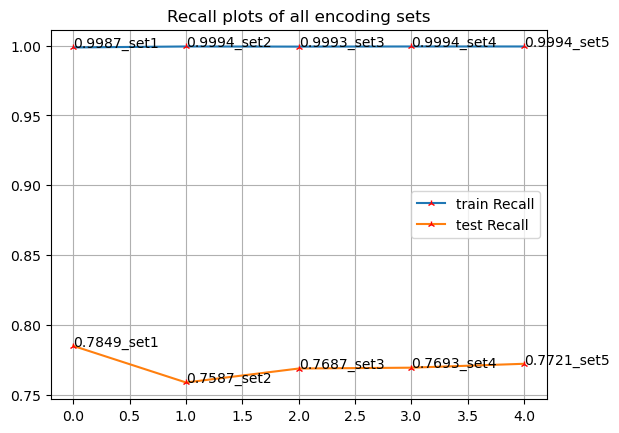

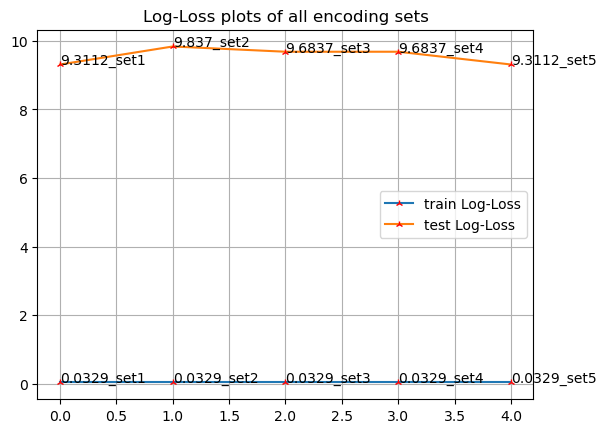

In [78]:
plots(ada_train_f1score,ada_test_f1score,'F1 Score')
plots(ada_train_auc,ada_test_auc,'AUC')
plots(ada_train_precison,ada_test_precison,'Precision')
plots(ada_train_recall,ada_test_recall,'Recall')
plots(ada_train_log_loss,ada_test_log_loss,'Log-Loss')

Overfitting on the train data for every set . Comparatively performs best on  set 5

#### 3.11.1 Hyperparameter tuning LightGBM

In [80]:
#hyp parameter tuing adaboost
parameters = {
    'n_estimators': [ 10, 50,100,150,200,250,300],
    'learning_rate': [0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1],

}
ada_clf = AdaBoostClassifier(base_estimator=base_learner,random_state=55)
ada_gbdt,best_param_ada,best_esti_ada,best_score_ada = hyperparametertuning(ada_clf, parameters, set5_x_train , y_train,)
#so we trained it on set 2 also and we had better train f1 on this set than set2 and rst of the metrics were having same value
#using tuned hyperparametres
hyp_ada_clf =  AdaBoostClassifier(base_estimator=base_learner,random_state=55,**best_param_ada)

#calibrated model
hyp_ada_clf.fit(set5_x_train,y_train)

hyp_ada_train_pred = hyp_ada_clf.predict(set5_x_train)
hyp_ada_test_pred = hyp_ada_clf.predict(set5_x_test)


hyp_ada_tr_f1score,hyp_ada_tr_precison,hyp_ada_tr_recall,hyp_ada_tr_log_loss = performance_matrices(y_train,hyp_ada_train_pred)
hyp_ada_te_f1score,hyp_ada_te_precison,hyp_ada_te_recall,hyp_ada_te_log_loss = performance_matrices(y_test,hyp_ada_test_pred)

hyp_ada_tr_auc,hyp_ada_te_auc = pred_auc_roc(hyp_ada_clf,set5_x_train,set5_x_test,y_train,y_test,'adaBOOST HYP',return_plot=False)

print('\n')
print('F1 score of train and test data after hyperparameter tuning ',hyp_ada_tr_f1score,' , ',hyp_ada_te_f1score)
print('AUC score of train and test data after hyperparameter tuning ',hyp_ada_tr_auc,' , ',hyp_ada_te_auc)




Fitting 3 folds for each of 70 candidates, totalling 210 fits
Best parameters are  {'n_estimators': 100, 'learning_rate': 0.1}
Best estimators are  AdaBoostClassifier(base_estimator=DecisionTreeClassifier(max_depth=12,
                                                         min_samples_leaf=20,
                                                         min_samples_split=12,
                                                         random_state=55),
                   learning_rate=0.1, n_estimators=100, random_state=55)


F1 score of train and test data after hyperparameter tuning  0.9991  ,  0.7786
AUC score of train and test data after hyperparameter tuning  1.0  ,  0.804


In [81]:
table('ADABOOST','SET5',ada_train_auc,ada_test_auc,ada_train_f1score,ada_test_f1score,ada_train_precison,\
      ada_test_precison,ada_train_recall,ada_test_recall,ada_train_log_loss,ada_test_log_loss,\
     hyp_ada_tr_auc,hyp_ada_te_auc,hyp_ada_tr_f1score,hyp_ada_te_f1score,hyp_ada_tr_precison,hyp_ada_te_precison,\
      hyp_ada_tr_recall,hyp_ada_te_recall,hyp_ada_tr_log_loss,hyp_ada_te_log_loss)

,Set,OHE encoded features,Ordinal encoded features,K-Fold Target encoded features,Binary encoded features,Hashing encoded features,Train AUC,Test AUC,Train f1 Score,Test f1 Score,Train Precision,Test Precision,Train recall,Test recall,Train log loss,Test log loss
0,Set 1,"['destination', 'passanger', 'weather', 'coupo...","['age', 'time', 'expiration', 'income', 'tempe...",None,None,None,1.0,0.793,0.9992,0.7678,0.9996,0.7513,0.9987,0.7849,0.0329,9.3112
1,Set 2,"['gender', 'destination', 'weather']","['expiration', 'temperature', 'time']","['income', 'occupation', 'age', 'education', '...","['passanger', 'CarryAway', 'CoffeeHouse', 'Res...",None,1.0,0.784,0.9992,0.7515,0.9989,0.7445,0.9994,0.7587,0.0329,9.8370
2,SET 3,None,None,"['time', 'temperature', 'coupon', 'passanger',...","['destination', 'weather', 'gender', 'expirati...","['occupation', 'income', 'education', 'marital...",1.0,0.784,0.9992,0.7569,0.9991,0.7454,0.9993,0.7687,0.0329,9.6837
3,SET 4,"['destination', 'passanger', 'weather', 'tempe...","['CarryAway', 'CoffeeHouse', 'RestaurantLessTh...","['education', 'occupation', 'age', 'income']",None,None,1.0,0.784,0.9992,0.7570,0.9989,0.7451,0.9994,0.7693,0.0329,9.6837
4,SET 5,None,None,"['education', 'occupation', 'age', 'income', '...",None,None,1.0,0.786,0.9992,0.7648,0.9989,0.7577,0.9994,0.7721,0.0329,9.3112
5,Hyperparamere Tuned OnSET5,SET5,SET5,SET5,SET5,SET5,1.0,0.804,0.9991,0.7786,0.9993,0.7623,0.9989,0.7955,0.0365,8.8731


### NOTE:- With using  RF for AdaBoost it out of memory every time and the kernel dies

## 3.12 STACKING

In [84]:
def stacking(set_dict,y_train,y_test,algorithm,feature_importance=False,**kwarg):
    '''Function which applied STACKING ALGO on all 5 sets'''
    set_train_f1score,set_train_precison,set_train_recall,set_train_log_loss,set_test_f1score,set_test_precison,\
    set_test_recall,set_test_log_loss,set_train_auc,set_test_auc = [],[],[],[],[],[],[],[],[],[]
    estimators = [
                    ('logisticregression', LogisticRegression(random_state=55,**best_param)),
                    ('knn', KNeighborsClassifier(**best_param_knn)),
                    ('decison-tree', DecisionTreeClassifier(**best_param_dt,random_state=55)),
                    ('naivebaes', MultinomialNB(**best_param_mnb)),
                    ('linearsvc',LinearSVC(random_state=55,**best_param_linsvc)),
                    ('svm-rbf', SVC(random_state=55,**best_param_svm)),
                    ('gbdt',GradientBoostingClassifier(**best_param_gbdt,random_state=55)),
                    ('randomforest',RandomForestClassifier(**best_param_rf, random_state=42, n_jobs=-1)),
                    ('xgboost', xgb.XGBClassifier(**best_param_xgb, random_state=55))
                 ]
    for set_name,train_test_set in tqdm(zip(set_dict.keys(),set_dict.values())):
        print('------------------------        ',set_name,'        ------------------------')
        clf = StackingClassifier(estimators=estimators, final_estimator=LogisticRegression(random_state=55,**best_param))
        clf.fit(train_test_set[0],y_train)

        train_pred = clf.predict(train_test_set[0])
        test_pred = clf.predict(train_test_set[1])
        #calculating scores
        train_f1score,train_precison,train_recall,train_log_loss,test_f1score,test_precison,test_recall,test_log_loss,\
        train_auc,test_auc =\
                        plots_metrices_featureimportance(clf,train_test_set[0],train_test_set[1],y_train,\
                    y_test,train_pred,test_pred,title = algorithm,important_features=feature_importance,top_features = 15)
        print('\n')
        set_train_f1score.append(train_f1score)
        set_test_f1score.append(test_f1score)
        set_train_precison.append(train_precison)
        set_test_precison.append(test_precison)
        set_train_recall.append(train_recall)
        set_test_recall.append(test_recall)
        set_train_log_loss.append(train_log_loss)
        set_test_log_loss.append(test_log_loss)
        set_train_auc.append(train_auc)
        set_test_auc.append(test_auc)
    return set_train_f1score,set_train_precison,set_train_recall,set_train_log_loss,set_test_f1score,set_test_precison,\
    set_test_recall,set_test_log_loss ,set_train_auc,set_test_auc

0it [00:00, ?it/s]

------------------------         Set1         ------------------------


--- Train CM of  STACKING ---


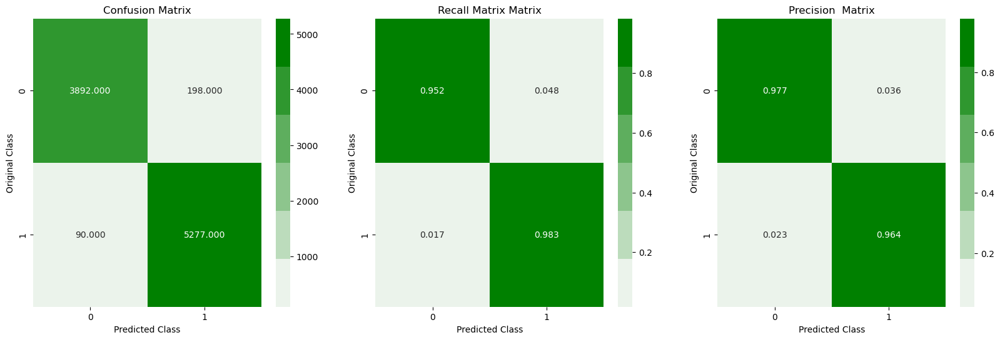



--- Test CM of STACKING ---


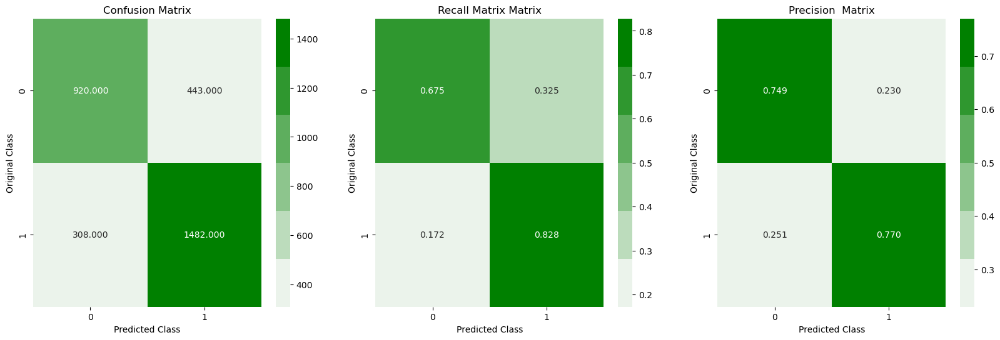

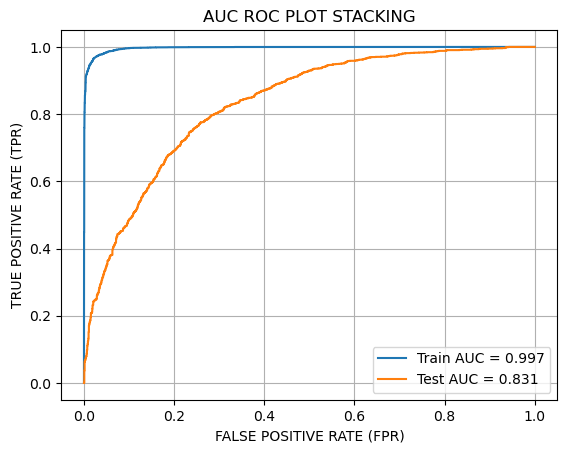

1it [02:08, 128.22s/it]

Train Auc Score--->  0.997
Test Auc Scoer --->  0.831
Train f1score is 0.9734 , precison is 0.9638 and recall is 0.9832 and log_loss is 1.0518
Test f1score is 0.7978 , precison is 0.7699 and recall is 0.8279 and loh loss is 8.2268


------------------------         Set2         ------------------------


--- Train CM of  STACKING ---


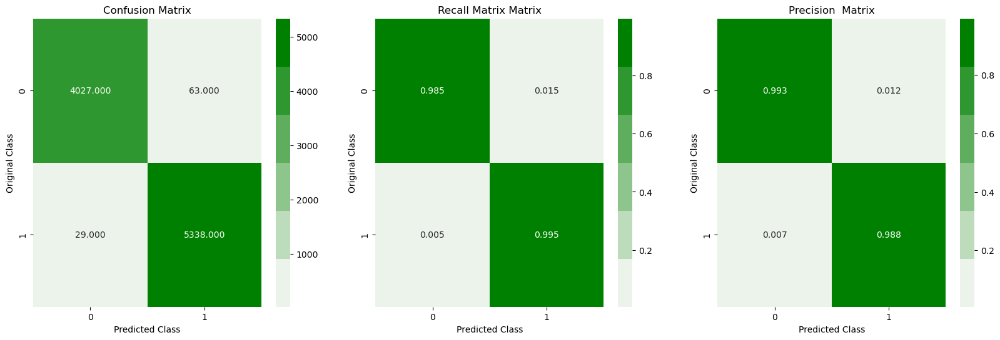



--- Test CM of STACKING ---


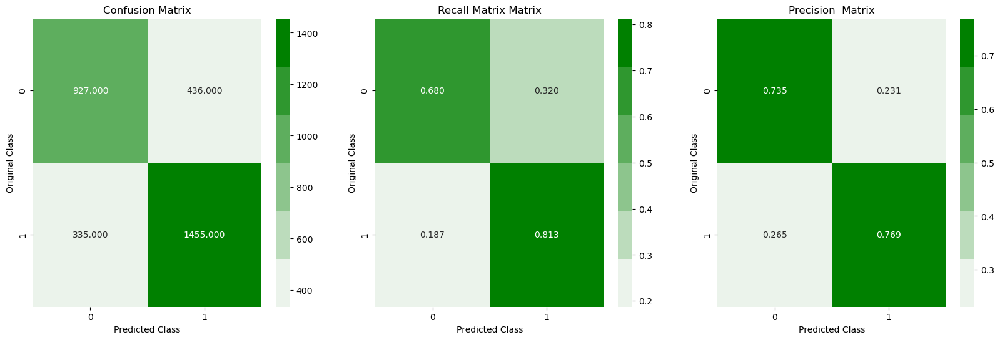

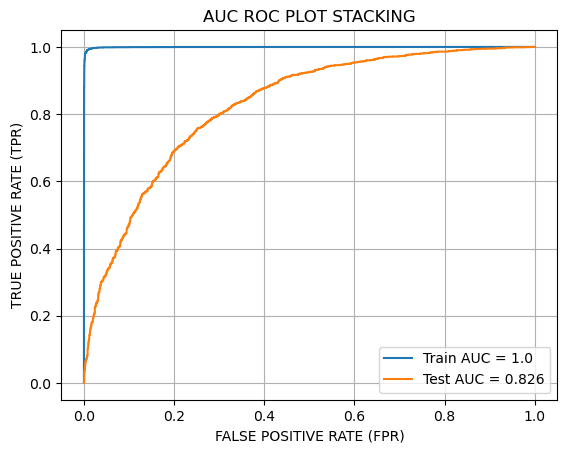

2it [04:02, 120.09s/it]

Train Auc Score--->  1.0
Test Auc Scoer --->  0.826
Train f1score is 0.9915 , precison is 0.9883 and recall is 0.9946 and log_loss is 0.336
Test f1score is 0.7905 , precison is 0.7694 and recall is 0.8128 and loh loss is 8.4458


------------------------         Set3         ------------------------


--- Train CM of  STACKING ---


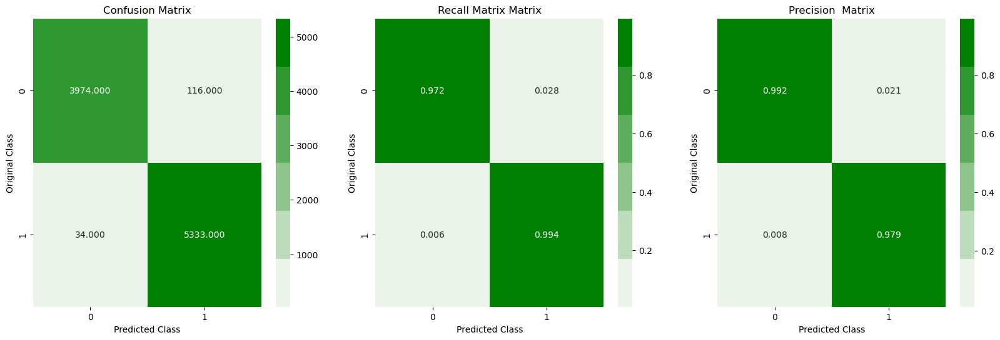



--- Test CM of STACKING ---


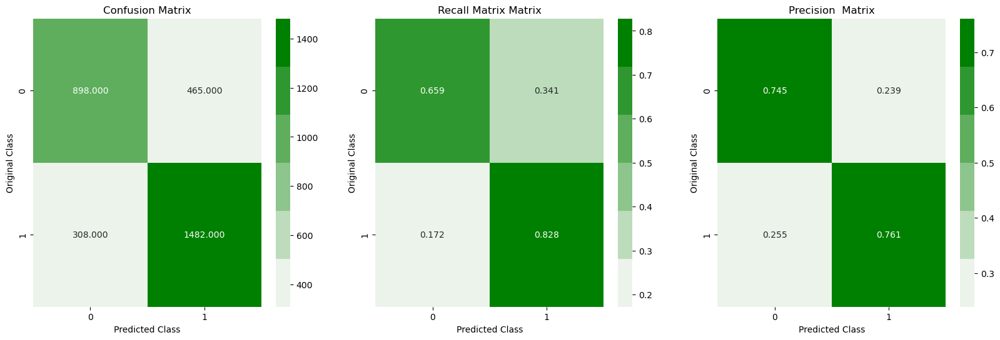

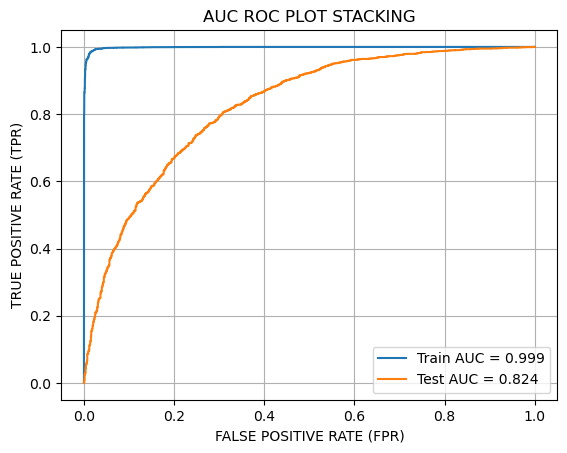

3it [06:02, 119.96s/it]

Train Auc Score--->  0.999
Test Auc Scoer --->  0.824
Train f1score is 0.9861 , precison is 0.9787 and recall is 0.9937 and log_loss is 0.5478
Test f1score is 0.7931 , precison is 0.7612 and recall is 0.8279 and loh loss is 8.4678


------------------------         Set4         ------------------------


--- Train CM of  STACKING ---


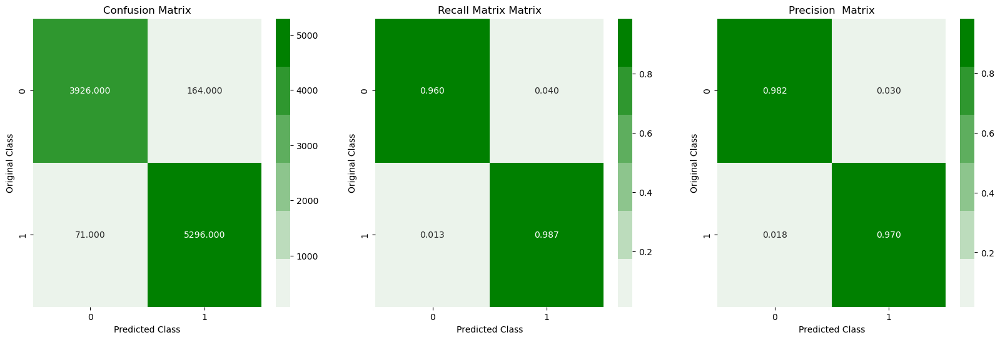



--- Test CM of STACKING ---


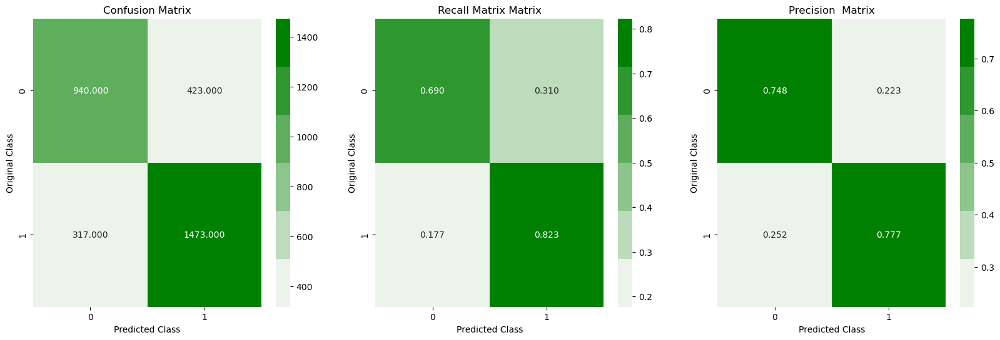

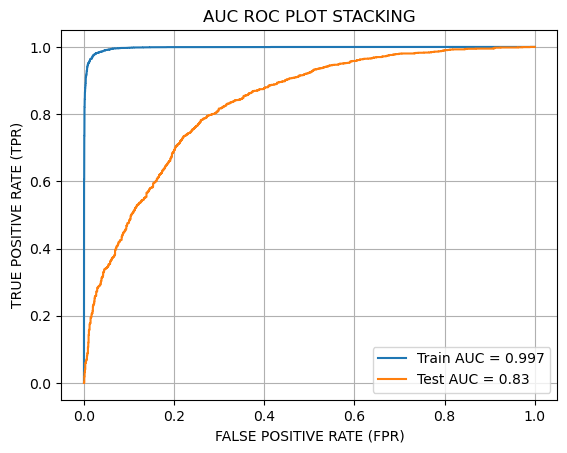

4it [07:54, 116.88s/it]

Train Auc Score--->  0.997
Test Auc Scoer --->  0.83
Train f1score is 0.9783 , precison is 0.97 and recall is 0.9868 and log_loss is 0.8583
Test f1score is 0.7992 , precison is 0.7769 and recall is 0.8229 and loh loss is 8.1063


------------------------         Set5         ------------------------


--- Train CM of  STACKING ---


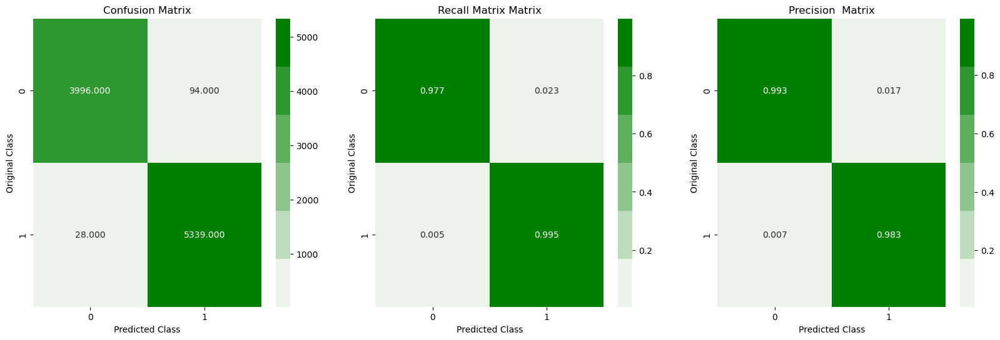



--- Test CM of STACKING ---


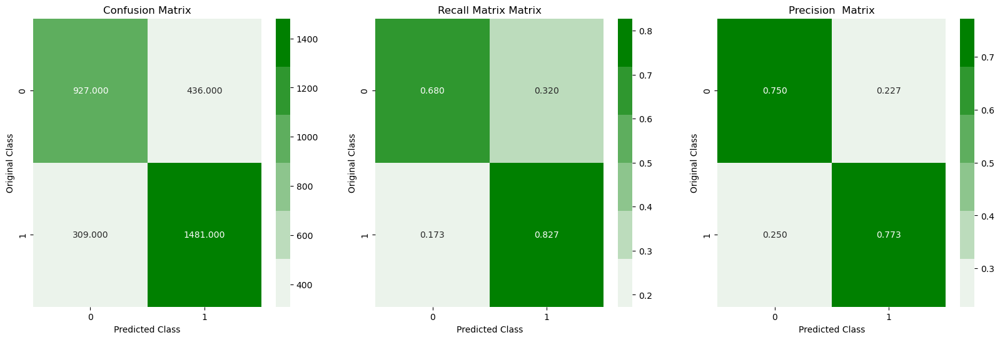

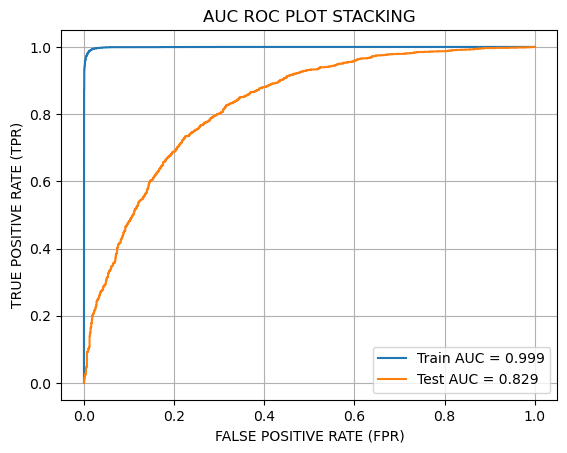

5it [10:08, 121.72s/it]

Train Auc Score--->  0.999
Test Auc Scoer --->  0.829
Train f1score is 0.9887 , precison is 0.9827 and recall is 0.9948 and log_loss is 0.4456
Test f1score is 0.799 , precison is 0.7726 and recall is 0.8274 and loh loss is 8.161




In [85]:
algorithm = 'STACKING'
stack_train_f1score,stack_train_precison,stack_train_recall,stack_train_log_loss,stack_test_f1score,stack_test_precison,\
    stack_test_recall,stack_test_log_loss ,stack_train_auc,stack_test_auc = stacking(set_dict,y_train,y_test,'STACKING')

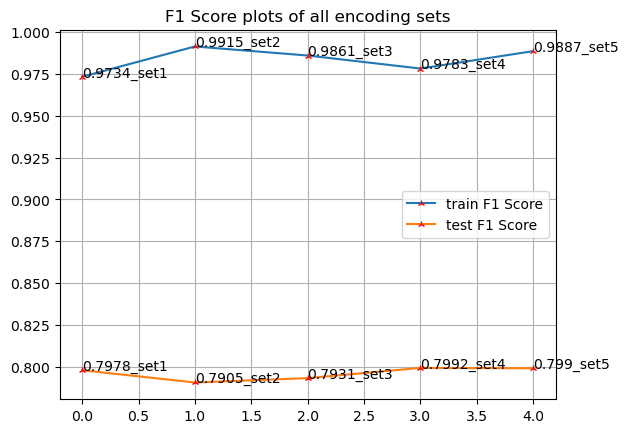

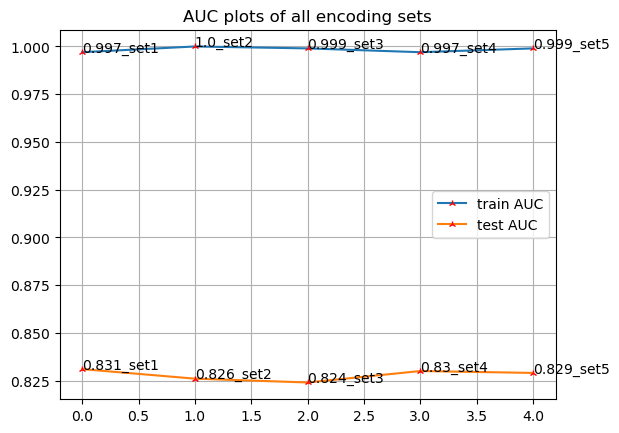

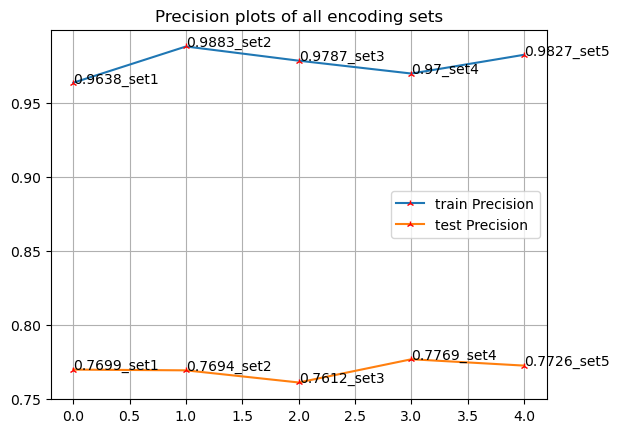

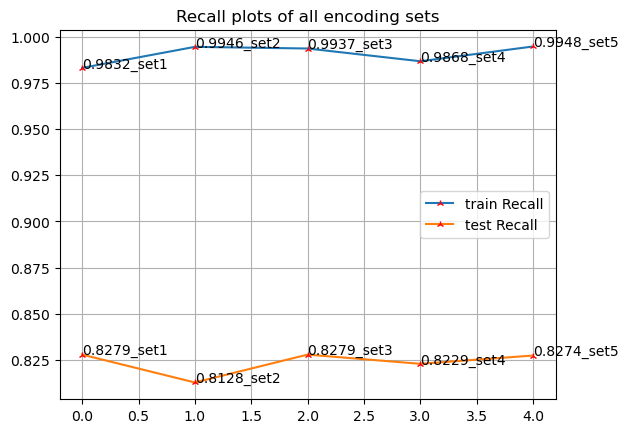

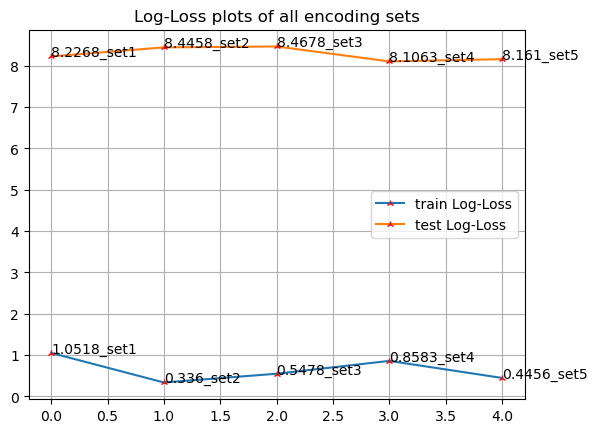

In [86]:
plots(stack_train_f1score,stack_test_f1score,'F1 Score')
plots(stack_train_auc,stack_test_auc,'AUC')
plots(stack_train_precison,stack_test_precison,'Precision')
plots(stack_train_recall,stack_test_recall,'Recall')
plots(stack_train_log_loss,stack_test_log_loss,'Log-Loss')

Performing almost same on the train data for every set. Narrowly performs better on test data for set 4

## 3.12 *CATBOOST*

In [77]:
cat_clf = CatBoostClassifier(random_state=55,eval_metric='F1',custom_metric='F1',one_hot_max_size=4)
features = x_train.columns.values

cat_clf.fit(x_train,y_train,cat_features=features)

train_pred = cat_clf.predict(x_train)
test_pred = cat_clf.predict(x_test)

Learning rate set to 0.026889
0:	learn: 0.7206853	total: 290ms	remaining: 4m 49s
1:	learn: 0.7128440	total: 352ms	remaining: 2m 55s
2:	learn: 0.7192538	total: 440ms	remaining: 2m 26s
3:	learn: 0.7276826	total: 498ms	remaining: 2m 4s
4:	learn: 0.7379496	total: 559ms	remaining: 1m 51s
5:	learn: 0.7384058	total: 623ms	remaining: 1m 43s
6:	learn: 0.7376509	total: 678ms	remaining: 1m 36s
7:	learn: 0.7358061	total: 741ms	remaining: 1m 31s
8:	learn: 0.7404594	total: 805ms	remaining: 1m 28s
9:	learn: 0.7433074	total: 875ms	remaining: 1m 26s
10:	learn: 0.7460543	total: 932ms	remaining: 1m 23s
11:	learn: 0.7438665	total: 991ms	remaining: 1m 21s
12:	learn: 0.7414869	total: 1.05s	remaining: 1m 19s
13:	learn: 0.7425289	total: 1.12s	remaining: 1m 19s
14:	learn: 0.7437809	total: 1.18s	remaining: 1m 17s
15:	learn: 0.7468663	total: 1.23s	remaining: 1m 15s
16:	learn: 0.7485591	total: 1.29s	remaining: 1m 14s
17:	learn: 0.7477006	total: 1.36s	remaining: 1m 14s
18:	learn: 0.7484949	total: 1.43s	remaining: 

160:	learn: 0.7861597	total: 8.88s	remaining: 46.3s
161:	learn: 0.7870752	total: 8.94s	remaining: 46.2s
162:	learn: 0.7872135	total: 9s	remaining: 46.2s
163:	learn: 0.7870752	total: 9.06s	remaining: 46.2s
164:	learn: 0.7870061	total: 9.12s	remaining: 46.1s
165:	learn: 0.7875702	total: 9.19s	remaining: 46.2s
166:	learn: 0.7879586	total: 9.24s	remaining: 46.1s
167:	learn: 0.7881609	total: 9.3s	remaining: 46.1s
168:	learn: 0.7880969	total: 9.36s	remaining: 46s
169:	learn: 0.7883788	total: 9.41s	remaining: 46s
170:	learn: 0.7881661	total: 9.46s	remaining: 45.9s
171:	learn: 0.7884801	total: 9.51s	remaining: 45.8s
172:	learn: 0.7884430	total: 9.56s	remaining: 45.7s
173:	learn: 0.7881237	total: 9.61s	remaining: 45.6s
174:	learn: 0.7879480	total: 9.65s	remaining: 45.5s
175:	learn: 0.7883788	total: 9.7s	remaining: 45.4s
176:	learn: 0.7885915	total: 9.76s	remaining: 45.4s
177:	learn: 0.7886336	total: 9.82s	remaining: 45.3s
178:	learn: 0.7888411	total: 9.87s	remaining: 45.3s
179:	learn: 0.7890858

319:	learn: 0.8013789	total: 16.9s	remaining: 35.9s
320:	learn: 0.8013789	total: 17s	remaining: 35.9s
321:	learn: 0.8016609	total: 17s	remaining: 35.8s
322:	learn: 0.8021192	total: 17.1s	remaining: 35.8s
323:	learn: 0.8021201	total: 17.1s	remaining: 35.7s
324:	learn: 0.8020852	total: 17.2s	remaining: 35.7s
325:	learn: 0.8022609	total: 17.2s	remaining: 35.6s
326:	learn: 0.8019435	total: 17.3s	remaining: 35.6s
327:	learn: 0.8025433	total: 17.3s	remaining: 35.5s
328:	learn: 0.8023317	total: 17.4s	remaining: 35.5s
329:	learn: 0.8023667	total: 17.4s	remaining: 35.4s
330:	learn: 0.8020843	total: 17.5s	remaining: 35.4s
331:	learn: 0.8024375	total: 17.6s	remaining: 35.3s
332:	learn: 0.8028617	total: 17.6s	remaining: 35.3s
333:	learn: 0.8028617	total: 17.7s	remaining: 35.2s
334:	learn: 0.8028965	total: 17.7s	remaining: 35.2s
335:	learn: 0.8033916	total: 17.8s	remaining: 35.1s
336:	learn: 0.8033916	total: 17.8s	remaining: 35s
337:	learn: 0.8035683	total: 17.9s	remaining: 35s
338:	learn: 0.803427

480:	learn: 0.8173775	total: 24.8s	remaining: 26.7s
481:	learn: 0.8176913	total: 24.8s	remaining: 26.7s
482:	learn: 0.8178761	total: 24.9s	remaining: 26.6s
483:	learn: 0.8182220	total: 24.9s	remaining: 26.5s
484:	learn: 0.8183668	total: 24.9s	remaining: 26.5s
485:	learn: 0.8182220	total: 25s	remaining: 26.4s
486:	learn: 0.8183989	total: 25.1s	remaining: 26.4s
487:	learn: 0.8185437	total: 25.1s	remaining: 26.3s
488:	learn: 0.8185116	total: 25.1s	remaining: 26.3s
489:	learn: 0.8187931	total: 25.2s	remaining: 26.2s
490:	learn: 0.8184474	total: 25.3s	remaining: 26.2s
491:	learn: 0.8183749	total: 25.3s	remaining: 26.1s
492:	learn: 0.8182703	total: 25.4s	remaining: 26.1s
493:	learn: 0.8183749	total: 25.4s	remaining: 26s
494:	learn: 0.8186244	total: 25.4s	remaining: 26s
495:	learn: 0.8186648	total: 25.5s	remaining: 25.9s
496:	learn: 0.8186969	total: 25.6s	remaining: 25.9s
497:	learn: 0.8186969	total: 25.6s	remaining: 25.8s
498:	learn: 0.8186648	total: 25.7s	remaining: 25.8s
499:	learn: 0.8190

641:	learn: 0.8294677	total: 32.7s	remaining: 18.2s
642:	learn: 0.8294980	total: 32.8s	remaining: 18.2s
643:	learn: 0.8297494	total: 32.8s	remaining: 18.1s
644:	learn: 0.8297494	total: 32.9s	remaining: 18.1s
645:	learn: 0.8297797	total: 32.9s	remaining: 18s
646:	learn: 0.8298099	total: 33s	remaining: 18s
647:	learn: 0.8298099	total: 33s	remaining: 17.9s
648:	learn: 0.8301652	total: 33.1s	remaining: 17.9s
649:	learn: 0.8302993	total: 33.1s	remaining: 17.8s
650:	learn: 0.8302993	total: 33.2s	remaining: 17.8s
651:	learn: 0.8302691	total: 33.2s	remaining: 17.7s
652:	learn: 0.8300915	total: 33.3s	remaining: 17.7s
653:	learn: 0.8300178	total: 33.4s	remaining: 17.6s
654:	learn: 0.8301217	total: 33.4s	remaining: 17.6s
655:	learn: 0.8302121	total: 33.5s	remaining: 17.5s
656:	learn: 0.8303595	total: 33.5s	remaining: 17.5s
657:	learn: 0.8304332	total: 33.6s	remaining: 17.4s
658:	learn: 0.8303896	total: 33.6s	remaining: 17.4s
659:	learn: 0.8303294	total: 33.7s	remaining: 17.3s
660:	learn: 0.830017

800:	learn: 0.8379243	total: 40.4s	remaining: 10s
801:	learn: 0.8381308	total: 40.5s	remaining: 9.99s
802:	learn: 0.8380851	total: 40.5s	remaining: 9.94s
803:	learn: 0.8381138	total: 40.6s	remaining: 9.89s
804:	learn: 0.8382170	total: 40.6s	remaining: 9.84s
805:	learn: 0.8383489	total: 40.7s	remaining: 9.79s
806:	learn: 0.8386180	total: 40.7s	remaining: 9.74s
807:	learn: 0.8385435	total: 40.8s	remaining: 9.69s
808:	learn: 0.8385435	total: 40.8s	remaining: 9.63s
809:	learn: 0.8386180	total: 40.9s	remaining: 9.58s
810:	learn: 0.8386180	total: 40.9s	remaining: 9.54s
811:	learn: 0.8386180	total: 41s	remaining: 9.49s
812:	learn: 0.8390192	total: 41s	remaining: 9.44s
813:	learn: 0.8390478	total: 41.1s	remaining: 9.39s
814:	learn: 0.8393746	total: 41.1s	remaining: 9.34s
815:	learn: 0.8393460	total: 41.2s	remaining: 9.29s
816:	learn: 0.8393460	total: 41.3s	remaining: 9.24s
817:	learn: 0.8393460	total: 41.3s	remaining: 9.2s
818:	learn: 0.8395522	total: 41.4s	remaining: 9.14s
819:	learn: 0.83955

962:	learn: 0.8472679	total: 49.8s	remaining: 1.92s
963:	learn: 0.8473974	total: 49.9s	remaining: 1.86s
964:	learn: 0.8472198	total: 50s	remaining: 1.81s
965:	learn: 0.8472950	total: 50s	remaining: 1.76s
966:	learn: 0.8474727	total: 50.1s	remaining: 1.71s
967:	learn: 0.8476021	total: 50.2s	remaining: 1.66s
968:	learn: 0.8474245	total: 50.3s	remaining: 1.61s
969:	learn: 0.8477527	total: 50.3s	remaining: 1.56s
970:	learn: 0.8476504	total: 50.4s	remaining: 1.5s
971:	learn: 0.8474727	total: 50.5s	remaining: 1.45s
972:	learn: 0.8474185	total: 50.5s	remaining: 1.4s
973:	learn: 0.8477739	total: 50.6s	remaining: 1.35s
974:	learn: 0.8475480	total: 50.7s	remaining: 1.3s
975:	learn: 0.8474456	total: 50.7s	remaining: 1.25s
976:	learn: 0.8475480	total: 50.8s	remaining: 1.2s
977:	learn: 0.8477257	total: 50.9s	remaining: 1.14s
978:	learn: 0.8478763	total: 50.9s	remaining: 1.09s
979:	learn: 0.8478010	total: 51s	remaining: 1.04s
980:	learn: 0.8479787	total: 51.1s	remaining: 989ms
981:	learn: 0.8479787	



--- Train CM of  catboost ---


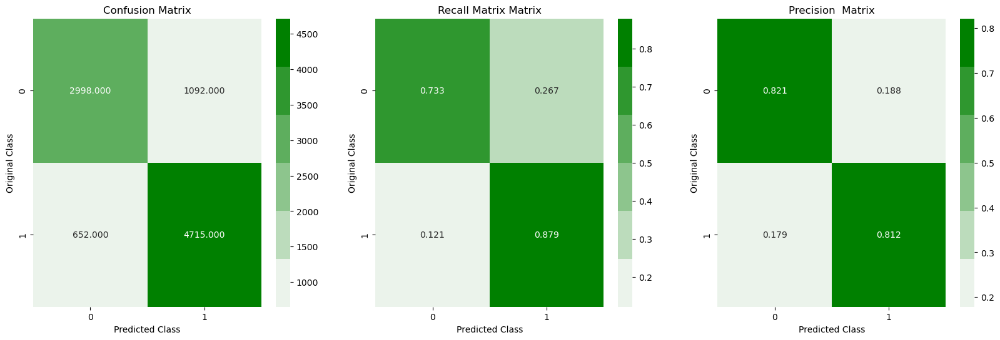



--- Test CM of catboost ---


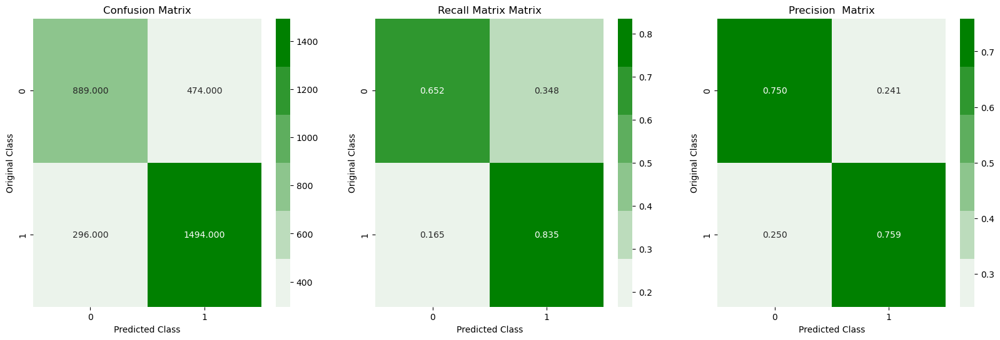

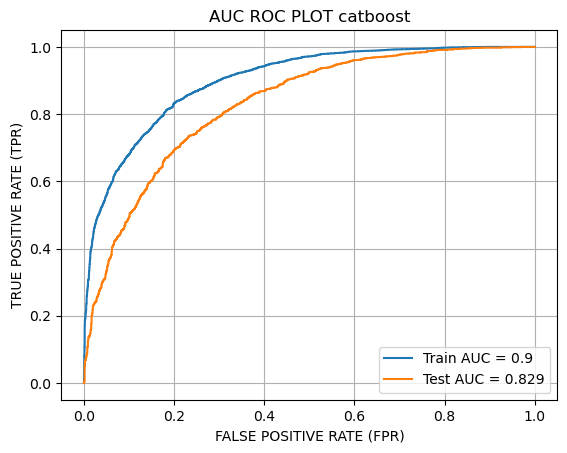

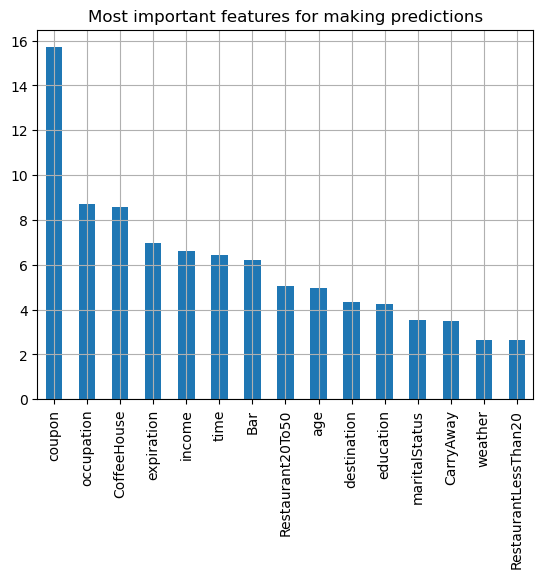

Train Auc Score--->  0.9
Test Auc Scoer --->  0.829
Train f1score is 0.8439 , precison is 0.812 and recall is 0.8785 and log_loss is 6.3695
Test f1score is 0.7951 , precison is 0.7591 and recall is 0.8346 and loh loss is 8.4349


In [78]:
cat_train_f1score,cat_train_precison,cat_train_recall,cat_train_log_loss,cat_test_f1score,cat_test_precison,cat_test_recall,\
cat_test_log_loss,cat_train_auc,test_auc =\
                        plots_metrices_featureimportance(cat_clf,x_train,x_test,y_train,\
                    y_test,train_pred,test_pred,title = 'catboost',important_features=True,top_features = 15)

In [118]:
print('Train f1 score is ',cat_train_f1score,'\nTrain precison score is ',cat_train_precison,'\nTrain recall score is ',\
      cat_train_recall,'\nTrain logloss score is ',cat_train_log_loss,'\nTrain auc score is ',cat_train_auc,'\nTest f1 score is ',\
      cat_test_f1score,'\nTest precision score is ',cat_test_precison,'\nTest recall score is ',\
      cat_test_recall,'\nTest logloss score is ',cat_test_log_loss,'\nTest auc score is ',cat_test_auc )

Train f1 score is  0.8439 
Train precison score is  0.812 
Train recall score is  0.8785 
Train logloss score is  6.3695 
Train auc score is  0.9 
Test f1 score is  0.7951 
Test precision score is  0.7591 
Test recall score is  0.8346 
Test logloss score is  8.4349 
Test auc score is  0.829


In [132]:
cat_metrics_dict = {'Metric': ['F1 Score','AUC', 'Precision', 'Recall', 'Log Loss'],
         'Train': [ 0.8439 , 0.90, 0.812, 0.8785,6.3695],
         'Test': [0.7951, 0.829, 0.7591, 8346,8.4349]}
cat_metrics_dict

{'Metric': ['F1 Score', 'AUC', 'Precision', 'Recall', 'Log Loss'],
 'Train': [0.8439, 0.9, 0.812, 0.8785, 6.3695],
 'Test': [0.7951, 0.829, 0.7591, 8346, 8.4349]}

#### 3.12.1 TUNING CATBOOST

In [80]:
#Hyperparameter tuning using RandomSearchCV
cat_parameters = {'n_estimators':[100,150,275,400,500,600,800,1000],
    'min_child_samples':[5,10,20,30,50,60],
    'learning_rate': [0.02,0.03, 0.08,0.1,0.4,0.7,1],
    'depth': [1,2,3,4,6,8,10],
    'subsample':[0.1,0.3,0.5,0.7,0.9],
    'l2_leaf_reg': [1, 3, 5, 7, 9],
    'colsample_bylevel':[0.1,0.3,0.5,0.7,0.9],
    'early_stopping_rounds':[2,5,7,10]}

rs_cat_clf = RandomizedSearchCV(estimator = cat_clf, param_distributions = cat_parameters, n_iter = 100, cv = 3, \
                                       verbose=1,random_state=55, n_jobs = -1,return_train_score=True,scoring='f1')

rs_cat_clf.fit(x_train,y_train,cat_features=features)

Fitting 3 folds for each of 100 candidates, totalling 300 fits
0:	learn: 0.7414230	total: 43.8ms	remaining: 17.5s
1:	learn: 0.7381937	total: 68.6ms	remaining: 13.7s
2:	learn: 0.7511232	total: 121ms	remaining: 16.1s
3:	learn: 0.7663239	total: 194ms	remaining: 19.2s
4:	learn: 0.7628087	total: 216ms	remaining: 17s
5:	learn: 0.7659499	total: 272ms	remaining: 17.9s
6:	learn: 0.7684285	total: 341ms	remaining: 19.2s
7:	learn: 0.7722158	total: 409ms	remaining: 20s
8:	learn: 0.7751061	total: 478ms	remaining: 20.8s
9:	learn: 0.7778170	total: 559ms	remaining: 21.8s
10:	learn: 0.7816032	total: 636ms	remaining: 22.5s
11:	learn: 0.7842382	total: 706ms	remaining: 22.8s
12:	learn: 0.7889989	total: 782ms	remaining: 23.3s
13:	learn: 0.7934535	total: 861ms	remaining: 23.7s
14:	learn: 0.7975203	total: 938ms	remaining: 24.1s
15:	learn: 0.7999298	total: 1.01s	remaining: 24.2s
16:	learn: 0.8010508	total: 1.04s	remaining: 23.5s
17:	learn: 0.8025958	total: 1.12s	remaining: 23.8s
18:	learn: 0.8058073	total: 1.2

161:	learn: 0.9307038	total: 11.4s	remaining: 16.7s
162:	learn: 0.9308973	total: 11.5s	remaining: 16.7s
163:	learn: 0.9319087	total: 11.5s	remaining: 16.6s
164:	learn: 0.9318490	total: 11.6s	remaining: 16.5s
165:	learn: 0.9328385	total: 11.7s	remaining: 16.4s
166:	learn: 0.9341296	total: 11.7s	remaining: 16.4s
167:	learn: 0.9355539	total: 11.8s	remaining: 16.3s
168:	learn: 0.9365712	total: 11.9s	remaining: 16.2s
169:	learn: 0.9372734	total: 11.9s	remaining: 16.2s
170:	learn: 0.9374547	total: 12s	remaining: 16.1s
171:	learn: 0.9379023	total: 12.1s	remaining: 16s
172:	learn: 0.9398312	total: 12.1s	remaining: 15.9s
173:	learn: 0.9396497	total: 12.2s	remaining: 15.8s
174:	learn: 0.9400127	total: 12.3s	remaining: 15.8s
175:	learn: 0.9414329	total: 12.3s	remaining: 15.7s
176:	learn: 0.9416039	total: 12.4s	remaining: 15.6s
177:	learn: 0.9423951	total: 12.5s	remaining: 15.5s
178:	learn: 0.9435608	total: 12.5s	remaining: 15.5s
179:	learn: 0.9443940	total: 12.6s	remaining: 15.4s
180:	learn: 0.94

321:	learn: 0.9881481	total: 22s	remaining: 5.34s
322:	learn: 0.9885206	total: 22.1s	remaining: 5.27s
323:	learn: 0.9891657	total: 22.2s	remaining: 5.2s
324:	learn: 0.9892553	total: 22.2s	remaining: 5.13s
325:	learn: 0.9892573	total: 22.3s	remaining: 5.06s
326:	learn: 0.9895341	total: 22.3s	remaining: 4.98s
327:	learn: 0.9896277	total: 22.4s	remaining: 4.91s
328:	learn: 0.9898110	total: 22.4s	remaining: 4.84s
329:	learn: 0.9898092	total: 22.5s	remaining: 4.77s
330:	learn: 0.9899046	total: 22.5s	remaining: 4.7s
331:	learn: 0.9903650	total: 22.6s	remaining: 4.63s
332:	learn: 0.9902679	total: 22.7s	remaining: 4.56s
333:	learn: 0.9906403	total: 22.7s	remaining: 4.49s
334:	learn: 0.9910094	total: 22.8s	remaining: 4.42s
335:	learn: 0.9911931	total: 22.8s	remaining: 4.35s
336:	learn: 0.9911931	total: 22.9s	remaining: 4.28s
337:	learn: 0.9913801	total: 22.9s	remaining: 4.21s
338:	learn: 0.9914736	total: 23s	remaining: 4.14s
339:	learn: 0.9914736	total: 23.1s	remaining: 4.07s
340:	learn: 0.9913

RandomizedSearchCV(cv=3,
                   estimator=<catboost.core.CatBoostClassifier object at 0x0000019BFA688BB0>,
                   n_iter=100, n_jobs=-1,
                   param_distributions={'colsample_bylevel': [0.1, 0.3, 0.5,
                                                              0.7, 0.9],
                                        'depth': [1, 2, 3, 4, 6, 8, 10],
                                        'early_stopping_rounds': [2, 5, 7, 10],
                                        'l2_leaf_reg': [1, 3, 5, 7, 9],
                                        'learning_rate': [0.02, 0.03, 0.08, 0.1,
                                                          0.4, 0.7, 1],
                                        'min_child_samples': [5, 10, 20, 30, 50,
                                                              60],
                                        'n_estimators': [100, 150, 275, 400,
                                                         500, 600, 800, 1000],
       

In [81]:
print('Best parameters are ',rs_cat_clf.best_params_)
print('Best Score is ',rs_cat_clf.best_score_)

Best parameters are  {'subsample': 0.9, 'n_estimators': 400, 'min_child_samples': 30, 'learning_rate': 0.1, 'l2_leaf_reg': 9, 'early_stopping_rounds': 5, 'depth': 10, 'colsample_bylevel': 0.3}
Best estimators are  <catboost.core.CatBoostClassifier object at 0x0000019BF9374820>
Best Score is  0.7921480702511831


In [104]:
#Training using best parameters
cat_best_params = rs_cat_clf.best_params_
hyp_cat_clf = CatBoostClassifier(random_state=55,eval_metric='F1',custom_metric='F1',**cat_best_params)
features = x_train.columns.values

hyp_cat_clf.fit(x_train,y_train,cat_features=features)

train_pred = hyp_cat_clf.predict(x_train)
test_pred = hyp_cat_clf.predict(x_test)

0:	learn: 0.7196668	total: 101ms	remaining: 40.2s
1:	learn: 0.7450009	total: 165ms	remaining: 32.9s
2:	learn: 0.7595185	total: 228ms	remaining: 30.2s
3:	learn: 0.7591866	total: 289ms	remaining: 28.6s
4:	learn: 0.7647846	total: 348ms	remaining: 27.5s
5:	learn: 0.7629291	total: 404ms	remaining: 26.5s
6:	learn: 0.7593958	total: 434ms	remaining: 24.3s
7:	learn: 0.7649324	total: 488ms	remaining: 23.9s
8:	learn: 0.7728006	total: 547ms	remaining: 23.8s
9:	learn: 0.7734431	total: 613ms	remaining: 23.9s
10:	learn: 0.7757176	total: 676ms	remaining: 23.9s
11:	learn: 0.7773042	total: 735ms	remaining: 23.8s
12:	learn: 0.7767248	total: 803ms	remaining: 23.9s
13:	learn: 0.7834069	total: 870ms	remaining: 24s
14:	learn: 0.7873766	total: 933ms	remaining: 23.9s
15:	learn: 0.7903084	total: 998ms	remaining: 23.9s
16:	learn: 0.7940477	total: 1.06s	remaining: 23.9s
17:	learn: 0.7942676	total: 1.07s	remaining: 22.7s
18:	learn: 0.7983105	total: 1.13s	remaining: 22.7s
19:	learn: 0.7986270	total: 1.19s	remaining

162:	learn: 0.9205633	total: 14.8s	remaining: 21.5s
163:	learn: 0.9218962	total: 14.9s	remaining: 21.5s
164:	learn: 0.9226185	total: 15s	remaining: 21.3s
165:	learn: 0.9226879	total: 15.1s	remaining: 21.2s
166:	learn: 0.9229519	total: 15.1s	remaining: 21.1s
167:	learn: 0.9231325	total: 15.2s	remaining: 21s
168:	learn: 0.9242027	total: 15.3s	remaining: 20.9s
169:	learn: 0.9252598	total: 15.4s	remaining: 20.8s
170:	learn: 0.9265384	total: 15.4s	remaining: 20.7s
171:	learn: 0.9267631	total: 15.5s	remaining: 20.5s
172:	learn: 0.9265823	total: 15.6s	remaining: 20.4s
173:	learn: 0.9279638	total: 15.7s	remaining: 20.4s
174:	learn: 0.9289142	total: 15.8s	remaining: 20.3s
175:	learn: 0.9300344	total: 15.9s	remaining: 20.2s
176:	learn: 0.9306500	total: 16s	remaining: 20.1s
177:	learn: 0.9314348	total: 16.1s	remaining: 20s
178:	learn: 0.9321603	total: 16.2s	remaining: 19.9s
179:	learn: 0.9337082	total: 16.3s	remaining: 19.9s
180:	learn: 0.9344456	total: 16.4s	remaining: 19.8s
181:	learn: 0.935305

323:	learn: 0.9824012	total: 28.4s	remaining: 6.66s
324:	learn: 0.9829540	total: 28.5s	remaining: 6.58s
325:	learn: 0.9829509	total: 28.6s	remaining: 6.49s
326:	learn: 0.9830477	total: 28.7s	remaining: 6.4s
327:	learn: 0.9831352	total: 28.7s	remaining: 6.31s
328:	learn: 0.9832258	total: 28.8s	remaining: 6.22s
329:	learn: 0.9833164	total: 28.9s	remaining: 6.14s
330:	learn: 0.9834132	total: 29s	remaining: 6.05s
331:	learn: 0.9835038	total: 29.1s	remaining: 5.97s
332:	learn: 0.9839602	total: 29.2s	remaining: 5.88s
333:	learn: 0.9846892	total: 29.3s	remaining: 5.79s
334:	learn: 0.9844168	total: 29.4s	remaining: 5.7s
335:	learn: 0.9845076	total: 29.4s	remaining: 5.61s
336:	learn: 0.9851462	total: 29.5s	remaining: 5.52s
337:	learn: 0.9854217	total: 29.6s	remaining: 5.43s
338:	learn: 0.9861496	total: 29.7s	remaining: 5.34s
339:	learn: 0.9860585	total: 29.8s	remaining: 5.25s
340:	learn: 0.9860585	total: 29.9s	remaining: 5.16s
341:	learn: 0.9862432	total: 29.9s	remaining: 5.08s
342:	learn: 0.98



--- Train CM of  catboost ---


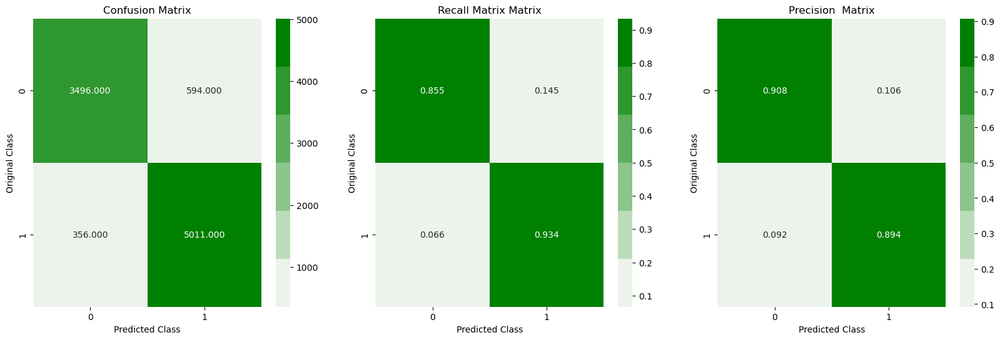



--- Test CM of catboost ---


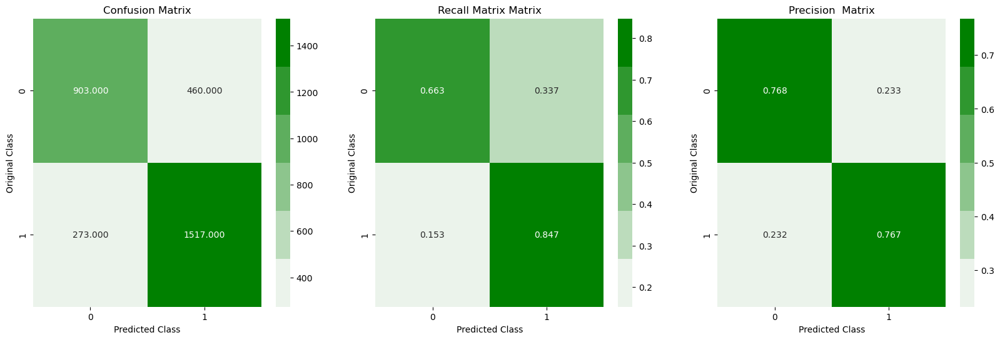

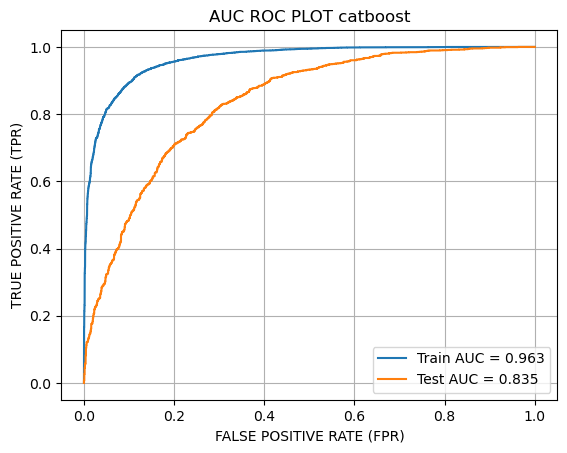

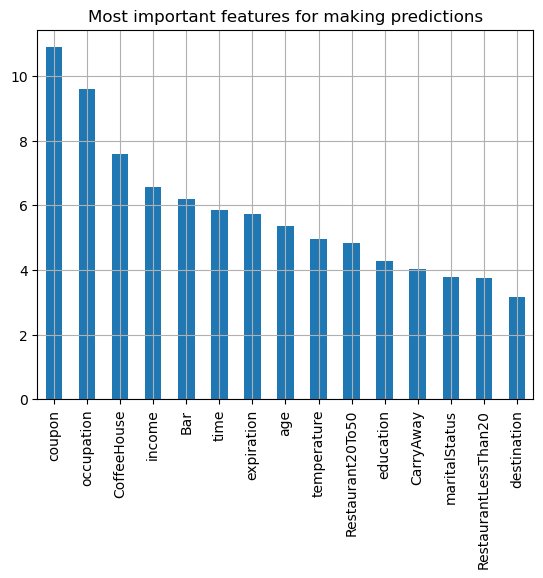

Train Auc Score--->  0.963
Test Auc Scoer --->  0.835
Train f1score is 0.9134 , precison is 0.894 and recall is 0.9337 and log_loss is 3.4696
Test f1score is 0.8054 , precison is 0.7673 and recall is 0.8475 and loh loss is 8.0296


In [105]:
hyp_train_f1score,hyp_train_precison,hyp_train_recall,hyp_train_log_loss,hyp_test_f1score,hyp_test_precison,hyp_test_recall,\
hyp_test_log_loss,hyp_train_auc,hyp_test_auc =\
                        plots_metrices_featureimportance(hyp_cat_clf,x_train,x_test,y_train,\
                    y_test,train_pred,test_pred,title = 'catboost',important_features=True,top_features = 15)

In [115]:
print('Train f1 score is ',hyp_train_f1score,'\nTrain precison score is ',hyp_train_precison,'\nTrain recall score is ',\
      hyp_train_recall,'\nTrain logloss score is ',hyp_train_log_loss,'\nTrain auc score is ',hyp_train_auc,'\nTest f1 score is ',\
      hyp_test_f1score,'\nTest precision score is ',hyp_test_precison,'\nTest recall score is ',\
      hyp_test_recall,'\nTest logloss score is ',hyp_test_log_loss,'\nTest auc score is ',hyp_test_auc )

Train f1 score is  0.9134 
Train precison score is  0.894 
Train recall score is  0.9337 
Train logloss score is  3.4696 
Train auc score is  0.963 
Test f1 score is  0.8054 
Test precision score is  0.7673 
Test recall score is  0.8475 
Test logloss score is  8.0296 
Test auc score is  0.835


In [133]:
hyp_cat_metrics_dict = {'Metric': ['F1 Score','AUC', 'Precision', 'Recall', 'Log Loss'],
         'Train': [ 0.9134 , 0.963, 0.894, 0.9337,3.4696],
         'Test': [0.8054, 0.835, 0.7673, 0.8475,8.0296]}

#    ----------------------------------- SUMMARIZING  -----------------------------------

In [3]:
table = PrettyTable(['Alogorithm','Best Set','Train F1','Test F1','Train AUC','Test AUC'])
table.add_row(['Logestic Regression ','Set-2',0.7419  ,  0.7371 ,0.738  ,  0.727])
table.add_row(['KNN','Set-4',0.7364,0.7346,0.738,0.728])
table.add_row(['SVM-Linear Kernel','Set-2',0.7409,0.7380,0.744,0.731])
table.add_row(['SVM-RBF Kernel','Set-4',.8158,0.7669,0.864,0.785])
table.add_row(['Naive Bayes','Set-4',0.7199,0.7176,0.526,0.514])  
table.add_row(['Decision Tree','Set-5',0.7909,0.7372,0.839,0.755])  
table.add_row(['Random Forest','Set-5',0.9812,0.7907,0.999,0.815])
table.add_row(['GBDT','Set-1',0.9990,0.8043,1.000,0.837])     
table.add_row(['LightGBM','Set-1',0.9055,0.8037,0.967,0.834]) 
table.add_row(['XGBoost','Set-4',0.9635,0.7967,0.994,0.817])
          
table.add_row(['ADABoost','Set-5',0.9991,0.7786,1.0,0.804])
table.add_row(['STACKING','Set-5',0.9887,0.799,0.999,0.829 ])
table.add_row(['Catboost','Orginal Train dataframe', 0.9134 ,0.8054 , 0.963,0.835])
table

Alogorithm,Best Set,Train F1,Test F1,Train AUC,Test AUC
Logestic Regression,Set-2,0.7419,0.7371,0.738,0.727
KNN,Set-4,0.7364,0.7346,0.738,0.728
SVM-Linear Kernel,Set-2,0.7409,0.738,0.744,0.731
SVM-RBF Kernel,Set-4,0.8158,0.7669,0.864,0.785
Naive Bayes,Set-4,0.7199,0.7176,0.526,0.514
Decision Tree,Set-5,0.7909,0.7372,0.839,0.755
Random Forest,Set-5,0.9812,0.7907,0.999,0.815
GBDT,Set-1,0.999,0.8043,1.0,0.837
LightGBM,Set-1,0.9055,0.8037,0.967,0.834
XGBoost,Set-4,0.9635,0.7967,0.994,0.817


# Top Performing Algorithms
    - Catboost on both train and test 
    - LightGBM is also performing good

1. **Alogrithms which have overfitted** -  Random Forest,GBDT	,Xgboost,Stacking .Most of the advanced powerfull alogrithms have overfitted reqason might be the less amount of data 
1. **Best performing set** - There is no clear best set . Bagging and boosting alorithms perform best on set1 and set4. But the performance difference between the sets was not very drastic 